<a href="https://colab.research.google.com/github/dsteiner93/rubiks-ml/blob/main/rubiks_ml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Solving a Rubik's Cube with Machine Learning


## Background
In this notebook, we will use a variety of machine learning techniques to solve a 2x2x2 Rubik's cube. The 2x2x2 cube was chosen over the 3x3x3 cube in order to reduce the amount of compute power and training time needed to solve the problem. Rubik's cubes have a variety of properties that make them interesting to experiment with for this project:

*   The state and action spaces are large enough to be interesting but small enough to be computationally tractable
*   Random behavior will not make much progress in solving the cube but there are many algorithms/strategies that can solve the cube in a relatively small number of steps
*   While it is not necessary to solve the problem, a Rubik's cube can be thought of as a huge graph, where the nodes are unique permutations of the cube and edges are specific rotations that lead to another unique permutation of the cube. This makes it an easy to interpret environment for seeing if graph neural networks can be a useful inductive bias for the network architecture
*   The same cube can appear in multiple orientations that are actually equivalent (i.e. different perspectives of looking at the same cube). This is particularly interesting for exploring graph network based approaches, as a selling point of faithfully modeling graph structures is better handling permutation invariance

Here is some additional information about the structure of the game itself:

https://artofproblemsolving.com/wiki/index.php/Rubiks_cube

"The 2x2x2 Rubik’s cube (called the Pocket Cube) has 3674160 combinations. This is a manageable number. If you fiddle with the 2x2x2 cube randomly, eight hours a day continuously, you’ll solve it by pure chance roughly two or three times per year. Assuming your cube – or your wrist – doesn’t break in the meantime. Mind you, four months to solve the 2×2 cube is somewhat slower than the world record. The original 3x3x3 Rubik’s cube has 43 252 003 274 489 856 000 combinations, or 43 quintillion. Again, as pointed out on this website’s main page, this is a manageably imaginable number. It’s a little less than the square of the earth’s population, for example."

https://en.wikipedia.org/wiki/Pocket_Cube#Permutations

"The number a of positions that require n any (half or quarter) turns and number q of positions that require n quarter turns only are:"

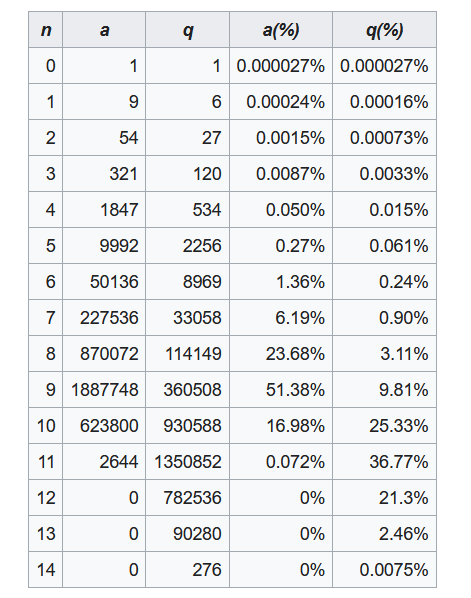

This table is useful because it gives us an indication of the difficulty level of the problem. The table shows that an optimal policy should be able to solve the cube within 14 moves. Random moves, however, are unlikely to solve the cube within even 1,000 steps.

## Key Objectives

*   Implement a custom reinforcement learning environment for a 2x2x2 Rubik's cube using OpenAI/Farama gym
*   Use [Stable Baselines 3](https://github.com/DLR-RM/stable-baselines3) as a benchmark for standard RL algorithms, such as DQN, A2C, and PPO
*   Implement three known RL algorithms (DQN, A2C, and PPO) by hand and apply them to the environment. Compare the performance of the custom implementations with the off-the-shelf benchmarks
*   Use the inductive bias that solving a Rubik's cube can be framed as a graph problem by implementing two graph neural network based cube solvers

The algorithms will primarily be evaluated on average rewards (how well they solved the problem) and sample efficiency (how much data did they need to solve the problem). The main high-level metric used to judge each agent is a test done using 1,000 randomly shuffled cubes. Starting with 1,000 solved cubes, we divide them into 10 equal groups of size 100 and shuffle the groups 1, 2, 3, 4, 5, 10, 20, 50, 100, or 1000 times. (I.e. one group will be randomly rotated just once, the next will be randomly rotated twice, etc.) The final score is an integer from 0 to 1,000 indicating how many of the random cubes the agent was able to solve.


## Define a Rubik's cube class

In this section, we define a generic class for operations on a 2x2x2 Rubik's cube. The cube is represented as 8 blocks. The main operations on the cube are to rotate any of its six faces clockwise or counterclockwise, check if the cube is solved, check the number of layers that are solved, shuffle the cube, get a canonical representation for the cube, and check if the cube equals another cube. We also include unit tests to make sure this core functionality is correct.

Note that in this section we are just defining the properties of the cube, and not yet the full reinforcement learning environment, which will come later.

In [ ]:
import typing
from typing import FrozenSet, Optional

import collections
import copy
import dataclasses
from enum import Enum
import random

# These should really be enums, but I found a lot of Python ops got significantly (around 2x)
# slower when using enums instead of simple strings here.
_FACES = ['front', 'back', 'left', 'right', 'top', 'bottom']
_FACES_SET = frozenset(_FACES)
_COLORS_SET = frozenset(['R', 'W', 'B', 'O', 'Y', 'G'])

@dataclasses.dataclass(frozen=True)
class Block:
  """
  Represents a subpiece of the cube.

  A 2x2x2 cube will have 8 blocks.
  A 3x3x3 will have 26.
  """
  front: Optional[str] = None
  back: Optional[str] = None
  left: Optional[str] = None
  right: Optional[str] = None
  top: Optional[str] = None
  bottom: Optional[str] = None

  def rotate_clockwise(self, face: str) -> 'Block':
    if face == 'front' or face == 'back':
      return Block(front=self.front, back=self.back, left=self.bottom, right=self.top, top=self.left, bottom=self.right)
    elif face == 'left':
      return Block(front=self.top, back=self.bottom, left=self.left, right=self.right, top=self.back, bottom=self.front)
    elif face == 'right':
      return Block(front=self.bottom, back=self.top, left=self.left, right=self.right, top=self.front, bottom=self.back)
    elif face == 'top':
      return Block(front=self.right, back=self.left, left=self.front, right=self.back, top=self.top, bottom=self.bottom)
    elif face == 'bottom':
      return Block(front=self.left, back=self.right, left=self.back, right=self.front, top=self.top, bottom=self.bottom)
    else:
      raise ValueError(f'Unknown face {face}')

  def rotate_counterclockwise(self, face: str) -> 'Block':
    if face == 'front' or face == 'back':
      return Block(front=self.front, back=self.back, left=self.top, right=self.bottom, top=self.right, bottom=self.left)
    elif face == 'left':
      return Block(front=self.bottom, back=self.top, left=self.left, right=self.right, top=self.front, bottom=self.back)
    elif face == 'right':
      return Block(front=self.top, back=self.bottom, left=self.left, right=self.right, top=self.back, bottom=self.front)
    elif face == 'top':
      return Block(front=self.left, back=self.right, left=self.back, right=self.front, top=self.top, bottom=self.bottom)
    elif face == 'bottom':
      return Block(front=self.right, back=self.left, left=self.front, right=self.back, top=self.top, bottom=self.bottom)
    else:
      raise ValueError(f'Unknown face {face}')

  def get_colors(self) -> set[Optional[str]]:
    return set([self.front, self.back, self.left, self.right, self.top, self.bottom]) - set([None])

  def __repr__(self) -> str:
    return f"front:{self.front},back:{self.back},left:{self.left},right:{self.right},top:{self.top},bottom:{self.bottom}"

  def __str__(self) -> str:
    return self.__repr__()

  def __eq__(self, other: 'Block') -> bool:
    return self.__repr__() == repr(other)

  def __hash__(self) -> int:
    return hash(self.__repr__())

class RubiksCube2:
  """Representation for a 2x2x2 Rubik's cube"""

  def __init__(self, blocks: list[Block] | None = None):
    # Represent the cube as an ordered list of 8 blocks.
    # The cube will have the color red on the top, white on the front, blue on
    # the bottom, orange on the left, yellow on the right, and green on the
    # back.
    #
    # Looking at the cube from the front we label the blocks
    #     0 1         4 5
    #     2 3         6 7
    # front face    back face
    # where 4 is the block behind 0, 5 is behind 1, etc.
    if blocks:
      self.blocks: list[Block] = blocks
    else:
      self.blocks: list[Block] = self._get_initial_canonical_solved_blocks()
    # self._validate_cube()

  def __repr__(self) -> str:
    str1 = f"""
  {self.blocks[4].top}{self.blocks[5].top}
  {self.blocks[0].top}{self.blocks[1].top}
{self.blocks[4].left}{self.blocks[0].left}{self.blocks[0].front}{self.blocks[1].front}{self.blocks[1].right}{self.blocks[5].right}{self.blocks[5].back}{self.blocks[4].back}
{self.blocks[6].left}{self.blocks[2].left}{self.blocks[2].front}{self.blocks[3].front}{self.blocks[3].right}{self.blocks[7].right}{self.blocks[7].back}{self.blocks[6].back}
  {self.blocks[2].bottom}{self.blocks[3].bottom}
  {self.blocks[6].bottom}{self.blocks[7].bottom}
    """
    return f'{str1}\n{self.blocks}'

  def __str__(self) -> str:
    return self.__repr__()

  def __hash__(self) -> int:
    faces = set()
    front = [self.blocks[0].front, self.blocks[1].front, self.blocks[2].front, self.blocks[3].front]
    back = [self.blocks[5].back, self.blocks[4].back, self.blocks[7].back, self.blocks[6].back]
    left = [self.blocks[4].left, self.blocks[0].left, self.blocks[6].left, self.blocks[2].left]
    right = [self.blocks[1].right, self.blocks[5].right, self.blocks[3].right, self.blocks[7].right]
    top = [self.blocks[4].top, self.blocks[5].top, self.blocks[0].top, self.blocks[1].top]
    bottom = [self.blocks[2].bottom, self.blocks[3].bottom, self.blocks[6].bottom, self.blocks[7].bottom]

    faces.add(self._get_color_to_count(front))
    faces.add(self._get_color_to_count(back))
    faces.add(self._get_color_to_count(left))
    faces.add(self._get_color_to_count(right))
    faces.add(self._get_color_to_count(top))
    faces.add(self._get_color_to_count(bottom))

    faces.add(self._get_color_to_count(front + back))
    faces.add(self._get_color_to_count(left + right))
    faces.add(self._get_color_to_count(top + bottom))

    return hash(frozenset(faces))

  def __eq__(self, other: 'RubiksCube2') -> bool:
    return self._check_equals_using_canonical_orientations(other)

  def _get_initial_canonical_solved_blocks(self) -> list[Block]:
    return [
        Block(front='W', top='R', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='W', bottom='B', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='G', top='R', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='G', bottom='B', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]

  def _get_color_to_count(self, colors: list[str]) -> FrozenSet[tuple[str, int]]:
    color_to_count = collections.defaultdict(int)
    for color in colors:
      color_to_count[color] += 1
    return frozenset((key, value) for key, value in color_to_count.items())

  def _check_equals_using_canonical_orientations(self, other: 'RubiksCube2'):
    return self._precise_blocks_equal(self.get_canonical_orientation().blocks, other.get_canonical_orientation().blocks)

  def _precise_blocks_equal(self, blocks1: list[Block], blocks2: list[Block]) -> bool:
    return blocks1 == blocks2

  def _assert_orientation(self, block: Block, faces: list[str]) -> None:
    # This is just to sanity check that the rotation operations did not leave
    # the cube in an invalid state due to a bug.
    for face in _FACES:
      if face in faces and getattr(block, face) == None:
        raise ValueError(f'Cube is in an invalid state. Expected all of {faces} to be non-none for block {block}. Full cube: {self}')
      elif face not in faces and getattr(block, face) != None:
        raise ValueError(f'Cube is in an invalid state. Expected {face} to be none for block {block}. Full cube: {self}')

  def _validate_cube(self) -> None:
    # This is just to sanity check that the rotation operations did not leave
    # the cube in an invalid state due to a bug.
    self._assert_orientation(self.blocks[0], ['front', 'top', 'left'])
    self._assert_orientation(self.blocks[1], ['front', 'top', 'right'])
    self._assert_orientation(self.blocks[2], ['front', 'bottom', 'left'])
    self._assert_orientation(self.blocks[3], ['front', 'bottom', 'right'])
    self._assert_orientation(self.blocks[4], ['back', 'top', 'left'])
    self._assert_orientation(self.blocks[5], ['back', 'top', 'right'])
    self._assert_orientation(self.blocks[6], ['back', 'bottom', 'left'])
    self._assert_orientation(self.blocks[7], ['back', 'bottom', 'right'])
    color_to_count = collections.defaultdict(int)
    for block in self.blocks:
      if block.front:
        color_to_count[block.front] += 1
      if block.back:
        color_to_count[block.back] += 1
      if block.left:
        color_to_count[block.left] += 1
      if block.right:
        color_to_count[block.right] += 1
      if block.top:
        color_to_count[block.top] += 1
      if block.bottom:
        color_to_count[block.bottom] += 1
    for color in _COLORS_SET:
      if color_to_count[color] != 4:
        raise ValueError(f'Incorrect color to count. The color {color} should appear 4 times. {color_to_count}')

  def _get_rotation(self, face: list[int], clockwise: bool) -> list[tuple[Block, int]]:
    if clockwise:
      return [
          (self.blocks[face[0]], face[1]),
          (self.blocks[face[1]], face[3]),
          (self.blocks[face[2]], face[0]),
          (self.blocks[face[3]], face[2]),
      ]
    else:
      return [
          (self.blocks[face[0]], face[2]),
          (self.blocks[face[1]], face[0]),
          (self.blocks[face[2]], face[3]),
          (self.blocks[face[3]], face[1]),
      ]

  def rotate(self, face: str, clockwise: bool) -> None:
    # For a 2x2x2 cube, we have the following options.
    # Each of the 6 faces can be turned clockwise or counterclockwise.
    # front;clockwise (from perspective of front of cube)
    # front;counterclockwise (from perspective of front of cube)
    # back;clockwise (from perspective of front of cube)
    # back;counterclockwise (from perspective of front of cube)
    # left;clockwise (from perspective of rotating the cube so that left is at front)
    # left;counterclockwise (from perspective of rotating the cube so that left is at front)
    # right;clockwise (from perspective of rotating the cube so that right is at front)
    # right;counterclockwise (from perspective of rotating the cube so that right is at front)
    # top;clockwise (from perspetive of looking down at the top of cube)
    # top;counterclockwise (from perspective of looking down at the top of cube)
    # bottom;clockwise (from perspective of looking up at bottom of cube.)
    # bottom;counterclockwise (from perspective of looking up at bottom of cube.)
    updates = None
    if face == 'front':
      updates = self._get_rotation([0, 1, 2, 3], clockwise)
    elif face == 'back':
      updates = self._get_rotation([4, 5, 6, 7], clockwise)
    elif face == 'left':
      updates = self._get_rotation([4, 0, 6, 2], clockwise)
    elif face == 'right':
      updates = self._get_rotation([1, 5, 3, 7], clockwise)
    elif face == 'top':
      updates = self._get_rotation([4, 5, 0, 1], clockwise)
    elif face == 'bottom':
      updates = self._get_rotation([2, 3, 6, 7], clockwise)
    else:
      raise ValueError(f'Unknown face {face}')

    for update in updates:
      block, new_position = update[0], update[1]
      block = block.rotate_clockwise(face) if clockwise else block.rotate_counterclockwise(face)
      self.blocks[new_position] = block

    # self._validate_cube()

  def shuffle(self, num_rotations: int = 100) -> None:
    for i in range(num_rotations):
      face = random.randint(0, len(_FACES)-1)
      clockwise = random.randint(0, 1)
      self.rotate(_FACES[face], bool(clockwise))
    self._validate_cube()

  def estimate_permutations(self) -> None:
    # This method is useful for checking that the __eq__, __hash__, and rotate methods were
    # implemented correctly. If __eq__ and __hash__ aren't precisely correct (i.e. don't catch
    # duplicates) then the permutations found will be too high. If rotate is incorrect, then
    # it might miss some permutations or find some that don't actually exist.
    # The expected number of permuations is exactly 3,674,160
    found_permutations = set()
    for i in range(50_000_000):
      face = random.randint(0, len(_FACES)-1)
      clockwise = random.randint(0, 1)
      self.rotate(_FACES[face], bool(clockwise))
      if i % 100000 == 0:
        print(f'After examining {i} random cubes, found {len(found_permutations)} unique permutations.')
      found_permutations.add(self.get_copy())
    print(f'Final permutation count: {len(found_permutations)}')

  def is_solved(self) -> bool:
    # Check that the cube is in a legal state and that all the faces have exactly one color.
    self._validate_cube()

    if len(set([self.blocks[0].front, self.blocks[1].front, self.blocks[2].front, self.blocks[3].front])) != 1:
      return False
    if len(set([self.blocks[4].left, self.blocks[0].left, self.blocks[6].left, self.blocks[2].left])) != 1:
      return False
    if len(set([self.blocks[1].right, self.blocks[5].right, self.blocks[3].right, self.blocks[7].right])) != 1:
      return False
    if len(set([self.blocks[5].back, self.blocks[4].back, self.blocks[7].back, self.blocks[6].back])) != 1:
      return False
    if len(set([self.blocks[4].top, self.blocks[5].top, self.blocks[0].top, self.blocks[1].top])) != 1:
      return False
    if len(set([self.blocks[2].bottom, self.blocks[3].bottom, self.blocks[6].bottom, self.blocks[7].bottom])) != 1:
      return False

    return True

  def convert_to_canonical_orientation(self) -> None:
    # There are 24 equivalent positions for any 2x2x2 cube.
    # This method arbitrarily chooses the orientation where the white, orange, and red block
    # is in the top-left when facing the front, with the white square facing the front.
    # This method updates the cube in-place.
    wor_position = None
    for index, block in enumerate(self.blocks):
      if block.get_colors() == set(['W', 'O', 'R']):
        wor_position = index
        break

    # If it's already in position 0, we don't need to rotate it yet.
    if wor_position == 1:
      self.rotate('front', False)
      self.rotate('back', False)
    elif wor_position == 2:
      self.rotate('front', True)
      self.rotate('back', True)
    elif wor_position == 3:
      self.rotate('front', True)
      self.rotate('front', True)
      self.rotate('back', True)
      self.rotate('back', True)
    elif wor_position == 4:
      self.rotate('top', False)
      self.rotate('bottom', True)
    elif wor_position == 5:
      self.rotate('top', False)
      self.rotate('bottom', True)
      self.rotate('top', False)
      self.rotate('bottom', True)
    elif wor_position == 6:
      self.rotate('top', False)
      self.rotate('bottom', True)
      self.rotate('front', True)
      self.rotate('back', True)
    elif wor_position == 7:
      self.rotate('top', False)
      self.rotate('bottom', True)
      self.rotate('top', False)
      self.rotate('bottom', True)
      self.rotate('front', True)
      self.rotate('back', True)
    # Now the white/orange/red block is in the right position (position 0). There are 3 options:
    # white is either on top, on the left, or on the front. The canonical position is the one
    # where it's on the front, so rotate it to get to that position.
    if self.blocks[0].top == 'W':
      self.rotate('left', True)
      self.rotate('right', False)
      self.rotate('front', True)
      self.rotate('back', True)
    elif self.blocks[0].left == 'W':
      self.rotate('top', False)
      self.rotate('bottom', True)
      self.rotate('front', False)
      self.rotate('back', False)

  def get_canonical_orientation(self) -> 'RubiksCube2':
    # There are 24 equivalent positions for any 2x2x2 cube.
    # This method arbitrarily chooses the orientation where the white, orange, and red block
    # is in the top-left when facing the front, with the white square facing the front.
    # This method returns a copy of the cube.
    cube_copy = self.get_copy()
    cube_copy.convert_to_canonical_orientation()
    return cube_copy

  def get_copy(self) -> 'RubiksCube2':
    return RubiksCube2(blocks=[block for block in self.blocks])

  def num_layers_solved(self) -> int:
    # This is tracking how many layers are solved, rather than how many faces are solved.
    # There are 6 possible layers to solve for a 2x2x2, front/back/left/right/top/bottom.
    solved_layers = 0
    canonical_blocks = self.get_canonical_orientation().blocks
    solved_blocks = self._get_initial_canonical_solved_blocks()
    layers_to_check = [[0, 1, 2, 3], [4, 5, 6, 7], [0, 2, 4, 6], [1, 3, 5, 7], [0, 1, 4, 5], [2, 3, 6, 7]]
    for layer in layers_to_check:
      if all(canonical_blocks[i] == solved_blocks[i] for i in layer):
        solved_layers += 1
    return solved_layers

  def num_blocks_solved(self) -> int:
    # This tracks how many blocks in the current cube match a solved cube when both
    # are in canonical orientation.
    ans = 0
    canonical_blocks = self.get_canonical_orientation().blocks
    solved_blocks = self._get_initial_canonical_solved_blocks()
    for index, block in enumerate(canonical_blocks):
      if block == solved_blocks[index]:
        ans += 1
    return ans

In [ ]:
import unittest

class RubiksCube2Test(unittest.TestCase):

  def test_equals1(self):
    original_cube = RubiksCube2()
    other_cube = RubiksCube2()
    self.assertEqual(original_cube, other_cube)

  def test_equals2(self):
    original_cube = RubiksCube2()
    other_cube = RubiksCube2()
    for face in _FACES:
      other_cube.rotate(face, True)
      other_cube.rotate(face, False)
    self.assertEqual(original_cube, other_cube)

  def test_equals3(self):
    cube1 = RubiksCube2()
    cube2 = RubiksCube2()
    for face in _FACES:
      cube2.rotate(face, True)
    self.assertNotEqual(cube1, cube2)

  def test_equals4(self):
    cube1 = RubiksCube2()
    cube2 = RubiksCube2()
    for face in _FACES:
      cube2.rotate(face, False)
    self.assertNotEqual(cube1, cube2)

  def test_equals5(self):
    cube1 = RubiksCube2()
    cube1.rotate('front', True)
    blocks = [
        Block(front='W', top='O', left='B'),
        Block(front='W', top='O', right='R'),
        Block(front='W', bottom='Y', left='B'),
        Block(front='W', bottom='Y', right='R'),
        Block(back='G', top='R', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='G', bottom='B', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals6(self):
    cube1 = RubiksCube2()
    cube1.rotate('front', False)
    blocks = [
        Block(front='W', top='Y', left='R'),
        Block(front='W', top='Y', right='B'),
        Block(front='W', bottom='O', left='R'),
        Block(front='W', bottom='O', right='B'),
        Block(back='G', top='R', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='G', bottom='B', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals7(self):
    cube1 = RubiksCube2()
    cube1.rotate('back', True)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='W', bottom='B', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='G', top='O', left='B'),
        Block(back='G', top='O', right='R'),
        Block(back='G', bottom='Y', left='B'),
        Block(back='G', bottom='Y', right='R'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals8(self):
    cube1 = RubiksCube2()
    cube1.rotate('back', False)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='W', bottom='B', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='G', top='Y', left='R'),
        Block(back='G', top='Y', right='B'),
        Block(back='G', bottom='O', left='R'),
        Block(back='G', bottom='O', right='B'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals9(self):
    cube1 = RubiksCube2()
    cube1.rotate('left', True)
    blocks = [
        Block(front='R', top='G', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='R', bottom='W', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='B', top='G', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='B', bottom='W', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals10(self):
    cube1 = RubiksCube2()
    cube1.rotate('left', False)
    blocks = [
        Block(front='B', top='W', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='B', bottom='G', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='R', top='W', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='R', bottom='G', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals11(self):
    cube1 = RubiksCube2()
    cube1.rotate('right', True)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='B', top='W', right='Y'),
        Block(front='W', bottom='B', left='O'),
        Block(front='B', bottom='G', right='Y'),
        Block(back='G', top='R', left='O'),
        Block(back='R', top='W', right='Y'),
        Block(back='G', bottom='B', left='O'),
        Block(back='R', bottom='G', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals12(self):
    cube1 = RubiksCube2()
    cube1.rotate('right', False)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='R', top='G', right='Y'),
        Block(front='W', bottom='B', left='O'),
        Block(front='R', bottom='W', right='Y'),
        Block(back='G', top='R', left='O'),
        Block(back='B', top='G', right='Y'),
        Block(back='G', bottom='B', left='O'),
        Block(back='B', bottom='W', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals13(self):
    cube1 = RubiksCube2()
    cube1.rotate('top', True)
    blocks = [
        Block(front='Y', top='R', left='W'),
        Block(front='Y', top='R', right='G'),
        Block(front='W', bottom='B', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='O', top='R', left='W'),
        Block(back='O', top='R', right='G'),
        Block(back='G', bottom='B', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals14(self):
    cube1 = RubiksCube2()
    cube1.rotate('top', False)
    blocks = [
        Block(front='O', top='R', left='G'),
        Block(front='O', top='R', right='W'),
        Block(front='W', bottom='B', left='O'),
        Block(front='W', bottom='B', right='Y'),
        Block(back='Y', top='R', left='G'),
        Block(back='Y', top='R', right='W'),
        Block(back='G', bottom='B', left='O'),
        Block(back='G', bottom='B', right='Y'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals15(self):
    cube1 = RubiksCube2()
    cube1.rotate('bottom', True)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='O', bottom='B', left='G'),
        Block(front='O', bottom='B', right='W'),
        Block(back='G', top='R', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='Y', bottom='B', left='G'),
        Block(back='Y', bottom='B', right='W'),
    ]

    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals16(self):
    cube1 = RubiksCube2()
    cube1.rotate('bottom', False)
    blocks = [
        Block(front='W', top='R', left='O'),
        Block(front='W', top='R', right='Y'),
        Block(front='Y', bottom='B', left='W'),
        Block(front='Y', bottom='B', right='G'),
        Block(back='G', top='R', left='O'),
        Block(back='G', top='R', right='Y'),
        Block(back='O', bottom='B', left='W'),
        Block(back='O', bottom='B', right='G'),
    ]
    cube2 = RubiksCube2(blocks=blocks)
    self.assertEqual(cube1, cube2)

  def test_equals17(self):
    cube1 = RubiksCube2()
    cube1.rotate('bottom', False)
    cube1.rotate('left', True)
    cube1.rotate('right', True)
    cube1.rotate('front', False)
    cube1.rotate('front', False)
    cube1.rotate('left', True)
    cube1.rotate('back', False)
    cube1.rotate('right', False)
    cube1.rotate('top', True)
    cube2 = cube1.get_copy()

    for i in range(4):
      cube1.rotate('front', False)
      cube1.rotate('back', False)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

    for i in range(4):
      cube1.rotate('front', True)
      cube1.rotate('back', True)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

  def test_equals18(self):
    cube1 = RubiksCube2()
    cube1.rotate('bottom', False)
    cube1.rotate('left', True)
    cube1.rotate('right', True)
    cube1.rotate('front', False)
    cube1.rotate('front', False)
    cube1.rotate('left', True)
    cube1.rotate('back', False)
    cube1.rotate('right', False)
    cube1.rotate('top', True)
    cube2 = cube1.get_copy()

    for i in range(4):
      cube1.rotate('left', False)
      cube1.rotate('right', True)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

    for i in range(4):
      cube1.rotate('left', True)
      cube1.rotate('right', False)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

  def test_equals19(self):
    cube1 = RubiksCube2()
    cube1.rotate('bottom', False)
    cube1.rotate('left', True)
    cube1.rotate('right', True)
    cube1.rotate('front', False)
    cube1.rotate('front', False)
    cube1.rotate('left', True)
    cube1.rotate('back', False)
    cube1.rotate('right', False)
    cube1.rotate('top', True)
    cube2 = cube1.get_copy()

    for i in range(4):
      cube1.rotate('top', False)
      cube1.rotate('bottom', True)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

    for i in range(4):
      cube1.rotate('top', True)
      cube1.rotate('bottom', False)
      self.assertEqual(hash(cube1), hash(cube2))
      self.assertEqual(cube1, cube2)

  def test_is_solved1(self):
    original_cube = RubiksCube2()
    self.assertTrue(original_cube.is_solved())

  def test_is_solved2(self):
    original_cube = RubiksCube2()
    for face in _FACES:
      original_cube.rotate(face, True)
      original_cube.rotate(face, False)
    self.assertTrue(original_cube.is_solved())

  def test_is_solved3(self):
    original_cube = RubiksCube2()
    for face in _FACES:
      original_cube.rotate(face, True)
    self.assertFalse(original_cube.is_solved())

  def test_is_solved4(self):
    original_cube = RubiksCube2()
    original_cube.rotate('front', True)
    original_cube.rotate('back', True)
    self.assertTrue(original_cube.is_solved())

  def test_is_solved5(self):
    original_cube = RubiksCube2()
    original_cube.rotate('left', True)
    original_cube.rotate('right', False)
    original_cube.rotate('left', True)
    original_cube.rotate('right', False)
    original_cube.rotate('left', True)
    original_cube.rotate('right', False)
    self.assertTrue(original_cube.is_solved())

  def test_is_solved6(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', False)
    original_cube.rotate('bottom', True)
    original_cube.rotate('top', False)
    original_cube.rotate('bottom', True)
    original_cube.rotate('top', False)
    original_cube.rotate('bottom', True)
    original_cube.rotate('front', True)
    original_cube.rotate('back', True)
    original_cube.rotate('front', False)
    original_cube.rotate('back', False)
    self.assertTrue(original_cube.is_solved())

  def test_get_canonical_orientation1(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', True)
    copy = original_cube.get_copy()

    canonical = original_cube.get_canonical_orientation()
    self.assertEqual(canonical.blocks[0].front, 'W')
    self.assertEqual(canonical.blocks[0].left, 'O')
    self.assertEqual(canonical.blocks[0].top, 'R')
    self.assertEqual(canonical, copy)

  def test_get_canonical_orientation2(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', True)
    original_cube.rotate('top', True)
    original_cube.rotate('top', True)
    original_cube.rotate('top', True)
    original_cube.rotate('top', True)
    copy = original_cube.get_copy()

    canonical = original_cube.get_canonical_orientation()
    self.assertEqual(canonical.blocks[0].front, 'W')
    self.assertEqual(canonical.blocks[0].left, 'O')
    self.assertEqual(canonical.blocks[0].top, 'R')
    self.assertEqual(canonical, copy)

  def test_get_canonical_orientation3(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', True)
    original_cube.rotate('top', True)
    original_cube.rotate('bottom', True)
    copy = original_cube.get_copy()

    canonical = original_cube.get_canonical_orientation()
    self.assertEqual(canonical.blocks[0].front, 'W')
    self.assertEqual(canonical.blocks[0].left, 'O')
    self.assertEqual(canonical.blocks[0].top, 'R')
    self.assertEqual(canonical, copy)

  def test_get_canonical_orientation4(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', True)
    original_cube.rotate('bottom', True)
    original_cube.rotate('left', False)
    copy = original_cube.get_copy()

    canonical = original_cube.get_canonical_orientation()
    self.assertEqual(canonical.blocks[0].front, 'W')
    self.assertEqual(canonical.blocks[0].left, 'O')
    self.assertEqual(canonical.blocks[0].top, 'R')
    self.assertEqual(canonical, copy)

  def test_get_canonical_orientation5(self):
    original_cube = RubiksCube2()
    original_cube.rotate('top', True)
    original_cube.rotate('bottom', True)
    original_cube.rotate('top', True)
    original_cube.rotate('bottom', True)
    original_cube.rotate('right', True)
    copy = original_cube.get_copy()

    canonical = original_cube.get_canonical_orientation()
    self.assertEqual(canonical.blocks[0].front, 'W')
    self.assertEqual(canonical.blocks[0].left, 'O')
    self.assertEqual(canonical.blocks[0].top, 'R')
    self.assertEqual(canonical, copy)

  def test_equals_and_canonical_using_randomness(self):
    # Generate 1,000 random cubes. For each, check that their canonical orientation
    # equals the cube with some arbitrary changes made to it.
    for i in range(100):
      cube = RubiksCube2()
      cube.shuffle()
      copy = cube.get_copy()
      for _ in range(10):
        r1 = random.randint(1, 3)
        r2 = random.randint(0, 1)
        if r1 == 1:
          cube.rotate('front', bool(r2))
          cube.rotate('back', bool(r2))
        elif r1 == 2:
          cube.rotate('left', bool(r2))
          cube.rotate('right', not bool(r2))
        elif r1 == 3:
          cube.rotate('top', bool(r2))
          cube.rotate('bottom', not bool(r2))
      self.assertEqual(cube, copy)
      self.assertEqual(cube.get_canonical_orientation(), copy)

  def test_num_layers_solved1(self):
    cube = RubiksCube2()
    self.assertEqual(6, cube.num_layers_solved())

  def test_num_layers_solved2(self):
    cube = RubiksCube2()
    cube.rotate('top', True)
    self.assertEqual(1, cube.num_layers_solved())

  def test_num_layers_solved3(self):
    cube = RubiksCube2()
    cube.rotate('top', True)
    cube.rotate('right', True)
    self.assertEqual(0, cube.num_layers_solved())

  def test_num_blocks_solved1(self):
    cube = RubiksCube2()
    cube.rotate('top', True)
    self.assertEqual(4, cube.num_blocks_solved())

  def test_num_blocks_solved2(self):
    cube = RubiksCube2()
    cube.rotate('right', False)
    cube.rotate('top', True)
    self.assertEqual(2, cube.num_blocks_solved())


unittest.main(RubiksCube2Test(), argv=[''], verbosity=2, exit=False)

test_equals1 (__main__.RubiksCube2Test.test_equals1) ... ok
test_equals10 (__main__.RubiksCube2Test.test_equals10) ... ok
test_equals11 (__main__.RubiksCube2Test.test_equals11) ... ok
test_equals12 (__main__.RubiksCube2Test.test_equals12) ... ok
test_equals13 (__main__.RubiksCube2Test.test_equals13) ... ok
test_equals14 (__main__.RubiksCube2Test.test_equals14) ... ok
test_equals15 (__main__.RubiksCube2Test.test_equals15) ... ok
test_equals16 (__main__.RubiksCube2Test.test_equals16) ... ok
test_equals17 (__main__.RubiksCube2Test.test_equals17) ... ok
test_equals18 (__main__.RubiksCube2Test.test_equals18) ... ok
test_equals19 (__main__.RubiksCube2Test.test_equals19) ... ok
test_equals2 (__main__.RubiksCube2Test.test_equals2) ... ok
test_equals3 (__main__.RubiksCube2Test.test_equals3) ... ok
test_equals4 (__main__.RubiksCube2Test.test_equals4) ... ok
test_equals5 (__main__.RubiksCube2Test.test_equals5) ... ok
test_equals6 (__main__.RubiksCube2Test.test_equals6) ... ok
test_equals7 (__main

## Define the RL environment

In this section, we define the RL environment we will use for training our different agents. We do this using a custom implementation of the OpenAI/Farama gym interface. The key thing to implement for the  gym environment are the state space, the action space, and the step function. The step function takes in an action and returns the next state, the reward received, whether or not the rollout is finished, and a dictionary that can be used for debug purposes. [Here is some additional documentation on how to create a custom OpenAI gym environment](https://stable-baselines3.readthedocs.io/en/master/guide/custom_env.html). The main benefit of using this standard gym interface is to allow us to compare our custom implementations with premade implementations of the standard RL algorithms such as those from [Stable Baselines 3](https://github.com/DLR-RM/stable-baselines3).

In [ ]:
# Install jax correctly.
!pip install --upgrade pip

# CUDA 12 installation
# Note: wheels only available on linux.
!pip install --upgrade "jax[cuda12_pip]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html

Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html


In [ ]:
import jax

# Check that GPU/TPU devices show up, not just CPU!
# For some reason in colab in 2024, jax doesn't always work out of the box.
print("Jax devices: ", jax.devices())

Jax devices:  [CpuDevice(id=0)]


In [ ]:
# This section is used to pip install things which are not included by default in colab.
# We will use stable-baselines3, which uses PyTorch, to have fair benchmarks for comparison.
!pip install stable-baselines3[extra]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 58.6 MB/s  0:00:04
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 135.7 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 155.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 43.4 MB/s  0:00:08
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 47.9 MB/s  0:00:04
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 82.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 86.0 MB/s  0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 55.3 MB/s  0:00:03
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 52.1 MB/s  0:00:03
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 68.4 MB/s  0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-

In [ ]:
from typing import Any
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import random

_COLOR_TO_INDEX = {
    'R': 0,
    'W': 1,
    'B': 2,
    'O': 3,
    'Y': 4,
    'G': 5,
}

_BLOCK_INDEX_TO_3D_POSITION = {
    # (front/back, left/right, top/bottom)
    0: (0, 0, 0),
    1: (0, 1, 0),
    2: (0, 0, 1),
    3: (0, 1, 1),
    4: (1, 0, 0),
    5: (1, 1, 0),
    6: (1, 0, 1),
    7: (1, 1, 1),
}

# Check block count vocab sizes - non-canonical orientation
# This is kind of hacky, but it's simpler than doing the combinatorics here.
# You end up with 192 blocks because you have 8 blocks, and each block has 6 choices for the
# first color, and 4 choices for the second color (since it must be on a face adjacent to the
# first color), and then only 1 choice for the third color since it must be adjacent to both
# of the first two). Each block in a 2x2 cube has 3 colored sides. 8*6*4=192.
unique_blocks = set()
for i in range(10000):
  cube = RubiksCube2()
  cube.shuffle()
  for block in cube.blocks:
    unique_blocks.add(block)
_ARBITRARY_BLOCK_VOCAB_SIZE = len(unique_blocks)
assert _ARBITRARY_BLOCK_VOCAB_SIZE == 192

# For some observation spaces (the ones used by Transformers), we need to assign each unique block
# a token id. There will be one token for each unique block, and this gives us our "vocab size".
# Here, we assign the token ids by sorting the unique blocks using their string representation.
_BLOCK_TO_TOKEN_ID_NONCANONICAL = {
    block: i for i, block in enumerate(sorted(unique_blocks, key=lambda x: repr(x)))}

# Check block count vocab sizes - canonical orientation
# There are slightly fewer unique positions for the blocks when using canonical orientations.
unique_blocks = set()
for i in range(10000):
  cube = RubiksCube2()
  cube.shuffle()
  cube.convert_to_canonical_orientation()
  for block in cube.blocks:
    unique_blocks.add(block)
_CANONICAL_BLOCK_VOCAB_SIZE = len(unique_blocks)
assert _CANONICAL_BLOCK_VOCAB_SIZE == 148
_BLOCK_TO_TOKEN_ID_CANONICAL = {
    block: i for i, block in enumerate(sorted(unique_blocks, key=lambda x: repr(x)))}


class StateType(Enum):
  SIMPLE = 1
  SPATIAL = 2
  TOKENIZED_BLOCKS = 3
  TOKENIZED_COLORS = 4

class RewardType(Enum):
  SIMPLE = 1
  DENSE = 2

class RubiksCube2Env(gym.Env):
  """Custom RL environment for a 2x2x2 Rubik's cube.

  See https://gymnasium.farama.org/api/env/# for details. This is the successor class to OpenAI's
  original Gym Env class (https://www.gymlibrary.dev/api/core/).

  State space:
    There are multiple options for vectorizing the cube's state.
    - simple (default): There are 6 faces, each with 4 colors. Represent each of the 4 rectangles
      on a face with a length 6 one-hot vector and return one long vector of length 24*6 = 144. Note
      that this representation as one long vector does not easily capture the spatial nature of the
      cube, as it is like representing an MNIST image as a length 784 vector rather than a 28x28
      2d image.
    - spatial: Represent the cube as an 2x2x2x6x6 tensor. The 2x2x2 part is for the 8 blocks.
      Then the first 6 represents the 6 possible locations for each face
      (i.e. front/back/left/right/top/bottom), and the last 6 represents the selection of 1 of 6
      colors.
    - tokenized_blocks: Represent the cube as a sequence of 8 blocks.
      Looking at the cube from the front we label the blocks
          0 1         4 5
          2 3         6 7
      front face    back face
      where 4 is the block behind 0, 5 is behind 1, etc.
      Then each of the blocks will be assigned a token depending on their configuration (i.e.
      which colors are on which faces), which is an integer between in the range
      [0, vocab_size]. An example observation from this tokenized observation space is
      np.array([171, 4, 12, 168, 93, 71, 114, 119], dtype=np.uint8).
    - tokenized_colors: Represent the cube as a sequence of 6 faces*4 colors per face = 24 colors.
      Here the vocab size is 6, since there are 6 colors.

  Action space:
    12 discrete actions, each representing rotating a certain face 90 degrees
    either clockwise or counterclockwise. The actions are passed in as integers indexed
    from 0 to 11.

  Reward function:
    There are multiple options for the reward function to use.
    - simple (default): In this reward function, there is a penalty
      of -max_reward * (1.0 / max_steps_per_rollout) each time step where the cube is not
      solved, and a reward of +max_reward if the cube becomes solved. This reward function
      is sparse, but the penalty per step term serves to encourage the agent to solve the cube
      quickly rather than slowly.
    - dense: In this reward function, the penalty per step is less severe the closer the cube
      is to being solved. As above, the reward is +max_reward once the cube becomes fully solved,
      but there is an additional reward of .1 * max_reward the first time any new layer is solved.
      This reward function is similar to simple, but we scale the negative reward by how
      close we are to solving the cube.

  Other details:
    - force_canonical_orientation ensures the cube is always oriented in a so-called "canonical"
      orientation before returning the observation. There are 24 equivalent orientations for
      any given cube, so this can speed up training by always representing the equivalent
      orientations as the same vector.
    - allow_easy_initializations works in conjunction with difficulty_level. If set to True,
      then the cube will rotate evenly between 1 to difficulty_level times when initializing,
      rather than always rotating the full difficulty_level times.
    - difficulty_level refers to how difficult to make the initial cube when the environment
      resets. The integer refers to how many random rotations will be made to a solved cube in
      order to generate the new initial cube. The default, -1, maps to a large number of rotations.
  """
  metadata = {'render.modes': ['human']}

  def __init__(self,
               state_type: StateType = StateType.SIMPLE,
               reward_type: RewardType = RewardType.SIMPLE,
               force_canonical_orientation: bool = True,
               allow_easy_initializations: bool = False,
               max_reward: int = 1,
               difficulty_level: int = -1):
    super(RubiksCube2Env, self).__init__()
    self.state_type = state_type
    self.reward_type = reward_type
    self.force_canonical_orientation = force_canonical_orientation
    self.allow_easy_initializations = allow_easy_initializations
    self.max_reward = max_reward
    self.difficulty_level = difficulty_level
    self.max_steps_per_rollout = 50  # Prevent one episode from lasting forever.
    self.num_steps = 0
    self.max_layers_solved = 0

    # Each of the 6 faces can be turned clockwise or counterclockwise.
    # front;clockwise (action 0)
    # front;counterclockwise (action 1)
    # back;clockwise (action 2)
    # back;counterclockwise (action 3)
    # left;clockwise (action 4)
    # left;counterclockwise (action 5)
    # right;clockwise (action 6)
    # right;counterclockwise (action 7)
    # top;clockwise (action 8)
    # top;counterclockwise (action 9)
    # bottom;clockwise (action 10)
    # bottom;counterclockwise (action 11)
    self.action_space = spaces.Discrete(12)

    # Only used for tokenized observation spaces.
    self.vocab_size = None

    if state_type == StateType.SIMPLE:
      self.observation_space = spaces.Box(low=0, high=1, shape=(144,), dtype=np.uint8)
    elif state_type == StateType.SPATIAL:
      self.observation_space = spaces.Box(low=0, high=1, shape=(2, 2, 2, 6, 6), dtype=np.uint8)
    elif state_type == StateType.TOKENIZED_BLOCKS:
      self.vocab_size = (_CANONICAL_BLOCK_VOCAB_SIZE if self.force_canonical_orientation
                         else _ARBITRARY_BLOCK_VOCAB_SIZE)
      self.observation_space = spaces.Box(low=0, high=self.vocab_size-1, shape=(8,), dtype=np.uint8)
    elif state_type == StateType.TOKENIZED_COLORS:
      self.vocab_size = 6  # There are 6 possible colors.
      self.observation_space = spaces.Box(
          low=0, high=self.vocab_size-1, shape=(24,), dtype=np.uint8)
    else:
      raise ValueError(f'Unknown state type {state_type}')

    self.cube = self._get_initial_cube()

  def step(self, action: int) -> tuple[np.ndarray, float, bool, bool, dict[str, Any]]:
    self._take_action(action)
    reward = self._calculate_reward()
    self.num_steps += 1
    is_truncated = self.num_steps >= self.max_steps_per_rollout
    is_done = self.cube.is_solved() or is_truncated
    self.max_layers_solved = max(self.max_layers_solved, self.cube.num_layers_solved())
    new_observation = self._get_observation()
    return new_observation, reward, is_done, is_truncated, {}

  def reset(
      self, seed: int | None = None, options: dict[str, Any] | None = None
  ) -> tuple[np.ndarray, dict[str, Any]]:
    self.num_steps = 0
    self.max_layers_solved = 0
    self.cube = self._get_initial_cube()
    return self._get_observation(), {}

  def render(self, mode: str = 'human') -> None:
    print(self.cube)

  def close(self) -> None:
    print('Received call to close. Goodbye.')

  def get_reverse_action(self, action: int) -> int:
    # Return the action that cancels out the input action.
    if self.force_canonical_orientation:
      if action == 0:
        return random.choice([1, 2])
      elif action == 1:
        return random.choice([0, 3])
      elif action == 2:
        return random.choice([0, 3])
      elif action == 3:
        return random.choice([1, 2])
      elif action == 4:
        return random.choice([5, 7])
      elif action == 5:
        return random.choice([4, 6])
      elif action == 6:
        return random.choice([5, 7])
      elif action == 7:
        return random.choice([4, 6])
      elif action == 8:
        return random.choice([9, 11])
      elif action == 9:
        return random.choice([8, 10])
      elif action == 10:
        return random.choice([9, 11])
      elif action == 11:
        return random.choice([8, 10])
      else:
        raise ValueError(f'Illegal action {action}')
    else:
      if action % 2 == 0:
        return action + 1
      else:
        return action - 1

  def take_action_on_cube(self, cube: RubiksCube2, action: int) -> None:
    if action == 0:
      cube.rotate('front', True)
    elif action == 1:
      cube.rotate('front', False)
    elif action == 2:
      cube.rotate('back', True)
    elif action == 3:
      cube.rotate('back', False)
    elif action == 4:
      cube.rotate('left', True)
    elif action == 5:
      cube.rotate('left', False)
    elif action == 6:
      cube.rotate('right', True)
    elif action == 7:
      cube.rotate('right', False)
    elif action == 8:
      cube.rotate('top', True)
    elif action == 9:
      cube.rotate('top', False)
    elif action == 10:
      cube.rotate('bottom', True)
    elif action == 11:
      cube.rotate('bottom', False)
    else:
      raise ValueError(f'Illegal action {action}')

    if self.force_canonical_orientation:
      cube.convert_to_canonical_orientation()

  def get_observation_for_cube(self, cube: RubiksCube2) -> np.ndarray:
    if self.state_type == StateType.SIMPLE:
      return self._get_simple_observation(cube)
    elif self.state_type == StateType.SPATIAL:
      return self._get_spatial_observation(cube)
    elif self.state_type == StateType.TOKENIZED_BLOCKS:
      if self.force_canonical_orientation:
        return np.array(
            [_BLOCK_TO_TOKEN_ID_CANONICAL[block] for block in cube.blocks], dtype=np.uint8)
      else:
        return np.array(
            [_BLOCK_TO_TOKEN_ID_NONCANONICAL[block] for block in cube.blocks], dtype=np.uint8)
    elif self.state_type == StateType.TOKENIZED_COLORS:
      return np.array(
          [_COLOR_TO_INDEX[color] for color in self._get_colors_list(cube)], dtype=np.uint8)
    else:
      raise ValueError(f"Unsupported state type {self.state_type}")

  def _take_action(self, action: int) -> None:
    self.take_action_on_cube(self.cube, action)

  def _get_initial_cube(self) -> RubiksCube2:
    cube = RubiksCube2()
    # By default, cube.shuffle() will turn a very shuffled cube that may require
    # many rotations to get to the goal state. To make training easier, it can
    # be helpful to the agent to see more states that are closer to the goal,
    # so it can bootstrap itself and work backwards.
    if self.difficulty_level > 0:
      num_rotations = (
          random.randint(1, self.difficulty_level) if self.allow_easy_initializations
          else self.difficulty_level)
      cube.shuffle(num_rotations=num_rotations)
    else:
      cube.shuffle()

    if self.force_canonical_orientation:
      cube.convert_to_canonical_orientation()
    return cube

  def _calculate_reward(self) -> float:
    penalty_per_timestep = -self.max_reward * (1.0 / self.max_steps_per_rollout)
    if self.reward_type == RewardType.SIMPLE:
      return self.max_reward if self.cube.is_solved() else penalty_per_timestep
    elif self.reward_type == RewardType.DENSE:
      if self.cube.is_solved():
        return self.max_reward
      elif self.cube.num_layers_solved() > self.max_layers_solved:
        return .1 * self.max_reward * self.cube.num_layers_solved()
      else:
        return (penalty_per_timestep) + (float(self.cube.num_blocks_solved()) / float(len(self.cube.blocks)))
    else:
      raise ValueError(f'Unknown reward type {self.reward_type}')

  def _convert_to_one_hot(self, color: str) -> np.ndarray:
    arr = np.zeros((6, ), dtype=np.uint8)
    if not color:
      return arr
    arr[_COLOR_TO_INDEX[color]] = 1
    return arr

  def _get_colors_list(self, cube: RubiksCube2) -> np.ndarray:
    blocks = cube.blocks
    return [
        blocks[0].front, blocks[1].front, blocks[2].front, blocks[3].front,
        blocks[4].back, blocks[5].back, blocks[6].back, blocks[7].back,
        blocks[4].left, blocks[0].left, blocks[6].left, blocks[2].left,
        blocks[1].right, blocks[5].right, blocks[3].right, blocks[7].right,
        blocks[4].top, blocks[5].top, blocks[0].top, blocks[1].top,
        blocks[2].bottom, blocks[3].bottom, blocks[6].bottom, blocks[7].bottom,
    ]

  def _get_simple_observation(self, cube: RubiksCube2) -> np.ndarray:
    # Simple observation represents the cube as a 144-length vector.
    colors = self._get_colors_list(cube)
    return np.concatenate([self._convert_to_one_hot(c) for c in colors], axis=None)

  def _get_spatial_observation(self, cube: RubiksCube2) -> np.ndarray:
    # The spatial representation attempts to capture some of the spatial aspects of the
    # cube, by using a multi-dimensional array instead of a 1-d array.
    obs = np.zeros((2, 2, 2, 6, 6), dtype=np.uint8)
    for index, block in enumerate(cube.blocks):
      pos = _BLOCK_INDEX_TO_3D_POSITION[index]
      if block.front:
        obs[pos[0]][pos[1]][pos[2]][0][_COLOR_TO_INDEX[block.front]] = 1
      if block.back:
        obs[pos[0]][pos[1]][pos[2]][1][_COLOR_TO_INDEX[block.back]] = 1
      if block.left:
        obs[pos[0]][pos[1]][pos[2]][2][_COLOR_TO_INDEX[block.left]] = 1
      if block.right:
        obs[pos[0]][pos[1]][pos[2]][3][_COLOR_TO_INDEX[block.right]] = 1
      if block.top:
        obs[pos[0]][pos[1]][pos[2]][4][_COLOR_TO_INDEX[block.top]] = 1
      if block.bottom:
        obs[pos[0]][pos[1]][pos[2]][5][_COLOR_TO_INDEX[block.bottom]] = 1

    return obs

  def _get_observation(self) -> np.ndarray:
    return self.get_observation_for_cube(self.cube)

In [ ]:
from stable_baselines3.common.env_checker import check_env

# Check that initializing the environment and calling step looks OK for different variations.
print("-----REGULAR ENV-----")
env = RubiksCube2Env()
print(env.step(2))
print(env.reset())
print("-----SPATIAL ENV-----")
env = RubiksCube2Env(state_type=StateType.SPATIAL)
print(env.step(2))
print(env.reset())
print("-----TOKENIZED BLOCKS-----")
env = RubiksCube2Env(state_type=StateType.TOKENIZED_BLOCKS)
print(env.step(2))
print(env.reset())
print("-----TOKENIZED COLORS-----")
env = RubiksCube2Env(state_type=StateType.TOKENIZED_COLORS)
print(env.step(2))
print(env.reset())

# The check_env utility in stable baselines only outputs something if there
# is an error. So if everything is working, these lines will not print anything.
check_env(RubiksCube2Env())  # default is state_type=StateType.SIMPLE, reward_type=RewardType.SIMPLE
check_env(RubiksCube2Env(state_type=StateType.SIMPLE, reward_type=RewardType.DENSE))
check_env(RubiksCube2Env(state_type=StateType.SPATIAL, reward_type=RewardType.SIMPLE))
check_env(RubiksCube2Env(state_type=StateType.SPATIAL, reward_type=RewardType.DENSE))
check_env(RubiksCube2Env(state_type=StateType.TOKENIZED_BLOCKS, reward_type=RewardType.SIMPLE))
check_env(RubiksCube2Env(state_type=StateType.TOKENIZED_BLOCKS, reward_type=RewardType.DENSE))
check_env(RubiksCube2Env(state_type=StateType.TOKENIZED_COLORS, reward_type=RewardType.SIMPLE))
check_env(RubiksCube2Env(state_type=StateType.TOKENIZED_COLORS, reward_type=RewardType.DENSE))

-----REGULAR ENV-----
(array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0], dtype=uint8), -0.02, False, False, {})
(array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0

Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/env_checker.py:272: UserWarning: Your observation  has an unconventional shape (neither an image, nor a 1D vector). We recommend you to flatten the observation to have only a 1D vector or use a custom policy to properly process the data.
  warnings.warn(


In [ ]:
# Here we define an abstract base class for the custom agents that will appear in the following
# sections, as well as some generic functions for generating rollouts and evaluating agents.

from abc import ABC, abstractmethod
from collections import defaultdict, deque
from typing import Any, Iterable, Optional, Union
import unittest
from matplotlib.pylab import plt
import numpy as np
from stable_baselines3.common.base_class import BaseAlgorithm
from stable_baselines3 import DQN

class Agent(ABC):
  """Abstract base class for custom agents."""

  @abstractmethod
  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    """Used below for generating rollouts."""
    pass

  @abstractmethod
  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    """Used only for compatibility with stable baselines for gathering metrics for an agent."""
    pass

@dataclasses.dataclass(frozen=False)
class ExperienceStep:
  state: np.ndarray
  action: int
  reward: float
  next_state: np.ndarray
  is_done: bool  # Whether the next_state is_done
  rollout_score_before_action: float  # Score achieved in rollout before this action
  rollout_score_after_action: float  # Score achieved in rollout including this action and after

  def __eq__(self, other: 'ExperienceStep') -> bool:
    # Intentionally leaving out rollout_score_before_action and rollout_score_after_action.
    return (np.array_equal(self.state, other.state) and
            self.action == other.action and
            self.reward == other.reward and
            np.array_equal(self.next_state, other.next_state) and
            self.is_done == other.is_done)

  def __hash__(self) -> int:
    # Intentionally leaving out rollout_score_before_action and rollout_score_after_action.
    return hash(self.state.tobytes() + self.next_state.tobytes() + f"action={self.action},reward={self.reward}".encode("utf-8"))

class ReplayBuffer:

  def __init__(self, buffer_size: int):
    self.buffer_size = buffer_size
    # Would love to use a deque here, but sampling from it is quadratic (too slow).
    self.training_examples = []
    self.index_to_overwrite = 0

  def add_sample(self, sample: ExperienceStep) -> None:
    if len(self.training_examples) < self.buffer_size:
      self.training_examples.append(sample)
    else:
      self.training_examples[self.index_to_overwrite] = sample
      if self.index_to_overwrite >= (self.buffer_size - 1):
        self.index_to_overwrite = 0
      else:
        self.index_to_overwrite += 1
    assert len(self.training_examples) <= self.buffer_size

  def add_samples(self, samples: list[ExperienceStep]) -> None:
    for sample in samples:
      self.add_sample(sample)

  def sample_single(self) -> ExperienceStep:
    return random.sample(self.training_examples, 1)[0]

  def sample_batch(
      self, batch_size: int, deduplicate_batch: bool = False,
  ) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    samples = random.sample(self.training_examples, batch_size)
    if deduplicate_batch:
      samples_set = set(samples)
      counter = 0
      failed = False
      while len(samples_set) < batch_size:
        samples_set.update(random.sample(self.training_examples, batch_size - len(samples_set)))
        counter += 1
        if counter > batch_size:
          print(f"Was unable to find {batch_size} unique elements after {counter} attempts.")
          failed = True
          break
      if not failed:
        samples = list(samples_set)
    original_states = np.vstack([sample.state for sample in samples])
    actions = np.expand_dims(np.array([sample.action for sample in samples]), 1)
    rewards = np.expand_dims(np.array([sample.reward for sample in samples]), 1)
    next_states = np.vstack([sample.next_state for sample in samples])
    is_dones = np.expand_dims(np.array([1 if sample.is_done else 0 for sample in samples]), 1)
    rollout_score_after_actions = np.expand_dims(np.array([sample.rollout_score_after_action for sample in samples]), 1)
    return original_states, actions, rewards, next_states, is_dones, rollout_score_after_actions

def generate_rollout(agent: Agent, env: gym.Env) -> tuple[list[ExperienceStep], float]:
  current_obs, _ = env.reset()
  is_done = False
  samples = []
  total_reward_for_episode = 0
  while not is_done:
    action = agent.get_action_for_rollouts(current_obs)
    new_state, reward, is_done, _, _ = env.step(action)
    reward = float(reward)
    samples.append(ExperienceStep(current_obs, action, reward, new_state, is_done, total_reward_for_episode, 0))
    current_obs = new_state
    total_reward_for_episode += reward
  for sample in samples:
    sample.rollout_score_after_action = total_reward_for_episode - sample.rollout_score_before_action
  return samples, total_reward_for_episode

def generate_rollout_backwards(
    agent: Agent, env: RubiksCube2Env, cap_rollout_steps: int = 50) -> tuple[list[ExperienceStep], float]:
  # Rather than generate a rollout using the agent's policy, it can be more helpful
  # to generate a rollout by starting from a solved cube and randomly rotating it, then working
  # backwards to get back to the solved state. By doing this, we can ensure we have rollouts that
  # end in a clear reward signal, as usually starting from a random cube and making random moves
  # will never end up finding a solution.
  initial_cube = RubiksCube2()
  random_moves_forward = []
  for _ in range(min(
      (env.difficulty_level if env.difficulty_level > 0 else env.max_steps_per_rollout),
      env.max_steps_per_rollout,
      cap_rollout_steps)):
    random_action = env.action_space.sample()
    env.take_action_on_cube(initial_cube, random_action)
    random_moves_forward.append(random_action)

  env.reset()
  env.cube = initial_cube
  current_obs = env._get_observation()
  is_done = False
  samples = []
  total_reward_for_episode = 0
  while not is_done:
    original_action = random_moves_forward.pop()
    action = env.get_reverse_action(original_action)
    new_state, reward, is_done, _, _ = env.step(action)
    samples.append(ExperienceStep(current_obs, action, reward, new_state, is_done, total_reward_for_episode, 0))
    current_obs = new_state
    total_reward_for_episode += reward
  for sample in samples:
    sample.rollout_score_after_action = total_reward_for_episode - sample.rollout_score_before_action
  if total_reward_for_episode < 0:
    # The purpose of the backwards rollout is to ensure we are getting rollouts with
    # a clear reward signal. If the reward for the episode is negative, it likely indicates
    # a bug in the above code.
    raise ValueError('Incorrect implementation for generate rollout backwards.')
  return samples, total_reward_for_episode

def get_obs_for_test_cube(env: RubiksCube2Env, flip_twice: bool = False) -> np.ndarray:
  # Generates a cube observation with the back face rotated clockwise, useful
  # for debugging a model during training to ensure it is learning reasonable policy values.
  cube = RubiksCube2()
  cube.rotate('back', True)
  if flip_twice:
    cube.rotate('back', True)
  if env.force_canonical_orientation:
    cube.convert_to_canonical_orientation()
  return env.get_observation_for_cube(cube)

@dataclasses.dataclass(frozen=True)
class MetricsForAgent:
  total_cubes_solved: int
  total_cubes_attempted: int
  difficulty_level_to_metrics: dict[int, dict[str, Any]]

# After training an agent, this function will evaluate its performance on cubes of varying
# difficulties. Difficulty = the number of random rotations applied to a solved cube.
def get_metrics_for_agent(
    agent: Union[BaseAlgorithm, Agent],
    env: RubiksCube2Env,
    difficulty_levels: tuple[int, ...] = (1, 2, 3, 4, 5, 10, 20, 50, 100, 1000),
) -> MetricsForAgent:
  difficulty_level_to_metrics = {}
  original_difficulty_level = env.difficulty_level
  original_allow_easy_initializations = env.allow_easy_initializations
  # When evaluating, do not allow easy initializations.
  env.allow_easy_initializations = False
  for difficulty_level in difficulty_levels:
    total_reward = 0
    num_cubes_solved = 0
    num_trials = 100
    env.difficulty_level = difficulty_level

    for _ in range(num_trials):
      obs, _ = env.reset()
      for step in range(env.max_steps_per_rollout + 1):
        action, _state = agent.predict(obs, deterministic=True)
        obs, reward, done, _, _ = env.step(action)
        total_reward += reward
        if done:
          if env.cube.is_solved():
            num_cubes_solved += 1
          break

    difficulty_level_to_metrics[difficulty_level] = {
        'num trials': num_trials,
        'num cubes solved': num_cubes_solved,
        'total reward': total_reward,
        'average reward': float(total_reward) / num_trials,
    }

  # Return the environment to its original settings.
  env.reset()
  env.difficulty_level = original_difficulty_level
  env.allow_easy_initializations = original_allow_easy_initializations
  total_cubes_solved = sum(e["num cubes solved"] for e in difficulty_level_to_metrics.values())
  total_cubes_attempted = sum(e["num trials"] for e in difficulty_level_to_metrics.values())
  return MetricsForAgent(
      total_cubes_solved=total_cubes_solved,
      total_cubes_attempted=total_cubes_attempted,
      difficulty_level_to_metrics=difficulty_level_to_metrics)

# https://stackoverflow.com/questions/11352047/finding-moving-average-from-data-points-in-python
def moving_average(interval: np.ndarray, window_size: int) -> np.ndarray:
  window = np.ones(int(window_size)) / float(window_size)
  return np.convolve(interval, window, 'valid')

def plot_agent_metrics(
    losses: list[float],
    lrs: list[float],
    cubes_solved_counts: list[tuple[int, int]],
    recent_updates_last_n: int,
    max_solvable_cubes: int = 1000,
) -> None:
  fig = plt.figure(figsize=(10, 4))
  fig.subplots_adjust(top=.99, bottom=.01, hspace=.50, wspace=.25)

  ax1 = plt.subplot(2, 2, 1)
  ax1.set_yscale("log")
  ax1.set_title("Complete train loss")
  averaged = moving_average(np.array(losses), max(100, len(losses) // 10))
  ax1.plot(np.arange(len(averaged)), averaged, label="train loss")

  ax2 = plt.subplot(2, 2, 2)
  ax2.set_title("Recent train loss")
  ax2.plot(np.arange(len(losses)-recent_updates_last_n, len(losses)),
           np.array(losses[-recent_updates_last_n:]),
           label=f"train loss (last {recent_updates_last_n} steps)")

  ax3 = plt.subplot(2, 2, 3)
  ax3.set_title("Learning rate schedule")
  ax3.plot(np.arange(len(lrs)), lrs, label="learning rates")

  ax4 = plt.subplot(2, 2, 4)
  ax4.set_title("Num cubes solved")
  last_n = 20
  ax4.axhline(y=max_solvable_cubes, color='gray', linestyle='--')
  bar_width = ((cubes_solved_counts[1][0] - cubes_solved_counts[0][0]) // 2
               if len(cubes_solved_counts) > 1 else 50)
  bars = ax4.bar([e[0] for e in cubes_solved_counts][-last_n:],
                 [e[1] for e in cubes_solved_counts][-last_n:],
                 width=bar_width)
  ax4.yaxis.get_major_locator().set_params(integer=True)
  if max_solvable_cubes <= 100:
    ax4.set_ylim([0, max_solvable_cubes + max(1, max_solvable_cubes // 20)])
  else:
    ax4.set_ylim([min([e[1] for e in cubes_solved_counts][-last_n:]) - 10, max_solvable_cubes + 5])
  if len(cubes_solved_counts) >= 10 and last_n >= 10:
    ax4.set_xticks([e[0] for e in cubes_solved_counts[-last_n:]][1::4])
    ax4.set_xticklabels([f"{e[0]//1000}k" if e[0] >= 1000 else str(int(e[0])) for e in cubes_solved_counts[-last_n:]][1::4])
  else:
    ax4.set_xticks([e[0] for e in cubes_solved_counts[-last_n:]])
    ax4.set_xticklabels([f"{e[0]//1000}k" if e[0] >= 1000 else str(int(e[0])) for e in cubes_solved_counts[-last_n:]])
  ax4.bar_label(bars)
  plt.show()

class ReverseTest(unittest.TestCase):

  def test_backwards_rollouts(self):
    env = RubiksCube2Env(force_canonical_orientation=True)
    for _ in range(1000):
      original_cube = RubiksCube2()
      original_cube.shuffle()
      original_cube.convert_to_canonical_orientation()
      copy = original_cube.get_copy()
      for _ in range(100):
        action = env.action_space.sample()
        env.take_action_on_cube(original_cube, action)
        env.take_action_on_cube(original_cube, env.get_reverse_action(action))
        self.assertEqual(copy, original_cube)


unittest.main(ReverseTest(), argv=[''], verbosity=2, exit=False)

test_backwards_rollouts (__main__.ReverseTest.test_backwards_rollouts) ... ok

----------------------------------------------------------------------
Ran 1 test in 7.433s

OK


## Train agents using stable baselines

In [ ]:
from stable_baselines3.common.base_class import BaseAlgorithm
from stable_baselines3 import A2C, DQN, PPO

import torch
import uuid

# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

env = RubiksCube2Env(
    state_type=StateType.SIMPLE,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=True,
    allow_easy_initializations=True,
    max_reward=1,
    difficulty_level=5)
test_cube = get_obs_for_test_cube(env)

# Show the results for a randomly initialized agent, to hold as a reference point
# for the results of other agents.
random_agent = DQN('MlpPolicy', env)
print(f'Random agent evaluation metrics were {get_metrics_for_agent(random_agent, env)}')

GPU 0: NVIDIA A100-SXM4-40GB (UUID: GPU-add73291-1bd5-bc66-35e0-c2e20713fff2)
Random agent evaluation metrics were MetricsForAgent(total_cubes_solved=68, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 41, 'total reward': -17.99999999999914, 'average reward': -0.1799999999999914}, 2: {'num trials': 100, 'num cubes solved': 5, 'total reward': -90.17999999999944, 'average reward': -0.9017999999999944}, 3: {'num trials': 100, 'num cubes solved': 13, 'total reward': -74.1600000000034, 'average reward': -0.7416000000000339}, 4: {'num trials': 100, 'num cubes solved': 2, 'total reward': -96.07999999999798, 'average reward': -0.9607999999999798}, 5: {'num trials': 100, 'num cubes solved': 6, 'total reward': -88.07999999999949, 'average reward': -0.8807999999999949}, 10: {'num trials': 100, 'num cubes solved': 1, 'total reward': -98.0599999999976, 'average reward': -0.980599999999976}, 20: {'num trials': 100, 'num cubes solved': 0, 'total rew

In [ ]:
print('Begin training Stable-Baselines DQN agent...')
dqn_model = DQN(
    'MlpPolicy', env, verbose=1, gamma=.99, learning_rate=.0001, batch_size=512,
    exploration_fraction=.1, exploration_initial_eps=1.0, exploration_final_eps=.15,
    learning_starts=100000)
dqn_model.learn(1_000_000, log_interval=10_000)
print(f'Suggestion for cube one step away: {dqn_model.predict(test_cube)}, {dqn_model.policy.q_net.q_net.forward(torch.tensor(test_cube).float().to(device))}')
print(f'Stable-Baselines DQN evaluation metrics were {get_metrics_for_agent(dqn_model, env)}')

Begin training Stable-Baselines DQN agent...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 6.11     |
|    ep_rew_mean      | 0.847    |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 10000    |
|    fps              | 1394     |
|    time_elapsed     | 125      |
|    total_timesteps  | 174985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00292  |
|    n_updates        | 18746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 4.94     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 20000    |
|    fps              | 1119     |
|    time_elapsed     | 209      |
|    total_timesteps

In [ ]:
print('Begin training Stable-Baselines A2C agent...')
a2c_model = A2C('MlpPolicy', env, verbose=1)
a2c_model.learn(total_timesteps=1_000_000, log_interval=10_000)
print(f'Suggestion for cube one step away: {a2c_model.predict(test_cube)}, {a2c_model.policy.get_distribution(a2c_model.policy.obs_to_tensor(test_cube)[0]).distribution.probs}')
print(f'Stable-Baselines A2C evaluation metrics were {get_metrics_for_agent(a2c_model, env)}')

Begin training Stable-Baselines A2C agent...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run A2C on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


------------------------------------
| rollout/              |          |
|    ep_len_mean        | 11       |
|    ep_rew_mean        | 0.626    |
| time/                 |          |
|    fps                | 394      |
|    iterations         | 10000    |
|    time_elapsed       | 126      |
|    total_timesteps    | 50000    |
| train/                |          |
|    entropy_loss       | -0.649   |
|    explained_variance | -0.895   |
|    learning_rate      | 0.0007   |
|    n_updates          | 9999     |
|    policy_loss        | -0.0479  |
|    value_loss         | 0.00536  |
------------------------------------
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 9.94     |
|    ep_rew_mean        | 0.678    |
| time/                 |          |
|    fps                | 394      |
|    iterations         | 20000    |
|    time_elapsed       | 253      |
|    total_timesteps    | 100000   |
| train/                |          |
|

In [ ]:
print('Begin training Stable-Baselines PPO agent...')
ppo_model = PPO('MlpPolicy', env, verbose=1)
ppo_model.learn(total_timesteps=1_000_000, log_interval=10_000)
print(f'Suggestion for cube one step away: {ppo_model.predict(test_cube)}, {ppo_model.policy.get_distribution(ppo_model.policy.obs_to_tensor(test_cube)[0]).distribution.probs}')
print(f'Stable-Baselines PPO evaluation metrics were {get_metrics_for_agent(ppo_model, env)}')

Begin training Stable-Baselines PPO agent...
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/usr/local/lib/python3.11/dist-packages/stable_baselines3/common/on_policy_algorithm.py:150: UserWarning: You are trying to run PPO on the GPU, but it is primarily intended to run on the CPU when not using a CNN policy (you are using ActorCriticPolicy which should be a MlpPolicy). See https://github.com/DLR-RM/stable-baselines3/issues/1245 for more info. You can pass `device='cpu'` or `export CUDA_VISIBLE_DEVICES=` to force using the CPU.Note: The model will train, but the GPU utilization will be poor and the training might take longer than on CPU.
  warnings.warn(


Suggestion for cube one step away: (array(0), None), tensor([[9.9741e-01, 1.6297e-07, 2.1012e-07, 2.7294e-04, 5.7646e-09, 9.2600e-07,
         2.5460e-07, 2.2280e-07, 3.7914e-09, 1.4925e-05, 1.7952e-07, 2.2956e-03]],
       device='cuda:0', grad_fn=<SoftmaxBackward0>)
Stable-Baselines PPO evaluation metrics were MetricsForAgent(total_cubes_solved=561, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 100, 'average reward': 1.0}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 98.00000000000004, 'average reward': 0.9800000000000004}, 3: {'num trials': 100, 'num cubes solved': 99, 'total reward': 95.20000000000007, 'average reward': 0.9520000000000007}, 4: {'num trials': 100, 'num cubes solved': 99, 'total reward': 93.37999999999998, 'average reward': 0.9337999999999999}, 5: {'num trials': 100, 'num cubes solved': 85, 'total reward': 65.27999999999835, 'average reward': 0.6527999999999835}, 10: {'num t

## Q-Learning

For reasons difficult to say, the above "baseline" implementation of DQN does not seem to perform very well on this environment. Let's dive into the internals to see why.

Q-learning attempts to learn the value of taking an action in a given state, denoted as Q(s, a). Below, we implement two methods for approximating the true Q function. One uses a table to store and update Q values, and the other uses a neural network.

### Table-based Q-Learning

In [ ]:
import dataclasses
import random
from statistics import mean

class TableQN:
  """Table to approximate Q(s,a)."""

  def __init__(self, action_space: gym.Space):
    self.action_space = action_space
    self.table = {}

  def q(self, s: np.ndarray) -> list[float]:
    if self._hash_np_array(s) in self.table:
      return self.table[self._hash_np_array(s)]
    else:
      return [0] * self.action_space.n

  def get_action_using_best_q_value(self, state: np.ndarray) -> tuple[int, float]:
    q_values = self.q(state)
    max_indices = []
    max_value = -float('inf')
    for index, q_value in enumerate(q_values):
      if q_value == max_value:
        max_indices.append(index)
      elif q_value > max_value:
        max_indices = [index]
        max_value = q_value
    return random.choice(max_indices), max_value

  def update_table(self, learning_rate: float, original_state: np.ndarray, action: int,
                   reward: float, next_state: np.ndarray, gamma: float, is_done: bool) -> None:
    original_state_str = self._hash_np_array(original_state)
    best_q_value_for_next_state = self.get_action_using_best_q_value(next_state)[1]
    is_done_int = 1 if is_done else 0
    new_q_target = reward + (gamma * best_q_value_for_next_state * (1 - is_done_int))

    if original_state_str in self.table:
      qs = self.table[original_state_str]
      qs[action] = qs[action] + (learning_rate * (new_q_target - qs[action]))
    else:
      new_qs = [0] * self.action_space.n
      new_qs[action] = new_q_target
      self.table[original_state_str] = new_qs

  def _hash_np_array(self, s: np.ndarray) -> bytes:
    return s.tobytes()

@dataclasses.dataclass(frozen=False)
class TableQAgent(Agent):
  q_function: TableQN
  epsilon: float
  action_space: gym.Space
  learning_rate: float

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    if deterministic:
      return self.get_action_using_best_q_value(state)[0], None
    else:
      return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return self.get_action_using_best_q_value(state)[0]

  def get_action_using_best_q_value(self, state: np.ndarray) -> tuple[int, float]:
    return self.q_function.get_action_using_best_q_value(state)


def update_network(
    agent: TableQAgent, replay_buffer: ReplayBuffer, rollouts: Iterable[list[ExperienceStep]],
    gamma: float, max_reward: float, batch_size: int, batches_per_episode: int) -> None:
  for rollout in rollouts:
    for sample in rollout[::-1]:
      agent.q_function.update_table(agent.learning_rate, sample.state, sample.action, sample.reward, sample.next_state, gamma, sample.is_done)
  for _ in range(batch_size * batches_per_episode):
    sample = replay_buffer.sample_single()
    agent.q_function.update_table(agent.learning_rate, sample.state, sample.action, sample.reward, sample.next_state, gamma, sample.is_done)


env = RubiksCube2Env(
    state_type=StateType.SIMPLE,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=True,
    allow_easy_initializations=False,
    max_reward=100)

# Hyperparameters.
max_epsilon = 1
min_epsilon = .05
gamma = .99
replay_buffer_size = 25000
batch_size = 256
batches_per_episode = 1
n_eval_episodes = 1000
exploration_fraction = .25
backwards_rollout_fraction = .99  # What percentage of the time to generate rollouts using the backwards rollout strategy.
# Start with cubes very close to solved, and work your way up to more difficult cubes.
default_episodes_per_level = 10000
difficulty_level_to_episodes = [
    (1, default_episodes_per_level),
    (2, default_episodes_per_level),
    (3, default_episodes_per_level),
    (4, default_episodes_per_level),
    (5, default_episodes_per_level),
    (6, default_episodes_per_level),
    (7, default_episodes_per_level),
    (8, default_episodes_per_level),
    (9, default_episodes_per_level),
    (10, default_episodes_per_level),
    (25, 200000),
    (50, 180000),
    (100, default_episodes_per_level),
    (1000, default_episodes_per_level),
]

agent = TableQAgent(TableQN(env.action_space), max_epsilon, env.action_space, .005)
replay_buffer = ReplayBuffer(replay_buffer_size)
episode_rewards = []
rollouts = deque(maxlen=5)
for difficulty_level, num_episodes in difficulty_level_to_episodes:
  print(f'Starting training on difficulty level {difficulty_level}. Will run {num_episodes} episodes at this difficulty.')
  # Generate epsilons to use for epsilon decay. We start off each difficulty level with a high
  # level of exploration, and then gradually gear towards more exploitation over exploration.
  epsilons = [max_epsilon - ((max_epsilon - min_epsilon) / (num_episodes * exploration_fraction)) * i
              for i in range(int(num_episodes * exploration_fraction))]
  env.difficulty_level = difficulty_level

  for i in range(num_episodes):
    agent.epsilon = epsilons[i] if i < len(epsilons) else min_epsilon
    # 1. Generate a rollout and add it to the replay buffer.
    r = random.uniform(0, 1)
    if r <= backwards_rollout_fraction:
      rollout, total_reward_for_episode = generate_rollout_backwards(agent, env)
    else:
      rollout, total_reward_for_episode = generate_rollout(agent, env)
    rollouts.append(rollout)
    replay_buffer.add_samples(rollout)
    episode_rewards.append(total_reward_for_episode)
    if len(episode_rewards) % n_eval_episodes == 0 and len(episode_rewards) > 0:
        print(f'Training on global episode {len(episode_rewards)}. Average rewards for last {n_eval_episodes} episodes: {mean(episode_rewards[-n_eval_episodes:])}')
        print(f'Suggestion for cube one step away: {agent.q_function.q(get_obs_for_test_cube(env))}')
        if len(episode_rewards) % 100000 == 0:
          print(f'Table-based Q evaluation metrics were {get_metrics_for_agent(agent, env)}')

    # 2. Use the replay buffer to update the DQN network weights.
    if len(replay_buffer.training_examples) >= batch_size:
      update_network(agent, replay_buffer, rollouts, gamma, env.max_reward, batch_size, batches_per_episode)
  # Decay the learning rate as we increase difficulty to avoid overwriting previous results.
  agent.learning_rate *= .9

print(f'Table-based Q evaluation metrics were {get_metrics_for_agent(agent, env)}')

Starting training on difficulty level 1. Will run 10000 episodes at this difficulty.
Training on global episode 1000. Average rewards for last 1000 episodes: 99.0
Suggestion for cube one step away: [99.99999999999858, 0, 0, 100.0, 0, 0, 0, 0, 0, 0, 0, 0]
Training on global episode 2000. Average rewards for last 1000 episodes: 99.59
Suggestion for cube one step away: [99.99999999999858, 0, 0, 100.0, 0, 0, 0, 0, 0, 0, 0, 0]
Training on global episode 3000. Average rewards for last 1000 episodes: 100
Suggestion for cube one step away: [99.99999999999858, 0, 0, 100.0, 0, 0, 0, 0, 0, 0, 0, 0]
Training on global episode 4000. Average rewards for last 1000 episodes: 100
Suggestion for cube one step away: [99.99999999999858, 0, 0, 100.0, 0, 0, 0, 0, 0, 0, 0, 0]
Training on global episode 5000. Average rewards for last 1000 episodes: 100
Suggestion for cube one step away: [99.99999999999858, 0, 0, 100.0, 0, 0, 0, 0, 0, 0, 0, 0]
Training on global episode 6000. Average rewards for last 1000 epis

### Deep Q-Learning (DQN)

In DQN, we use a neural network to approximate the Q-network. It will take the state as input and output Q(s, a) for each action. For the neural network, we start by trying a small MLP which achieves a success rate around 50%, and then try a much larger Transformer with an improved training scheme that is able to reach a 100% success rate even for the most difficult cubes.

#### MLP Implementation (PyTorch)

In [ ]:
from torch import nn
import torch.optim as optim
import torch
import dataclasses
import random
from statistics import mean

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class CustomDQN(nn.Module):
  """Network to approximate Q(s,a).

  Take state as input and output the expected value for taking each action
  in that state.
  """

  def __init__(self, observation_space: gym.Space, action_space: gym.Space):
    super().__init__()
    self.observation_space = observation_space
    self.action_space = action_space
    self.q_network = nn.Sequential(
        nn.Linear(self.observation_space.shape[0], 128),
        nn.ReLU(),
        # nn.BatchNorm1d(128),
        nn.Linear(128, 64),
        nn.ReLU(),
        nn.Linear(64, 64),
        # nn.BatchNorm1d(64),
        nn.ReLU(),
        nn.Linear(64, self.action_space.n),
    )

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    output = self.q_network(x)
    return output

  def q(self, s: np.ndarray) -> torch.Tensor:
    if s.ndim == 1:
      # self.eval()  # This is required for BatchNorm when batch size == 1
      s_tensor = torch.from_numpy(s).float().to(device).unsqueeze(0)
    else:
      s_tensor = torch.from_numpy(s).float().to(device)
    return self.forward(s_tensor)

@dataclasses.dataclass(frozen=False)
class PtMlpDqnAgent(Agent):
  q_function: CustomDQN
  epsilon: float
  action_space: gym.Space
  criterion: nn.Module
  optimizer: optim.Optimizer

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    if deterministic:
      return int(self.get_action_using_best_q_value(state)[0][0]), None
    else:
      return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return int(self.get_action_using_best_q_value(state)[0][0])

  def get_action_using_best_q_value(self, state: np.ndarray) -> tuple[torch.Tensor, torch.Tensor]:
    maxes = torch.max(self.q_function.q(state), 1)
    return maxes.indices, maxes.values


def update_network(
    agent: PtMlpDqnAgent, replay_buffer: ReplayBuffer, gamma: float, max_reward: float,
    batch_size: int, batches_per_episode: int) -> None:
  for _ in range(batches_per_episode):
    original_states, actions, rewards, next_states, is_dones, rollout_score_after_actions = replay_buffer.sample_batch(batch_size)
    rewards = torch.from_numpy(rewards).float().to(device)
    is_dones = torch.from_numpy(is_dones).float().to(device)
    rollout_score_after_actions = torch.from_numpy(rollout_score_after_actions).float().to(device)
    actions = torch.from_numpy(actions).to(device)

    best_q_value_for_next_states = agent.get_action_using_best_q_value(next_states)[1].unsqueeze(1)
    q_based_labels = rewards + (gamma * (best_q_value_for_next_states * (1 - is_dones)))
    # q_based_labels.detach()  # Future idea: Should probably detach this.
    labels = q_based_labels
    # Future idea: Try this more complicated label strategy.
    # The label we will use for a given Q(s, a) is the max of the actual rollout value and the
    # traditional next Q TD(0)-loss. I think this makes sense because if we are in state s and take
    # action a and the real-life rollout had a certain value, there's no way the true Q(s, a) should
    # be below that, even if the Q function thinks it should be at the moment.
    # Max reward is used to clip the label, since we know in advance no Q(s, a) value should be
    # better than the maximum possible reward for an episode.
    # max_reward_tensor = max_reward * torch.ones((batch_size, 1)).float().to(device)
    # labels = torch.minimum(torch.maximum(rollout_score_after_actions, q_based_labels), max_reward_tensor)

    agent.optimizer.zero_grad()
    outputs = torch.gather(agent.q_function.q(original_states), 1, actions)
    loss = agent.criterion(outputs, labels)
    loss.backward()
    agent.optimizer.step()


# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

env = RubiksCube2Env(
    state_type=StateType.SIMPLE,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=True,
    allow_easy_initializations=False,
    max_reward=1)
my_dqn = CustomDQN(env.observation_space, env.action_space).to(device)
print(my_dqn)
print(f"Param count {sum(param.numel() for param in my_dqn.parameters())}")

# Hyperparameters.
max_epsilon = 1
min_epsilon = .05
gamma = .99
replay_buffer_size = 25000
batch_size = 512
batches_per_episode = 2
n_eval_episodes = 1000
exploration_fraction = .25
backwards_rollout_fraction = .99  # What percentage of the time to generate rollouts using the backwards rollout strategy.
criterion = nn.MSELoss()
optimizer = optim.Adam(my_dqn.parameters(), lr=.0001)
# Start with cubes very close to solved, and work your way up to more difficult cubes.
default_episodes_per_level = 10000
difficulty_level_to_episodes = [
    (1, default_episodes_per_level),
    (2, default_episodes_per_level),
    (3, default_episodes_per_level),
    (4, default_episodes_per_level),
    (5, default_episodes_per_level),
    (6, default_episodes_per_level),
    (7, default_episodes_per_level),
    (8, default_episodes_per_level),
    (9, default_episodes_per_level),
    (10, 5000),
    (25, 2000),
    (50, 1000),
    (100, 1000),
    (1000, 1000),
]

agent = PtMlpDqnAgent(my_dqn, max_epsilon, env.action_space, criterion, optimizer)
replay_buffer = ReplayBuffer(replay_buffer_size)
episode_rewards = []
for difficulty_level, num_episodes in difficulty_level_to_episodes:
  print(f'Starting training on difficulty level {difficulty_level}. Will run {num_episodes} episodes at this difficulty.')
  # Generate epsilons to use for epsilon decay. We start off each difficulty level with a high
  # level of exploration, and then gradually gear towards more exploitation over exploration.
  epsilons = [max_epsilon - ((max_epsilon - min_epsilon) / (num_episodes * exploration_fraction)) * i
              for i in range(int(num_episodes * exploration_fraction))]
  env.difficulty_level = difficulty_level

  for i in range(num_episodes):
    agent.epsilon = epsilons[i] if i < len(epsilons) else min_epsilon
    # 1. Generate a rollout and add it to the replay buffer.
    r = random.uniform(0, 1)
    if r <= backwards_rollout_fraction:
      rollout, total_reward_for_episode = generate_rollout_backwards(agent, env)
    else:
      rollout, total_reward_for_episode = generate_rollout(agent, env)
    replay_buffer.add_samples(rollout)
    episode_rewards.append(total_reward_for_episode)
    if len(episode_rewards) % n_eval_episodes == 0 and len(episode_rewards) > 0:
      print(f'Training on global episode {len(episode_rewards)}. Average rewards for last {n_eval_episodes} episodes: {mean(episode_rewards[-n_eval_episodes:])}')
      print(f'Suggestion for cube one step away: {agent.q_function.q(get_obs_for_test_cube(env))}')
      if len(episode_rewards) % 100000 == 0:
        print(f'Custom DQN evaluation metrics were {get_metrics_for_agent(agent, env)}')

    # 2. Use the replay buffer to update the DQN network weights.
    if len(replay_buffer.training_examples) >= batch_size:
      update_network(agent, replay_buffer, gamma, env.max_reward, batch_size, batches_per_episode)

  # Decay the learning rate as we increase difficulty to avoid overwriting previous results.
  for param_group in optimizer.param_groups:
    param_group['lr'] = param_group['lr'] * .8

print(f'Custom DQN evaluation metrics were {get_metrics_for_agent(agent, env)}')

GPU 0: Tesla V100-SXM2-16GB (UUID: GPU-98e78472-d28a-da39-68ce-265b554019d5)
CustomDQN(
  (q_network): Sequential(
    (0): Linear(in_features=144, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=64, bias=True)
    (5): ReLU()
    (6): Linear(in_features=64, out_features=12, bias=True)
  )
)
Param count 31756
Starting training on difficulty level 1. Will run 10000 episodes at this difficulty.
Training on global episode 1000. Average rewards for last 1000 episodes: 0.99388
Suggestion for cube one step away: tensor([[1.0017, 0.9310, 0.8264, 0.9941, 0.8067, 0.5218, 0.7100, 0.4984, 0.6178,
         0.6773, 0.7117, 0.9411]], device='cuda:0', grad_fn=<AddmmBackward0>)
Training on global episode 2000. Average rewards for last 1000 episodes: 0.99376
Suggestion for cube one step away: tensor([[1.0000, 0.9223, 0.8021, 1.0007, 0.8515, 0.6619, 0.7524, 0.6070, 0.8963,
         0.87

#### MLP Implementation (Raw Jax)

In [ ]:
import numpy as np
import jax.numpy as jnp
import jax
from statistics import mean

print(f"Devices detected by Jax: {jax.devices()}")

# Highly influenced by https://github.com/gordicaleksa/get-started-with-JAX/blob/main/Tutorial_3_JAX_Neural_Network_from_Scratch_Colab.ipynb
def init_mlp(layer_dimensions: list[int], parent_random_key: jax.Array, scale: float=.1) -> list[list[jnp.ndarray]]:
  params = []
  keys = jax.random.split(parent_random_key, num=len(layer_dimensions)-1)
  for index, _ in enumerate(layer_dimensions[:-1]):
    in_width = layer_dimensions[index]
    out_width = layer_dimensions[index+1]
    weight_key, bias_key = jax.random.split(keys[index])
    params.append([
      scale * jax.random.normal(weight_key, shape=(in_width, out_width)),
      scale * jax.random.normal(bias_key, shape=(out_width,)),
    ])
  return params

@jax.jit
def forward(theta: list[list[jnp.ndarray]], state: jnp.ndarray) -> jnp.ndarray:
  starting_vector = state
  for index, layer in enumerate(theta):
    starting_vector = jnp.dot(starting_vector, layer[0]) + layer[1]
    if index < len(theta)-1:
      # Don't RELU the final values.
      starting_vector = jax.nn.relu(starting_vector)
  return starting_vector

forward_batched = jax.jit(jax.vmap(forward, in_axes=(None, 0)))

# Jitting inside a class is risky because of the self arg, see https://github.com/google/jax/issues/1251
# Hence we move some of the core code out of the agent and use more raw Jax syntax.
@jax.jit
def get_action_using_best_q_value(theta: list[list[jnp.ndarray]], state: jnp.ndarray) -> int:
  q_values = forward(theta, state)
  argmax = jnp.argmax(q_values)
  return argmax.astype(int)  # using int() causes an error

get_action_using_best_q_value_batched = jax.jit(jax.vmap(get_action_using_best_q_value, in_axes=(None, 0)))

class JaxDqnAgent(Agent):

  def __init__(self, theta: list[list[jnp.ndarray]], epsilon: float, action_space: gym.Space):
    self.theta = theta
    self.epsilon = epsilon
    self.action_space = action_space

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    if deterministic:
      return get_action_using_best_q_value(self.theta, jnp.array(state)), None
    else:
      return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return get_action_using_best_q_value(self.theta, jnp.array(state))


env = RubiksCube2Env(
    state_type=StateType.SIMPLE,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=True,
    allow_easy_initializations=False,
    max_reward=1)
seed = 12
initial_theta = init_mlp(
    [env.observation_space.shape[0], 128, 64, 64, env.action_space.n],
    jax.random.PRNGKey(seed),
)

@jax.jit
def get_label_single(params: list[list[jnp.ndarray]], state: np.ndarray, next_state: np.ndarray, action: int, reward: float, is_done_int: int, gamma: float) -> jnp.ndarray:
  # For the action we took, we follow the formula to get the label. For the actions we didn't take,
  # we set the label to be exactly what the network was already outputting that way we don't change
  # things in a negative way for the actions we didn't take.
  # That's quite a silly way of doing it but I wanted to see if it would train, and it keeps
  # the loss function slightly simpler below.
  # https://ai.stackexchange.com/questions/15508/when-training-a-dqn-how-should-we-update-the-value-of-actions-that-were-not-tak
  # https://datascience.stackexchange.com/questions/56210/dqn-how-is-it-possible-to-train-separate-outputs-for-each-action
  original_q_values = forward(params, state)
  best_q_value_for_next_state = jnp.max(forward(params, jnp.array(next_state)))
  q_based_label = reward + (gamma * (best_q_value_for_next_state * (1 - is_done_int)))
  return original_q_values.at[action].set(q_based_label)

@jax.jit
def get_label_batched(params: list[list[jnp.ndarray]], states: np.ndarray, next_states: np.ndarray, actions: np.ndarray, rewards: np.ndarray, is_dones: np.ndarray, gamma: float) -> jnp.ndarray:
  # states shape (batch_size, state_size)
  # next_states shape (batch_size, state_size)
  original_q_values = forward_batched(params, states)  # (batch_size, action_space_size)
  best_q_values_for_next_states = jnp.max(forward_batched(params, jnp.array(next_states)), axis=1)  # (batch_size, 1)
  for index, action in enumerate(actions):
    q_based_label = rewards[index] + (gamma * (best_q_values_for_next_states[index] * (1 - is_dones[index])))
    original_q_values = original_q_values.at[index, action].set(q_based_label)
  return original_q_values

@jax.jit
def loss_function_single(params: list[list[jnp.ndarray]], state: jnp.ndarray, correct_labels: jnp.ndarray) -> float:
  # State is a single state, not a batch of states.
  # Correct labels is a 1d vector of length action space size, e.g. a size 12 vector here.
  predicted = forward(params, state)
  return jnp.sum((predicted - correct_labels) ** 2)

@jax.jit
def loss_function_batched(params: list[list[jnp.ndarray]], state: jnp.ndarray, correct_labels: jnp.ndarray) -> float:
  # state is now shape (batch_size, state_size...)
  # labels is now shape (batch_size, action_space_size), e.g. a batch of 100 here would have shape (100, 12).
  predicted = forward_batched(params, state)
  intermediate1 = (predicted - correct_labels) ** 2
  intermediate2 = jnp.sum(intermediate1, axis=1)
  return jnp.mean(intermediate2)  # mean squared error

def update_network(
    agent: JaxDqnAgent, replay_buffer: ReplayBuffer, gamma: float, max_reward: float,
    batch_size: int, batches_per_episode: int, learning_rate: float) -> None:
  # Use forward to get all the q values for the original states. These will be the targets for all
  # the actions not taken. For the action we took, calculate the q_based_label, and make that the
  # label.
  # Send the params and these labels to the loss function.
  # Take the gradient.
  # Do the tree_map update and update the agent in place.
  for _ in range(batches_per_episode):
    original_states, actions, rewards, next_states, is_dones, rollout_score_after_actions = replay_buffer.sample_batch(batch_size)
    # Future idea: This is actually not ideal because we are updating the params and not fixing the
    # q-network. We should probably fix the q network while we are making the updates, so that the
    # best next state/action value is done by the old network, while we are updating the new one.
    # See slides for UCL course lecture 6. (Note: I use target networks in the transformer sections
    # below.)
    batched_labels = get_label_batched(agent.theta, original_states, next_states, actions, rewards, is_dones, gamma)
    loss_gradient = jax.grad(loss_function_batched)(agent.theta, original_states, batched_labels)
    new_params = jax.tree_map(lambda p, g: p - learning_rate*g, agent.theta, loss_gradient)
    agent.theta = new_params


# Hyperparameters.
max_epsilon = 1
min_epsilon = .05
gamma = .9
replay_buffer_size = 25000
batch_size = 512
batches_per_episode = 1
n_eval_episodes = 1000
exploration_fraction = .25
backwards_rollout_fraction = 1  # What percentage of the time to generate rollouts using the backwards rollout strategy.
learning_rate = .02  # Note this will get decayed over time.

# Start with cubes very close to solved, and work your way up to more difficult cubes.
# Using more than before to see when the network stops improving.
default_episodes_per_level = 10000
difficulty_level_to_episodes = [
    (1, default_episodes_per_level),
    (2, default_episodes_per_level),
    (3, default_episodes_per_level),
    (4, default_episodes_per_level),
    (5, default_episodes_per_level),
    (6, default_episodes_per_level),
    (7, default_episodes_per_level),
    (8, default_episodes_per_level),
    (9, default_episodes_per_level),
    (10, default_episodes_per_level),
    (25, 200000),
    (50, 180000),
    (100, default_episodes_per_level),
    (1000, default_episodes_per_level),
]

agent = JaxDqnAgent(initial_theta, max_epsilon, env.action_space)
replay_buffer = ReplayBuffer(replay_buffer_size)
episode_rewards = []
for difficulty_level, num_episodes in difficulty_level_to_episodes:
  print(f'Starting training on difficulty level {difficulty_level}. Will run {num_episodes} episodes at this difficulty.')
  # Generate epsilons to use for epsilon decay. We start off each difficulty level with a high
  # level of exploration, and then gradually gear towards more exploitation over exploration.
  epsilons = [max_epsilon - ((max_epsilon - min_epsilon) / (num_episodes * exploration_fraction)) * i
              for i in range(int(num_episodes * exploration_fraction))]
  env.difficulty_level = difficulty_level

  for i in range(num_episodes):
    agent.epsilon = epsilons[i] if i < len(epsilons) else min_epsilon
    # 1. Generate a rollout and add it to the replay buffer.
    r = random.uniform(0, 1)
    if r <= backwards_rollout_fraction:
      rollout, total_reward_for_episode = generate_rollout_backwards(agent, env)
    else:
      rollout, total_reward_for_episode = generate_rollout(agent, env)
    replay_buffer.add_samples(rollout)
    episode_rewards.append(total_reward_for_episode)
    if len(episode_rewards) % n_eval_episodes == 0 and len(episode_rewards) > 0:
      print(f'Training on global episode {len(episode_rewards)}. Average rewards for last {n_eval_episodes} episodes: {mean(episode_rewards[-n_eval_episodes:])}')
      print(f'Suggestion for cube one step away: {forward(agent.theta, get_obs_for_test_cube(env))}')
      if len(episode_rewards) % 100000 == 0:
        print(f'Custom Jax DQN evaluation metrics were {get_metrics_for_agent(agent, env)}')

    # 2. Use the replay buffer to update the DQN network weights.
    if len(replay_buffer.training_examples) >= batch_size:
      update_network(agent, replay_buffer, gamma, env.max_reward, batch_size, batches_per_episode, learning_rate)

  # Decay the learning rate to try to prevent forgetting things we already learned.
  learning_rate *= .9

print(f'Custom Jax DQN evaluation metrics were {get_metrics_for_agent(agent, env)}')

Devices detected by Jax: [cuda(id=0)]
Starting training on difficulty level 1. Will run 10000 episodes at this difficulty.
Training on global episode 1000. Average rewards for last 1000 episodes: 1
Suggestion for cube one step away: [0.99999976 1.0381937  0.85332674 0.9999996  0.97485    0.9581484
 0.8691569  0.7360743  0.86923623 0.72524416 0.59744906 0.6842789 ]
Training on global episode 2000. Average rewards for last 1000 episodes: 1
Suggestion for cube one step away: [1.         1.0381925  0.8533258  1.         0.97484994 0.95814896
 0.8691564  0.73607343 0.8692362  0.72524446 0.5974487  0.68427944]
Training on global episode 3000. Average rewards for last 1000 episodes: 1
Suggestion for cube one step away: [0.99999976 1.0381912  0.85332525 0.99999994 0.9748493  0.95814836
 0.8691554  0.73607343 0.86923534 0.7252441  0.59744686 0.6842788 ]
Training on global episode 4000. Average rewards for last 1000 episodes: 1
Suggestion for cube one step away: [0.9999996  1.0381888  0.8533233 

In [ ]:
class JaxDqnTest(unittest.TestCase):

  def test_init_mlp(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    self.assertEqual(4, len(initial_theta))
    for l in jax.tree_map(lambda x: x.shape, initial_theta):
      # Asserts bias length is the same as the output dim of weights
      self.assertEqual(l[0][1], l[1][0])

  def test_forward_1(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    forward_result = forward(initial_theta, original_state)
    self.assertEqual((12,), forward_result.shape)

  def test_forward_batched(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    state_stacked = jnp.stack([original_state] * 101)
    batch_result = forward_batched(initial_theta, state_stacked)
    self.assertEqual((101, 10), state_stacked.shape)
    self.assertEqual((101, 12), batch_result.shape)

  def test_get_label_single(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    next_state = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    label_vector = get_label_single(initial_theta, original_state, next_state, 5, 500, 0, .8)
    original_forward = forward(initial_theta, original_state)
    next_state_forward = forward(initial_theta, next_state)
    self.assertEqual(env.action_space.n, len(label_vector))
    for i in range(env.action_space.n):
      if i == 5:
        self.assertAlmostEqual(500 + (.8*jnp.max(next_state_forward)), label_vector[i])
      else:
        self.assertAlmostEqual(original_forward[i], label_vector[i])

  def test_get_label_batched(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state1 = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    original_state2 = jax.random.normal(jax.random.PRNGKey(3), shape=(10,))
    next_state1 = jax.random.normal(jax.random.PRNGKey(4), shape=(10,))
    next_state2 = jax.random.normal(jax.random.PRNGKey(5), shape=(10,))
    original_states = jnp.stack([original_state1, original_state2])
    next_states = jnp.stack([next_state1, next_state2])
    label_matrix = get_label_batched(
        initial_theta, original_states, next_states, jnp.array([5, 6]),
        jnp.array([500, 600]), jnp.array([0, 0]), .8)
    original_forward1 = forward(initial_theta, original_state1)
    original_forward2 = forward(initial_theta, original_state2)
    next_state_forward1 = forward(initial_theta, next_state1)
    next_state_forward2 = forward(initial_theta, next_state2)
    self.assertEqual((2, env.action_space.n), label_matrix.shape)
    for i in range(env.action_space.n):
      if i == 5:
        self.assertAlmostEqual(500 + (.8*jnp.max(next_state_forward1)), label_matrix[0, i])
      else:
        self.assertAlmostEqual(original_forward1[i], label_matrix[0, i])
    for i in range(env.action_space.n):
      if i == 6:
        self.assertAlmostEqual(600 + (.8*jnp.max(next_state_forward2)), label_matrix[1, i])
      else:
        self.assertAlmostEqual(original_forward2[i], label_matrix[1, i])

  def test_loss_function_single(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    original_forward = forward(initial_theta, original_state)
    label_vector = original_forward.at[5].set(11)
    loss_value = loss_function_single(initial_theta, original_state, label_vector)
    self.assertEqual((11 - original_forward[5]) ** 2, loss_value)

  def test_loss_function_batched(self):
    initial_theta = init_mlp(
      [10, 128, 64, 64, 12],
      jax.random.PRNGKey(12),
    )
    original_state1 = jax.random.normal(jax.random.PRNGKey(2), shape=(10,))
    original_state2 = jax.random.normal(jax.random.PRNGKey(3), shape=(10,))
    original_forward1 = forward(initial_theta, original_state1)
    original_forward2 = forward(initial_theta, original_state2)
    label_vector1 = original_forward1.at[5].set(11)
    label_vector2 = original_forward2.at[6].set(7)
    states_stacked = jnp.stack([original_state1, original_state2])
    labels_stacked = jnp.stack([label_vector1, label_vector2])
    loss_value = loss_function_batched(initial_theta, states_stacked, labels_stacked)
    self.assertAlmostEqual(
        (((11 - original_forward1[5]) ** 2) + ((7 - original_forward2[6]) ** 2)) / 2,
        loss_value)

unittest.main(JaxDqnTest(), argv=[''], verbosity=2, exit=False)

test_forward_1 (__main__.JaxDqnTest) ... ok
test_forward_batched (__main__.JaxDqnTest) ... ok
test_get_label_batched (__main__.JaxDqnTest) ... ok
test_get_label_single (__main__.JaxDqnTest) ... ok
test_init_mlp (__main__.JaxDqnTest) ... ok
test_loss_function_batched (__main__.JaxDqnTest) ... ok
test_loss_function_single (__main__.JaxDqnTest) ... ok

----------------------------------------------------------------------
Ran 7 tests in 1.726s

OK


#### Transformer Implementation (PyTorch)

In [ ]:
# Define some utilities for discretizing the reward.
import datetime
import math
from statistics import mean
from torch import nn, Tensor
import torch.optim as optim
import torch
from tqdm import tqdm

def get_label_for_reward(
    reward: torch.Tensor | float | int,
    max_reward: float, num_discretized_buckets: int
) -> torch.Tensor:
  if isinstance(reward, float) or isinstance(reward, int):
    reward = torch.tensor([reward], dtype=torch.float)
  assert reward.ndim == 1, f"{reward.shape=} {reward=}"
  # Reserve the top and bottom buckets for max reward and negative rewards, respectively.
  buckets = torch.floor((reward / max_reward) * (num_discretized_buckets - 2)) + 1
  buckets = torch.where(reward <= 0, 0, buckets)
  buckets = torch.where(reward >= max_reward, num_discretized_buckets-1, buckets)
  return torch.nn.functional.one_hot(buckets.to(torch.int64), num_classes=num_discretized_buckets)

def get_scalar_reward_for_label(
    label: torch.Tensor, max_reward: float, use_randomness: bool = False) -> float:
  if label.ndim == 1:
    label = label.unsqueeze(dim=0)
  indices = torch.argmax(label, axis=-1)

  lower_bound = ((indices - 1) / (label.shape[1] - 2)) * max_reward
  upper_bound = (indices / (label.shape[1] - 2)) * max_reward
  if use_randomness:
    rand = torch.clamp(torch.rand(indices.shape).to(label.device), max=.999)
    diffs = upper_bound - lower_bound
    values = (diffs * rand) + lower_bound
  else:
    values = .5*(upper_bound + lower_bound)
  return torch.clamp(values, min=0.0, max=max_reward)

In [ ]:
class DiscretizedLabelsTest(unittest.TestCase):

  def test_get_label_for_reward(self):
    self.assertEqual(0, torch.argmax(get_label_for_reward(-1, 1, 20)))
    self.assertEqual(0, torch.argmax(get_label_for_reward(0, 1, 20)))
    self.assertEqual(1, torch.argmax(get_label_for_reward(.000001, 1, 20)))
    self.assertEqual(10, torch.argmax(get_label_for_reward(.5, 1, 20)))
    self.assertEqual(17, torch.argmax(get_label_for_reward(.9, 1, 20)))
    self.assertEqual(18, torch.argmax(get_label_for_reward(.95, 1, 20)))
    self.assertEqual(18, torch.argmax(get_label_for_reward(.9999, 1, 20)))
    self.assertEqual(19, torch.argmax(get_label_for_reward(1, 1, 20)))
    self.assertEqual(19, torch.argmax(get_label_for_reward(2, 1, 20)))

  def test_get_scalar_reward_for_label(self):
    self.assertEqual(0, get_scalar_reward_for_label(torch.tensor([1, 0, 0]), 1))
    self.assertEqual(.5, get_scalar_reward_for_label(torch.tensor([0, 1, 0]), 1))
    self.assertEqual(1, get_scalar_reward_for_label(torch.tensor([0, 0, 1]), 1))
    np.testing.assert_array_equal(
        torch.tensor([1, .5, 0]),
        get_scalar_reward_for_label(torch.tensor([[0, 0, 1], [0, 1, 0], [1, 0, 0]]), 1),
    )

  def test_functions_match(self):
    max_rewards = [.25, .5, 1.0, 10, 100]
    buckets = [5, 10, 20, 22, 100]
    rewards = [-1, 0, .01, .02, .05, .07, .5, .9, .95, .99, 1.0, 1.5]
    # Obviously should use a parameterized test here, but this is close enough.
    for max_reward in max_rewards:
      for num_discretized_buckets in buckets:
        for reward in rewards:
          for use_randomness in [True, False]:
            original_label = get_label_for_reward(reward, max_reward, num_discretized_buckets)
            scalar_reward = get_scalar_reward_for_label(original_label, max_reward, use_randomness)
            new_label = get_label_for_reward(scalar_reward, max_reward, num_discretized_buckets)
            np.testing.assert_array_equal(
                original_label, new_label,
                f"Mismatch after one cycle {max_reward=} {num_discretized_buckets=} {reward=}  {use_randomness=}")
            scalar_reward = get_scalar_reward_for_label(new_label, max_reward, use_randomness)
            new_label = get_label_for_reward(scalar_reward, max_reward, num_discretized_buckets)
            np.testing.assert_array_equal(
                original_label, new_label,
                f"Mismatch after two cycles {max_reward=} {num_discretized_buckets=} {reward=} {use_randomness=}")


unittest.main(DiscretizedLabelsTest(), argv=[''], verbosity=2, exit=False)

test_functions_match (__main__.DiscretizedLabelsTest) ... ok
test_get_label_for_reward (__main__.DiscretizedLabelsTest) ... ok
test_get_scalar_reward_for_label (__main__.DiscretizedLabelsTest) ... ok

----------------------------------------------------------------------
Ran 3 tests in 0.566s

OK


In [ ]:
# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device", device)


# Adapted from https://pytorch.org/tutorials/beginner/transformer_tutorial.html
class PositionalEncoding(nn.Module):

  def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
    super().__init__()
    self.dropout = nn.Dropout(p=dropout)

    position = torch.arange(max_len).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
    pe = torch.zeros(max_len, d_model)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    self.register_buffer('pe', pe)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    """
    Arguments:
      x: Tensor, shape ``[batch_size, seq_len, embedding_dim]``

    Returns:
      Tensor of shape ``[batch_size, seq_len, embedding_dim]``
    """
    x = x + self.pe
    return self.dropout(x)

class RubiksTransformer(nn.Module):
  """Implement an encoder-only transformer for solving Rubik's cubes.

  Represents a network to approximate Q(s,a).

  Take state as input and output the expected value for taking each action
  in that state.

  The structure is
  1. Embed the "token", which represents either a block or a color of a square on a face.
  2. Optionally add positional encodings to the embedding.
  3. Stack N transformer encoding layers (no causal masking). Each is MHA followed by MLP.
  4. Output heads - A separate head per action predicts discretized buckets representing Q-values.
  """

  def __init__(self, *, num_output_actions: int, num_output_buckets: int,
               sequence_len: int, vocab_size: int, embed_dim: int,
               use_positional_encoding: bool, dropout: float, num_encoder_layers: int,
               mha_num_heads: int, dim_feedforward: int, activation: str,
               use_all_tokens_for_prediction: bool):
    super().__init__()
    self.num_output_actions = num_output_actions
    self.num_output_buckets = num_output_buckets
    self.embed_dim = embed_dim
    self.use_positional_encoding = use_positional_encoding
    self.use_all_tokens_for_prediction = use_all_tokens_for_prediction

    self.embed = nn.Embedding(vocab_size, embed_dim)
    self.pos_encoder = PositionalEncoding(d_model=embed_dim, dropout=dropout, max_len=sequence_len)
    encoder_layer = nn.TransformerEncoderLayer(
        embed_dim, mha_num_heads, dim_feedforward=dim_feedforward,
        dropout=dropout, activation=activation, layer_norm_eps=1e-05, batch_first=True,
        norm_first=True, bias=True)
    self.central_encoder = nn.TransformerEncoder(
        encoder_layer, num_layers=num_encoder_layers, enable_nested_tensor=False)

    # One action head for each action. The action head discretizes the predicted output value.
    if self.use_all_tokens_for_prediction:
      self.action_heads = nn.ModuleList([
          nn.Sequential(
              nn.Linear(in_features=sequence_len*embed_dim, out_features=sequence_len*embed_dim),
              nn.ReLU(),
              nn.Dropout(p=dropout),
              nn.Linear(in_features=sequence_len*embed_dim, out_features=num_output_buckets),
          )
          for _ in range(num_output_actions)
      ])
    else:
      self.action_heads = nn.ModuleList([
          nn.Sequential(
              nn.Linear(in_features=embed_dim, out_features=embed_dim*4),
              nn.ReLU(),
              nn.Dropout(p=dropout),
              nn.Linear(in_features=embed_dim*4, out_features=num_output_buckets),
          )
          for _ in range(num_output_actions)
      ])

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    """
    Arguments:
      x: Tensor, shape ``[batch_size, seq_len]``

    Returns:
      output: Tensor, shape ``[batch_size, num_actions, num_buckets_per_action]``
    """
    # B = batch size
    # L = sequence length
    # D = embed_dim/d_model
    # A = num actions
    # U = number of buckets for discretized Q-values
    output = self.embed(x) * math.sqrt(self.embed_dim)  # output is now [B, L, D]
    if self.use_positional_encoding:
      output = self.pos_encoder(output)  # output is still [B, L, D]
    output = self.central_encoder(output)  # output is still [B, L, D]
    action_head_outputs = []
    for layer in self.action_heads:
      if self.use_all_tokens_for_prediction:
        # Pass in [B, L*D] to get [B, U], stack to get [A, B, U] then reshape to [B, A, U].
        action_head_output = layer(torch.reshape(output, (output.shape[0], -1)))  # [B, U]
        action_head_outputs.append(action_head_output)
      else:
        # Pass in [B, L, D] and get [B, L, U] out, take the last position to give [B, U], stack
        # the 12 to get [A, B, U], reshape to [B, A, U].
        action_head_output = layer(output)  # action_head_output is [B, L, U]
        action_head_output = action_head_output[:, -1, :]  # [B, U]
        action_head_outputs.append(action_head_output)
    output = torch.stack(action_head_outputs)  # outputs is now [A, B, U]
    output = torch.transpose(output, 0, 1)  # outputs is now [B, A, U]
    return output

  def q(self, s: np.ndarray) -> torch.Tensor:
    # Network expects ``[batch_size, seq_len]``, so expand state to include a batch dim if missing.
    if s.ndim == 1:
      s = np.expand_dims(s, axis=0)
    assert s.ndim == 2, f"State must have two dimensions, shape was {s.shape}"
    return self.forward(torch.from_numpy(s).int().to(device))

@dataclasses.dataclass(frozen=False)
class PtTransformerDqnAgent(Agent):
  q_function: RubiksTransformer
  epsilon: float
  action_space: gym.Space
  criterion: nn.Module
  optimizer: optim.Optimizer
  losses: list[float]

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    # We ignore deterministic here, to allow evals to also use some randomness.
    # This tends to be helpful for the deep Q-networks because otherwise they can sometimes
    # get stuck in cycles.
    return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return int(self.get_action_using_best_q_value(state)[0])

  def get_action_using_best_q_value(self, state: np.ndarray) -> tuple[torch.Tensor, torch.Tensor]:
    # Returns the best action and its Q value, with some non-determinism in the event of ties.
    network_output = self.q_function.q(state)  # Network outputs [B, A, U] tensor
    assert network_output.ndim == 3, f"Expected shape to be [B, A, U], got {network_output.shape}"
    argmaxed = torch.argmax(network_output, axis=-1)  # shape [B, A]
    # In the event of a tie between two actions, we add some random jitter to break the tie.
    random_jitter = .5 * torch.rand(argmaxed.shape).to(device)
    argmaxed = argmaxed + random_jitter
    maxes, indices = torch.max(argmaxed, dim=-1)  # each are shape [B]
    return indices, maxes

def update_network(
    agent: PtTransformerDqnAgent, target_network: RubiksTransformer, replay_buffer: ReplayBuffer,
    gamma: float, max_reward: float, batch_size: int, batches_per_episode: int) -> None:
  for _ in range(batches_per_episode):
    original_states, actions, rewards, next_states, is_dones, _ = replay_buffer.sample_batch(
        batch_size, deduplicate_batch=True)
    actions = torch.from_numpy(actions).to(device).squeeze()
    rewards = torch.from_numpy(rewards).float().to(device).squeeze()
    is_dones = torch.from_numpy(is_dones).float().to(device).squeeze()

    target_network_out_for_next_states = target_network.q(next_states)  # shape [B, A, U]
    target_argmaxes = torch.argmax(target_network_out_for_next_states, axis=-1)  # shape [B, A]
    maxes, _ = torch.max(target_argmaxes, dim=-1)  # shape [B]
    one_hotted_maxes = torch.nn.functional.one_hot(
        maxes, num_classes=target_network.num_output_buckets)  # shape [B, U]
    scalar_rewards_from_target = get_scalar_reward_for_label(
        one_hotted_maxes, max_reward, use_randomness=False)  # shape [B]
    q_based_rewards = rewards + (gamma * (scalar_rewards_from_target * (1 - is_dones)))  # shape [B]
    reward_labels = get_label_for_reward(
        q_based_rewards, max_reward, target_network.num_output_buckets)  # shape [B, U]

    network_outputs = agent.q_function.q(original_states)  # shape [B, A, U]
    # Grab the actions we care about.
    network_outputs = network_outputs[torch.arange(network_outputs.shape[0]), actions, :]  # shape [B, U]
    loss = agent.criterion(network_outputs, reward_labels.to(torch.float))
    agent.losses.append(loss.item())
    agent.optimizer.zero_grad()
    loss.backward()
    agent.optimizer.step()


env = RubiksCube2Env(
    state_type=StateType.TOKENIZED_BLOCKS,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=False,
    allow_easy_initializations=False,
    max_reward=1)

network_kwargs = {
    "num_output_actions": env.action_space.n,
    "num_output_buckets": 64,
    "sequence_len": env.observation_space.shape[0],
    "vocab_size": env.vocab_size,
    "embed_dim": 256,
    "use_positional_encoding": True,
    "dropout": 0.01,
    "num_encoder_layers": 6,
    "mha_num_heads": 4,
    "dim_feedforward": 1024,
    "activation": 'relu',
    "use_all_tokens_for_prediction": True,
}
online_dqn = RubiksTransformer(**network_kwargs).to(device)
online_dqn.train()
target_dqn = RubiksTransformer(**network_kwargs).to(device)
target_dqn.load_state_dict(online_dqn.state_dict())
target_dqn.eval()
print(online_dqn)
print(f"Param count {sum(param.numel() for param in online_dqn.parameters())}")
print(f"Model is training? {online_dqn.training}")
print(f"Target is training? {target_dqn.training}")
print(f"Observation for test cube is {get_obs_for_test_cube(env)}")

GPU 0: Tesla V100-SXM2-16GB (UUID: GPU-fa523fdc-8b94-305d-b06b-71004a2a19d8)
Using device cuda
RubiksTransformer(
  (embed): Embedding(192, 256)
  (pos_encoder): PositionalEncoding(
    (dropout): Dropout(p=0.01, inplace=False)
  )
  (central_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-5): 6 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=1024, bias=True)
        (dropout): Dropout(p=0.01, inplace=False)
        (linear2): Linear(in_features=1024, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.01, inplace=False)
        (dropout2): Dropout(p=0.01, inplace=False)
      )
    )
  )
  (action_heads): ModuleList(
    (0-11): 12 x Seq

In [ ]:
# Hyperparameters.
gamma = 1
tau = .99
target_network_update_frequency = 500
epsilon = 0
batch_size = 512
n_eval_steps = 10_000
backwards_rollout_fraction = 1  # What percentage of the time to generate rollouts using the backwards rollout strategy.
n_total_steps = 200_000
n_refresh_buffer_steps = 40_000
replay_buffer_size = n_refresh_buffer_steps * batch_size

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(online_dqn.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=n_total_steps,
    eta_min=3e-5)
# This would do a decay cycle matching each q-target network update.
# scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
#     optimizer,
#     T_0=target_network_update_frequency,
#     eta_min=3e-5)
lrs = [scheduler.get_last_lr()]
cubes_solved_counts = []

agent = PtTransformerDqnAgent(online_dqn, epsilon, env.action_space, criterion, optimizer, [])

agent.q_function.eval()
metrics_for_agent = get_metrics_for_agent(agent, env)
agent.q_function.train()
print(f"Untrained transformer DQN evaluation metrics were {metrics_for_agent}")
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

def add_examples_to_buffer(replay_buffer: ReplayBuffer, num_examples_to_add: int) -> None:
  examples_added = 0
  with tqdm(total=num_examples_to_add) as pbar:
    while examples_added < num_examples_to_add:
      r = random.uniform(0, 1)
      if r <= backwards_rollout_fraction:
        rollout, total_reward_for_episode = generate_rollout_backwards(
            agent, env, cap_rollout_steps=45)
      else:
        rollout, total_reward_for_episode = generate_rollout(agent, env)
      replay_buffer.add_samples(rollout)
      examples_added += len(rollout)
      pbar.update(len(rollout))

# Fill the initial training buffer.
replay_buffer = ReplayBuffer(replay_buffer_size)
add_examples_to_buffer(replay_buffer, replay_buffer.buffer_size)

Untrained transformer DQN evaluation metrics were MetricsForAgent(total_cubes_solved=22, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 6, 'total reward': -88.00000000000003, 'average reward': -0.8800000000000003}, 2: {'num trials': 100, 'num cubes solved': 7, 'total reward': -86.13999999999969, 'average reward': -0.8613999999999968}, 3: {'num trials': 100, 'num cubes solved': 4, 'total reward': -92.03999999999891, 'average reward': -0.9203999999999891}, 4: {'num trials': 100, 'num cubes solved': 1, 'total reward': -98.05999999999743, 'average reward': -0.9805999999999743}, 5: {'num trials': 100, 'num cubes solved': 3, 'total reward': -94.03999999999836, 'average reward': -0.9403999999999836}, 10: {'num trials': 100, 'num cubes solved': 1, 'total reward': -98.05999999999779, 'average reward': -0.9805999999999778}, 20: {'num trials': 100, 'num cubes solved': 0, 'total reward': -99.99999999999724, 'average reward': -0.9999999999999725}

20480021it [1:05:56, 5176.72it/s]                              


Started training at 2024-03-14 21:17:54.128706. Will train for 200000 batches.
Updating target network after 500 gradient updates. Time since start: 0:00:26.561036
Updating target network after 1000 gradient updates. Time since start: 0:00:52.264282
Updating target network after 1500 gradient updates. Time since start: 0:01:17.972896
Updating target network after 2000 gradient updates. Time since start: 0:01:43.658409
Updating target network after 2500 gradient updates. Time since start: 0:02:09.415720
Updating target network after 3000 gradient updates. Time since start: 0:02:35.265381
Updating target network after 3500 gradient updates. Time since start: 0:03:01.117938
Updating target network after 4000 gradient updates. Time since start: 0:03:26.929802
Updating target network after 4500 gradient updates. Time since start: 0:03:52.775820
Updating target network after 5000 gradient updates. Time since start: 0:04:18.628896
Updating target network after 5500 gradient updates. Time sinc

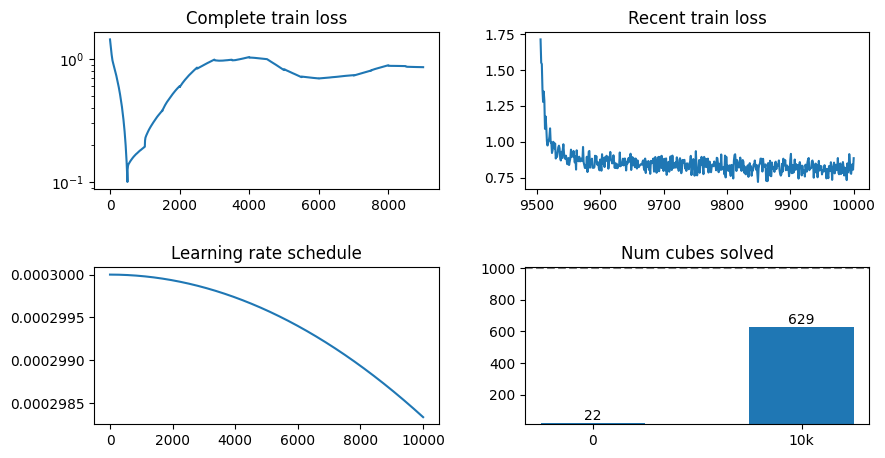

Updating target network after 10500 gradient updates. Time since start: 0:11:34.729346
Updating target network after 11000 gradient updates. Time since start: 0:12:00.722561
Updating target network after 11500 gradient updates. Time since start: 0:12:26.682022
Updating target network after 12000 gradient updates. Time since start: 0:12:52.516891
Updating target network after 12500 gradient updates. Time since start: 0:13:18.401335
Updating target network after 13000 gradient updates. Time since start: 0:13:44.250166
Updating target network after 13500 gradient updates. Time since start: 0:14:10.209471
Updating target network after 14000 gradient updates. Time since start: 0:14:36.208050
Updating target network after 14500 gradient updates. Time since start: 0:15:02.228471
Updating target network after 15000 gradient updates. Time since start: 0:15:28.190983
Updating target network after 15500 gradient updates. Time since start: 0:15:54.157623
Updating target network after 16000 gradien

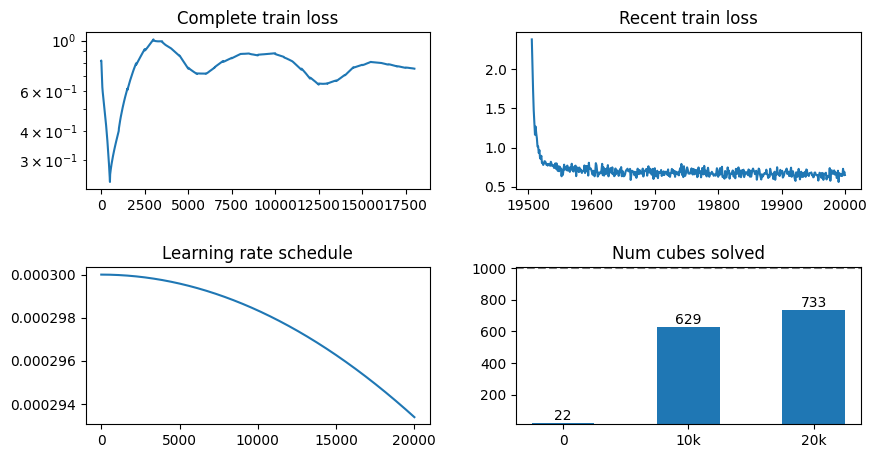

Updating target network after 20500 gradient updates. Time since start: 0:22:25.851403
Updating target network after 21000 gradient updates. Time since start: 0:22:51.690769
Updating target network after 21500 gradient updates. Time since start: 0:23:17.582263
Updating target network after 22000 gradient updates. Time since start: 0:23:43.385290
Updating target network after 22500 gradient updates. Time since start: 0:24:09.307814
Updating target network after 23000 gradient updates. Time since start: 0:24:35.206662
Updating target network after 23500 gradient updates. Time since start: 0:25:01.129051
Updating target network after 24000 gradient updates. Time since start: 0:25:27.073751
Updating target network after 24500 gradient updates. Time since start: 0:25:52.991616
Updating target network after 25000 gradient updates. Time since start: 0:26:18.912932
Updating target network after 25500 gradient updates. Time since start: 0:26:44.841843
Updating target network after 26000 gradien

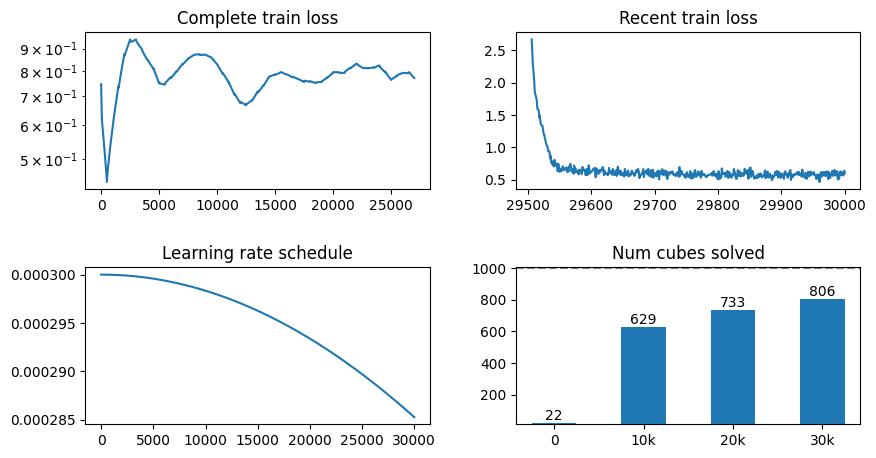

Updating target network after 30500 gradient updates. Time since start: 0:32:55.431062
Updating target network after 31000 gradient updates. Time since start: 0:33:21.332711
Updating target network after 31500 gradient updates. Time since start: 0:33:47.234717
Updating target network after 32000 gradient updates. Time since start: 0:34:13.153491
Updating target network after 32500 gradient updates. Time since start: 0:34:39.068075
Updating target network after 33000 gradient updates. Time since start: 0:35:04.997399
Updating target network after 33500 gradient updates. Time since start: 0:35:30.939393
Updating target network after 34000 gradient updates. Time since start: 0:35:56.905889
Updating target network after 34500 gradient updates. Time since start: 0:36:22.842634
Updating target network after 35000 gradient updates. Time since start: 0:36:48.788122
Updating target network after 35500 gradient updates. Time since start: 0:37:14.755605
Updating target network after 36000 gradien

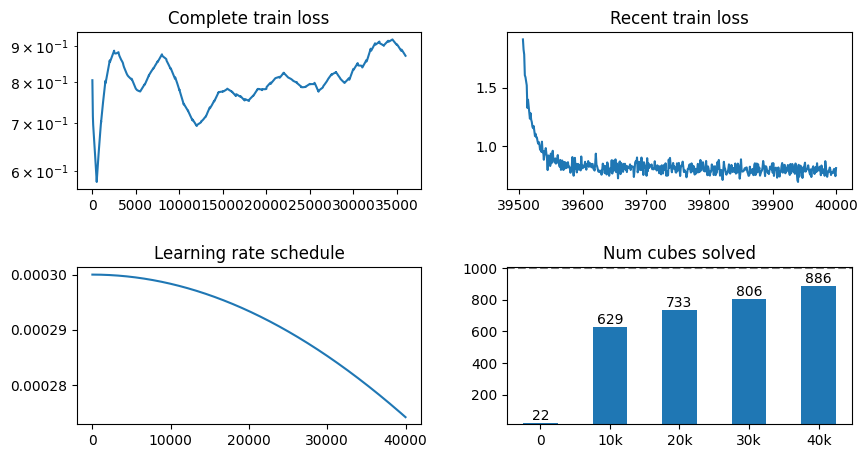

Refreshing replay buffer at step 40000. Will add 2560000 entries.


2560025it [08:20, 5114.25it/s]                             


Updating target network after 40500 gradient updates. Time since start: 0:51:31.665858
Updating target network after 41000 gradient updates. Time since start: 0:51:57.651737
Updating target network after 41500 gradient updates. Time since start: 0:52:23.634176
Updating target network after 42000 gradient updates. Time since start: 0:52:49.600739
Updating target network after 42500 gradient updates. Time since start: 0:53:15.558511
Updating target network after 43000 gradient updates. Time since start: 0:53:41.510317
Updating target network after 43500 gradient updates. Time since start: 0:54:07.449767
Updating target network after 44000 gradient updates. Time since start: 0:54:33.403597
Updating target network after 44500 gradient updates. Time since start: 0:54:59.714310
Updating target network after 45000 gradient updates. Time since start: 0:55:28.521860
Updating target network after 45500 gradient updates. Time since start: 0:55:54.480765
Updating target network after 46000 gradien

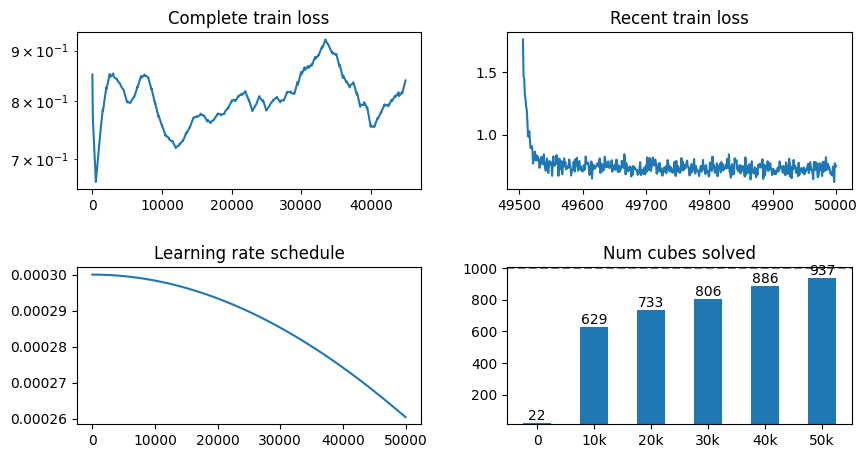

Updating target network after 50500 gradient updates. Time since start: 1:01:36.626075
Updating target network after 51000 gradient updates. Time since start: 1:02:02.545578
Updating target network after 51500 gradient updates. Time since start: 1:02:28.399699
Updating target network after 52000 gradient updates. Time since start: 1:02:54.194259
Updating target network after 52500 gradient updates. Time since start: 1:03:20.006532
Updating target network after 53000 gradient updates. Time since start: 1:03:45.782487
Updating target network after 53500 gradient updates. Time since start: 1:04:11.597845
Updating target network after 54000 gradient updates. Time since start: 1:04:37.408002
Updating target network after 54500 gradient updates. Time since start: 1:05:03.220405
Updating target network after 55000 gradient updates. Time since start: 1:05:29.077719
Updating target network after 55500 gradient updates. Time since start: 1:05:54.909510
Updating target network after 56000 gradien

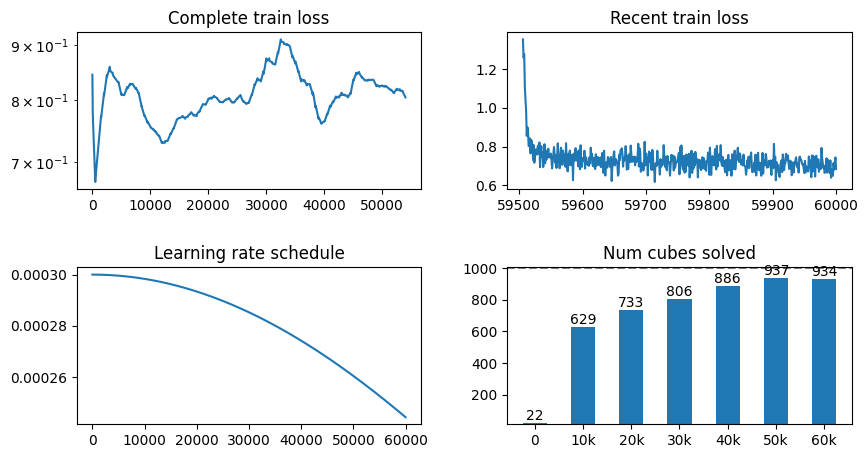

Updating target network after 60500 gradient updates. Time since start: 1:11:37.208158
Updating target network after 61000 gradient updates. Time since start: 1:12:03.018078
Updating target network after 61500 gradient updates. Time since start: 1:12:28.956404
Updating target network after 62000 gradient updates. Time since start: 1:12:54.807709
Updating target network after 62500 gradient updates. Time since start: 1:13:20.827680
Updating target network after 63000 gradient updates. Time since start: 1:13:46.626417
Updating target network after 63500 gradient updates. Time since start: 1:14:12.462883
Updating target network after 64000 gradient updates. Time since start: 1:14:38.245264
Updating target network after 64500 gradient updates. Time since start: 1:15:04.043719
Updating target network after 65000 gradient updates. Time since start: 1:15:29.832476
Updating target network after 65500 gradient updates. Time since start: 1:15:55.608156
Updating target network after 66000 gradien

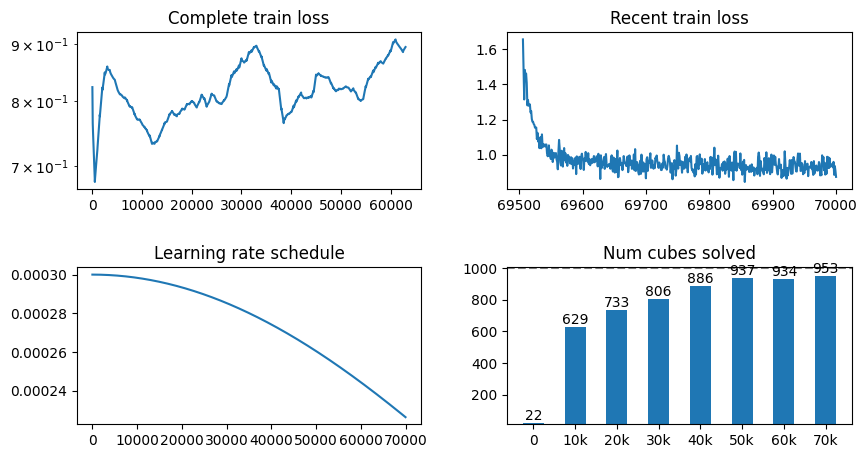

Updating target network after 70500 gradient updates. Time since start: 1:21:28.205956
Updating target network after 71000 gradient updates. Time since start: 1:21:53.978973
Updating target network after 71500 gradient updates. Time since start: 1:22:19.829431
Updating target network after 72000 gradient updates. Time since start: 1:22:45.678827
Updating target network after 72500 gradient updates. Time since start: 1:23:11.613047
Updating target network after 73000 gradient updates. Time since start: 1:23:37.534334
Updating target network after 73500 gradient updates. Time since start: 1:24:03.488496
Updating target network after 74000 gradient updates. Time since start: 1:24:29.402685
Updating target network after 74500 gradient updates. Time since start: 1:24:55.334976
Updating target network after 75000 gradient updates. Time since start: 1:25:21.255838
Updating target network after 75500 gradient updates. Time since start: 1:25:47.182072
Updating target network after 76000 gradien

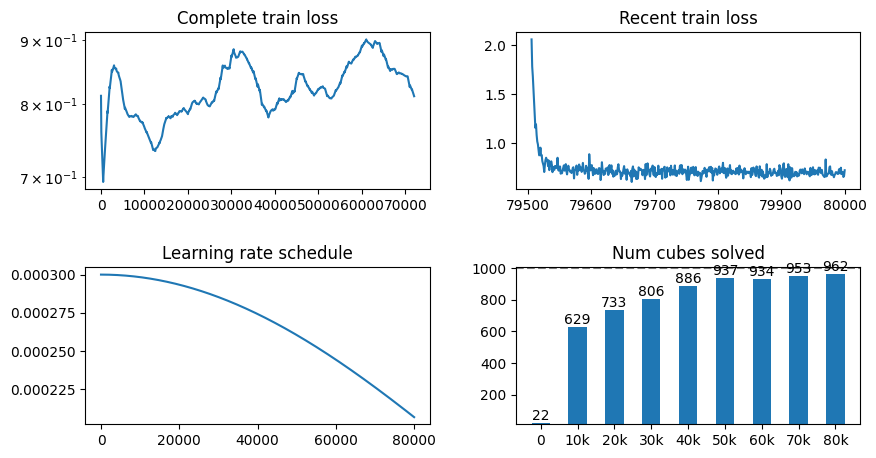

Refreshing replay buffer at step 80000. Will add 2560000 entries.


2560010it [08:21, 5099.90it/s]                             


Updating target network after 80500 gradient updates. Time since start: 1:39:41.320581
Updating target network after 81000 gradient updates. Time since start: 1:40:07.233855
Updating target network after 81500 gradient updates. Time since start: 1:40:33.145096
Updating target network after 82000 gradient updates. Time since start: 1:40:59.070197
Updating target network after 82500 gradient updates. Time since start: 1:41:24.967848
Updating target network after 83000 gradient updates. Time since start: 1:41:50.889288
Updating target network after 83500 gradient updates. Time since start: 1:42:16.825395
Updating target network after 84000 gradient updates. Time since start: 1:42:42.723654
Updating target network after 84500 gradient updates. Time since start: 1:43:08.641409
Updating target network after 85000 gradient updates. Time since start: 1:43:34.866274
Updating target network after 85500 gradient updates. Time since start: 1:44:00.700547
Updating target network after 86000 gradien

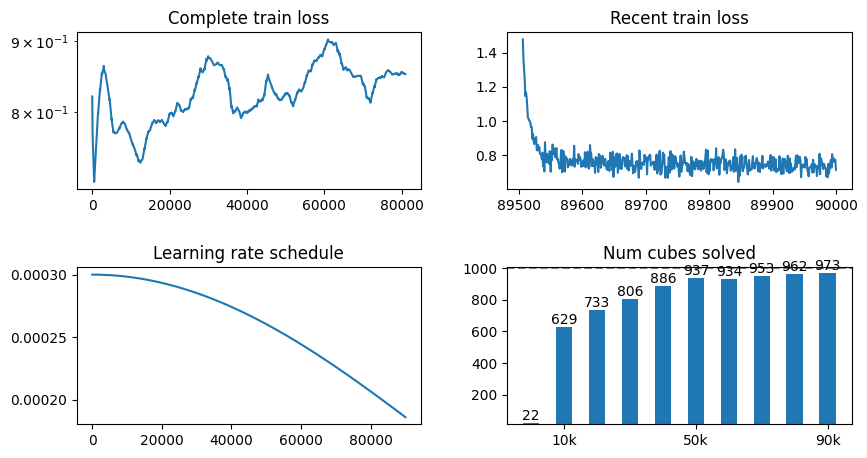

Updating target network after 90500 gradient updates. Time since start: 1:49:25.016759
Updating target network after 91000 gradient updates. Time since start: 1:49:50.795727
Updating target network after 91500 gradient updates. Time since start: 1:50:16.587226
Updating target network after 92000 gradient updates. Time since start: 1:50:42.393634
Updating target network after 92500 gradient updates. Time since start: 1:51:08.183377
Updating target network after 93000 gradient updates. Time since start: 1:51:34.019701
Updating target network after 93500 gradient updates. Time since start: 1:52:00.000914
Updating target network after 94000 gradient updates. Time since start: 1:52:25.823954
Updating target network after 94500 gradient updates. Time since start: 1:52:51.700784
Updating target network after 95000 gradient updates. Time since start: 1:53:17.646136
Updating target network after 95500 gradient updates. Time since start: 1:53:43.544378
Updating target network after 96000 gradien

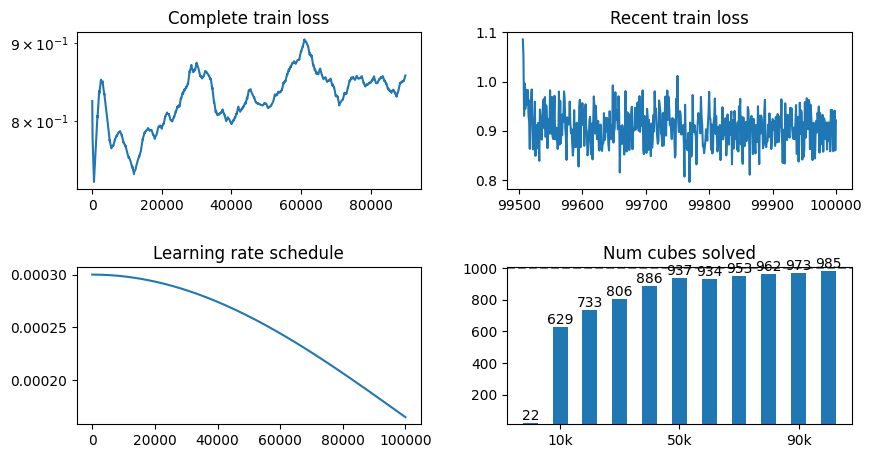

Updating target network after 100500 gradient updates. Time since start: 1:59:05.960379
Updating target network after 101000 gradient updates. Time since start: 1:59:31.863715
Updating target network after 101500 gradient updates. Time since start: 1:59:57.778455
Updating target network after 102000 gradient updates. Time since start: 2:00:23.686955
Updating target network after 102500 gradient updates. Time since start: 2:00:49.580174
Updating target network after 103000 gradient updates. Time since start: 2:01:15.512997
Updating target network after 103500 gradient updates. Time since start: 2:01:41.431197
Updating target network after 104000 gradient updates. Time since start: 2:02:07.386982
Updating target network after 104500 gradient updates. Time since start: 2:02:33.335862
Updating target network after 105000 gradient updates. Time since start: 2:02:59.245886
Updating target network after 105500 gradient updates. Time since start: 2:03:25.053395
Updating target network after 10

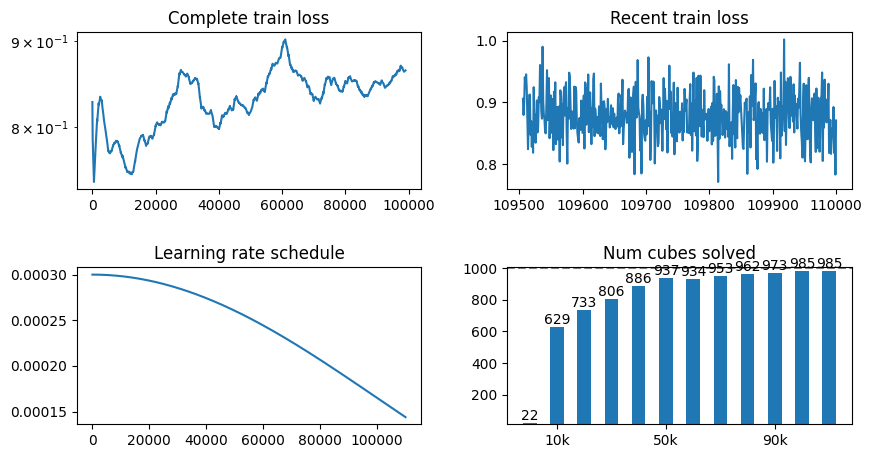

Updating target network after 110500 gradient updates. Time since start: 2:08:44.667268
Updating target network after 111000 gradient updates. Time since start: 2:09:10.443708
Updating target network after 111500 gradient updates. Time since start: 2:09:36.515386
Updating target network after 112000 gradient updates. Time since start: 2:10:02.456941
Updating target network after 112500 gradient updates. Time since start: 2:10:28.225972
Updating target network after 113000 gradient updates. Time since start: 2:10:54.008542
Updating target network after 113500 gradient updates. Time since start: 2:11:19.759577
Updating target network after 114000 gradient updates. Time since start: 2:11:45.603906
Updating target network after 114500 gradient updates. Time since start: 2:12:11.469175
Updating target network after 115000 gradient updates. Time since start: 2:12:37.288954
Updating target network after 115500 gradient updates. Time since start: 2:13:03.111459
Updating target network after 11

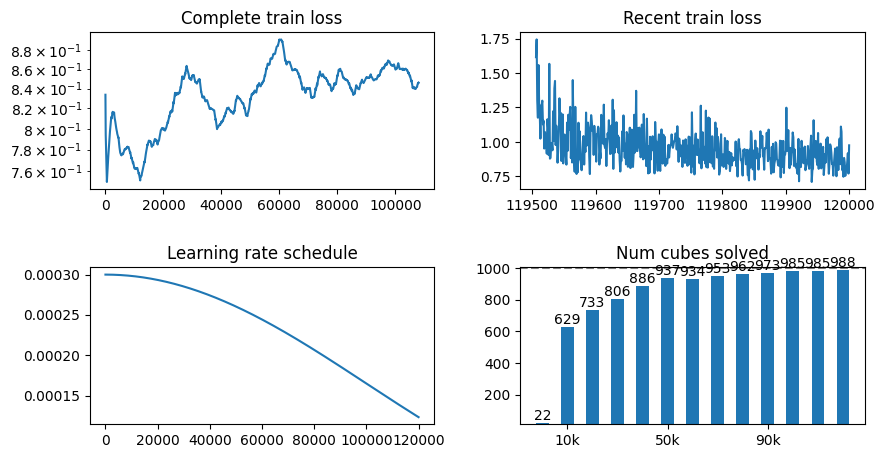

Refreshing replay buffer at step 120000. Will add 2560000 entries.


2560023it [08:27, 5046.86it/s]                             


Updating target network after 120500 gradient updates. Time since start: 2:26:54.207689
Updating target network after 121000 gradient updates. Time since start: 2:27:20.059661
Updating target network after 121500 gradient updates. Time since start: 2:27:46.250087
Updating target network after 122000 gradient updates. Time since start: 2:28:15.406216
Updating target network after 122500 gradient updates. Time since start: 2:28:41.294592
Updating target network after 123000 gradient updates. Time since start: 2:29:07.172855
Updating target network after 123500 gradient updates. Time since start: 2:29:33.090924
Updating target network after 124000 gradient updates. Time since start: 2:29:59.009245
Updating target network after 124500 gradient updates. Time since start: 2:30:24.926465
Updating target network after 125000 gradient updates. Time since start: 2:30:50.825822
Updating target network after 125500 gradient updates. Time since start: 2:31:16.722136
Updating target network after 12

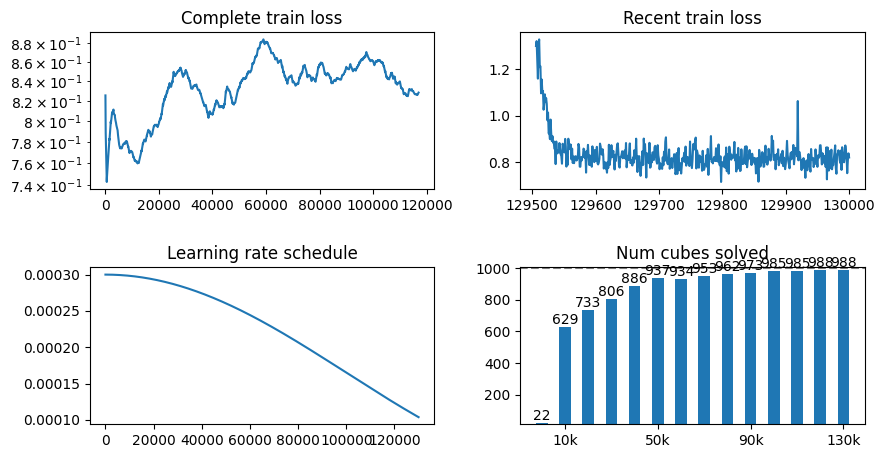

Updating target network after 130500 gradient updates. Time since start: 2:36:35.441435
Updating target network after 131000 gradient updates. Time since start: 2:37:01.267781
Updating target network after 131500 gradient updates. Time since start: 2:37:27.112188
Updating target network after 132000 gradient updates. Time since start: 2:37:52.949643
Updating target network after 132500 gradient updates. Time since start: 2:38:18.788987
Updating target network after 133000 gradient updates. Time since start: 2:38:44.634445
Updating target network after 133500 gradient updates. Time since start: 2:39:10.467288
Updating target network after 134000 gradient updates. Time since start: 2:39:36.322078
Updating target network after 134500 gradient updates. Time since start: 2:40:02.189449
Updating target network after 135000 gradient updates. Time since start: 2:40:28.037229
Updating target network after 135500 gradient updates. Time since start: 2:40:53.892928
Updating target network after 13

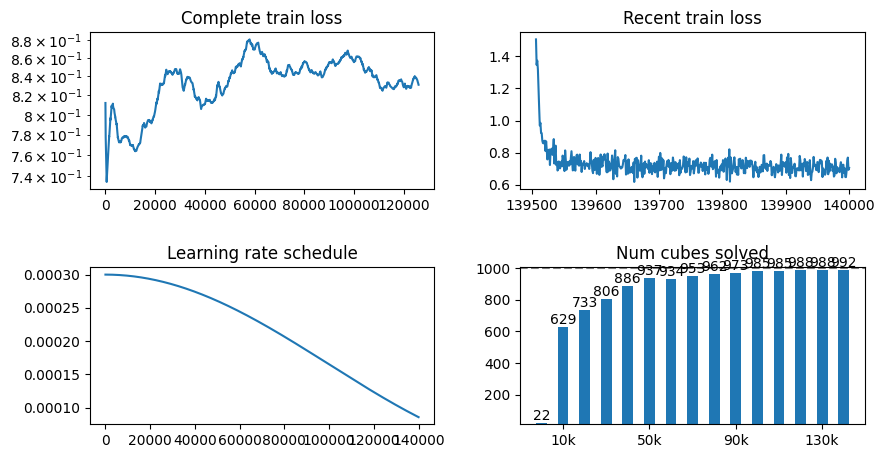

Updating target network after 140500 gradient updates. Time since start: 2:46:12.909491
Updating target network after 141000 gradient updates. Time since start: 2:46:38.696568
Updating target network after 141500 gradient updates. Time since start: 2:47:04.572316
Updating target network after 142000 gradient updates. Time since start: 2:47:30.415205
Updating target network after 142500 gradient updates. Time since start: 2:47:56.252593
Updating target network after 143000 gradient updates. Time since start: 2:48:22.118500
Updating target network after 143500 gradient updates. Time since start: 2:48:47.958847
Updating target network after 144000 gradient updates. Time since start: 2:49:13.822287
Updating target network after 144500 gradient updates. Time since start: 2:49:39.651230
Updating target network after 145000 gradient updates. Time since start: 2:50:05.530317
Updating target network after 145500 gradient updates. Time since start: 2:50:31.397388
Updating target network after 14

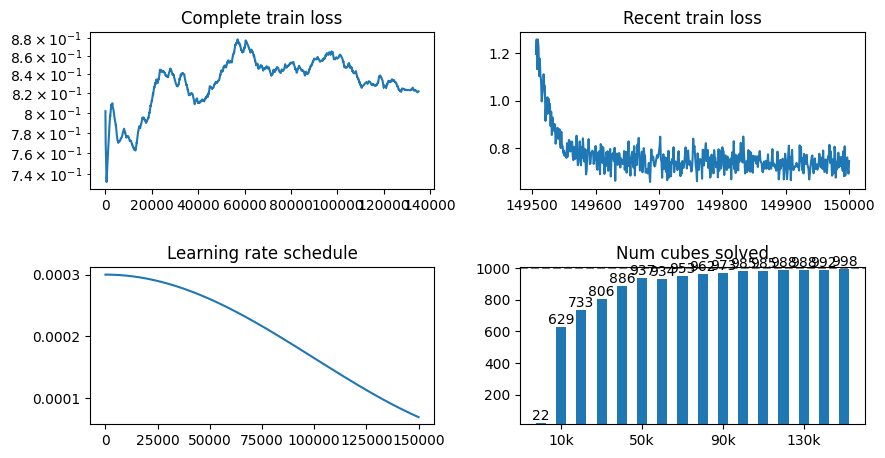

Updating target network after 150500 gradient updates. Time since start: 2:55:45.308267
Updating target network after 151000 gradient updates. Time since start: 2:56:11.172279
Updating target network after 151500 gradient updates. Time since start: 2:56:37.024354
Updating target network after 152000 gradient updates. Time since start: 2:57:02.852007
Updating target network after 152500 gradient updates. Time since start: 2:57:28.684250
Updating target network after 153000 gradient updates. Time since start: 2:57:54.555443
Updating target network after 153500 gradient updates. Time since start: 2:58:20.404335
Updating target network after 154000 gradient updates. Time since start: 2:58:46.255200
Updating target network after 154500 gradient updates. Time since start: 2:59:12.114639
Updating target network after 155000 gradient updates. Time since start: 2:59:37.942521
Updating target network after 155500 gradient updates. Time since start: 3:00:03.789185
Updating target network after 15

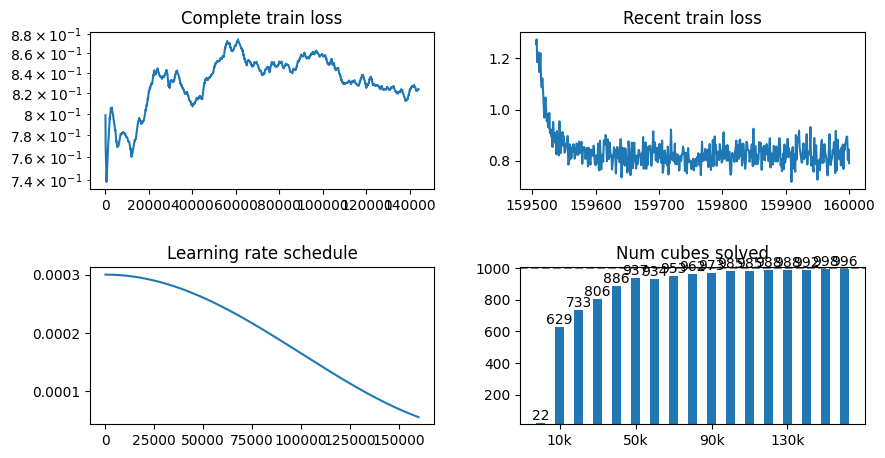

Refreshing replay buffer at step 160000. Will add 2560000 entries.


2560031it [08:25, 5059.89it/s]                             


Updating target network after 160500 gradient updates. Time since start: 3:13:42.480449
Updating target network after 161000 gradient updates. Time since start: 3:14:08.293718
Updating target network after 161500 gradient updates. Time since start: 3:14:34.194611
Updating target network after 162000 gradient updates. Time since start: 3:15:00.049140
Updating target network after 162500 gradient updates. Time since start: 3:15:25.911723
Updating target network after 163000 gradient updates. Time since start: 3:15:51.746073
Updating target network after 163500 gradient updates. Time since start: 3:16:18.021546
Updating target network after 164000 gradient updates. Time since start: 3:16:43.924597
Updating target network after 164500 gradient updates. Time since start: 3:17:09.819007
Updating target network after 165000 gradient updates. Time since start: 3:17:35.711643
Updating target network after 165500 gradient updates. Time since start: 3:18:01.629221
Updating target network after 16

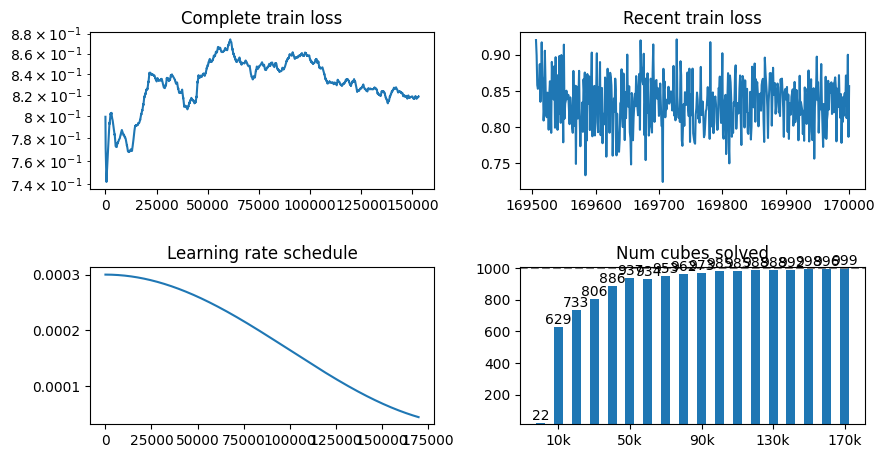

Updating target network after 170500 gradient updates. Time since start: 3:23:14.626064
Updating target network after 171000 gradient updates. Time since start: 3:23:40.445179
Updating target network after 171500 gradient updates. Time since start: 3:24:06.255410
Updating target network after 172000 gradient updates. Time since start: 3:24:32.108352
Updating target network after 172500 gradient updates. Time since start: 3:24:57.980433
Updating target network after 173000 gradient updates. Time since start: 3:25:23.786458
Updating target network after 173500 gradient updates. Time since start: 3:25:49.638056
Updating target network after 174000 gradient updates. Time since start: 3:26:15.484797
Updating target network after 174500 gradient updates. Time since start: 3:26:41.329132
Updating target network after 175000 gradient updates. Time since start: 3:27:07.168528
Updating target network after 175500 gradient updates. Time since start: 3:27:33.011493
Updating target network after 17

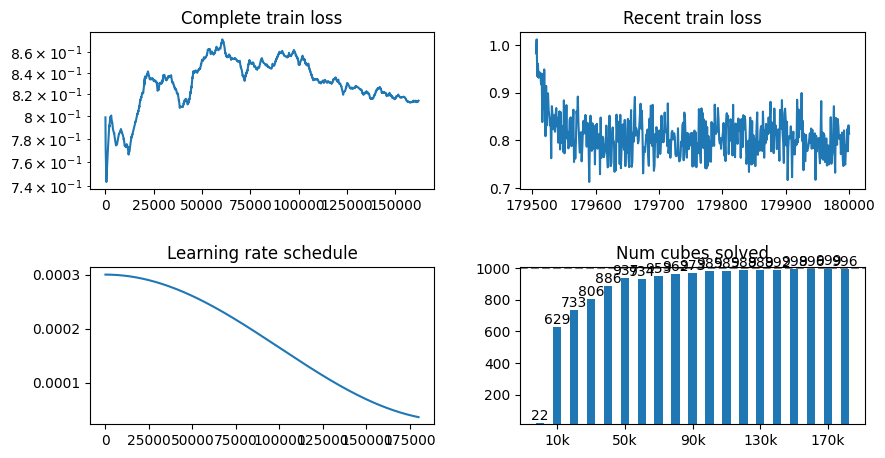

Updating target network after 180500 gradient updates. Time since start: 3:32:46.191483
Updating target network after 181000 gradient updates. Time since start: 3:33:12.015715
Updating target network after 181500 gradient updates. Time since start: 3:33:37.835533
Updating target network after 182000 gradient updates. Time since start: 3:34:03.650378
Updating target network after 182500 gradient updates. Time since start: 3:34:29.441909
Updating target network after 183000 gradient updates. Time since start: 3:34:55.234345
Updating target network after 183500 gradient updates. Time since start: 3:35:21.046488
Updating target network after 184000 gradient updates. Time since start: 3:35:46.835616
Updating target network after 184500 gradient updates. Time since start: 3:36:12.624073
Updating target network after 185000 gradient updates. Time since start: 3:36:38.442362
Updating target network after 185500 gradient updates. Time since start: 3:37:04.268600
Updating target network after 18

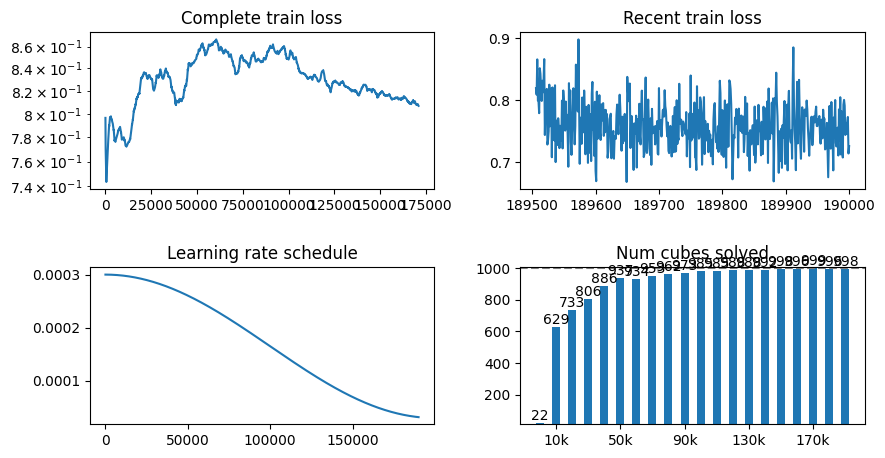

Updating target network after 190500 gradient updates. Time since start: 3:42:16.441550
Updating target network after 191000 gradient updates. Time since start: 3:42:42.239553
Updating target network after 191500 gradient updates. Time since start: 3:43:08.078055
Updating target network after 192000 gradient updates. Time since start: 3:43:33.903698
Updating target network after 192500 gradient updates. Time since start: 3:43:59.713100
Updating target network after 193000 gradient updates. Time since start: 3:44:25.522555
Updating target network after 193500 gradient updates. Time since start: 3:44:51.387102
Updating target network after 194000 gradient updates. Time since start: 3:45:17.271817
Updating target network after 194500 gradient updates. Time since start: 3:45:43.235382
Updating target network after 195000 gradient updates. Time since start: 3:46:09.238821
Updating target network after 195500 gradient updates. Time since start: 3:46:35.207085
Updating target network after 19

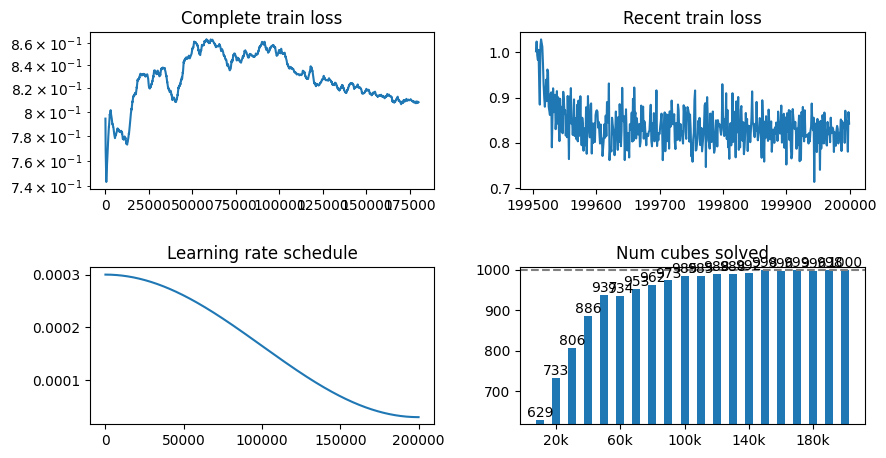

In [ ]:
# Do the actual training.
# Can do 1000 batches of size 512 in ~2.5 minutes on T4 GPU.
# Can do 1000 batches of size 512 in ~1 minute on V100 GPU.
start = datetime.datetime.now()
print(f"Started training at {start}. Will train for {n_total_steps} batches.")
episode_rewards = []
for gradient_step in range(n_total_steps):
  update_network(
      agent, target_dqn, replay_buffer, gamma, env.max_reward, batch_size, 1)
  scheduler.step()
  lrs.append(scheduler.get_last_lr())

  # Update the target network occasionally.
  if gradient_step % target_network_update_frequency == 0 and gradient_step > 0:
    print(f"Updating target network after {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}")
    for target_param, online_param in zip(target_dqn.parameters(), agent.q_function.parameters()):
      target_param.data.copy_(tau * online_param.data + (1.0 - tau) * target_param.data)

  # Check metrics occasionally.
  if gradient_step % n_eval_steps == 0 and gradient_step > 0:
    print(f"Reached {gradient_step} gradient updates. "
          f"Online network is in training mode? {agent.q_function.training}. "
          f"Replay buffer size is {len(replay_buffer.training_examples)}.")
    agent.q_function.eval()
    metrics_for_agent = get_metrics_for_agent(agent, env)
    agent.q_function.train()
    print(f"Intermediate transformer DQN evaluation metrics were {metrics_for_agent}")
    cubes_solved_counts.append((gradient_step, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, target_network_update_frequency-5)

  # Update the replay buffer occasionally.
  if gradient_step % n_refresh_buffer_steps == 0 and gradient_step > 0:
    num_examples_to_add = replay_buffer.buffer_size // 8
    print(f"Refreshing replay buffer at step {gradient_step}. Will add {num_examples_to_add} entries.")
    add_examples_to_buffer(replay_buffer, num_examples_to_add)

print(f"Finished training. Time since start: {datetime.datetime.now() - start}")

if cubes_solved_counts[-1][0] != n_total_steps:
  agent.q_function.eval()
  # Perform final evaluation with more steps and some stochasticity in case agent gets stuck
  # in a cycle of repetitive moves.
  original_max_steps_per_rollout = env.max_steps_per_rollout
  env.max_steps_per_rollout = 100
  agent.epsilon = .1
  final_metrics_for_agent = get_metrics_for_agent(agent, env)
  env.max_steps_per_rollout = original_max_steps_per_rollout
  agent.q_function.train()
  print(f"Final transformer DQN evaluation metrics were {final_metrics_for_agent}")
  cubes_solved_counts.append((n_total_steps, final_metrics_for_agent.total_cubes_solved))
plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, target_network_update_frequency-5)

## Advantage Actor-Critic (A2C)

Advantage actor-critic uses both a policy head and a value head to solve the problem. The value head is used to judge the _advantage_ of an action, which measures how much better a specific action
is than the default action for that state. The basic idea is to penalize the network if it assigns a low probability to an action with a positive advantage and penalize the network if it assigns a high probability to an action with a negative advantage, as reflected in the graph below. The policy head is guided by this loss. There are several important details to get right in an A2C implementation, especially making sure to detach/no_grad certain tensors to prevent the network cheating by learning the wrong things, and making sure the loss function is correct for both positive and negative attention.

This section uses PyTorch. There is a lot of duplicated code in this section with PositionalEncoding and RubiksTransformer, but it is intentionally copy/pasted so that one can skip to this cell in the colab without having to run all of the previous sections.

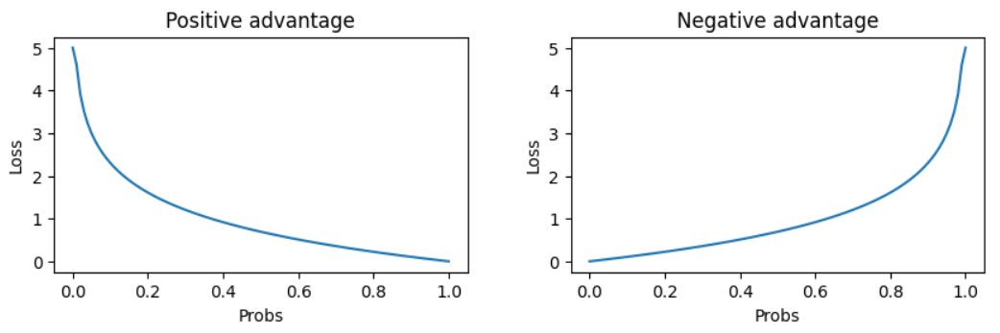

In [ ]:
import datetime
import math
import torch
from torch import nn, Tensor
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Categorical
from tqdm import tqdm

# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device", device)


# Adapted from https://pytorch.org/tutorials/beginner/transformer_tutorial.html
class PositionalEncoding(nn.Module):

  def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
    super().__init__()
    self.dropout = nn.Dropout(p=dropout)

    position = torch.arange(max_len).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
    pe = torch.zeros(max_len, d_model)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    self.register_buffer('pe', pe)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    """
    Arguments:
      x: Tensor, shape ``[batch_size, seq_len, embedding_dim]``

    Returns:
      Tensor of shape ``[batch_size, seq_len, embedding_dim]``
    """
    x = x + self.pe
    return self.dropout(x)

class RubiksTransformer(nn.Module):
  """Implement an encoder-only transformer for solving Rubik's cubes.

  The structure is
  1. Embed the "token", which represents either a block or a color of a square on a face.
  2. Optionally add positional encodings to the embedding.
  3. Stack N transformer encoding layers (no causal masking). Each is MHA followed by MLP.
  4. Output heads. One head for the actor, which represents the logits for taking each of the
     twelve actions, and one head for the critic, which estimates V(s).
  """

  def __init__(self, *, num_output_actions: int, sequence_len: int, vocab_size: int,
               embed_dim: int, use_positional_encoding: bool, dropout: float,
               num_encoder_layers: int, mha_num_heads: int, dim_feedforward: int, activation: str):
    super().__init__()
    self.num_output_actions = num_output_actions
    self.embed_dim = embed_dim
    self.use_positional_encoding = use_positional_encoding

    self.embed = nn.Embedding(vocab_size, embed_dim)
    self.pos_encoder = PositionalEncoding(d_model=embed_dim, dropout=dropout, max_len=sequence_len)
    encoder_layer = nn.TransformerEncoderLayer(
        embed_dim, mha_num_heads, dim_feedforward=dim_feedforward,
        dropout=dropout, activation=activation, layer_norm_eps=1e-05, batch_first=True,
        norm_first=True, bias=True)
    self.central_encoder = nn.TransformerEncoder(
        encoder_layer, num_layers=num_encoder_layers, enable_nested_tensor=False)

    # No longer have an option to use_all_tokens_for_prediction or not, we will just always
    # use all tokens.
    self.actor_head = nn.Sequential(
        nn.Linear(in_features=sequence_len*embed_dim, out_features=sequence_len*embed_dim),
        nn.ReLU(),
        nn.Dropout(p=dropout),
        nn.Linear(in_features=sequence_len*embed_dim, out_features=num_output_actions),
    )
    self.critic_head = nn.Sequential(
        nn.Linear(in_features=sequence_len*embed_dim, out_features=sequence_len*embed_dim),
        nn.ReLU(),
        nn.Dropout(p=dropout),
        nn.Linear(in_features=sequence_len*embed_dim, out_features=1),
    )

  def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
    """
    Arguments:
      x: Tensor, shape ``[batch_size, seq_len]``

    Returns:
      output: tuple of actor_output shape (batch_size, num_actions) and
              critic_output shape (batch_size, 1)
    """
    # B = batch size
    # L = sequence length
    # D = embed_dim/d_model
    # A = num actions
    output = self.embed(x) * math.sqrt(self.embed_dim)  # output is now [B, L, D]
    if self.use_positional_encoding:
      output = self.pos_encoder(output)  # output is still [B, L, D]
    output = self.central_encoder(output)  # output is still [B, L, D]
    output = torch.reshape(output, (output.shape[0], -1))  # [B, L*D]
    actor_output = F.softmax(self.actor_head(output), dim=-1)  # [B, A]
    critic_output = self.critic_head(output)  # [B, 1]
    return actor_output, critic_output

  def forward_numpy(self, s: np.ndarray) -> tuple[torch.Tensor, torch.Tensor]:
    # Network expects ``[batch_size, seq_len]``, so expand state to include a batch dim if missing.
    if s.ndim == 1:
      s = np.expand_dims(s, axis=0)
    assert s.ndim == 2, f"State must have two dimensions, shape was {s.shape}"
    return self.forward(torch.from_numpy(s).int().to(device))

@dataclasses.dataclass(frozen=False)
class PtTransformerA2CAgent(Agent):
  actor_critic: RubiksTransformer
  epsilon: float
  action_space: gym.Space
  optimizer: optim.Optimizer
  losses: list[float]
  actor_losses: list[float]
  critic_losses: list[float]

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    # We ignore deterministic here, to allow evals to also use some randomness.
    # This tends to be helpful for the deep networks because otherwise they can sometimes
    # get stuck in cycles.
    return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return int(self.get_action_using_actor_policy(state))

  def get_action_using_actor_policy(self, state: np.ndarray) -> torch.Tensor:
    actor_output, _ = self.actor_critic.forward_numpy(state)
    assert actor_output.ndim == 2, f"Expected shape to be [B, A], got {actor_output.shape}"
    m = Categorical(probs=actor_output)
    action = m.sample()  # [B]
    return action

def update_network(
    agent: PtTransformerA2CAgent, replay_buffer: ReplayBuffer, gamma: float, batch_size: int
) -> None:
  original_states, actions, rewards, next_states, is_dones, _ = replay_buffer.sample_batch(
      batch_size, deduplicate_batch=True)
  actions = torch.from_numpy(actions).to(device).squeeze()
  rewards = torch.from_numpy(rewards).float().to(device).squeeze()
  is_dones = torch.from_numpy(is_dones).float().to(device).squeeze()

  original_state_action_probs, original_state_values = agent.actor_critic.forward_numpy(
      original_states)
  _, next_state_values = agent.actor_critic.forward_numpy(next_states)
  original_state_values = original_state_values.squeeze()  # [B]
  next_state_values = next_state_values.squeeze()  # [B]

  advantage = rewards + (gamma * (next_state_values * (1 - is_dones))) - original_state_values
  advantage = advantage.detach()
  m = Categorical(probs=original_state_action_probs)
  m_inv = Categorical(probs=(1 - original_state_action_probs))
  neg_log_probs = -m.log_prob(actions)
  neg_log_inv_probs = -m_inv.log_prob(actions)
  positive_advantage_losses = neg_log_probs * advantage
  negative_advantage_losses = neg_log_inv_probs * -advantage

  policy_loss = torch.where(advantage >= 0, positive_advantage_losses, negative_advantage_losses).mean()
  value_loss = F.smooth_l1_loss(
      original_state_values,
      rewards + (gamma * (next_state_values.detach() * (1 - is_dones))),
  )
  # This scaling of policy loss and value loss isn't fully necessary since the network still
  # trains well without it, but I found it makes it learn slightly faster. The motivation for
  # doing this is that policy loss in the graphs seems to be much higher than value loss, so
  # this evens them out a bit.
  policy_loss = policy_loss / 2
  value_loss = value_loss * 2
  # Future idea: Add an aux loss to enforce V(s) between the minimum reward and maximum reward?
  loss = policy_loss + value_loss
  agent.losses.append(loss.item())
  agent.actor_losses.append(policy_loss.item())
  agent.critic_losses.append(value_loss.item())
  agent.optimizer.zero_grad()
  loss.backward()
  agent.optimizer.step()

def plot_actor_critic_losses(
    actor_losses: list[float],
    critic_losses: list[float],
    skip_first_n_steps: int = 1000,
) -> None:
  fig = plt.figure(figsize=(10, 2))
  fig.subplots_adjust(top=.99, bottom=.01, hspace=.50, wspace=.25)

  ax1 = plt.subplot(1, 2, 1)
  ax1.set_yscale("log")
  ax1.set_title("Complete actor loss")
  averaged = moving_average(np.array(actor_losses), max(100, len(actor_losses) / 20))
  ax1.plot(np.arange(skip_first_n_steps, len(averaged)),
           averaged[skip_first_n_steps:],
           label="actor loss")

  ax2 = plt.subplot(1, 2, 2)
  ax2.set_yscale("log")
  ax2.set_title("Complete critic loss")
  averaged = moving_average(np.array(critic_losses), max(100, len(critic_losses) / 20))
  ax2.plot(np.arange(skip_first_n_steps, len(averaged)),
           averaged[skip_first_n_steps:],
           label="critic loss")

  plt.show()


env = RubiksCube2Env(
    state_type=StateType.TOKENIZED_BLOCKS,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=False,
    allow_easy_initializations=False,
    max_reward=1)

network_kwargs = {
    "num_output_actions": env.action_space.n,
    "sequence_len": env.observation_space.shape[0],
    "vocab_size": env.vocab_size,
    "embed_dim": 256,
    "use_positional_encoding": True,
    "dropout": 0.05,
    "num_encoder_layers": 6,
    "mha_num_heads": 4,
    "dim_feedforward": 1024,
    "activation": 'relu',
}
actor_critic = RubiksTransformer(**network_kwargs).to(device)
actor_critic.train()
print(actor_critic)
print(f"Param count {sum(param.numel() for param in actor_critic.parameters())}")
print(f"Model is training? {actor_critic.training}")
print(f"Observation for test cube is {get_obs_for_test_cube(env)}")

GPU 0: Tesla V100-SXM2-16GB (UUID: GPU-3eb57a93-2319-4fca-20c3-30626dd52cb9)
Using device cuda
RubiksTransformer(
  (embed): Embedding(192, 256)
  (pos_encoder): PositionalEncoding(
    (dropout): Dropout(p=0.05, inplace=False)
  )
  (central_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-5): 6 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=1024, bias=True)
        (dropout): Dropout(p=0.05, inplace=False)
        (linear2): Linear(in_features=1024, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.05, inplace=False)
        (dropout2): Dropout(p=0.05, inplace=False)
      )
    )
  )
  (actor_head): Sequential(
    (0): Linear(in_fea

In [ ]:
# Hyperparameters.
gamma = 1
epsilon = 0
batch_size = 512
n_eval_steps = 10_000
backwards_rollout_fraction = 1  # What percentage of the time to generate rollouts using the backwards rollout strategy.
n_total_steps = 200_000
n_refresh_buffer_steps = 40_000
replay_buffer_size = n_refresh_buffer_steps * batch_size

optimizer = optim.Adam(actor_critic.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=n_total_steps,
    eta_min=3e-5)
lrs = [scheduler.get_last_lr()]
cubes_solved_counts = []

agent = PtTransformerA2CAgent(actor_critic, epsilon, env.action_space, optimizer, [], [], [])

agent.actor_critic.eval()
metrics_for_agent = get_metrics_for_agent(agent, env)
agent.actor_critic.train()
print(f"Untrained transformer A2C evaluation metrics were {metrics_for_agent}")
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

def add_examples_to_buffer(replay_buffer: ReplayBuffer, num_examples_to_add: int) -> None:
  examples_added = 0
  with tqdm(total=num_examples_to_add) as pbar:
    while examples_added < num_examples_to_add:
      r = random.uniform(0, 1)
      if r <= backwards_rollout_fraction:
        rollout, total_reward_for_episode = generate_rollout_backwards(
            agent, env, cap_rollout_steps=45)
      else:
        rollout, total_reward_for_episode = generate_rollout(agent, env)
      replay_buffer.add_samples(rollout)
      examples_added += len(rollout)
      pbar.update(len(rollout))

# Fill the initial training buffer.
replay_buffer = ReplayBuffer(replay_buffer_size)
add_examples_to_buffer(replay_buffer, replay_buffer.buffer_size)

Untrained transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=43, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 17, 'total reward': -66.20000000000474, 'average reward': -0.6620000000000473}, 2: {'num trials': 100, 'num cubes solved': 4, 'total reward': -92.19999999999871, 'average reward': -0.921999999999987}, 3: {'num trials': 100, 'num cubes solved': 12, 'total reward': -76.28000000000243, 'average reward': -0.7628000000000243}, 4: {'num trials': 100, 'num cubes solved': 5, 'total reward': -90.49999999999866, 'average reward': -0.9049999999999866}, 5: {'num trials': 100, 'num cubes solved': 4, 'total reward': -92.11999999999837, 'average reward': -0.9211999999999837}, 10: {'num trials': 100, 'num cubes solved': 1, 'total reward': -98.09999999999742, 'average reward': -0.9809999999999742}, 20: {'num trials': 100, 'num cubes solved': 0, 'total reward': -99.99999999999724, 'average reward': -0.9999999999999725

20480009it [1:06:43, 5115.38it/s]                              


Started training at 2024-03-15 11:28:19.573596. Will train for 200000 batches.
Reached 10000 gradient updates. Time since start: 0:05:33.939464. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=601, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.60000000000001, 'average reward': 0.9960000000000001}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.60000000000007, 'average reward': 0.9660000000000006}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.84000000000002, 'average reward': 0.9484000000000001}, 4: {'num trials': 100, 'num cubes solved': 97, 'total reward': 88.85999999999953, 'average reward': 0.8885999999999953}, 5: {'num trials': 100, 'num cubes solved': 96, 'total reward': 81.68000000000023, 'average reward': 0.8168000000000023}, 10: {'num trials': 100,

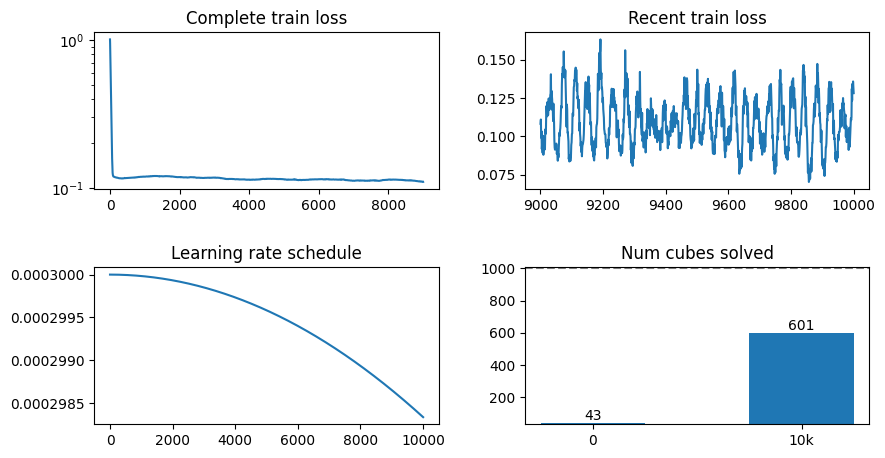

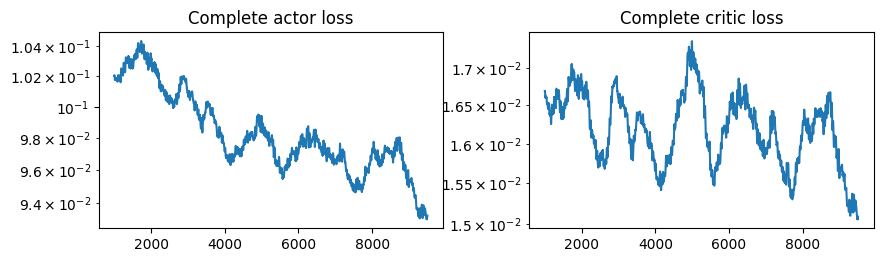

Reached 20000 gradient updates. Time since start: 0:13:28.011282. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=645, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.16000000000001, 'average reward': 0.9916000000000001}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.12000000000029, 'average reward': 0.9412000000000029}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.47999999999996, 'average reward': 0.9247999999999996}, 4: {'num trials': 100, 'num cubes solved': 99, 'total reward': 87.10000000000025, 'average reward': 0.8710000000000025}, 5: {'num trials': 100, 'num cubes solved': 96, 'total reward': 80.12000000000002, 'average reward': 0.8012000000000001}, 10: {'num trials': 100, 'num cubes solved': 70, 'total reward': 21.280000000000342, 'average reward': 

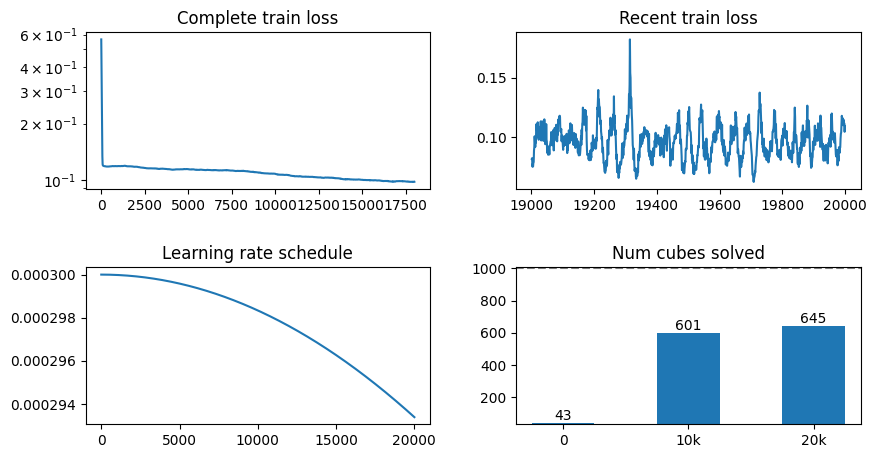

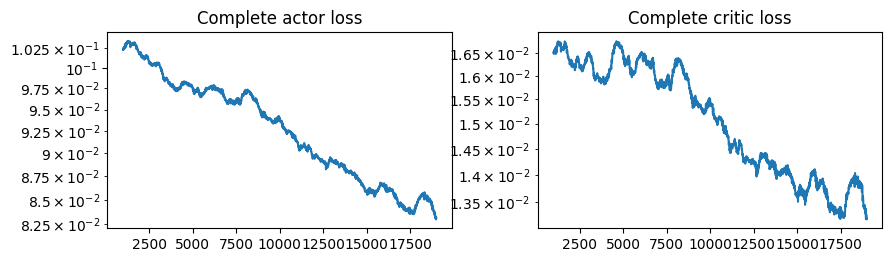

Reached 30000 gradient updates. Time since start: 0:21:18.986707. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=728, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.3600000000001, 'average reward': 0.993600000000001}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.36000000000007, 'average reward': 0.9536000000000007}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.19999999999999, 'average reward': 0.9419999999999998}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.47999999999999, 'average reward': 0.9247999999999998}, 5: {'num trials': 100, 'num cubes solved': 99, 'total reward': 86.5200000000003, 'average reward': 0.865200000000003}, 10: {'num trials': 100, 'num cubes solved': 81, 'total reward': 42.61999999999775, 'average reward': 0.42

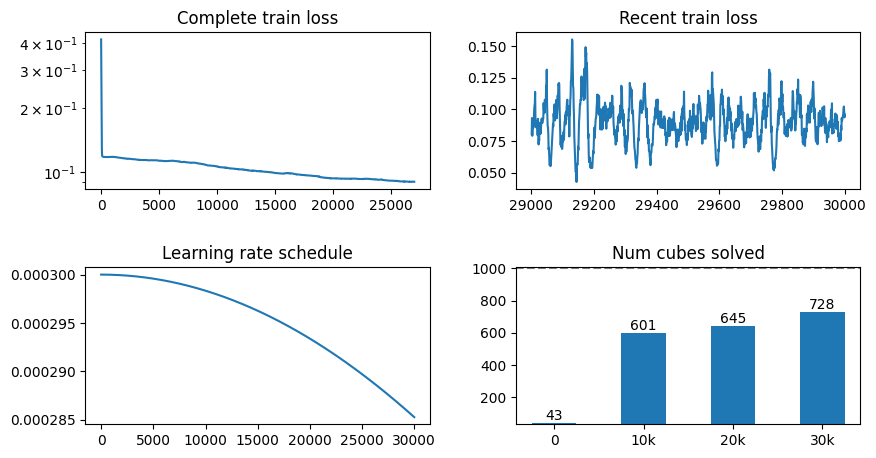

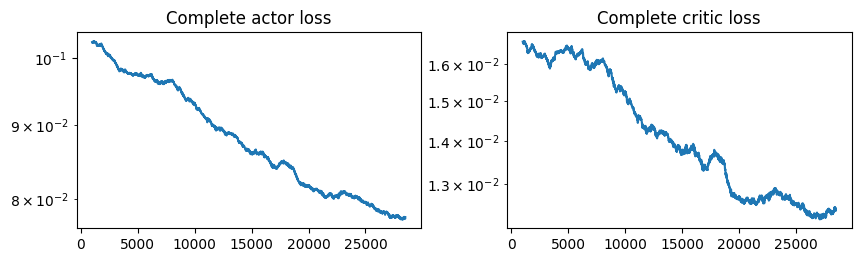

Reached 40000 gradient updates. Time since start: 0:28:55.190423. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=759, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.27999999999993, 'average reward': 0.9927999999999993}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.75999999999996, 'average reward': 0.9575999999999997}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.72000000000034, 'average reward': 0.9372000000000034}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.04000000000013, 'average reward': 0.9204000000000013}, 5: {'num trials': 100, 'num cubes solved': 99, 'total reward': 87.0800000000001, 'average reward': 0.870800000000001}, 10: {'num trials': 100, 'num cubes solved': 83, 'total reward': 47.179999999996895, 'average reward': 0

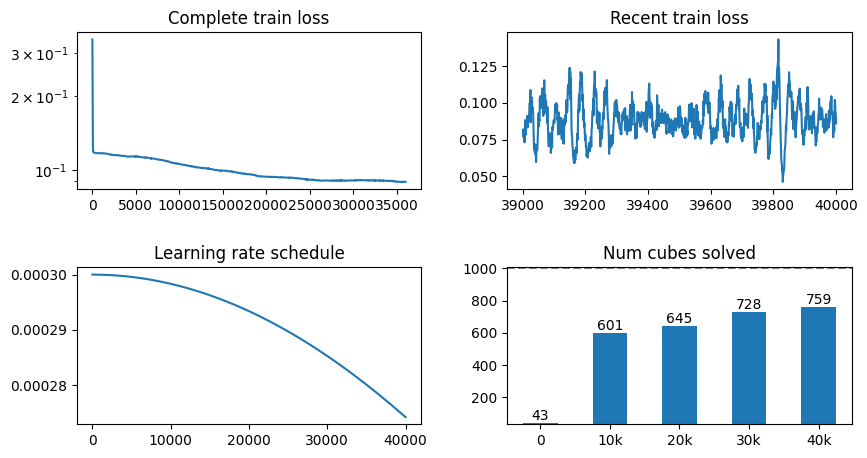

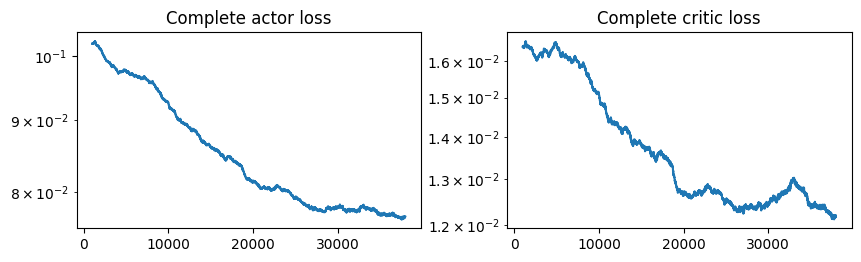

Refreshing replay buffer at step 40000. Will add 2560000 entries.


2560043it [08:22, 5094.14it/s]                             


Reached 50000 gradient updates. Time since start: 0:44:54.032779. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=806, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.24, 'average reward': 0.9924}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.56, 'average reward': 0.9556}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.12000000000008, 'average reward': 0.9412000000000007}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 90.28, 'average reward': 0.9028}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 88.39999999999986, 'average reward': 0.8839999999999987}, 10: {'num trials': 100, 'num cubes solved': 85, 'total reward': 47.939999999997745, 'average reward': 0.47939999999997746}, 20: {'num trials': 100, 'num cubes solved': 61, 

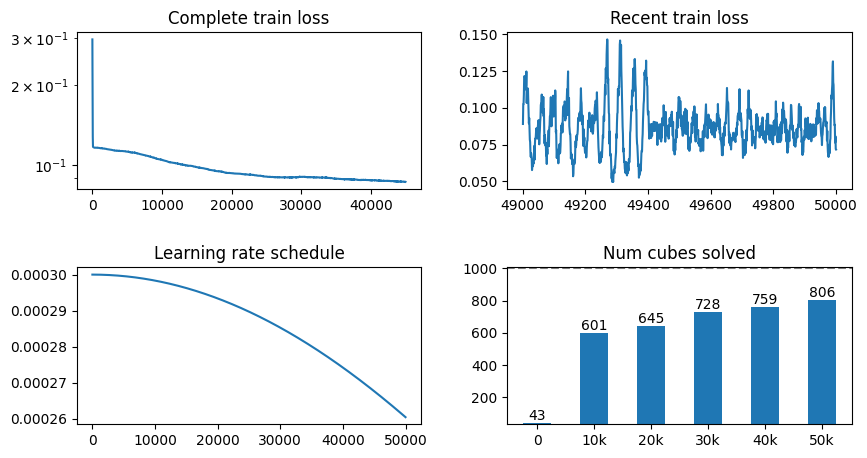

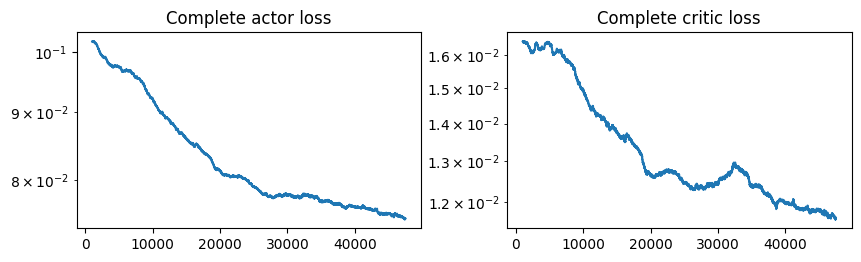

Reached 60000 gradient updates. Time since start: 0:52:22.715325. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=863, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.72000000000003, 'average reward': 0.9972000000000003}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.15999999999991, 'average reward': 0.9615999999999991}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.9199999999999, 'average reward': 0.939199999999999}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.12000000000016, 'average reward': 0.9212000000000016}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 89.08000000000018, 'average reward': 0.8908000000000018}, 10: {'num trials': 100, 'num cubes solved': 97, 'total reward': 72.09999999999891, 'average reward': 0

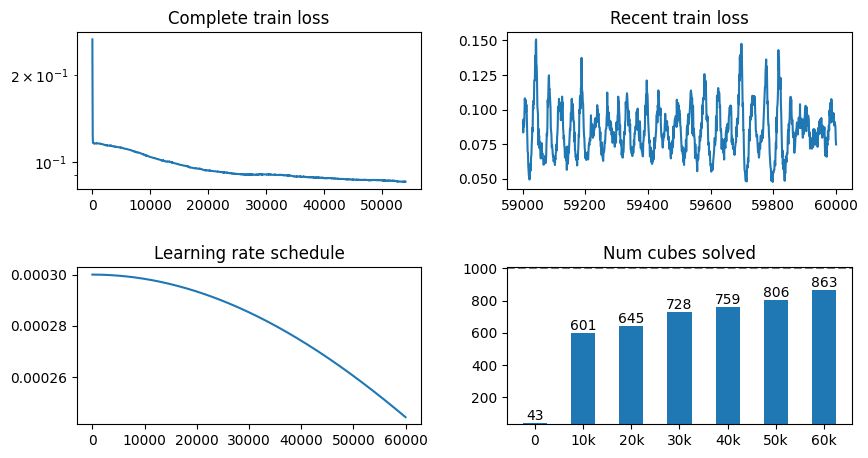

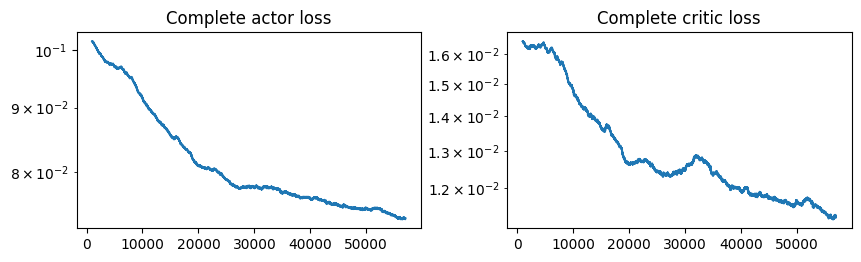

Reached 70000 gradient updates. Time since start: 0:59:42.336333. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=924, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.79999999999998, 'average reward': 0.9979999999999998}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.68000000000005, 'average reward': 0.9668000000000005}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.40000000000009, 'average reward': 0.944000000000001}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 91.92000000000019, 'average reward': 0.9192000000000019}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 91.52000000000002, 'average reward': 0.9152000000000002}, 10: {'num trials': 100, 'num cubes solved': 97, 'total reward': 73.2199999999988, 'average reward': 0

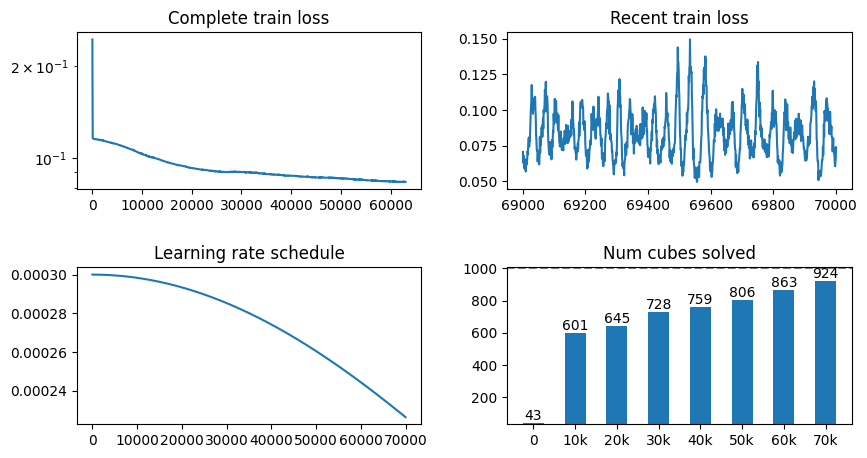

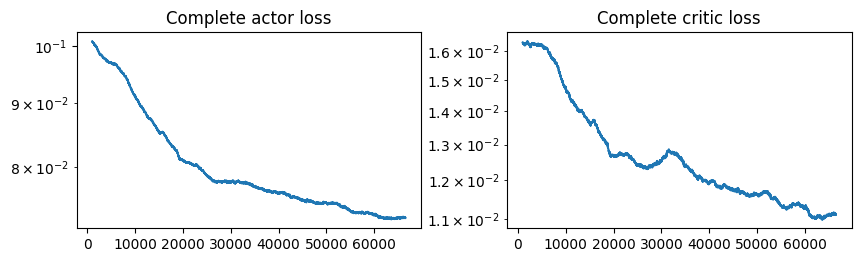

Reached 80000 gradient updates. Time since start: 1:06:46.041358. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=917, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.32000000000008, 'average reward': 0.9932000000000007}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.60000000000014, 'average reward': 0.9460000000000014}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.96000000000008, 'average reward': 0.9396000000000008}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.12000000000006, 'average reward': 0.9212000000000006}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 90.84000000000002, 'average reward': 0.9084000000000002}, 10: {'num trials': 100, 'num cubes solved': 99, 'total reward': 76.3799999999996, 'average reward': 

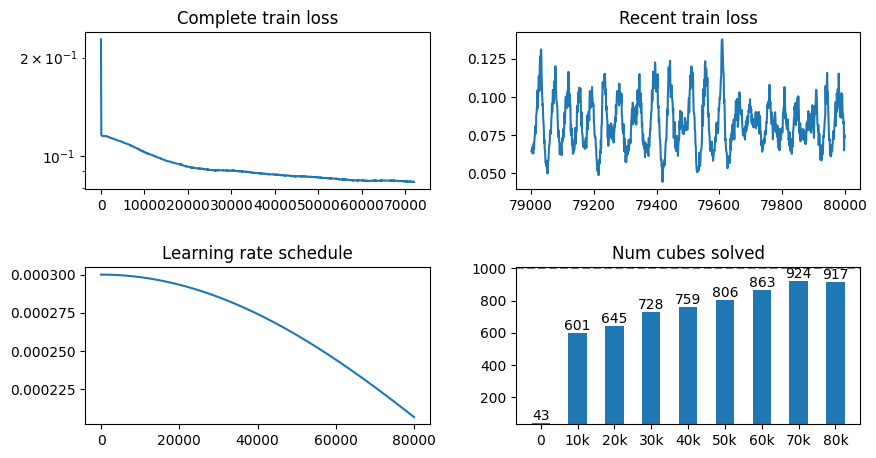

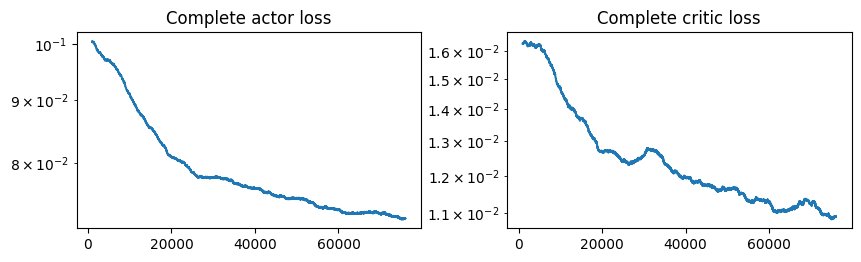

Refreshing replay buffer at step 80000. Will add 2560000 entries.


2560037it [08:31, 5005.39it/s]                             


Reached 90000 gradient updates. Time since start: 1:22:23.470914. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=963, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.40000000000006, 'average reward': 0.9940000000000007}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.92000000000003, 'average reward': 0.9692000000000003}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.64000000000009, 'average reward': 0.9564000000000008}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.56000000000014, 'average reward': 0.9256000000000014}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 91.4800000000001, 'average reward': 0.9148000000000011}, 10: {'num trials': 100, 'num cubes solved': 99, 'total reward': 79.05999999999973, 'average reward': 

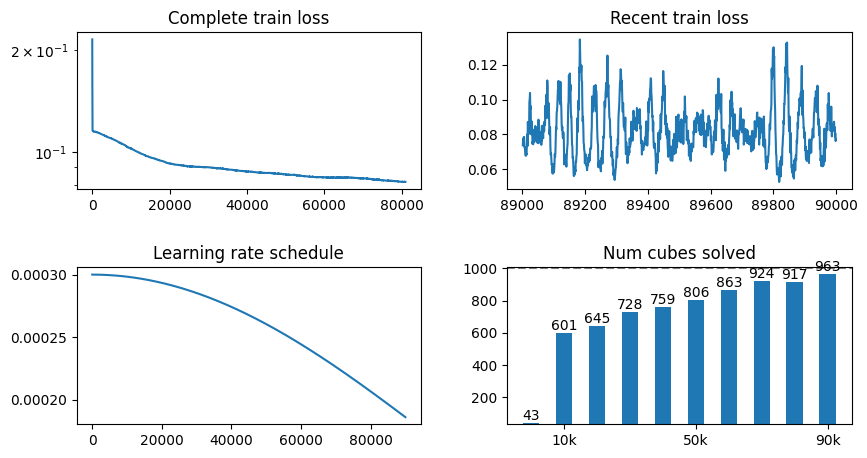

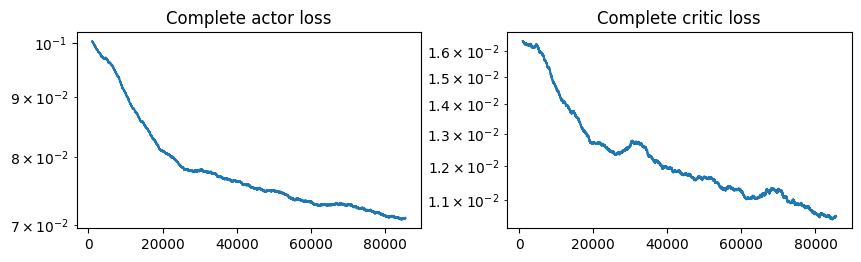

Reached 100000 gradient updates. Time since start: 1:29:16.301865. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=971, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.60000000000002, 'average reward': 0.9960000000000002}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.64000000000009, 'average reward': 0.9664000000000008}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.52000000000015, 'average reward': 0.9552000000000015}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.04000000000008, 'average reward': 0.9304000000000008}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.80000000000017, 'average reward': 0.9280000000000017}, 10: {'num trials': 100, 'num cubes solved': 99, 'total reward': 81.17999999999972, 'average reward'

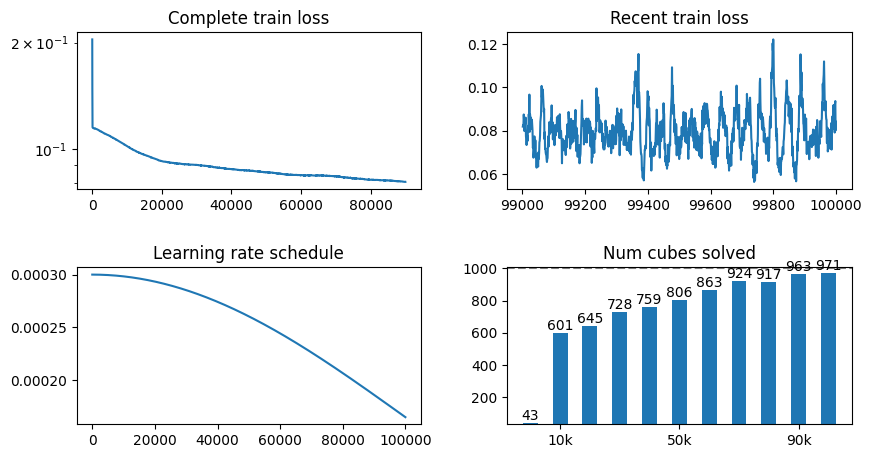

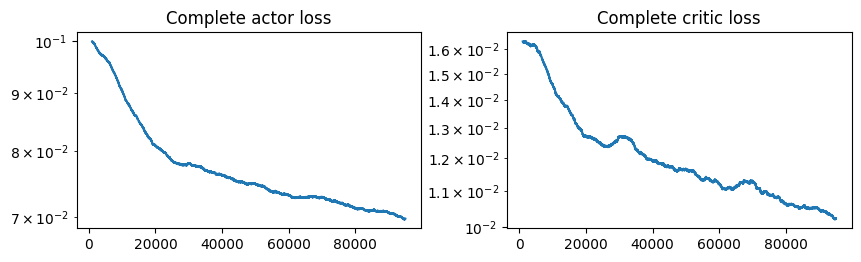

Reached 110000 gradient updates. Time since start: 1:36:04.786528. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=980, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.64000000000001, 'average reward': 0.9964000000000002}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.44000000000008, 'average reward': 0.9744000000000008}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.04000000000002, 'average reward': 0.9604000000000003}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.4000000000001, 'average reward': 0.9440000000000011}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.36000000000013, 'average reward': 0.9236000000000013}, 10: {'num trials': 100, 'num cubes solved': 98, 'total reward': 81.04000000000015, 'average reward':

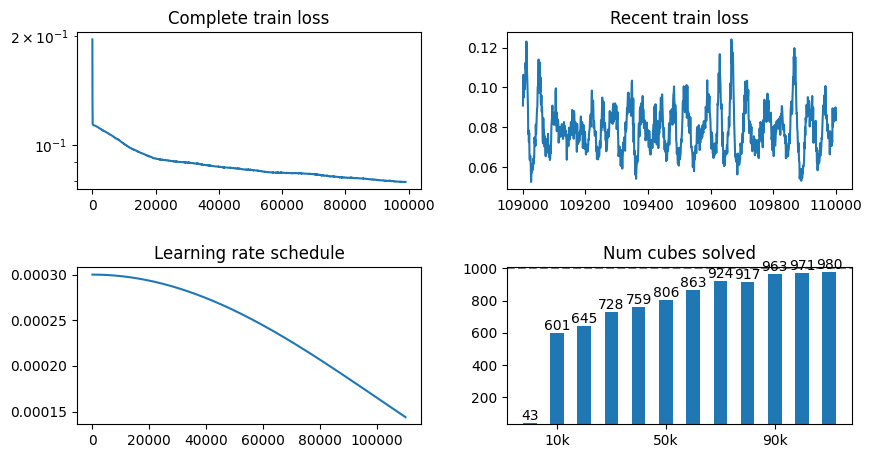

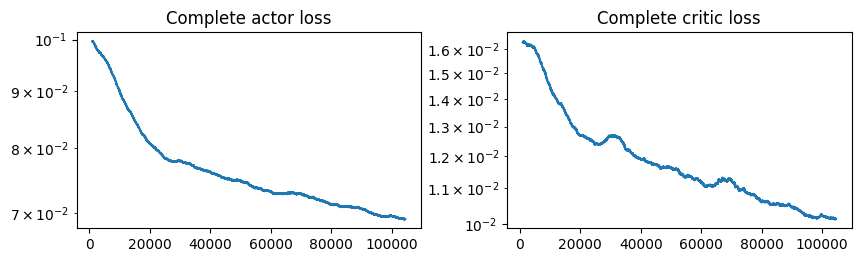

Reached 120000 gradient updates. Time since start: 1:42:49.154627. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=981, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.64000000000006, 'average reward': 0.9964000000000006}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.83999999999997, 'average reward': 0.9683999999999997}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.04000000000008, 'average reward': 0.9604000000000008}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.80000000000008, 'average reward': 0.9380000000000008}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.16000000000014, 'average reward': 0.9216000000000014}, 10: {'num trials': 100, 'num cubes solved': 98, 'total reward': 78.9199999999994, 'average reward':

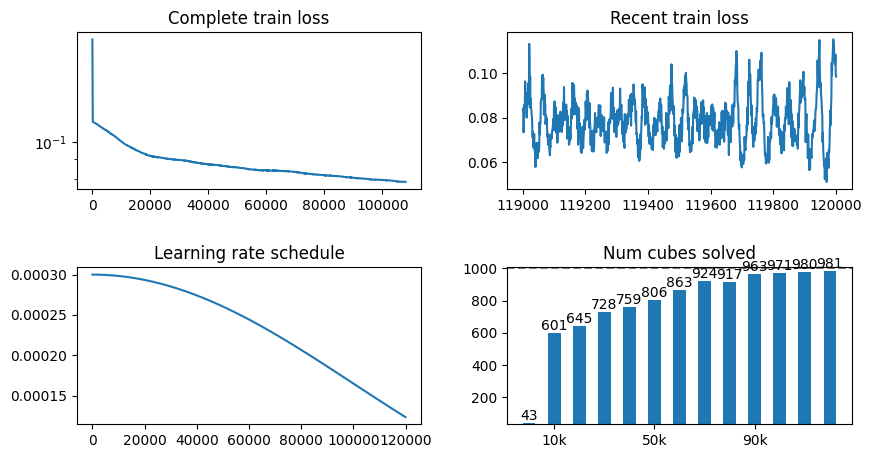

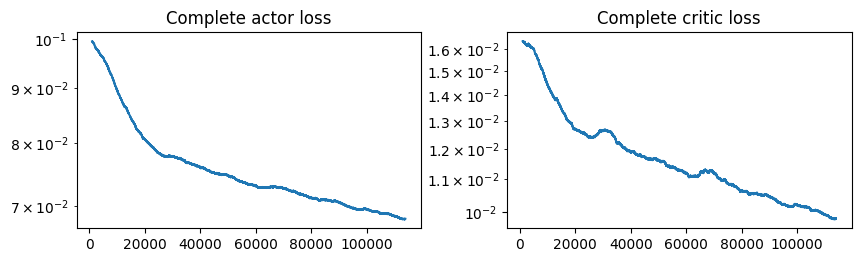

Refreshing replay buffer at step 120000. Will add 2560000 entries.


2560021it [08:38, 4941.78it/s]                             


Reached 130000 gradient updates. Time since start: 1:58:16.493517. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=990, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.8, 'average reward': 0.998}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.0400000000001, 'average reward': 0.970400000000001}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.72000000000011, 'average reward': 0.9572000000000012}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.84000000000012, 'average reward': 0.9384000000000011}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.95999999999994, 'average reward': 0.9295999999999993}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 84.80000000000003, 'average reward': 0.8480000000000003}, 20: 

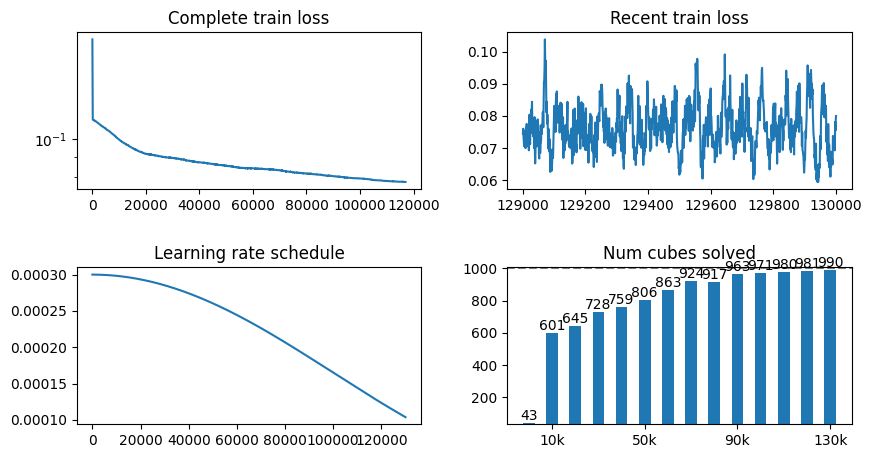

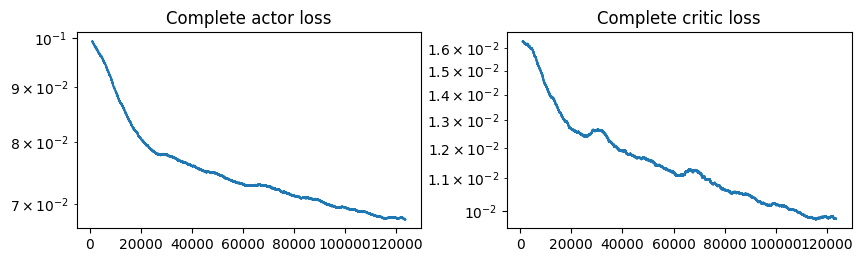

Reached 140000 gradient updates. Time since start: 2:04:56.486410. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=995, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.71999999999997, 'average reward': 0.9971999999999998}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.00000000000004, 'average reward': 0.9700000000000004}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.80000000000005, 'average reward': 0.9580000000000005}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.56000000000026, 'average reward': 0.9356000000000025}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.52000000000024, 'average reward': 0.9252000000000024}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 80.8800000000002, 'average reward'

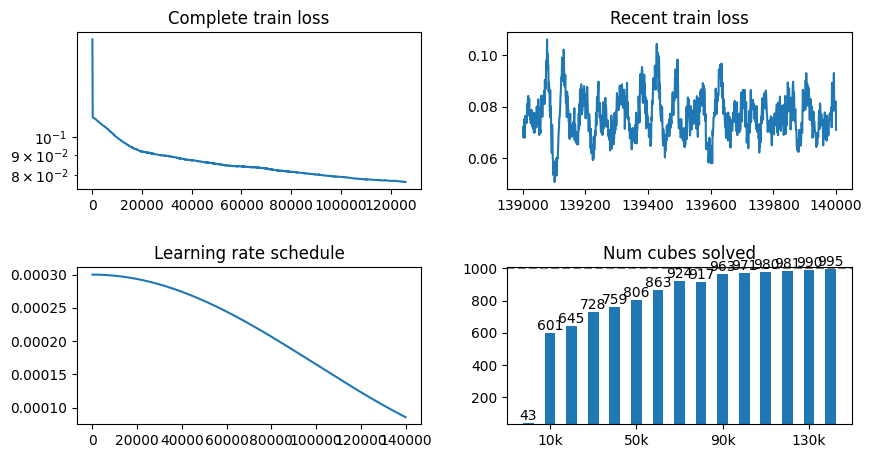

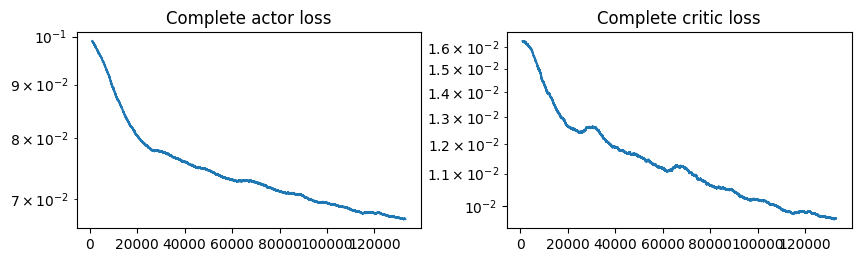

Reached 150000 gradient updates. Time since start: 2:11:36.140354. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=993, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.55999999999997, 'average reward': 0.9955999999999997}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.16000000000001, 'average reward': 0.9716000000000001}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.44000000000007, 'average reward': 0.9544000000000007}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.72000000000016, 'average reward': 0.9372000000000016}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.32000000000006, 'average reward': 0.9232000000000007}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 83.79999999999977, 'average reward

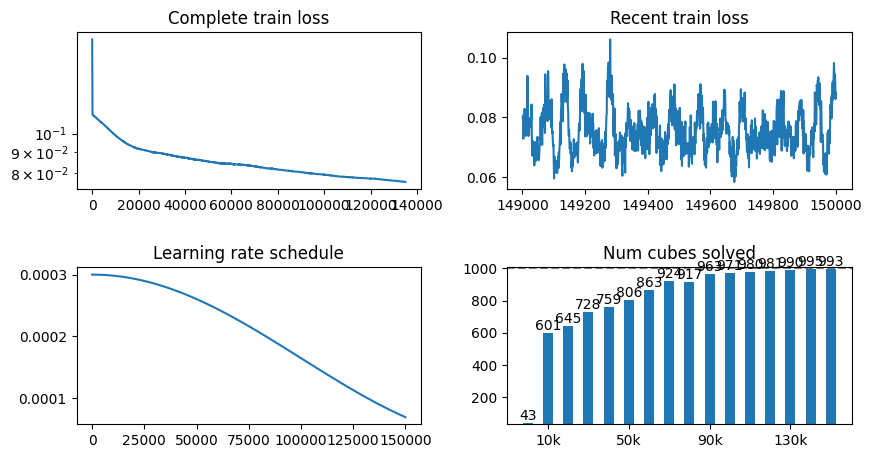

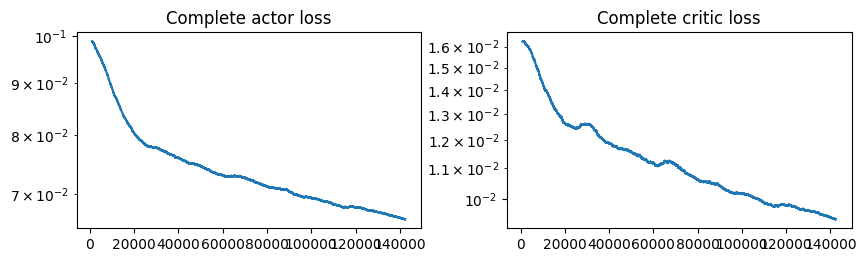

Reached 160000 gradient updates. Time since start: 2:18:14.190650. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=998, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.52000000000004, 'average reward': 0.9952000000000004}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.68000000000002, 'average reward': 0.9668000000000002}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.56000000000006, 'average reward': 0.9556000000000006}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 94.52000000000005, 'average reward': 0.9452000000000005}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.96000000000004, 'average reward': 0.9296000000000003}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 82.59999999999971, 'average reward

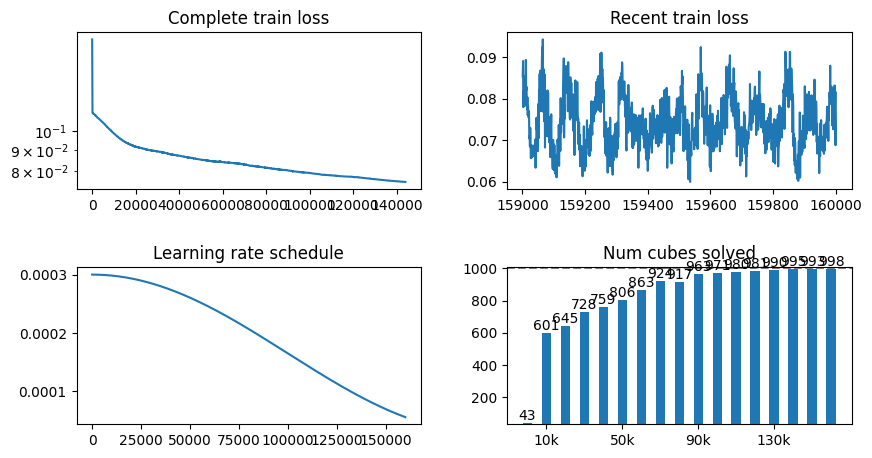

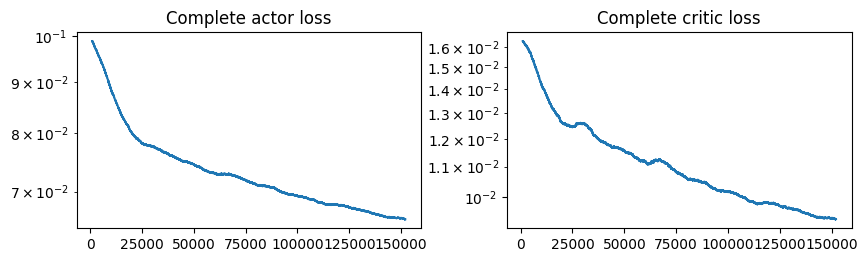

Refreshing replay buffer at step 160000. Will add 2560000 entries.


2560003it [08:31, 5001.86it/s]                             


Reached 170000 gradient updates. Time since start: 2:33:21.262246. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=997, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.52000000000004, 'average reward': 0.9952000000000004}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.60000000000015, 'average reward': 0.9660000000000015}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.1600000000001, 'average reward': 0.961600000000001}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.9600000000001, 'average reward': 0.9396000000000009}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.0400000000001, 'average reward': 0.9204000000000011}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 83.47999999999992, 'average reward': 0

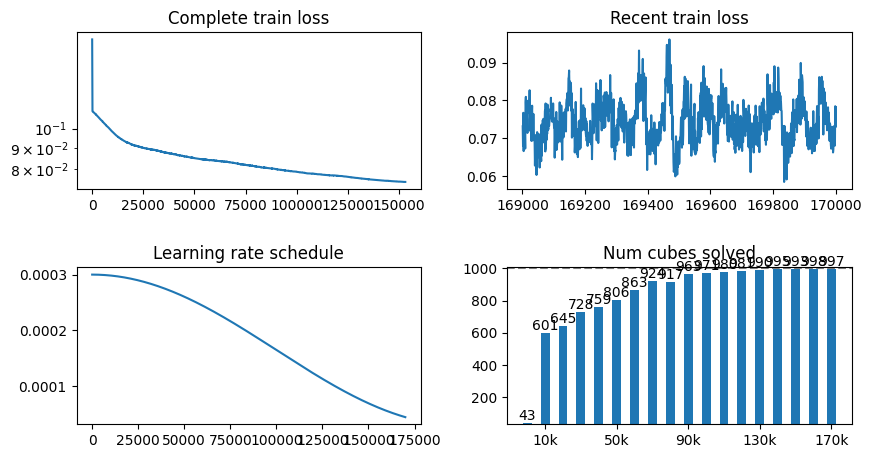

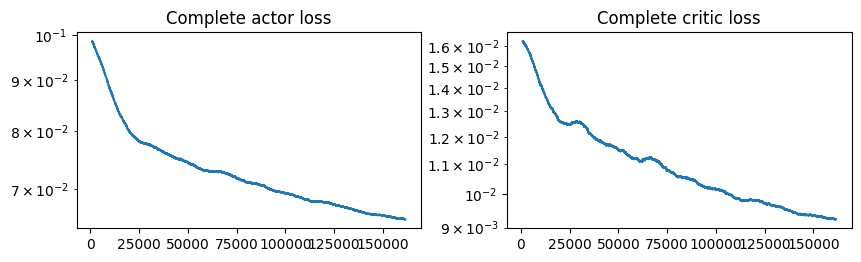

Reached 180000 gradient updates. Time since start: 2:39:57.301446. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=1000, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 98.88, 'average reward': 0.9887999999999999}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.04000000000003, 'average reward': 0.9704000000000004}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.80000000000013, 'average reward': 0.9580000000000013}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.32000000000009, 'average reward': 0.9332000000000009}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.5200000000001, 'average reward': 0.9252000000000009}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 82.36000000000016, 'average reward': 0.8236000

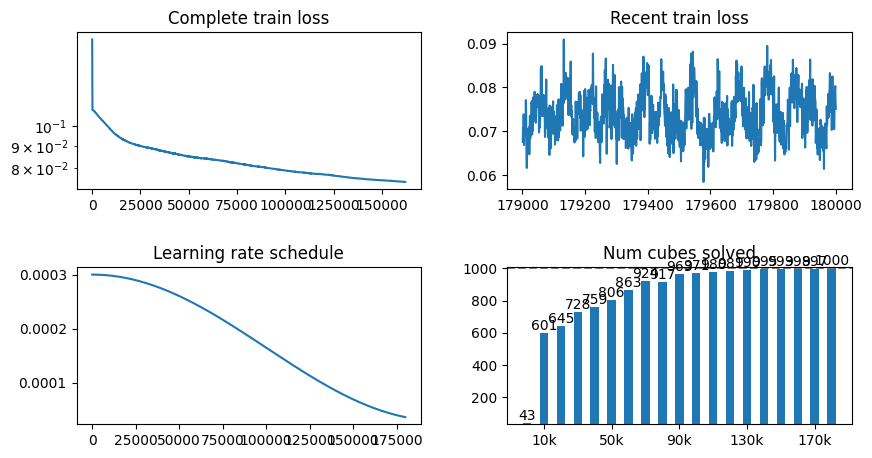

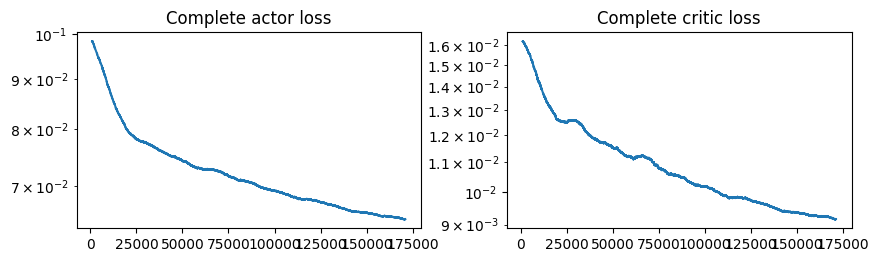

Reached 190000 gradient updates. Time since start: 2:46:31.942066. Online network is in training mode? True. Replay buffer size is 20480000.
Intermediate transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=999, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.20000000000003, 'average reward': 0.9920000000000003}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 96.56000000000007, 'average reward': 0.9656000000000007}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.83999999999995, 'average reward': 0.9583999999999995}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 93.32000000000012, 'average reward': 0.9332000000000013}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 92.44000000000013, 'average reward': 0.9244000000000012}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 85.79999999999994, 'average reward

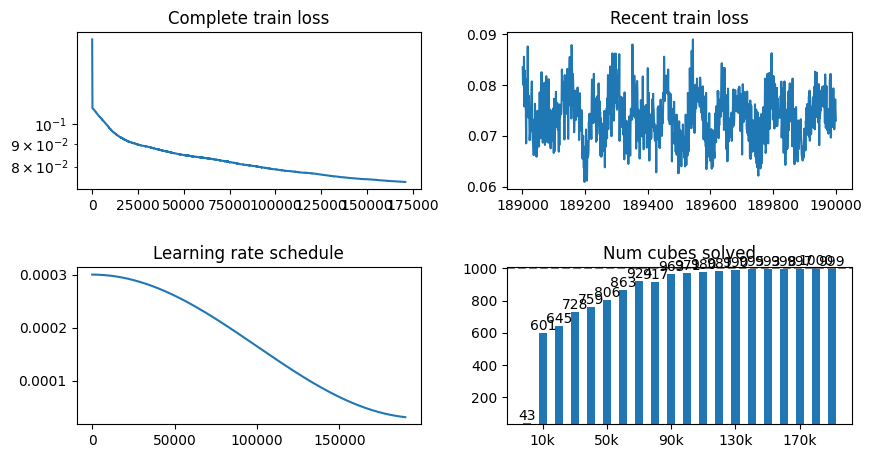

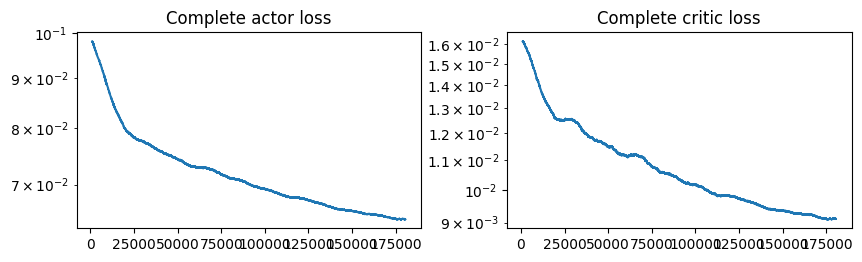

Finished training. Time since start: 2:53:03.489604
Final transformer A2C evaluation metrics were MetricsForAgent(total_cubes_solved=1000, total_cubes_attempted=1000, difficulty_level_to_metrics={1: {'num trials': 100, 'num cubes solved': 100, 'total reward': 99.29999999999995, 'average reward': 0.9929999999999995}, 2: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.57999999999967, 'average reward': 0.9757999999999967}, 3: {'num trials': 100, 'num cubes solved': 100, 'total reward': 97.27999999999969, 'average reward': 0.9727999999999969}, 4: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.67999999999945, 'average reward': 0.9567999999999945}, 5: {'num trials': 100, 'num cubes solved': 100, 'total reward': 95.25999999999944, 'average reward': 0.9525999999999943}, 10: {'num trials': 100, 'num cubes solved': 100, 'total reward': 90.51999999999883, 'average reward': 0.9051999999999883}, 20: {'num trials': 100, 'num cubes solved': 100, 'total reward': 83.899

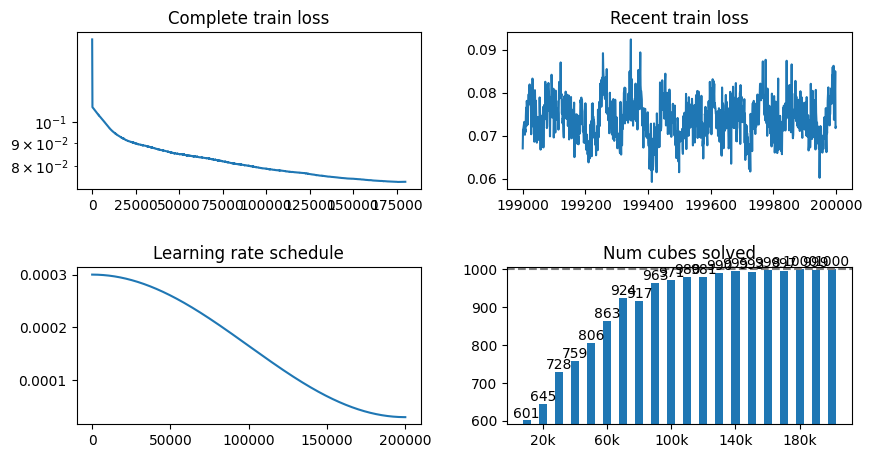

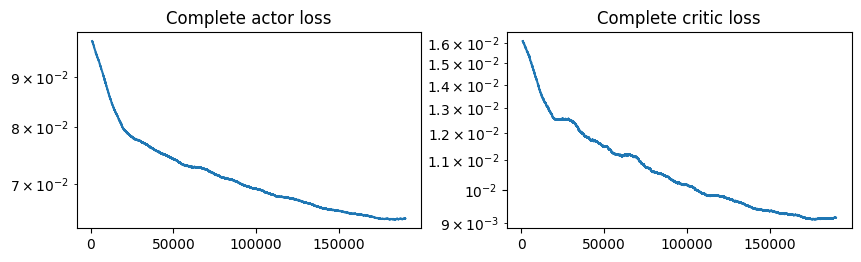

In [ ]:
# Do the actual training.
# Can do 1000 batches of size 512 in ~1m40s on T4 GPU.
# Can do 1000 batches of size 512 in ~40 seconds on V100 GPU.
start = datetime.datetime.now()
print(f"Started training at {start}. Will train for {n_total_steps} batches.")
episode_rewards = []
for gradient_step in range(n_total_steps):
  update_network(agent, replay_buffer, gamma, batch_size)
  scheduler.step()
  lrs.append(scheduler.get_last_lr())

  # Check metrics occasionally.
  if gradient_step % n_eval_steps == 0 and gradient_step > 0:
    print(f"Reached {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}. "
          f"Online network is in training mode? {agent.actor_critic.training}. "
          f"Replay buffer size is {len(replay_buffer.training_examples)}.")
    agent.actor_critic.eval()
    metrics_for_agent = get_metrics_for_agent(agent, env)
    agent.actor_critic.train()
    print(f"Intermediate transformer A2C evaluation metrics were {metrics_for_agent}")
    cubes_solved_counts.append((gradient_step, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
    plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

  # Update the replay buffer occasionally.
  if gradient_step % n_refresh_buffer_steps == 0 and gradient_step > 0:
    num_examples_to_add = replay_buffer.buffer_size // 8
    print(f"Refreshing replay buffer at step {gradient_step}. Will add {num_examples_to_add} entries.")
    add_examples_to_buffer(replay_buffer, num_examples_to_add)

print(f"Finished training. Time since start: {datetime.datetime.now() - start}")

if cubes_solved_counts[-1][0] != n_total_steps:
  agent.actor_critic.eval()
  # Perform final evaluation with more steps and some stochasticity in case agent gets stuck
  # in a cycle of repetitive moves.
  original_max_steps_per_rollout = env.max_steps_per_rollout
  original_epsilon = agent.epsilon
  env.max_steps_per_rollout = 100
  agent.epsilon = .1
  final_metrics_for_agent = get_metrics_for_agent(agent, env)
  env.max_steps_per_rollout = original_max_steps_per_rollout
  agent.epsilon = original_epsilon
  agent.actor_critic.train()
  print(f"Final transformer A2C evaluation metrics were {final_metrics_for_agent}")
  cubes_solved_counts.append((n_total_steps, final_metrics_for_agent.total_cubes_solved))
plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

## Proximal Policy Optimization (PPO)

This version of PPO is very similar to A2C above with some modifications. Instead of using the log probs multiplied by the advantage for the actor loss, we use a clipped ratio between the current policy and an older policy. In this case, our "older policy" is simply a slower moving EMA version of the online policy, essentially the same idea as the target network we had in the DQN section.

We can compare the losses for positive and negative advantage cases with A2C above. Notice how the x-axis is no longer the probability for the action itself but rather the ratio between the new network's probability and the old network's. If the advantage is positive, we punish the network for having a low ratio (i.e. we punish if the new network assigns a lower probability than the old one did). If the advantage is negative, we punish the network for having a high ratio (i.e. the new network says the action is more probable than before). In both cases, we apply clipping to not have any gradient if there was already a very high ratio or very low ratio, respectively. This is done to stabilize training by preventing the new policy from straying too far from the old policy.

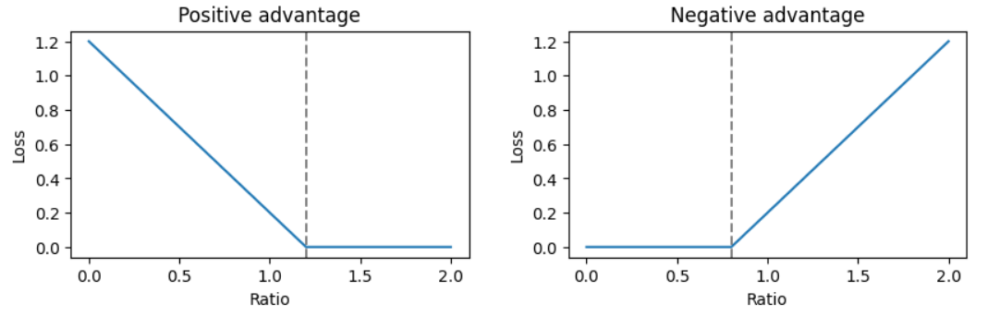



### Transformer Implementation (PyTorch)

This section re-uses the actor-critic backbone from the A2C section, so it is necessary to run the first cell of that section before running this section.

In [ ]:
import datetime
import math
import torch
from torch import autograd, nn, Tensor
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions import Categorical
from tqdm import tqdm

# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device", device)


@dataclasses.dataclass(frozen=False)
class PtTransformerPPOAgent(Agent):
  actor_critic: RubiksTransformer
  epsilon: float
  action_space: gym.Space
  optimizer: optim.Optimizer
  losses: list[float]
  actor_losses: list[float]
  critic_losses: list[float]

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    # We ignore deterministic here, to allow evals to also use some randomness.
    # This tends to be helpful for the deep networks because otherwise they can sometimes
    # get stuck in cycles.
    return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return int(self.get_action_using_actor_policy(state))

  def get_action_using_actor_policy(self, state: np.ndarray) -> torch.Tensor:
    actor_output, _ = self.actor_critic.forward_numpy(state)
    assert actor_output.ndim == 2, f"Expected shape to be [B, A], got {actor_output.shape}"
    m = Categorical(probs=actor_output)
    action = m.sample()  # [B]
    return action

def update_network(
    agent: PtTransformerPPOAgent, old_network: RubiksTransformer, replay_buffer: ReplayBuffer,
    gamma: float, batch_size: int, clip_epsilon: float,
) -> None:
  original_states, actions, rewards, next_states, is_dones, _ = replay_buffer.sample_batch(
      batch_size, deduplicate_batch=True)
  actions = torch.from_numpy(actions).to(device).squeeze()
  rewards = torch.from_numpy(rewards).float().to(device).squeeze()
  is_dones = torch.from_numpy(is_dones).float().to(device).squeeze()

  online_orig_state_action_probs, online_orig_state_values = agent.actor_critic.forward_numpy(
      original_states)
  m = Categorical(probs=online_orig_state_action_probs)
  old_state_action_probs, _ = old_network.forward_numpy(original_states)
  old_state_action_probs.detach()

  _, online_next_state_values = agent.actor_critic.forward_numpy(next_states)
  online_orig_state_values = online_orig_state_values.squeeze()  # [B]
  online_next_state_values = online_next_state_values.squeeze()  # [B]

  advantage = rewards + (gamma * (online_next_state_values * (1 - is_dones))) - online_orig_state_values
  advantage = advantage.detach()
  unclipped_ratio = (
      torch.clamp(online_orig_state_action_probs[torch.arange(online_orig_state_action_probs.shape[0]), actions], min=1e-9) /
      torch.clamp(old_state_action_probs[torch.arange(old_state_action_probs.shape[0]), actions], min=1e-9)
  )  # denominator is clamped to avoid divide-by-zero NaNs.

  # No one else really writes the PPO loss like this, but I found it easier to understand in terms
  # of minimizing the loss. The idea is basically:
  # When advantage is positive:
  # if ratio > 1 + clip_epsilon: loss = 0 else loss = ((1 + clip_epsilon) - ratio) * advantage)
  # When advantage is negative:
  # if ratio < 1 - clip_epsilon: loss = 0 else loss = ((ratio - (1 - clip_epsilon)) * -advantage)
  # I think this should have equivalent gradients to the original formulation.
  positive_advantage_losses = torch.where(
       unclipped_ratio > (1 + clip_epsilon), 0, ((1 + clip_epsilon) - unclipped_ratio) * (advantage))
  # I find that using a smaller value for negative advantage losses stabilizes training, and it will
  # basically always diverge if this coefficient is not set to a value <= 1/3.
  # I further clip the ratio in the negative advantage case to prevent an extremely high ratio
  # distorting the gradient. Clamping to 2 because (1 - clip_epsilon) + (1 + clip_epsilon) = 2.
  negative_advantage_losses = (1/12) * torch.where(
      unclipped_ratio < (1 - clip_epsilon), 0, (torch.clamp(unclipped_ratio, max=2) - (1 - clip_epsilon)) * -(advantage))

  policy_loss = torch.where(advantage >= 0, positive_advantage_losses, negative_advantage_losses).mean()
  value_loss = F.smooth_l1_loss(
      online_orig_state_values,
      rewards + (gamma * (online_next_state_values.detach() * (1 - is_dones))),
  )
  entropy_loss = (1-m.entropy()).mean()

  # These values were set to even out the losses after a bit of empirical experimentation.
  policy_coefficient = .5
  value_coefficient = 2
  entropy_coefficient = .0001
  # Future idea: Add an aux loss to enforce V(s) between the minimum reward and maximum reward?
  loss = (policy_coefficient * policy_loss) + (value_coefficient * value_loss) + (entropy_coefficient * entropy_loss)

  agent.losses.append(loss.item())
  agent.actor_losses.append(policy_loss.item())
  agent.critic_losses.append(value_loss.item())
  # with autograd.detect_anomaly():  can be used if NaNs are suspected during training.
  # Future idea: Gradient clipping to stabilize training.
  agent.optimizer.zero_grad()
  loss.backward()
  agent.optimizer.step()


env = RubiksCube2Env(
    state_type=StateType.TOKENIZED_BLOCKS,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=False,
    allow_easy_initializations=False,
    max_reward=1)

network_kwargs = {
    "num_output_actions": env.action_space.n,
    "sequence_len": env.observation_space.shape[0],
    "vocab_size": env.vocab_size,
    "embed_dim": 256,
    "use_positional_encoding": True,
    "dropout": 0.05,
    "num_encoder_layers": 6,
    "mha_num_heads": 4,
    "dim_feedforward": 1024,
    "activation": 'relu',
}
online_ppo = RubiksTransformer(**network_kwargs).to(device)
online_ppo.train()
target_ppo = RubiksTransformer(**network_kwargs).to(device)
# The algorithm works about equally well regardless if the target is initialized to be the same
# as the online learner or not.
# target_ppo.load_state_dict(online_ppo.state_dict())
target_ppo.eval()
print(online_ppo)
print(f"Param count {sum(param.numel() for param in online_ppo.parameters())}")
print(f"Model is training? {online_ppo.training}")
print(f"Target is training? {target_ppo.training}")
print(f"Observation for test cube is {get_obs_for_test_cube(env)}")

GPU 0: Tesla V100-SXM2-16GB (UUID: GPU-c232f5b3-a2e4-87be-2547-31a7ce9a05e5)
Using device cuda
RubiksTransformer(
  (embed): Embedding(192, 256)
  (pos_encoder): PositionalEncoding(
    (dropout): Dropout(p=0.05, inplace=False)
  )
  (central_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-5): 6 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
        )
        (linear1): Linear(in_features=256, out_features=1024, bias=True)
        (dropout): Dropout(p=0.05, inplace=False)
        (linear2): Linear(in_features=1024, out_features=256, bias=True)
        (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.05, inplace=False)
        (dropout2): Dropout(p=0.05, inplace=False)
      )
    )
  )
  (actor_head): Sequential(
    (0): Linear(in_fea

In [ ]:
# Hyperparameters.
clip_epsilon = .2
gamma = 1
tau = .5
target_network_update_frequency = 200
epsilon = 0
batch_size = 512
n_eval_steps = 10_000
backwards_rollout_fraction = 1  # What percentage of the time to generate rollouts using the backwards rollout strategy.
n_total_steps = 200_000
n_refresh_buffer_steps = 40_000
replay_buffer_size = n_refresh_buffer_steps * batch_size

optimizer = optim.Adam(online_ppo.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=n_total_steps,
    eta_min=3e-5)
lrs = [scheduler.get_last_lr()]
cubes_solved_counts = []

agent = PtTransformerPPOAgent(online_ppo, epsilon, env.action_space, optimizer, [], [], [])

agent.actor_critic.eval()
metrics_for_agent = get_metrics_for_agent(agent, env)
agent.actor_critic.train()
print(f"Untrained transformer PPO evaluation metrics were {metrics_for_agent}")
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

def add_examples_to_buffer(replay_buffer: ReplayBuffer, num_examples_to_add: int) -> None:
  examples_added = 0
  with tqdm(total=num_examples_to_add) as pbar:
    while examples_added < num_examples_to_add:
      r = random.uniform(0, 1)
      if r <= backwards_rollout_fraction:
        rollout, total_reward_for_episode = generate_rollout_backwards(
            agent, env, cap_rollout_steps=45)
      else:
        rollout, total_reward_for_episode = generate_rollout(agent, env)
      replay_buffer.add_samples(rollout)
      examples_added += len(rollout)
      pbar.update(len(rollout))

# Fill the initial training buffer.
replay_buffer = ReplayBuffer(replay_buffer_size)
add_examples_to_buffer(replay_buffer, replay_buffer.buffer_size)

Started training at 2024-02-25 11:55:59.324957. Will train for 200000 batches.
Updating target network after 200 gradient updates. Time since start: 0:00:10.921438
Updating target network after 400 gradient updates. Time since start: 0:00:21.737851
Updating target network after 600 gradient updates. Time since start: 0:00:32.585709
Updating target network after 800 gradient updates. Time since start: 0:00:43.392843
Updating target network after 1000 gradient updates. Time since start: 0:00:54.217516
Updating target network after 1200 gradient updates. Time since start: 0:01:05.040297
Updating target network after 1400 gradient updates. Time since start: 0:01:15.854548
Updating target network after 1600 gradient updates. Time since start: 0:01:26.690425
Updating target network after 1800 gradient updates. Time since start: 0:01:37.495971
Updating target network after 2000 gradient updates. Time since start: 0:01:48.322456
Updating target network after 2200 gradient updates. Time since s

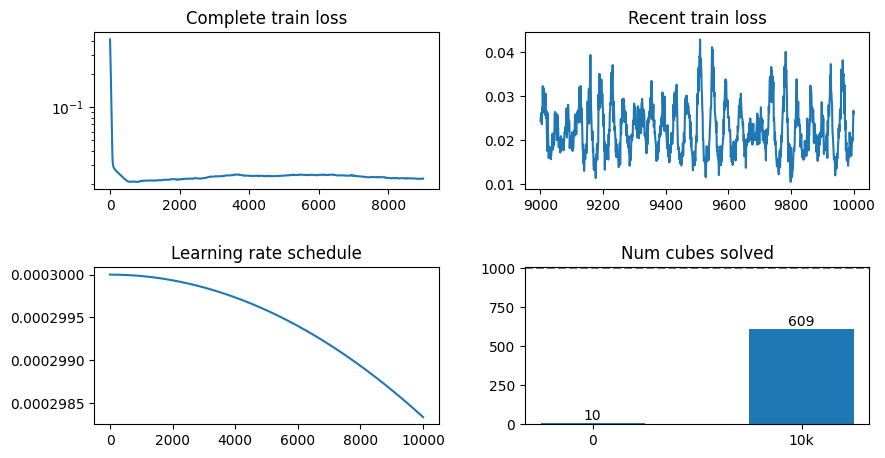

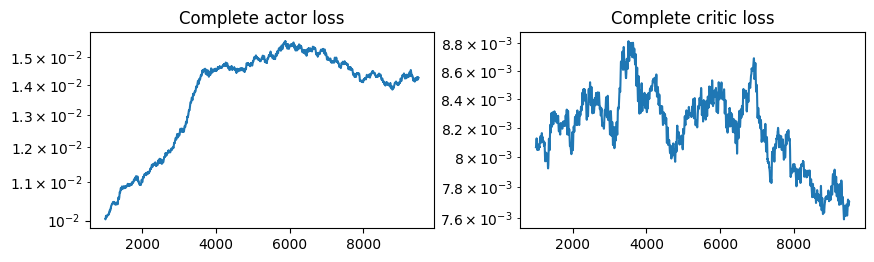

Updating target network after 10200 gradient updates. Time since start: 0:11:26.869878
Updating target network after 10400 gradient updates. Time since start: 0:11:37.681526
Updating target network after 10600 gradient updates. Time since start: 0:11:48.500053
Updating target network after 10800 gradient updates. Time since start: 0:11:59.351048
Updating target network after 11000 gradient updates. Time since start: 0:12:10.153041
Updating target network after 11200 gradient updates. Time since start: 0:12:20.980521
Updating target network after 11400 gradient updates. Time since start: 0:12:31.801703
Updating target network after 11600 gradient updates. Time since start: 0:12:42.621150
Updating target network after 11800 gradient updates. Time since start: 0:12:53.426682
Updating target network after 12000 gradient updates. Time since start: 0:13:04.247478
Updating target network after 12200 gradient updates. Time since start: 0:13:15.055371
Updating target network after 12400 gradien

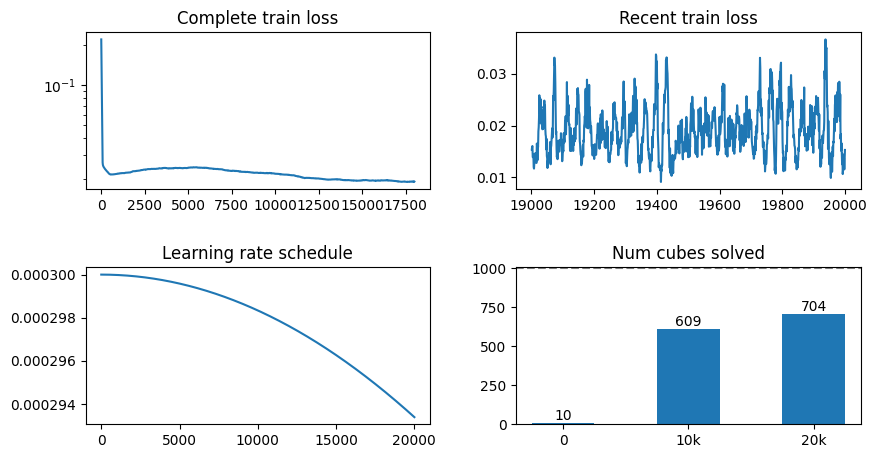

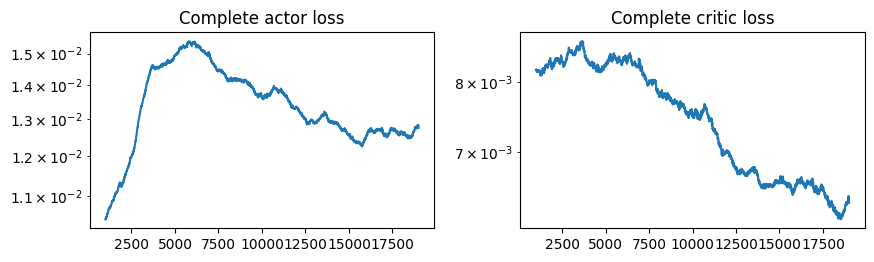

Updating target network after 20200 gradient updates. Time since start: 0:22:22.644831
Updating target network after 20400 gradient updates. Time since start: 0:22:33.435273
Updating target network after 20600 gradient updates. Time since start: 0:22:44.254857
Updating target network after 20800 gradient updates. Time since start: 0:22:55.042494
Updating target network after 21000 gradient updates. Time since start: 0:23:05.843519
Updating target network after 21200 gradient updates. Time since start: 0:23:16.654466
Updating target network after 21400 gradient updates. Time since start: 0:23:27.465139
Updating target network after 21600 gradient updates. Time since start: 0:23:38.314167
Updating target network after 21800 gradient updates. Time since start: 0:23:49.128431
Updating target network after 22000 gradient updates. Time since start: 0:23:59.941105
Updating target network after 22200 gradient updates. Time since start: 0:24:10.754216
Updating target network after 22400 gradien

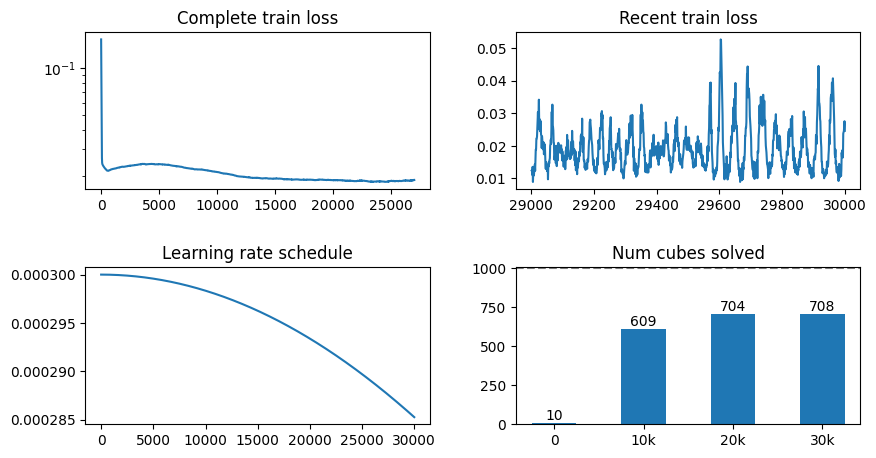

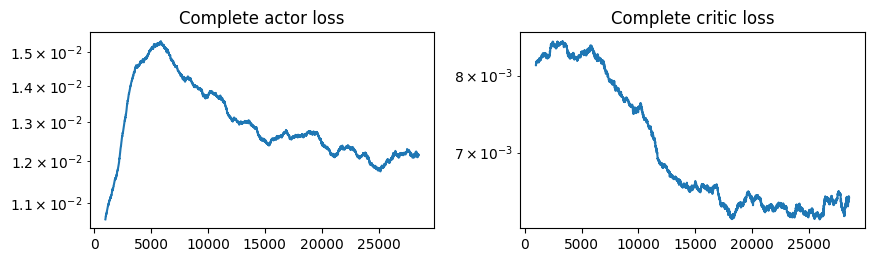

Updating target network after 30200 gradient updates. Time since start: 0:33:18.351248
Updating target network after 30400 gradient updates. Time since start: 0:33:29.140307
Updating target network after 30600 gradient updates. Time since start: 0:33:39.904330
Updating target network after 30800 gradient updates. Time since start: 0:33:50.726765
Updating target network after 31000 gradient updates. Time since start: 0:34:01.551771
Updating target network after 31200 gradient updates. Time since start: 0:34:12.365422
Updating target network after 31400 gradient updates. Time since start: 0:34:23.181448
Updating target network after 31600 gradient updates. Time since start: 0:34:33.980152
Updating target network after 31800 gradient updates. Time since start: 0:34:44.826115
Updating target network after 32000 gradient updates. Time since start: 0:34:55.630894
Updating target network after 32200 gradient updates. Time since start: 0:35:06.419198
Updating target network after 32400 gradien

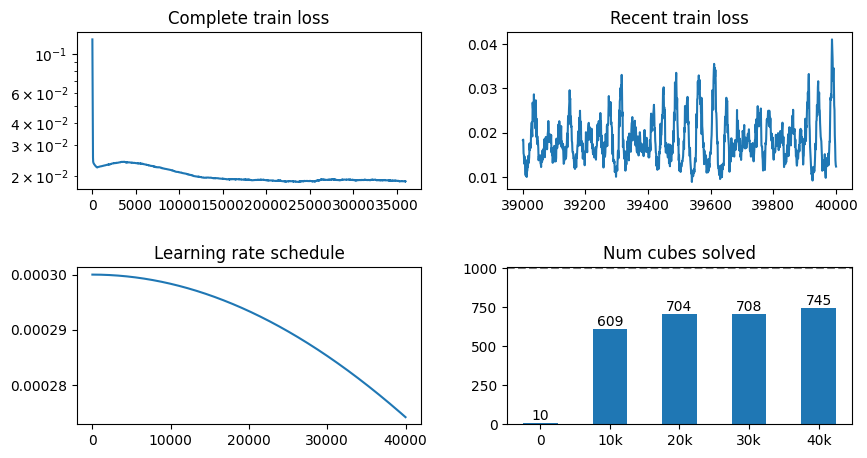

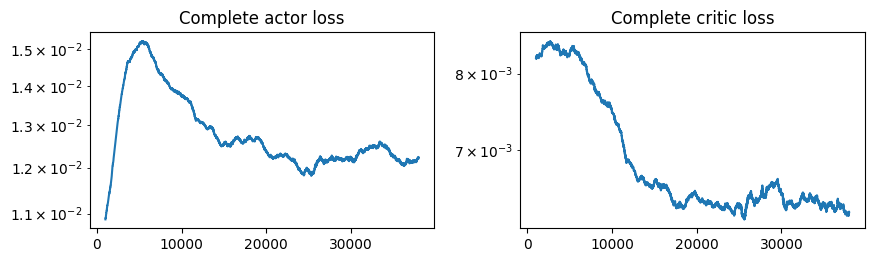

Refreshing replay buffer at step 40000. Will add 2560000 entries.


2560005it [08:28, 5031.93it/s]                             


Updating target network after 40200 gradient updates. Time since start: 0:52:38.063837
Updating target network after 40400 gradient updates. Time since start: 0:52:49.279188
Updating target network after 40600 gradient updates. Time since start: 0:53:00.087248
Updating target network after 40800 gradient updates. Time since start: 0:53:10.885997
Updating target network after 41000 gradient updates. Time since start: 0:53:21.732838
Updating target network after 41200 gradient updates. Time since start: 0:53:32.530970
Updating target network after 41400 gradient updates. Time since start: 0:53:43.341573
Updating target network after 41600 gradient updates. Time since start: 0:53:54.129575
Updating target network after 41800 gradient updates. Time since start: 0:54:04.949720
Updating target network after 42000 gradient updates. Time since start: 0:54:15.774223
Updating target network after 42200 gradient updates. Time since start: 0:54:26.582469
Updating target network after 42400 gradien

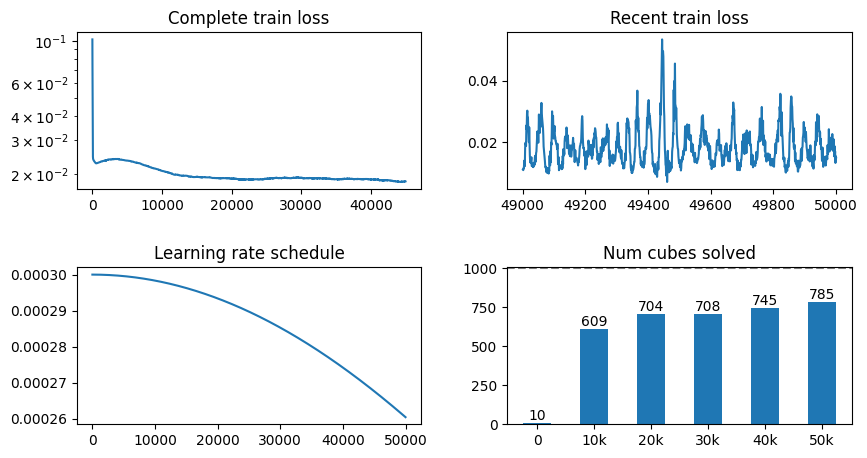

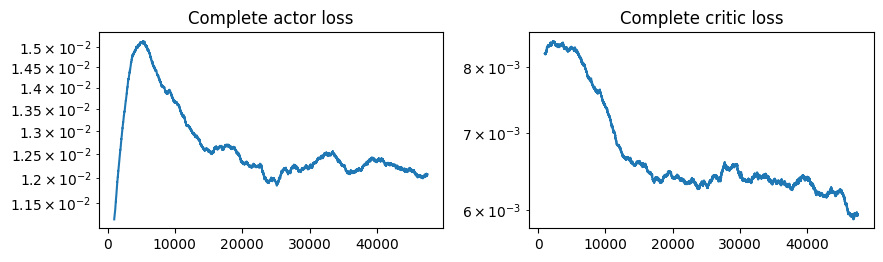

Updating target network after 50200 gradient updates. Time since start: 1:03:32.464959
Updating target network after 50400 gradient updates. Time since start: 1:03:43.291182
Updating target network after 50600 gradient updates. Time since start: 1:03:54.125904
Updating target network after 50800 gradient updates. Time since start: 1:04:04.972671
Updating target network after 51000 gradient updates. Time since start: 1:04:15.819483
Updating target network after 51200 gradient updates. Time since start: 1:04:26.663611
Updating target network after 51400 gradient updates. Time since start: 1:04:37.462719
Updating target network after 51600 gradient updates. Time since start: 1:04:48.277492
Updating target network after 51800 gradient updates. Time since start: 1:04:59.150752
Updating target network after 52000 gradient updates. Time since start: 1:05:10.017737
Updating target network after 52200 gradient updates. Time since start: 1:05:20.856264
Updating target network after 52400 gradien

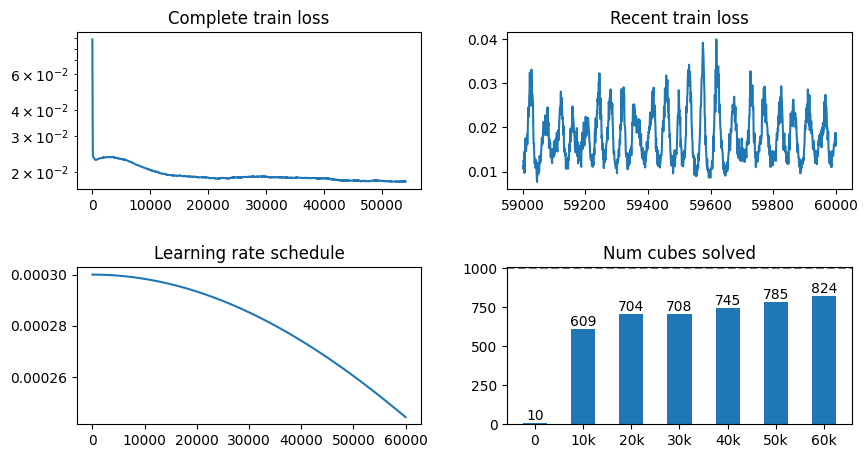

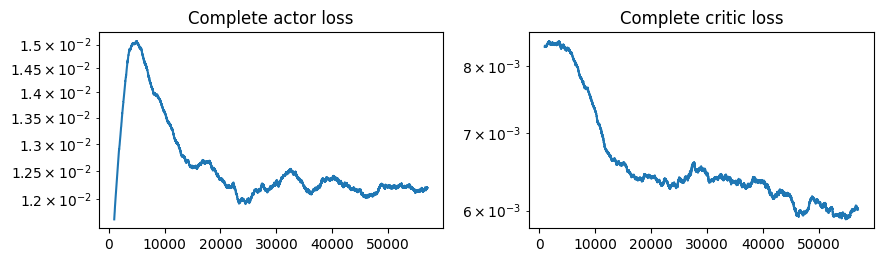

Updating target network after 60200 gradient updates. Time since start: 1:14:09.114452
Updating target network after 60400 gradient updates. Time since start: 1:14:19.938305
Updating target network after 60600 gradient updates. Time since start: 1:14:30.734789
Updating target network after 60800 gradient updates. Time since start: 1:14:41.533413
Updating target network after 61000 gradient updates. Time since start: 1:14:52.322083
Updating target network after 61200 gradient updates. Time since start: 1:15:03.122712
Updating target network after 61400 gradient updates. Time since start: 1:15:13.927673
Updating target network after 61600 gradient updates. Time since start: 1:15:24.750636
Updating target network after 61800 gradient updates. Time since start: 1:15:35.596223
Updating target network after 62000 gradient updates. Time since start: 1:15:46.420207
Updating target network after 62200 gradient updates. Time since start: 1:15:57.220757
Updating target network after 62400 gradien

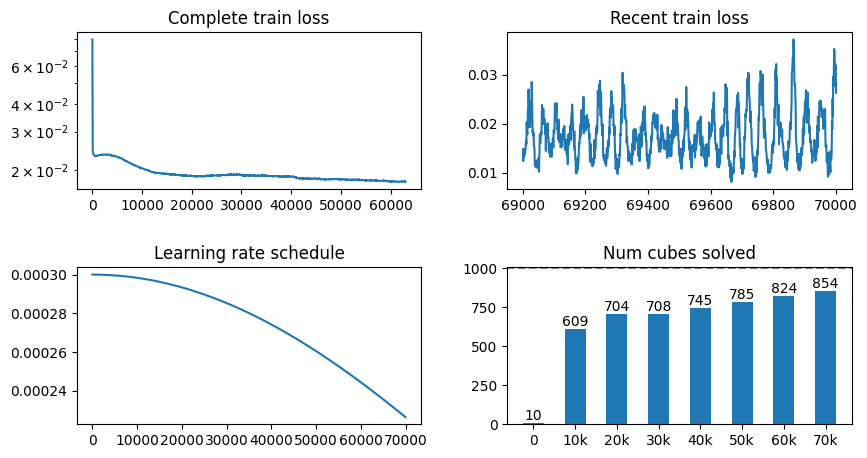

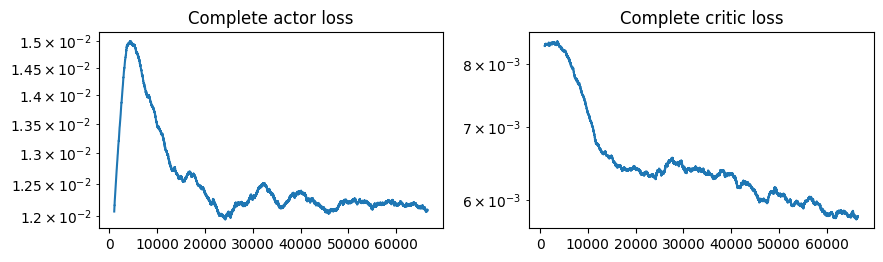

Updating target network after 70200 gradient updates. Time since start: 1:24:40.698123
Updating target network after 70400 gradient updates. Time since start: 1:24:51.513745
Updating target network after 70600 gradient updates. Time since start: 1:25:02.311865
Updating target network after 70800 gradient updates. Time since start: 1:25:13.128766
Updating target network after 71000 gradient updates. Time since start: 1:25:23.939958
Updating target network after 71200 gradient updates. Time since start: 1:25:34.782317
Updating target network after 71400 gradient updates. Time since start: 1:25:45.610577
Updating target network after 71600 gradient updates. Time since start: 1:25:56.427685
Updating target network after 71800 gradient updates. Time since start: 1:26:07.216785
Updating target network after 72000 gradient updates. Time since start: 1:26:18.026689
Updating target network after 72200 gradient updates. Time since start: 1:26:28.857504
Updating target network after 72400 gradien

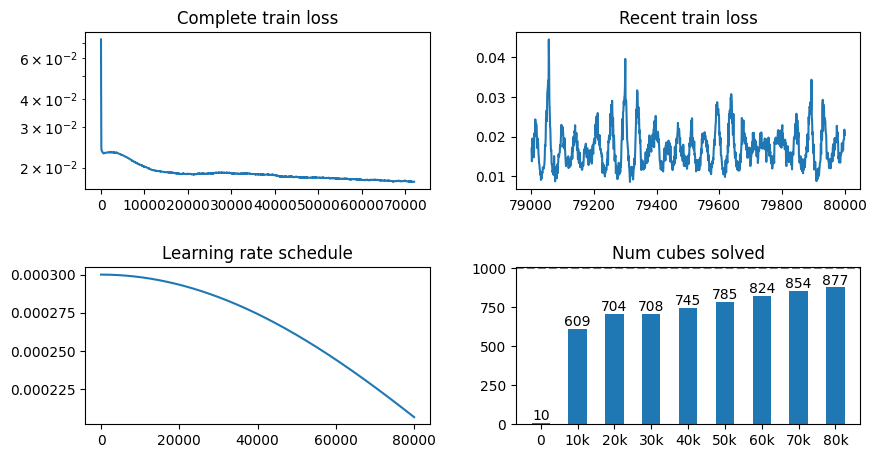

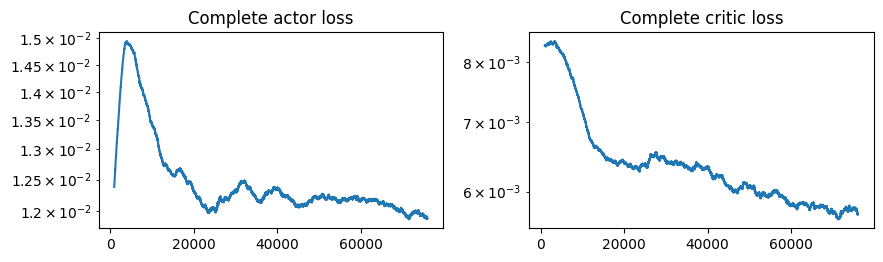

Refreshing replay buffer at step 80000. Will add 2560000 entries.


2560004it [08:27, 5043.97it/s]                             


Updating target network after 80200 gradient updates. Time since start: 1:43:31.991805
Updating target network after 80400 gradient updates. Time since start: 1:43:43.185799
Updating target network after 80600 gradient updates. Time since start: 1:43:54.001986
Updating target network after 80800 gradient updates. Time since start: 1:44:04.820633
Updating target network after 81000 gradient updates. Time since start: 1:44:15.617125
Updating target network after 81200 gradient updates. Time since start: 1:44:26.425010
Updating target network after 81400 gradient updates. Time since start: 1:44:37.231022
Updating target network after 81600 gradient updates. Time since start: 1:44:48.037627
Updating target network after 81800 gradient updates. Time since start: 1:44:58.846058
Updating target network after 82000 gradient updates. Time since start: 1:45:09.647519
Updating target network after 82200 gradient updates. Time since start: 1:45:20.462447
Updating target network after 82400 gradien

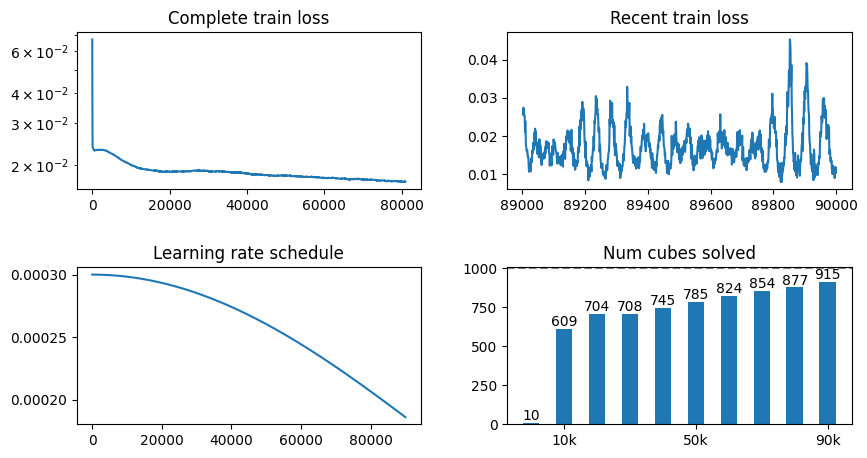

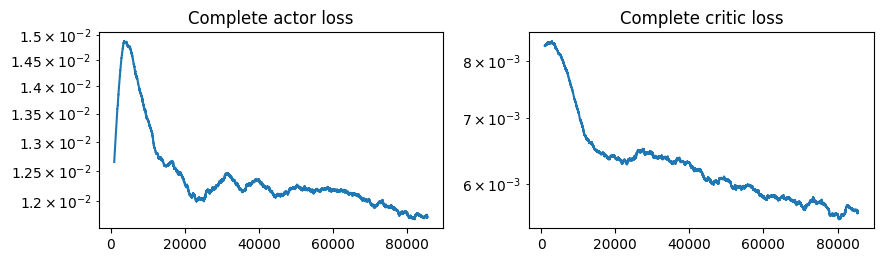

Updating target network after 90200 gradient updates. Time since start: 1:53:50.395010
Updating target network after 90400 gradient updates. Time since start: 1:54:01.216417
Updating target network after 90600 gradient updates. Time since start: 1:54:12.035895
Updating target network after 90800 gradient updates. Time since start: 1:54:22.883683
Updating target network after 91000 gradient updates. Time since start: 1:54:33.731014
Updating target network after 91200 gradient updates. Time since start: 1:54:44.556947
Updating target network after 91400 gradient updates. Time since start: 1:54:55.344739
Updating target network after 91600 gradient updates. Time since start: 1:55:06.149011
Updating target network after 91800 gradient updates. Time since start: 1:55:16.959741
Updating target network after 92000 gradient updates. Time since start: 1:55:27.771560
Updating target network after 92200 gradient updates. Time since start: 1:55:38.576511
Updating target network after 92400 gradien

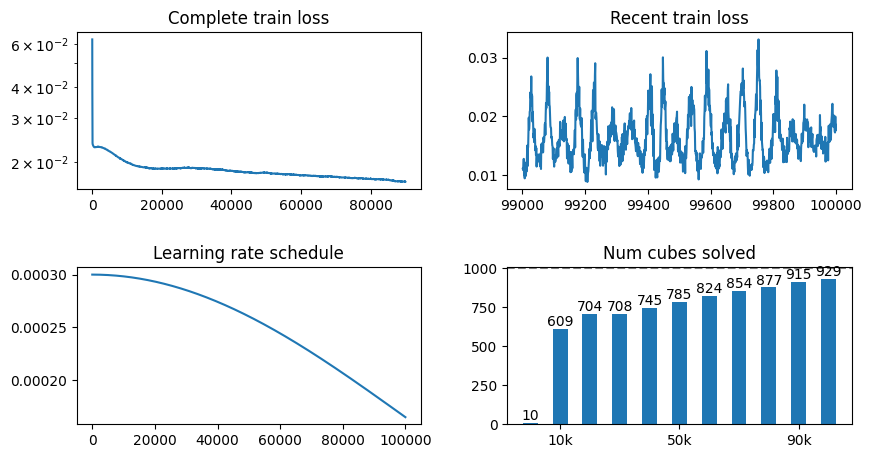

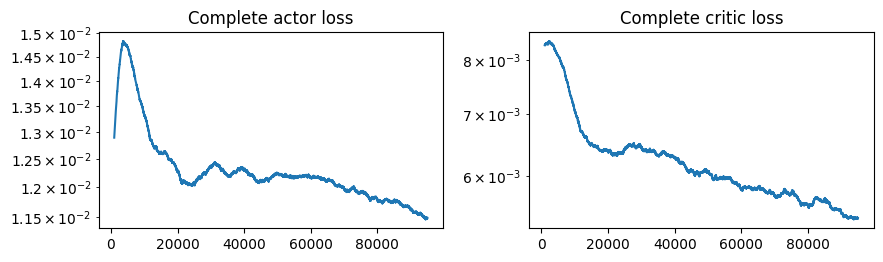

Updating target network after 100200 gradient updates. Time since start: 2:04:02.201897
Updating target network after 100400 gradient updates. Time since start: 2:04:13.013046
Updating target network after 100600 gradient updates. Time since start: 2:04:23.884808
Updating target network after 100800 gradient updates. Time since start: 2:04:34.698024
Updating target network after 101000 gradient updates. Time since start: 2:04:45.549332
Updating target network after 101200 gradient updates. Time since start: 2:04:56.384861
Updating target network after 101400 gradient updates. Time since start: 2:05:07.248360
Updating target network after 101600 gradient updates. Time since start: 2:05:18.097185
Updating target network after 101800 gradient updates. Time since start: 2:05:28.980863
Updating target network after 102000 gradient updates. Time since start: 2:05:39.856649
Updating target network after 102200 gradient updates. Time since start: 2:05:50.710844
Updating target network after 10

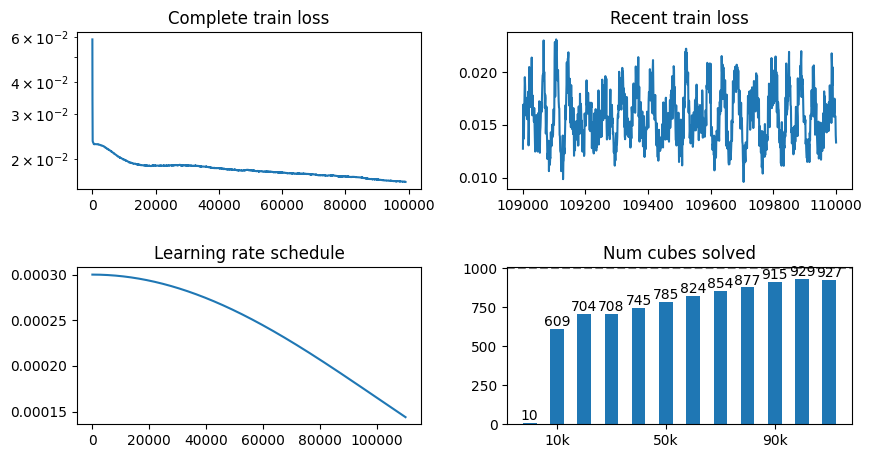

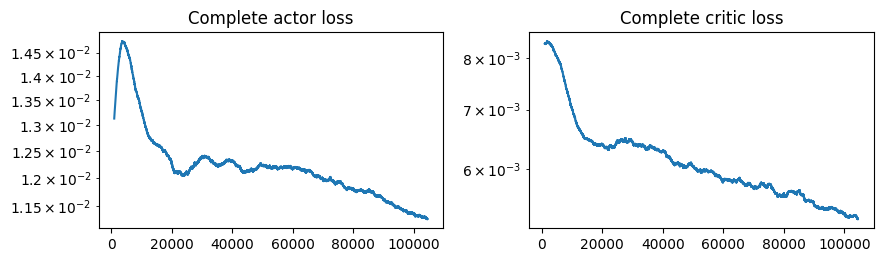

Updating target network after 110200 gradient updates. Time since start: 2:14:19.179270
Updating target network after 110400 gradient updates. Time since start: 2:14:29.973682
Updating target network after 110600 gradient updates. Time since start: 2:14:40.774515
Updating target network after 110800 gradient updates. Time since start: 2:14:51.574229
Updating target network after 111000 gradient updates. Time since start: 2:15:02.385777
Updating target network after 111200 gradient updates. Time since start: 2:15:13.193626
Updating target network after 111400 gradient updates. Time since start: 2:15:24.007718
Updating target network after 111600 gradient updates. Time since start: 2:15:34.814800
Updating target network after 111800 gradient updates. Time since start: 2:15:45.609511
Updating target network after 112000 gradient updates. Time since start: 2:15:56.390304
Updating target network after 112200 gradient updates. Time since start: 2:16:07.160111
Updating target network after 11

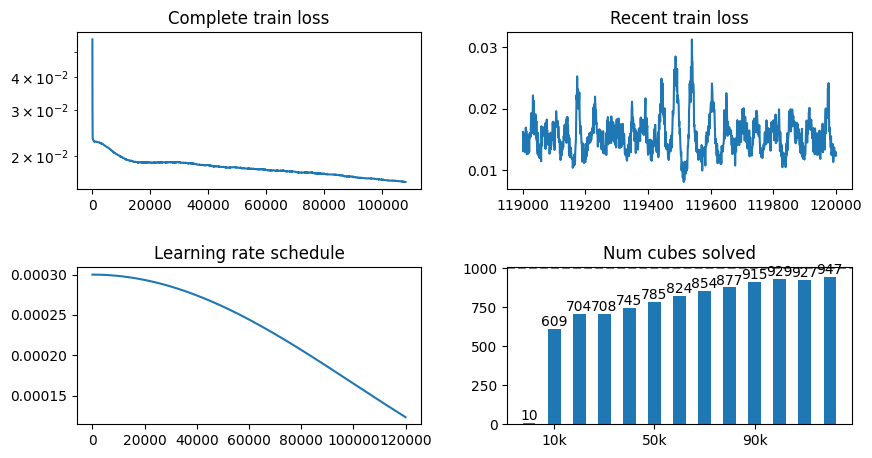

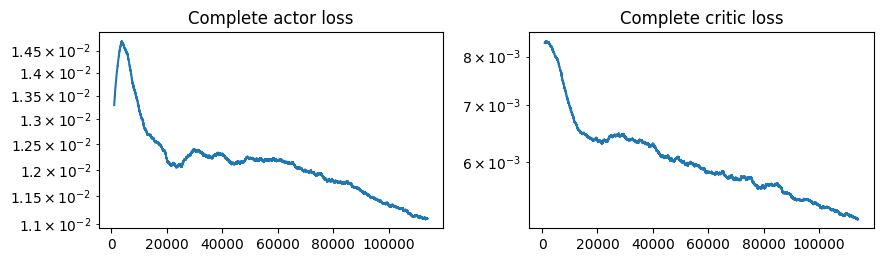

Refreshing replay buffer at step 120000. Will add 2560000 entries.


2560042it [08:34, 4975.83it/s]                             


Updating target network after 120200 gradient updates. Time since start: 2:33:02.891218
Updating target network after 120400 gradient updates. Time since start: 2:33:13.672888
Updating target network after 120600 gradient updates. Time since start: 2:33:24.877522
Updating target network after 120800 gradient updates. Time since start: 2:33:35.655332
Updating target network after 121000 gradient updates. Time since start: 2:33:46.442122
Updating target network after 121200 gradient updates. Time since start: 2:33:57.245369
Updating target network after 121400 gradient updates. Time since start: 2:34:08.012754
Updating target network after 121600 gradient updates. Time since start: 2:34:18.775575
Updating target network after 121800 gradient updates. Time since start: 2:34:30.045555
Updating target network after 122000 gradient updates. Time since start: 2:34:40.836030
Updating target network after 122200 gradient updates. Time since start: 2:34:51.643077
Updating target network after 12

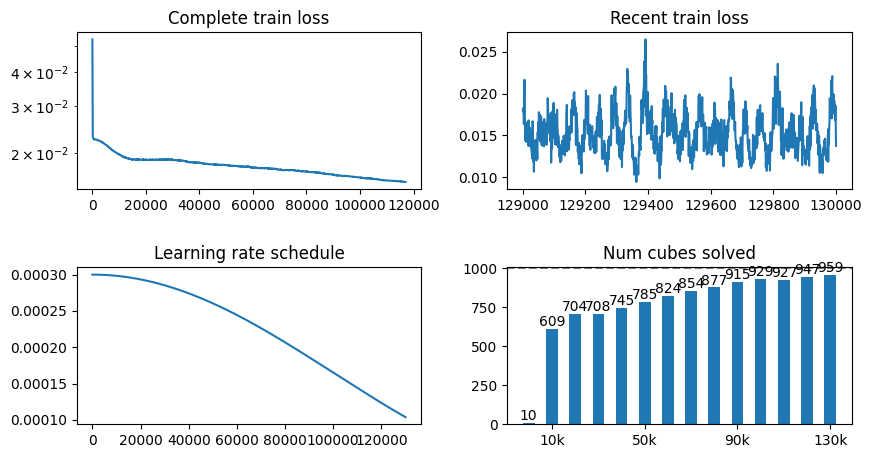

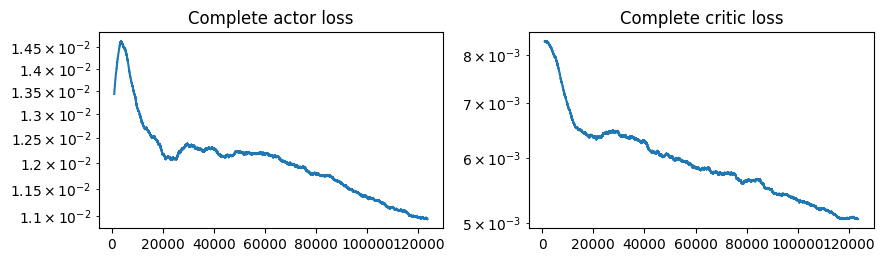

Updating target network after 130200 gradient updates. Time since start: 2:43:16.546007
Updating target network after 130400 gradient updates. Time since start: 2:43:27.421809
Updating target network after 130600 gradient updates. Time since start: 2:43:38.275627
Updating target network after 130800 gradient updates. Time since start: 2:43:49.110984
Updating target network after 131000 gradient updates. Time since start: 2:43:59.956281
Updating target network after 131200 gradient updates. Time since start: 2:44:10.844534
Updating target network after 131400 gradient updates. Time since start: 2:44:21.725921
Updating target network after 131600 gradient updates. Time since start: 2:44:32.591557
Updating target network after 131800 gradient updates. Time since start: 2:44:43.467218
Updating target network after 132000 gradient updates. Time since start: 2:44:54.328032
Updating target network after 132200 gradient updates. Time since start: 2:45:05.220294
Updating target network after 13

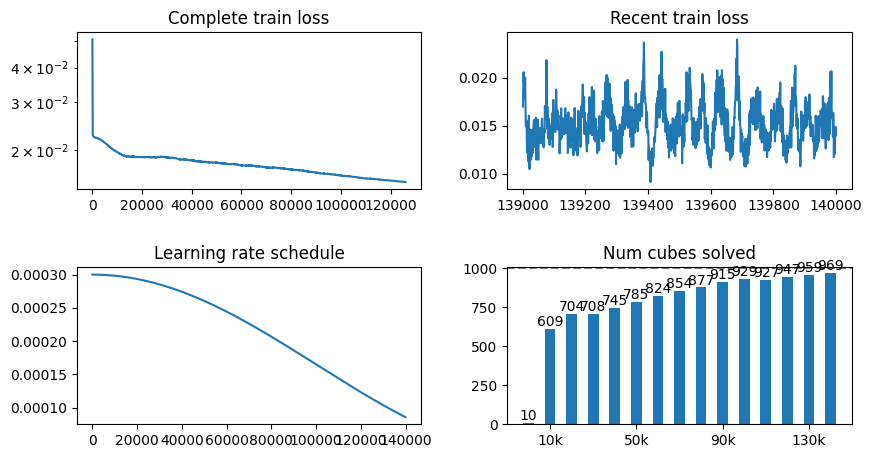

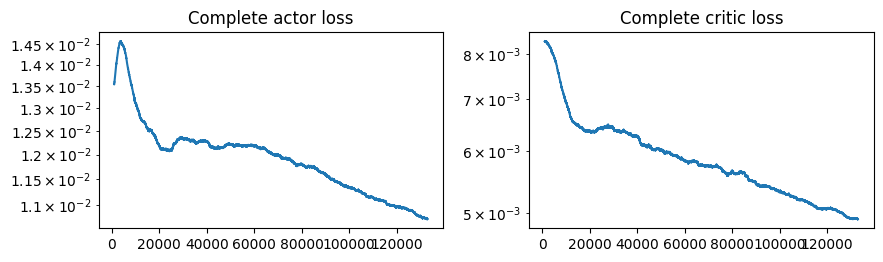

Updating target network after 140200 gradient updates. Time since start: 2:53:23.221832
Updating target network after 140400 gradient updates. Time since start: 2:53:34.061719
Updating target network after 140600 gradient updates. Time since start: 2:53:44.902882
Updating target network after 140800 gradient updates. Time since start: 2:53:55.717945
Updating target network after 141000 gradient updates. Time since start: 2:54:06.529811
Updating target network after 141200 gradient updates. Time since start: 2:54:17.345039
Updating target network after 141400 gradient updates. Time since start: 2:54:28.181573
Updating target network after 141600 gradient updates. Time since start: 2:54:39.009483
Updating target network after 141800 gradient updates. Time since start: 2:54:49.864531
Updating target network after 142000 gradient updates. Time since start: 2:55:00.761378
Updating target network after 142200 gradient updates. Time since start: 2:55:11.638336
Updating target network after 14

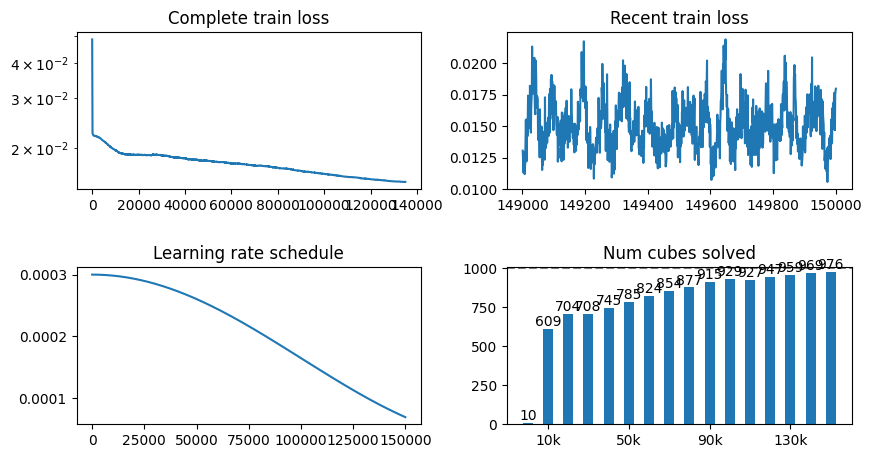

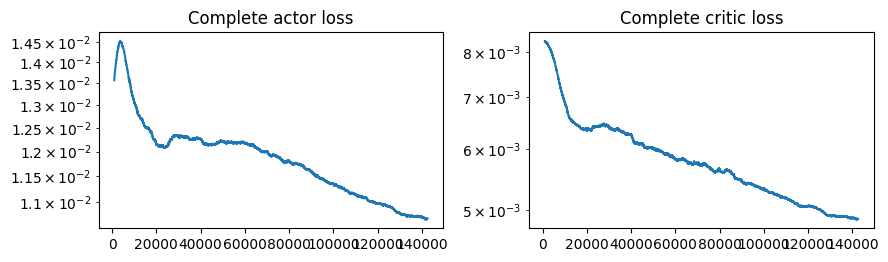

Updating target network after 150200 gradient updates. Time since start: 3:03:27.983173
Updating target network after 150400 gradient updates. Time since start: 3:03:38.860845
Updating target network after 150600 gradient updates. Time since start: 3:03:49.683886
Updating target network after 150800 gradient updates. Time since start: 3:04:00.505708
Updating target network after 151000 gradient updates. Time since start: 3:04:11.333068
Updating target network after 151200 gradient updates. Time since start: 3:04:22.171860
Updating target network after 151400 gradient updates. Time since start: 3:04:33.011085
Updating target network after 151600 gradient updates. Time since start: 3:04:43.845112
Updating target network after 151800 gradient updates. Time since start: 3:04:54.672670
Updating target network after 152000 gradient updates. Time since start: 3:05:05.477823
Updating target network after 152200 gradient updates. Time since start: 3:05:16.298111
Updating target network after 15

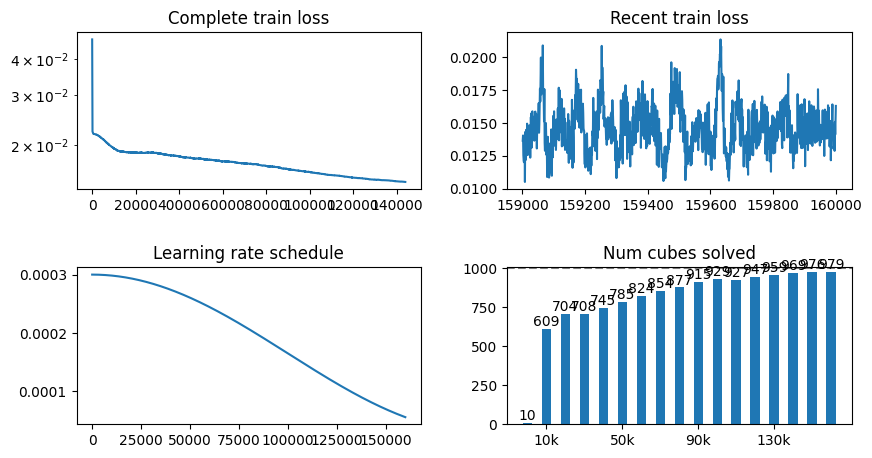

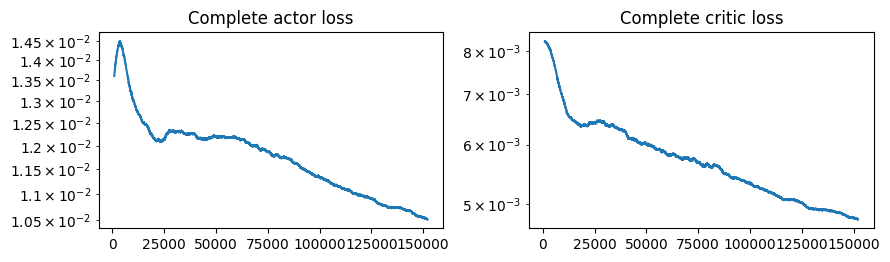

Refreshing replay buffer at step 160000. Will add 2560000 entries.


2560017it [08:33, 4981.59it/s]                             


Updating target network after 160200 gradient updates. Time since start: 3:22:04.417577
Updating target network after 160400 gradient updates. Time since start: 3:22:15.218807
Updating target network after 160600 gradient updates. Time since start: 3:22:26.032755
Updating target network after 160800 gradient updates. Time since start: 3:22:36.848110
Updating target network after 161000 gradient updates. Time since start: 3:22:47.641720
Updating target network after 161200 gradient updates. Time since start: 3:22:58.446133
Updating target network after 161400 gradient updates. Time since start: 3:23:09.248107
Updating target network after 161600 gradient updates. Time since start: 3:23:20.066728
Updating target network after 161800 gradient updates. Time since start: 3:23:30.885522
Updating target network after 162000 gradient updates. Time since start: 3:23:41.711400
Updating target network after 162200 gradient updates. Time since start: 3:23:52.560555
Updating target network after 16

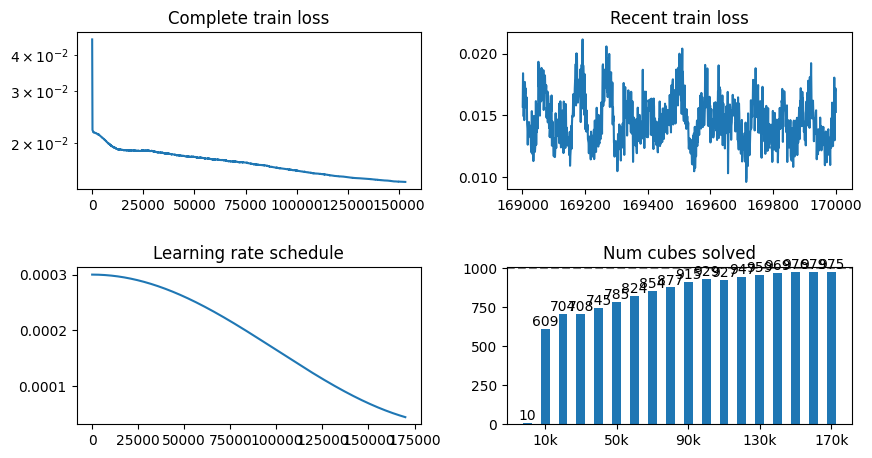

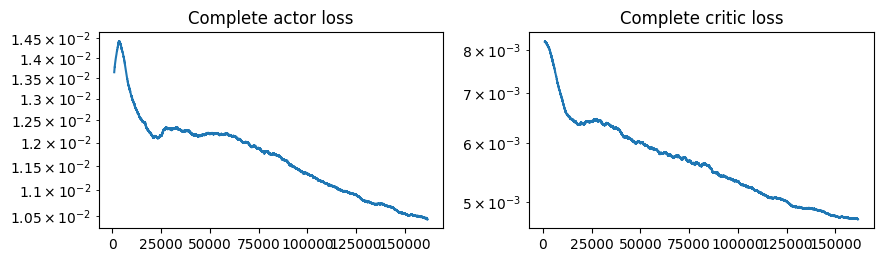

Updating target network after 170200 gradient updates. Time since start: 3:32:02.176632
Updating target network after 170400 gradient updates. Time since start: 3:32:12.983198
Updating target network after 170600 gradient updates. Time since start: 3:32:23.817511
Updating target network after 170800 gradient updates. Time since start: 3:32:34.604160
Updating target network after 171000 gradient updates. Time since start: 3:32:45.396787
Updating target network after 171200 gradient updates. Time since start: 3:32:56.206267
Updating target network after 171400 gradient updates. Time since start: 3:33:07.018671
Updating target network after 171600 gradient updates. Time since start: 3:33:17.833332
Updating target network after 171800 gradient updates. Time since start: 3:33:28.639636
Updating target network after 172000 gradient updates. Time since start: 3:33:39.448323
Updating target network after 172200 gradient updates. Time since start: 3:33:50.252735
Updating target network after 17

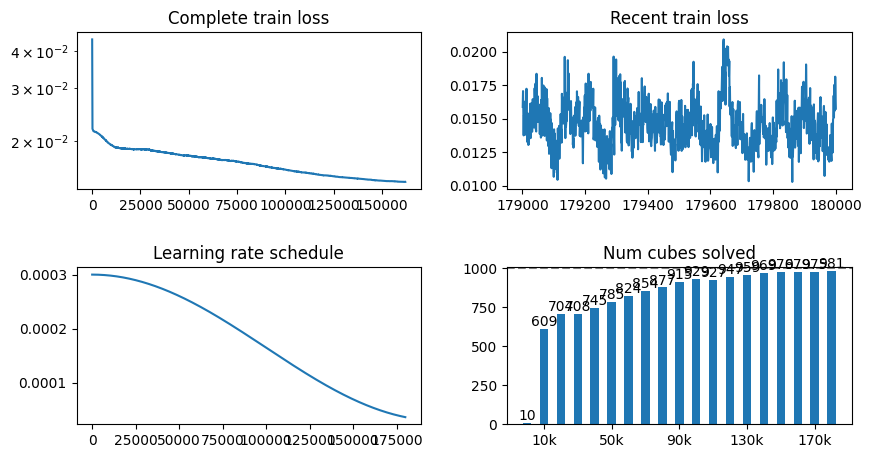

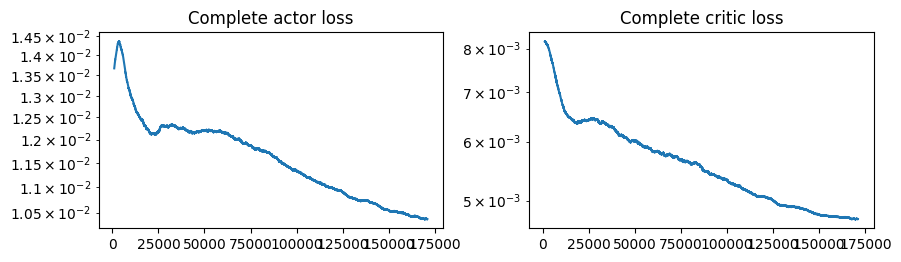

Updating target network after 180200 gradient updates. Time since start: 3:42:00.665672
Updating target network after 180400 gradient updates. Time since start: 3:42:11.483296
Updating target network after 180600 gradient updates. Time since start: 3:42:22.323434
Updating target network after 180800 gradient updates. Time since start: 3:42:33.133187
Updating target network after 181000 gradient updates. Time since start: 3:42:43.942438
Updating target network after 181200 gradient updates. Time since start: 3:42:54.768062
Updating target network after 181400 gradient updates. Time since start: 3:43:05.591230
Updating target network after 181600 gradient updates. Time since start: 3:43:16.385349
Updating target network after 181800 gradient updates. Time since start: 3:43:27.214545
Updating target network after 182000 gradient updates. Time since start: 3:43:38.028617
Updating target network after 182200 gradient updates. Time since start: 3:43:48.844637
Updating target network after 18

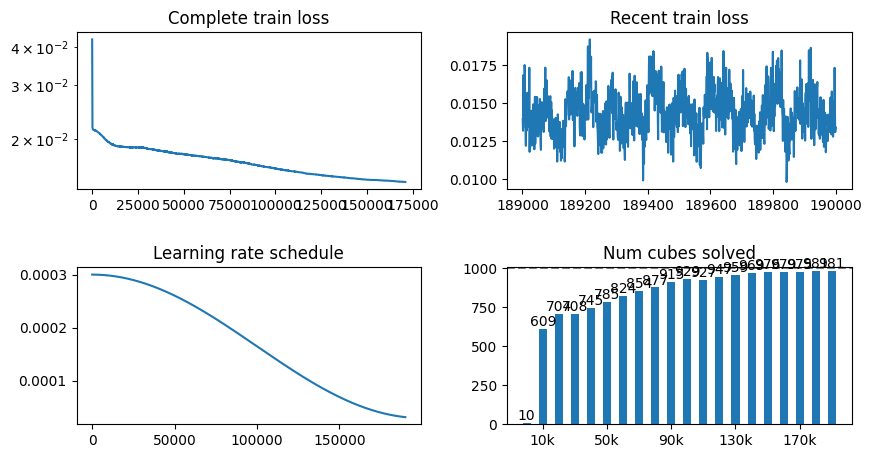

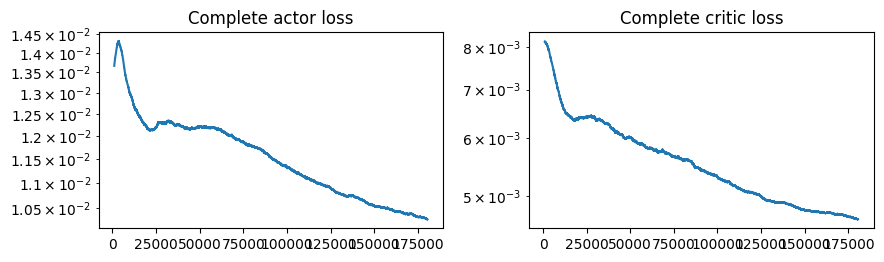

Updating target network after 190200 gradient updates. Time since start: 3:51:58.043510
Updating target network after 190400 gradient updates. Time since start: 3:52:08.940555
Updating target network after 190600 gradient updates. Time since start: 3:52:19.829446
Updating target network after 190800 gradient updates. Time since start: 3:52:30.733815
Updating target network after 191000 gradient updates. Time since start: 3:52:41.600358
Updating target network after 191200 gradient updates. Time since start: 3:52:52.509543
Updating target network after 191400 gradient updates. Time since start: 3:53:03.397551
Updating target network after 191600 gradient updates. Time since start: 3:53:14.289640
Updating target network after 191800 gradient updates. Time since start: 3:53:25.131062
Updating target network after 192000 gradient updates. Time since start: 3:53:35.893080
Updating target network after 192200 gradient updates. Time since start: 3:53:46.666870
Updating target network after 19

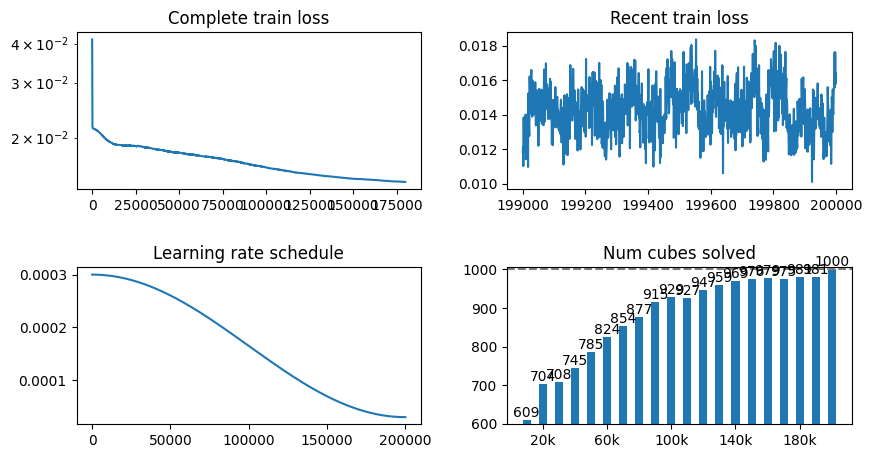

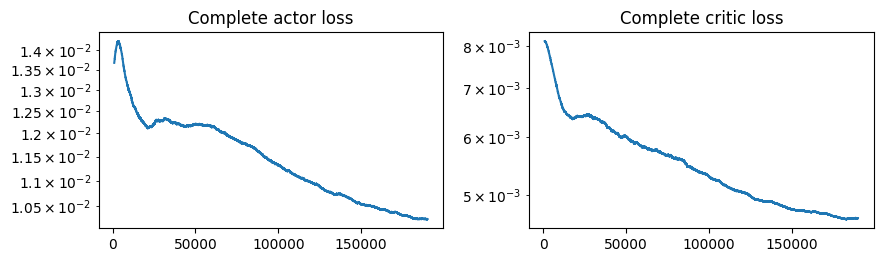

In [ ]:
# Do the actual training.
# Can do 1000 batches of size 512 in ~2.5m on T4 GPU.
# Can do 1000 batches of size 512 in ~1m on V100 GPU.
start = datetime.datetime.now()
print(f"Started training at {start}. Will train for {n_total_steps} batches.")
episode_rewards = []
for gradient_step in range(n_total_steps):
  update_network(agent, target_ppo, replay_buffer, gamma, batch_size, clip_epsilon)
  scheduler.step()
  lrs.append(scheduler.get_last_lr())

  # Update the target network occasionally.
  if gradient_step % target_network_update_frequency == 0 and gradient_step > 0:
    print(f"Updating target network after {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}")
    for target_param, online_param in zip(target_ppo.parameters(), agent.actor_critic.parameters()):
      target_param.data.copy_(tau * online_param.data + (1.0 - tau) * target_param.data)

  # Check metrics occasionally.
  if gradient_step % n_eval_steps == 0 and gradient_step > 0:
    print(f"Reached {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}. "
          f"Online network is in training mode? {agent.actor_critic.training}. "
          f"Target network is in training mode? {target_ppo.training}. "
          f"Replay buffer size is {len(replay_buffer.training_examples)}.")
    agent.actor_critic.eval()
    metrics_for_agent = get_metrics_for_agent(agent, env)
    agent.actor_critic.train()
    print(f"Intermediate transformer PPO evaluation metrics were {metrics_for_agent}")
    cubes_solved_counts.append((gradient_step, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
    plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

  # Update the replay buffer occasionally.
  if gradient_step % n_refresh_buffer_steps == 0 and gradient_step > 0:
    num_examples_to_add = replay_buffer.buffer_size // 8
    print(f"Refreshing replay buffer at step {gradient_step}. Will add {num_examples_to_add} entries.")
    add_examples_to_buffer(replay_buffer, num_examples_to_add)

print(f"Finished training. Time since start: {datetime.datetime.now() - start}")

if cubes_solved_counts[-1][0] != n_total_steps:
  agent.actor_critic.eval()
  # Perform final evaluation with more steps and some stochasticity in case agent gets stuck
  # in a cycle of repetitive moves.
  original_max_steps_per_rollout = env.max_steps_per_rollout
  env.max_steps_per_rollout = 100
  agent.epsilon = .1
  final_metrics_for_agent = get_metrics_for_agent(agent, env)
  env.max_steps_per_rollout = original_max_steps_per_rollout
  agent.actor_critic.train()
  print(f"Final transformer PPO evaluation metrics were {final_metrics_for_agent}")
  cubes_solved_counts.append((n_total_steps, final_metrics_for_agent.total_cubes_solved))
plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

### Transformer Implementation (Flax)

In [ ]:
import datetime
import functools
import math
import jax
import jax.numpy as jnp
import optax
from flax import linen as nn  # Linen API
from flax.training import train_state as train_state_mod
from tqdm import tqdm

# Check which GPU we are using.
gpu_info = !nvidia-smi -L
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

# Check that GPU/TPU devices show up, not just CPU!
print("Jax devices: ", jax.devices())


# Adapted from https://pytorch.org/tutorials/beginner/transformer_tutorial.html
class PositionalEncoding(nn.Module):
  d_model: int
  dropout_rate: float = 0.1
  max_len: int = 5000

  def setup(self):
    self.dropout = nn.Dropout(self.dropout_rate)

    position = np.expand_dims(np.arange(self.max_len), axis=1)
    div_term = np.exp(np.arange(0, self.d_model, 2) * (-math.log(10000.0) / self.d_model))
    pe = np.zeros((self.max_len, self.d_model))
    pe[:, 0::2] = np.sin(position * div_term)
    pe[:, 1::2] = np.cos(position * div_term)
    self.pe = jax.device_put(pe)  # PyTorch also had self.register_buffer('pe', pe)

  def __call__(self, x: jnp.ndarray, train: bool, rng: jax.Array):
    """
    Arguments:
      x: Array, shape ``[batch_size, seq_len, embedding_dim]``
      train: Whether or not we are running in training mode (i.e. whether to use dropout).
      rng: Seed for random ops.

    Returns:
      Array of shape ``[batch_size, seq_len, embedding_dim]``
    """
    x = x + self.pe
    return self.dropout(x, deterministic=not train, rng=rng)

class EncoderLayer(nn.Module):
  embed_dim: int
  dropout_rate: float
  mha_num_heads: int
  dim_feedforward: int

  @nn.compact
  def __call__(self, x: jnp.ndarray, train: bool, rng: jax.Array) -> jnp.ndarray:
    """
    Arguments:
      x: Array, shape ``[batch_size, seq_len, embed_dim]``
      train: Whether or not we are running in training mode (i.e. whether to use dropout).
      rng: Seed for random ops.

    Returns:
      output: same shape as input (``[batch_size, seq_len, embed_dim]``)
    """
    # MHA
    skip_connection = x
    x = nn.MultiHeadAttention(self.mha_num_heads, dropout_rate=self.dropout_rate)(
        x, deterministic=not train, dropout_rng=rng)
    x = nn.LayerNorm()(x + skip_connection)
    skip_connection = x

    # MLP
    x = nn.Dense(features=self.dim_feedforward)(x)
    x = nn.relu(x)
    x = nn.Dropout(self.dropout_rate)(x, deterministic=not train, rng=rng)
    x = nn.Dense(features=self.embed_dim)(x)
    x = nn.LayerNorm()(x + skip_connection)
    return x

class OutputHead(nn.Module):
  # Can't just use nn.Sequential here because of the Dropout.
  sequence_len: int
  embed_dim: int
  dropout_rate: float
  num_outputs: int

  @nn.compact
  def __call__(
      self, x: jnp.ndarray, train: bool, rng: jax.Array
  ) -> jnp.ndarray:
    x = nn.Dense(features=self.sequence_len*self.embed_dim)(x)
    x = nn.relu(x)
    x = nn.Dropout(rate=self.dropout_rate)(x, deterministic=not train, rng=rng)
    x = nn.Dense(features=self.num_outputs)(x)
    return x

class RubiksTransformer(nn.Module):
  """Implement an encoder-only transformer for solving Rubik's cubes.

  The structure is
  1. Embed the "token", which represents either a block or a color of a square on a face.
  2. Optionally add positional encodings to the embedding.
  3. Stack N transformer encoding layers (no causal masking). Each is MHA followed by MLP.
  4. Output heads. One head for the actor, which represents the logits for taking each of the
     twelve actions, and one head for the critic, which estimates V(s).
  """
  num_output_actions: int
  sequence_len: int
  vocab_size: int
  embed_dim: int
  use_positional_encoding: bool
  dropout_rate: float
  num_encoder_layers: int
  mha_num_heads: int
  dim_feedforward: int

  def setup(self):
    self.embed = nn.Embed(num_embeddings=self.vocab_size, features=self.embed_dim)
    self.pos_encoder = PositionalEncoding(
        d_model=self.embed_dim, dropout_rate=self.dropout_rate, max_len=self.sequence_len)

    self.encoder_layers = [
        EncoderLayer(embed_dim=self.embed_dim, dropout_rate=self.dropout_rate,
                     mha_num_heads=self.mha_num_heads, dim_feedforward=self.dim_feedforward)
        for _ in range(self.num_encoder_layers)
    ]

    # No longer have an option to use_all_tokens_for_prediction or not, we will just always
    # use all tokens.
    # class flax.linen.Dense(features, use_bias=True) features = num_output_features
    self.actor_head = OutputHead(
        sequence_len=self.sequence_len,
        embed_dim=self.embed_dim,
        dropout_rate=self.dropout_rate,
        num_outputs=self.num_output_actions)
    self.critic_head = OutputHead(
        sequence_len=self.sequence_len,
        embed_dim=self.embed_dim,
        dropout_rate=self.dropout_rate,
        num_outputs=1)

  def __call__(
      self, x: jnp.ndarray, train: bool, rng: jax.Array
  ) -> tuple[jnp.ndarray, jnp.ndarray]:
    """
    Arguments:
      x: Array, shape ``[batch_size, seq_len]``
      train: Whether or not we are running in training mode (i.e. whether to use dropout).
      rng: Seed for random ops.

    Returns:
      output: tuple of actor_output shape (batch_size, num_actions) and
              critic_output shape (batch_size, 1)
    """
    # B = batch size
    # L = sequence length
    # D = embed_dim/d_model
    # A = num actions
    # Split the rngs to get a separate rng for each op.
    rngs = jax.random.split(rng, num=2)
    rngs = jax.random.split(rngs[0], num=3)
    rngs_for_encoder_layers = jax.random.split(rngs[1], num=len(self.encoder_layers))

    output = self.embed(x) * math.sqrt(self.embed_dim)  # output is now [B, L, D]
    if self.use_positional_encoding:
      output = self.pos_encoder(output, train, rngs[0])  # output is still [B, L, D]

    for i, layer in enumerate(self.encoder_layers):
      output = layer(output, train, rngs_for_encoder_layers[i])  # output is still [B, L, D]

    output = jnp.reshape(output, (output.shape[0], -1))  # [B, L*D]
    # Difference between PyTorch and Flax: Here we return the logits but in PyTorch we
    # applied the softmax.
    actor_output = self.actor_head(output, train, rngs[1])  # [B, A]
    critic_output = self.critic_head(output, train, rngs[2])  # [B, 1]
    return actor_output, critic_output

@jax.jit
def inference_forward_pass(
    train_state: train_state_mod.TrainState,
    input: jnp.ndarray,
    rng: jax.Array):
  actor_output, _ = train_state.apply_fn(
      train_state.params,
      input,
      False,
      rng)
  return actor_output

@dataclasses.dataclass(frozen=False)
class FlaxTransformerPPOAgent(Agent):
  train_state: train_state_mod.TrainState  # Holds the network apply fn, params, and optimizer.
  epsilon: float
  action_space: gym.Space
  losses: list[float]
  actor_losses: list[float]
  critic_losses: list[float]

  def get_action_for_rollouts(self, state: np.ndarray) -> int:
    return self.get_action_using_epsilon_greedy_policy(state)

  def predict(self, state: np.ndarray, deterministic: bool = True) -> tuple[int, Optional[Any]]:
    # We ignore deterministic here, to allow evals to also use some randomness.
    # This tends to be helpful for the deep networks because otherwise they can sometimes
    # get stuck in cycles.
    return self.get_action_using_epsilon_greedy_policy(state), None

  def get_action_using_epsilon_greedy_policy(self, state: np.ndarray) -> int:
    r = random.uniform(0, 1)
    if r <= self.epsilon:
      return self.action_space.sample()
    else:
      return int(self.get_action_using_actor_policy(state)[0])

  def get_action_using_actor_policy(self, state: np.ndarray) -> jnp.ndarray:
    # Could have the user pass in the key for determinism.
    random_key = jax.random.key(random.randint(0, 100000))
    if state.ndim == 1:
      state = np.expand_dims(state, axis=0)
    actor_output = inference_forward_pass(
        self.train_state, jax.device_put(jnp.array(state)), random_key)
    assert actor_output.ndim == 2, f"Expected shape to be [B, A], got {actor_output.shape}"
    sampled_action = jax.random.categorical(random_key, actor_output)  # [B]
    return sampled_action

@functools.partial(jax.jit, static_argnums=(4,5))
def train_step(
    state: train_state_mod.TrainState,
    target_network: train_state_mod.TrainState,
    batch: dict[str, jnp.ndarray],
    seed_rng: jax.Array,
    gamma: float,
    clip_epsilon: float,
) -> tuple[train_state_mod.TrainState, tuple[float, dict[str, jnp.ndarray]]]:
  """Train for a single step."""
  # returns the new train state and a tuple containing [loss, dict[loss_component: loss_value]]
  def loss_fn(params: dict[str, dict[str, Any]]):
    # Defensive deletes to prevent things working when they shouldn't due to colab preserving
    # variables across cells.
    original_states, actions, rewards, next_states, is_dones = None, None, None, None, None
    rngs = jax.random.split(seed_rng, num=3)
    online_orig_state_action_logits, online_orig_state_values = state.apply_fn(
        params,
        batch["original_states"],
        True,
        rngs[0])
    online_orig_state_action_probs = jax.nn.softmax(online_orig_state_action_logits, axis=-1)

    old_state_action_logits, _ = jax.lax.stop_gradient(
        target_network.apply_fn(
            target_network.params,
            batch["original_states"],
            False,
            rngs[1]))
    old_state_action_probs = jax.nn.softmax(old_state_action_logits, axis=-1)

    _, online_next_state_values = state.apply_fn(
        params,
        batch["next_states"],
        True,
        rngs[2])
    online_orig_state_values = online_orig_state_values.squeeze()  # [B]
    online_next_state_values = online_next_state_values.squeeze()  # [B]

    advantage = batch["rewards"] + (gamma * (online_next_state_values * (1 - batch["is_dones"]))) - online_orig_state_values
    advantage = jax.lax.stop_gradient(advantage)
    unclipped_ratio = (
        jax.lax.max(online_orig_state_action_probs[jnp.arange(online_orig_state_action_probs.shape[0]), batch["actions"]], 1e-9) /
        jax.lax.max(old_state_action_probs[jnp.arange(old_state_action_probs.shape[0]), batch["actions"]], 1e-9)
    )  # denominator is clamped to avoid divide-by-zero NaNs.

    # No one else really writes the PPO loss like this, but I found it easier to understand in terms
    # of minimizing the loss. The idea is basically:
    # When advantage is positive:
    # if ratio > 1 + clip_epsilon: loss = 0 else loss = ((1 + clip_epsilon) - ratio) * advantage)
    # When advantage is negative:
    # if ratio < 1 - clip_epsilon: loss = 0 else loss = ((ratio - (1 - clip_epsilon)) * -advantage)
    # I think this should have equivalent gradients to the original formulation.
    positive_advantage_losses = jnp.where(
        unclipped_ratio > (1 + clip_epsilon), 0, ((1 + clip_epsilon) - unclipped_ratio) * (advantage))
    # I find that using a smaller value for negative advantage losses stabilizes training, and it will
    # basically always diverge if this coefficient is not set to a value <= 1/3.
    # I further clip the ratio in the negative advantage case to prevent an extremely high ratio
    # distorting the gradient. Clamping to 2 because (1 - clip_epsilon) + (1 + clip_epsilon) = 2.
    negative_advantage_losses = (1/12) * jnp.where(
        unclipped_ratio < (1 - clip_epsilon), 0, (jax.lax.min(2., unclipped_ratio) - (1 - clip_epsilon)) * -(advantage))

    policy_loss_raw = jnp.where(advantage >= 0, positive_advantage_losses, negative_advantage_losses)
    policy_loss = policy_loss_raw.mean()

    value_loss_raw = optax.l2_loss(
       online_orig_state_values,
       batch["rewards"] + (gamma * (jax.lax.stop_gradient(online_next_state_values) * (1 - batch["is_dones"]))),
    )
    value_loss = value_loss_raw.mean()

    # Future idea: Could add an entropy component to the loss following something
    # like https://github.com/google/jax/discussions/15284. Eschewing adding it here since
    # it didn't seem to be very necessary for good performance on this task.

    # These values were set to even out the losses after a bit of empirical experimentation.
    policy_coefficient = .5
    value_coefficient = 2
    # Future idea: Add an aux loss to enforce V(s) between the minimum reward and maximum reward?
    loss = (policy_coefficient * policy_loss) + (value_coefficient * value_loss)
    aux = {"actor_loss": policy_loss, "critic_loss": value_loss}
    return loss, aux

  grad_fn = jax.value_and_grad(loss_fn, has_aux=True)
  value, grads = grad_fn(state.params)
  state = state.apply_gradients(grads=grads)
  return state, value

def plot_actor_critic_losses(
    actor_losses: list[float],
    critic_losses: list[float],
    skip_first_n_steps: int = 1000,
) -> None:
  fig = plt.figure(figsize=(10, 2))
  fig.subplots_adjust(top=.99, bottom=.01, hspace=.50, wspace=.25)

  ax1 = plt.subplot(1, 2, 1)
  ax1.set_yscale("log")
  ax1.set_title("Complete actor loss")
  averaged = moving_average(np.array(actor_losses), max(100, len(actor_losses) // 20))
  ax1.plot(np.arange(skip_first_n_steps, len(averaged)),
           averaged[skip_first_n_steps:],
           label="actor loss")

  ax2 = plt.subplot(1, 2, 2)
  ax2.set_yscale("log")
  ax2.set_title("Complete critic loss")
  averaged = moving_average(np.array(critic_losses), max(100, len(critic_losses) // 20))
  ax2.plot(np.arange(skip_first_n_steps, len(averaged)),
           averaged[skip_first_n_steps:],
           label="critic loss")

  plt.show()


env = RubiksCube2Env(
    state_type=StateType.TOKENIZED_BLOCKS,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=False,
    allow_easy_initializations=False,
    max_reward=1)
network_kwargs = {
    "num_output_actions": env.action_space.n,
    "sequence_len": env.observation_space.shape[0],
    "vocab_size": env.vocab_size,
    "embed_dim": 256,
    "use_positional_encoding": True,
    "dropout_rate": 0.05,
    "num_encoder_layers": 6,
    "mha_num_heads": 4,
    "dim_feedforward": 1024,
}

# Hyperparameters.
clip_epsilon = .2
gamma = 1.
target_network_update_frequency = 200
epsilon = 0
batch_size = 512
n_eval_steps = 10_000
backwards_rollout_fraction = 1  # What percentage of the time to generate rollouts using the backwards rollout strategy.
n_total_steps = 200_000
n_refresh_buffer_steps = 40_000
replay_buffer_size = n_refresh_buffer_steps * batch_size

# Future idea: Try scheduler with warmup.
# If the learning rate is too large, the network will totally diverge and not learn at all.
scheduler = optax.cosine_decay_schedule(
    init_value=9e-5, decay_steps=n_total_steps, alpha=0.1, exponent=1.0)
optimizer = optax.chain(
    optax.clip_by_global_norm(.5),
    optax.adam(learning_rate=scheduler),
)
lrs = []

online_ppo = RubiksTransformer(**network_kwargs)
online_ppo_params = online_ppo.init(
    jax.random.key(0),
    jnp.ones((batch_size, env.observation_space.shape[0]), dtype=jnp.int32),
    True,
    jax.random.key(100))
target_ppo = RubiksTransformer(**network_kwargs)
target_ppo_params = online_ppo.init(
    jax.random.key(1),  # Different from the seed used above.
    jnp.ones((batch_size, env.observation_space.shape[0]), dtype=jnp.int32),
    True,
    jax.random.key(101))

print(online_ppo.tabulate(
    jax.random.key(0),
    jnp.ones((batch_size, env.observation_space.shape[0]), dtype=jnp.int32),
    False,
    jax.random.key(0),
    compute_flops=True,
    compute_vjp_flops=True))

train_state = train_state_mod.TrainState.create(
    apply_fn=online_ppo.apply,
    params=online_ppo_params,
    tx=optimizer)
target_network = train_state_mod.TrainState.create(
    apply_fn=target_ppo.apply,
    params=target_ppo_params,
    tx=optimizer)
print(f"Observation for test cube is {get_obs_for_test_cube(env)}")
agent = FlaxTransformerPPOAgent(train_state, epsilon, env.action_space, [], [], [])

GPU 0: Tesla T4 (UUID: GPU-bd4bac9f-6356-10c6-e8ca-a58c7ac9b721)
Jax devices:  [cuda(id=0)]

                                     RubiksTransformer Summary                                      
┏━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ path        ┃ module      ┃ inputs      ┃ outputs     ┃ flops       ┃ vjp_flops    ┃ params      ┃
┡━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│             │ RubiksTran… │ -           │ -           │ 47672492032 │ 142948532224 │             │
│             │             │ int32[512,… │ float32[51… │             │              │             │
│             │             │ - False     │ -           │             │              │             │
│             │             │ -           │ float32[51… │             │              │             │
│             │             │ key<fry>[]  │             │             │              │             

In [ ]:
cubes_solved_counts = []
metrics_for_agent = get_metrics_for_agent(agent, env)
print(f"Untrained transformer PPO evaluation metrics were {metrics_for_agent}")
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

def add_examples_to_buffer(replay_buffer: ReplayBuffer, num_examples_to_add: int) -> None:
  examples_added = 0
  with tqdm(total=num_examples_to_add) as pbar:
    while examples_added < num_examples_to_add:
      r = random.uniform(0, 1)
      if r <= backwards_rollout_fraction:
        rollout, total_reward_for_episode = generate_rollout_backwards(
            agent, env, cap_rollout_steps=45)
      else:
        rollout, total_reward_for_episode = generate_rollout(agent, env)
      replay_buffer.add_samples(rollout)
      examples_added += len(rollout)
      pbar.update(len(rollout))

# Fill the initial training buffer.
replay_buffer = ReplayBuffer(replay_buffer_size)
add_examples_to_buffer(replay_buffer, replay_buffer.buffer_size)

Started training at 2024-03-10 22:11:13.185116. Will train for 200000 batches.
Updating target network after 200 gradient updates. Time since start: 0:00:20.870785
Updating target network after 400 gradient updates. Time since start: 0:00:29.702239
Updating target network after 600 gradient updates. Time since start: 0:00:38.557973
Updating target network after 800 gradient updates. Time since start: 0:00:47.448233
Updating target network after 1000 gradient updates. Time since start: 0:00:56.285837
Updating target network after 1200 gradient updates. Time since start: 0:01:05.047697
Updating target network after 1400 gradient updates. Time since start: 0:01:13.763169
Updating target network after 1600 gradient updates. Time since start: 0:01:22.447857
Updating target network after 1800 gradient updates. Time since start: 0:01:31.158265
Updating target network after 2000 gradient updates. Time since start: 0:01:39.872286
Updating target network after 2200 gradient updates. Time since s

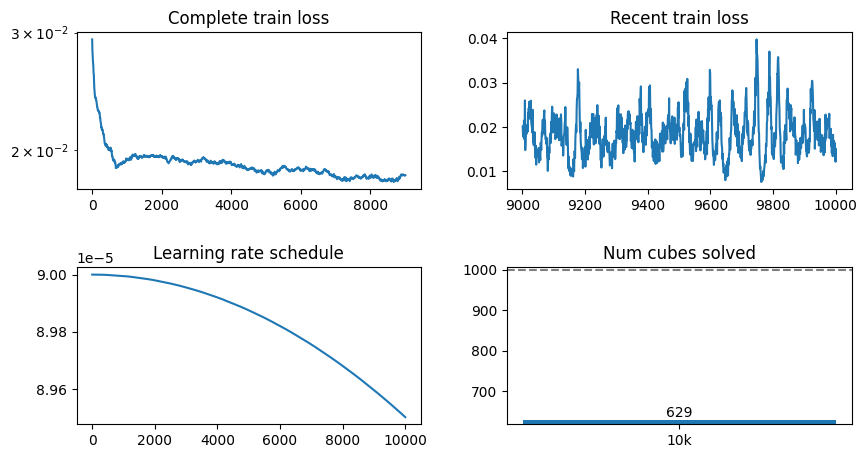

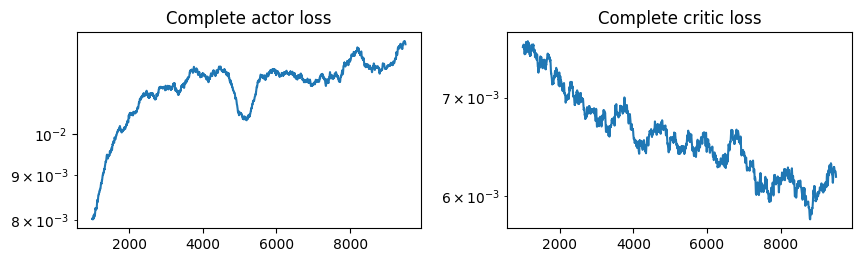

Updating target network after 10200 gradient updates. Time since start: 0:08:56.034543
Updating target network after 10400 gradient updates. Time since start: 0:09:04.712638
Updating target network after 10600 gradient updates. Time since start: 0:09:13.371235
Updating target network after 10800 gradient updates. Time since start: 0:09:22.216010
Updating target network after 11000 gradient updates. Time since start: 0:09:30.900428
Updating target network after 11200 gradient updates. Time since start: 0:09:39.557827
Updating target network after 11400 gradient updates. Time since start: 0:09:48.240992
Updating target network after 11600 gradient updates. Time since start: 0:09:56.958240
Updating target network after 11800 gradient updates. Time since start: 0:10:05.645392
Updating target network after 12000 gradient updates. Time since start: 0:10:14.203026
Updating target network after 12200 gradient updates. Time since start: 0:10:22.806584
Updating target network after 12400 gradien

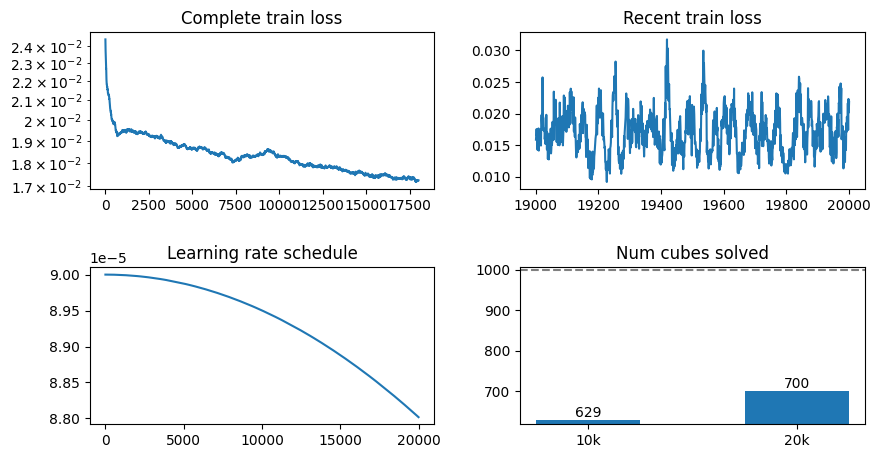

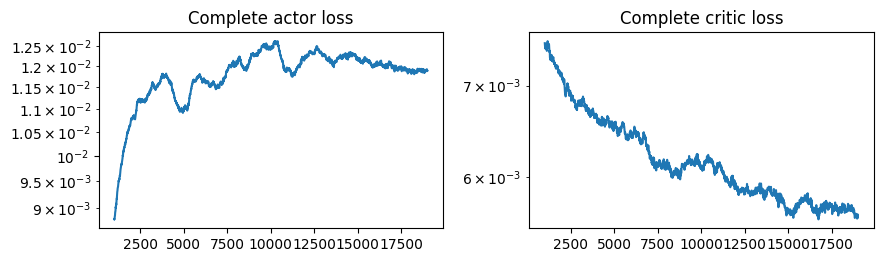

Updating target network after 20200 gradient updates. Time since start: 0:17:19.121132
Updating target network after 20400 gradient updates. Time since start: 0:17:27.774808
Updating target network after 20600 gradient updates. Time since start: 0:17:36.373689
Updating target network after 20800 gradient updates. Time since start: 0:17:45.065858
Updating target network after 21000 gradient updates. Time since start: 0:17:53.883678
Updating target network after 21200 gradient updates. Time since start: 0:18:02.600929
Updating target network after 21400 gradient updates. Time since start: 0:18:11.281119
Updating target network after 21600 gradient updates. Time since start: 0:18:19.904205
Updating target network after 21800 gradient updates. Time since start: 0:18:28.567156
Updating target network after 22000 gradient updates. Time since start: 0:18:37.217868
Updating target network after 22200 gradient updates. Time since start: 0:18:45.967302
Updating target network after 22400 gradien

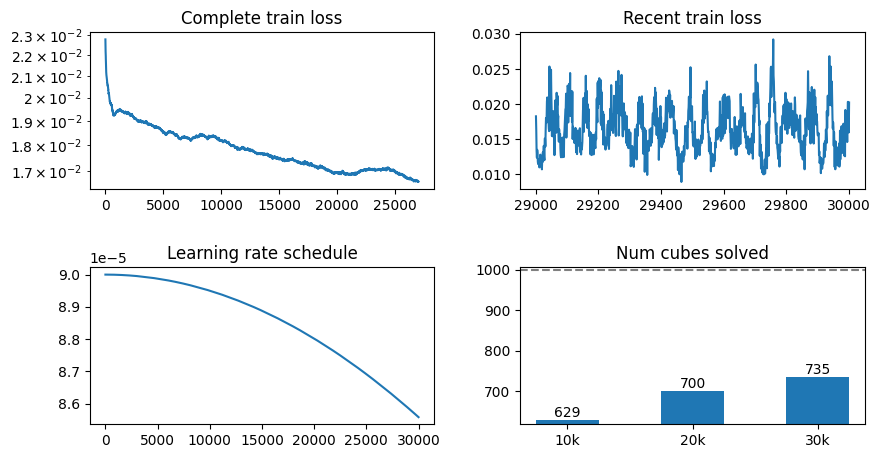

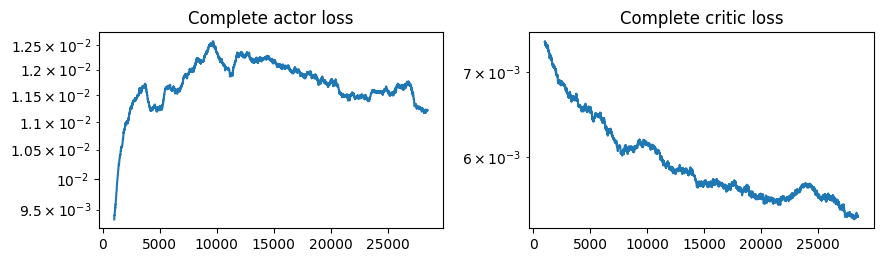

Updating target network after 30200 gradient updates. Time since start: 0:25:40.067036
Updating target network after 30400 gradient updates. Time since start: 0:25:48.687999
Updating target network after 30600 gradient updates. Time since start: 0:25:57.432231
Updating target network after 30800 gradient updates. Time since start: 0:26:06.118178
Updating target network after 31000 gradient updates. Time since start: 0:26:14.899285
Updating target network after 31200 gradient updates. Time since start: 0:26:23.605538
Updating target network after 31400 gradient updates. Time since start: 0:26:42.885775
Updating target network after 31600 gradient updates. Time since start: 0:26:51.680201
Updating target network after 31800 gradient updates. Time since start: 0:27:00.369219
Updating target network after 32000 gradient updates. Time since start: 0:27:09.061353
Updating target network after 32200 gradient updates. Time since start: 0:27:17.767695
Updating target network after 32400 gradien

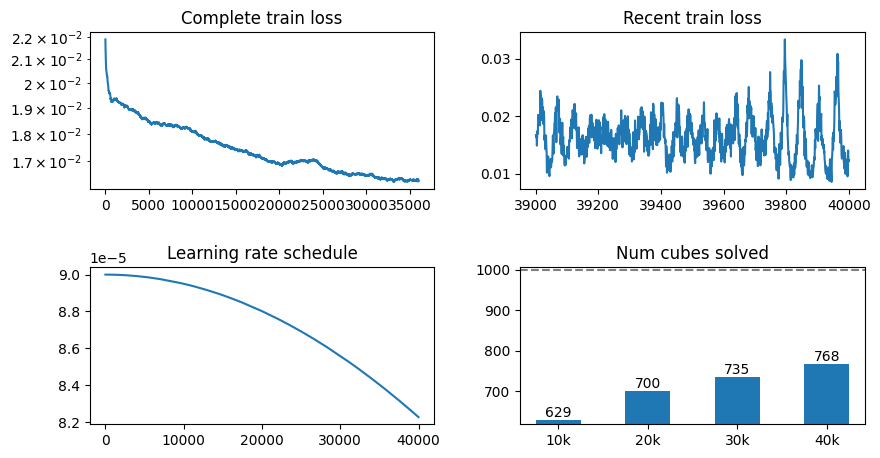

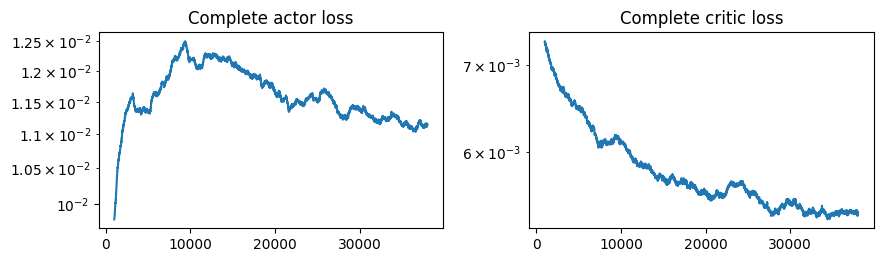

Refreshing replay buffer at step 40000. Will add 2560000 entries.


2560007it [09:08, 4670.72it/s]                             


Updating target network after 40200 gradient updates. Time since start: 0:43:18.129945
Updating target network after 40400 gradient updates. Time since start: 0:43:26.792113
Updating target network after 40600 gradient updates. Time since start: 0:43:35.342141
Updating target network after 40800 gradient updates. Time since start: 0:43:44.000485
Updating target network after 41000 gradient updates. Time since start: 0:43:52.733474
Updating target network after 41200 gradient updates. Time since start: 0:44:01.430379
Updating target network after 41400 gradient updates. Time since start: 0:44:09.992192
Updating target network after 41600 gradient updates. Time since start: 0:44:18.518254
Updating target network after 41800 gradient updates. Time since start: 0:44:27.250840
Updating target network after 42000 gradient updates. Time since start: 0:44:35.759261
Updating target network after 42200 gradient updates. Time since start: 0:44:44.302396
Updating target network after 42400 gradien

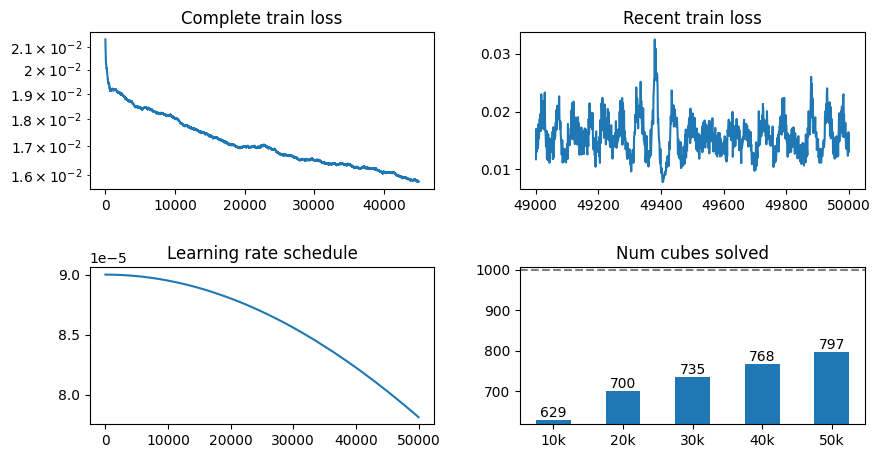

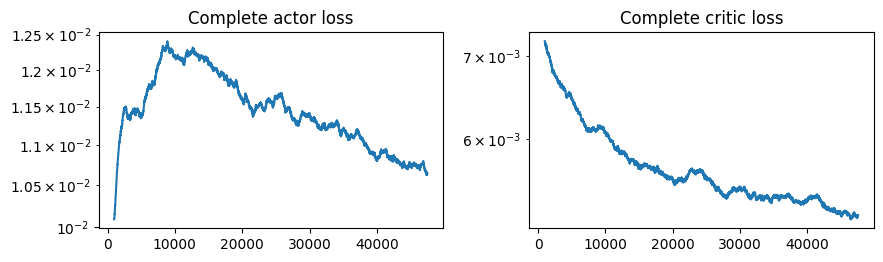

Updating target network after 50200 gradient updates. Time since start: 0:51:29.408349
Updating target network after 50400 gradient updates. Time since start: 0:51:38.027557
Updating target network after 50600 gradient updates. Time since start: 0:51:46.636327
Updating target network after 50800 gradient updates. Time since start: 0:51:55.357303
Updating target network after 51000 gradient updates. Time since start: 0:52:04.020674
Updating target network after 51200 gradient updates. Time since start: 0:52:12.649004
Updating target network after 51400 gradient updates. Time since start: 0:52:21.345925
Updating target network after 51600 gradient updates. Time since start: 0:52:29.862328
Updating target network after 51800 gradient updates. Time since start: 0:52:38.441254
Updating target network after 52000 gradient updates. Time since start: 0:52:47.110313
Updating target network after 52200 gradient updates. Time since start: 0:52:55.664461
Updating target network after 52400 gradien

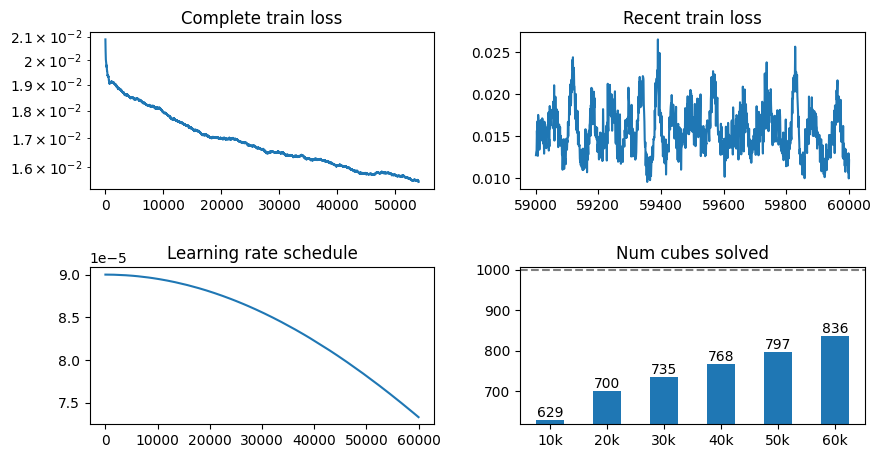

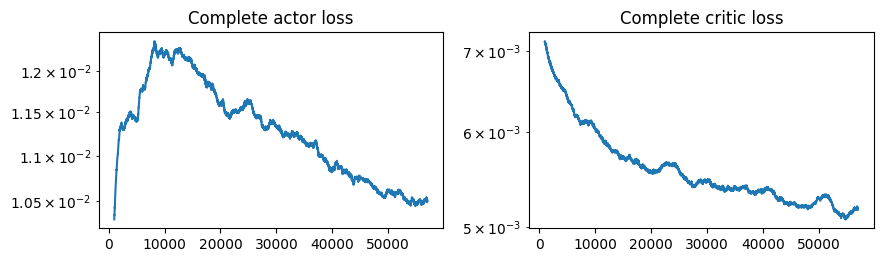

Updating target network after 60200 gradient updates. Time since start: 0:59:41.698283
Updating target network after 60400 gradient updates. Time since start: 0:59:50.444106
Updating target network after 60600 gradient updates. Time since start: 0:59:59.166046
Updating target network after 60800 gradient updates. Time since start: 1:00:07.878326
Updating target network after 61000 gradient updates. Time since start: 1:00:16.619285
Updating target network after 61200 gradient updates. Time since start: 1:00:25.325457
Updating target network after 61400 gradient updates. Time since start: 1:00:34.112365
Updating target network after 61600 gradient updates. Time since start: 1:00:42.697891
Updating target network after 61800 gradient updates. Time since start: 1:00:51.300980
Updating target network after 62000 gradient updates. Time since start: 1:01:00.022537
Updating target network after 62200 gradient updates. Time since start: 1:01:08.660573
Updating target network after 62400 gradien

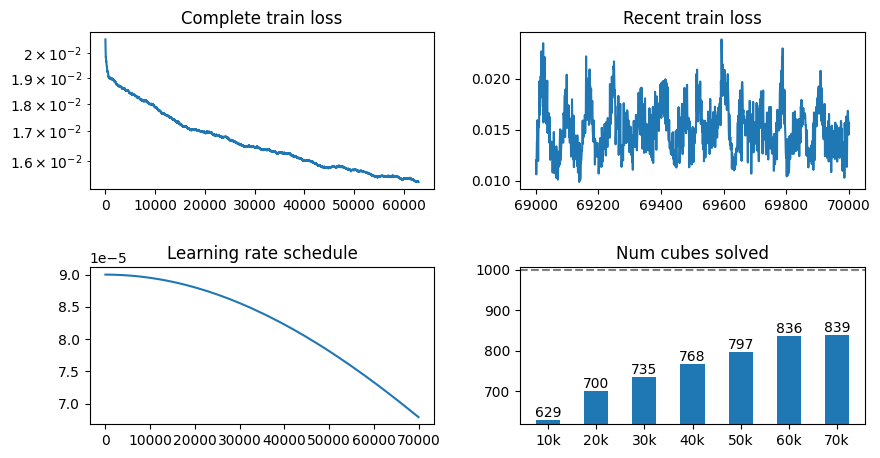

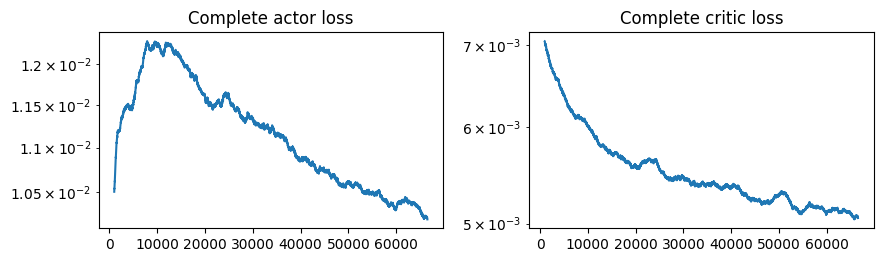

Updating target network after 70200 gradient updates. Time since start: 1:07:53.072186
Updating target network after 70400 gradient updates. Time since start: 1:08:01.636721
Updating target network after 70600 gradient updates. Time since start: 1:08:10.470115
Updating target network after 70800 gradient updates. Time since start: 1:08:19.067819
Updating target network after 71000 gradient updates. Time since start: 1:08:27.760424
Updating target network after 71200 gradient updates. Time since start: 1:08:36.268230
Updating target network after 71400 gradient updates. Time since start: 1:08:44.952279
Updating target network after 71600 gradient updates. Time since start: 1:08:53.520638
Updating target network after 71800 gradient updates. Time since start: 1:09:02.112497
Updating target network after 72000 gradient updates. Time since start: 1:09:10.678688
Updating target network after 72200 gradient updates. Time since start: 1:09:19.371266
Updating target network after 72400 gradien

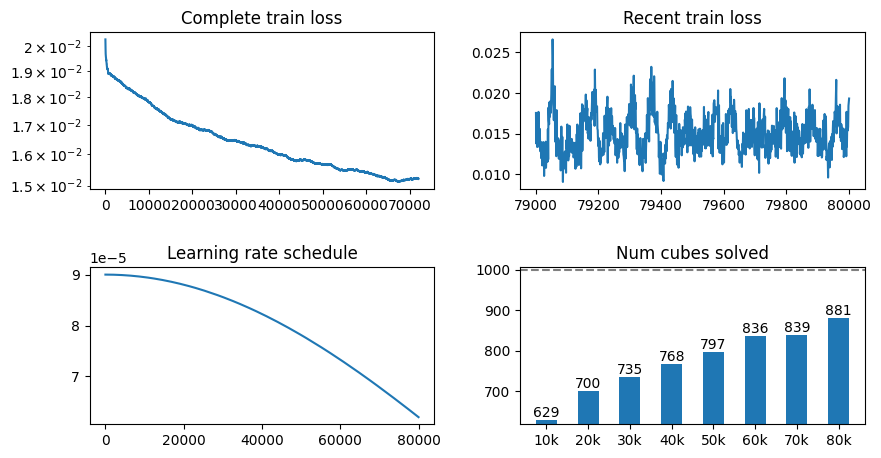

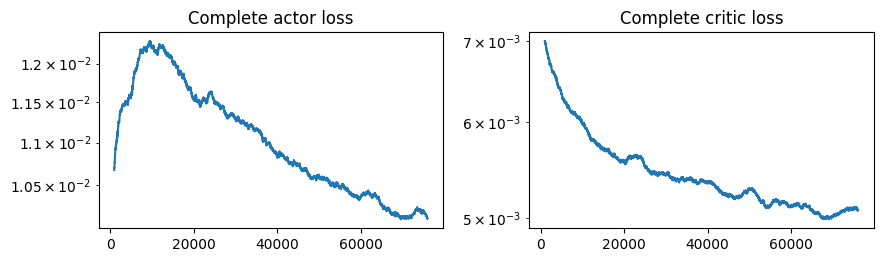

Refreshing replay buffer at step 80000. Will add 2560000 entries.


2560026it [09:06, 4688.63it/s]                             


Updating target network after 80200 gradient updates. Time since start: 1:25:14.408863
Updating target network after 80400 gradient updates. Time since start: 1:25:23.197330
Updating target network after 80600 gradient updates. Time since start: 1:25:31.934208
Updating target network after 80800 gradient updates. Time since start: 1:25:40.703869
Updating target network after 81000 gradient updates. Time since start: 1:25:49.445217
Updating target network after 81200 gradient updates. Time since start: 1:25:58.261216
Updating target network after 81400 gradient updates. Time since start: 1:26:06.935576
Updating target network after 81600 gradient updates. Time since start: 1:26:15.573416
Updating target network after 81800 gradient updates. Time since start: 1:26:24.251608
Updating target network after 82000 gradient updates. Time since start: 1:26:32.983717
Updating target network after 82200 gradient updates. Time since start: 1:26:41.603912
Updating target network after 82400 gradien

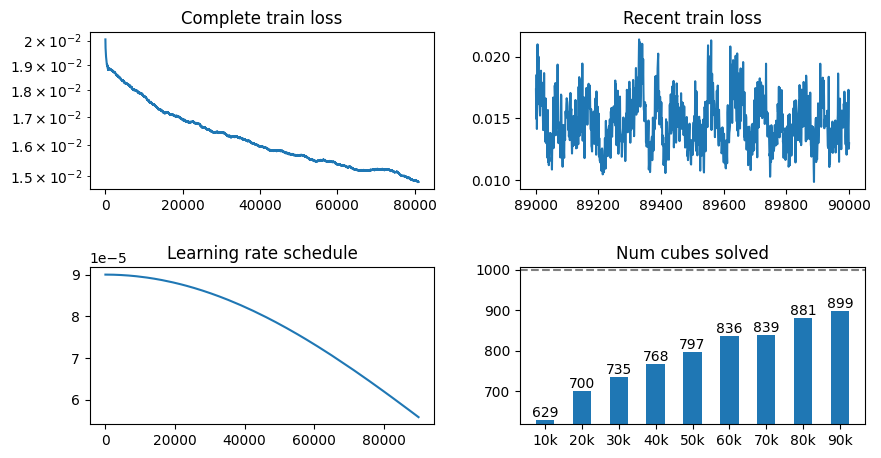

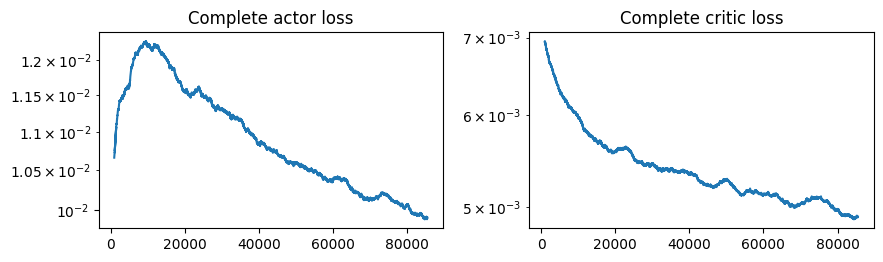

Updating target network after 90200 gradient updates. Time since start: 1:33:19.868025
Updating target network after 90400 gradient updates. Time since start: 1:33:28.596700
Updating target network after 90600 gradient updates. Time since start: 1:33:37.184669
Updating target network after 90800 gradient updates. Time since start: 1:33:45.911723
Updating target network after 91000 gradient updates. Time since start: 1:33:54.573672
Updating target network after 91200 gradient updates. Time since start: 1:34:03.347763
Updating target network after 91400 gradient updates. Time since start: 1:34:11.979670
Updating target network after 91600 gradient updates. Time since start: 1:34:20.615885
Updating target network after 91800 gradient updates. Time since start: 1:34:29.317324
Updating target network after 92000 gradient updates. Time since start: 1:34:38.025605
Updating target network after 92200 gradient updates. Time since start: 1:34:46.806809
Updating target network after 92400 gradien

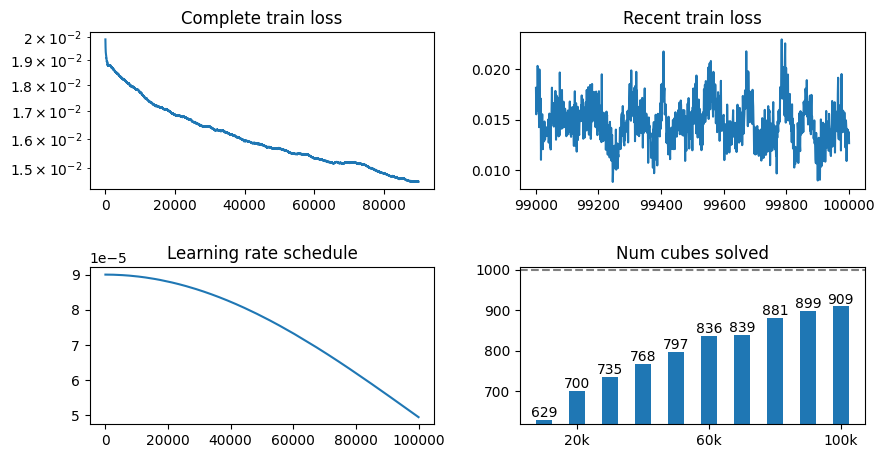

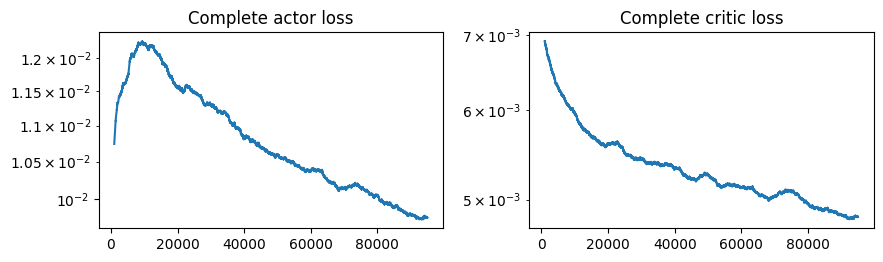

Updating target network after 100200 gradient updates. Time since start: 1:41:26.592862
Updating target network after 100400 gradient updates. Time since start: 1:41:35.299878
Updating target network after 100600 gradient updates. Time since start: 1:41:43.958447
Updating target network after 100800 gradient updates. Time since start: 1:41:52.706994
Updating target network after 101000 gradient updates. Time since start: 1:42:01.350063
Updating target network after 101200 gradient updates. Time since start: 1:42:10.073905
Updating target network after 101400 gradient updates. Time since start: 1:42:18.721429
Updating target network after 101600 gradient updates. Time since start: 1:42:27.415736
Updating target network after 101800 gradient updates. Time since start: 1:42:36.127397
Updating target network after 102000 gradient updates. Time since start: 1:42:44.851641
Updating target network after 102200 gradient updates. Time since start: 1:42:53.710351
Updating target network after 10

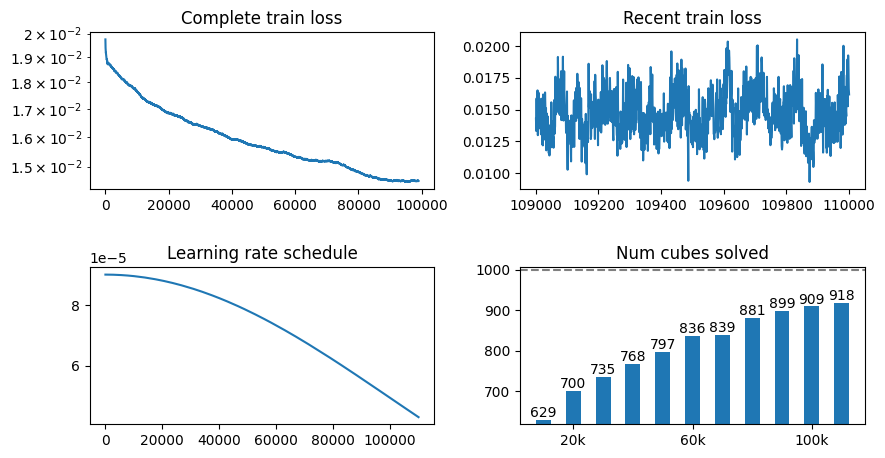

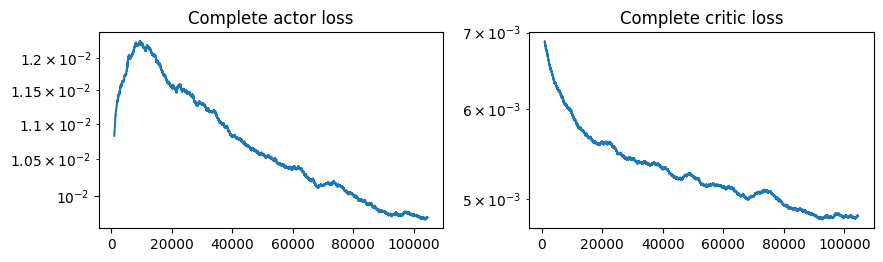

Updating target network after 110200 gradient updates. Time since start: 1:49:32.371660
Updating target network after 110400 gradient updates. Time since start: 1:49:41.023892
Updating target network after 110600 gradient updates. Time since start: 1:49:49.700574
Updating target network after 110800 gradient updates. Time since start: 1:49:58.476580
Updating target network after 111000 gradient updates. Time since start: 1:50:07.081422
Updating target network after 111200 gradient updates. Time since start: 1:50:15.828686
Updating target network after 111400 gradient updates. Time since start: 1:50:24.483922
Updating target network after 111600 gradient updates. Time since start: 1:50:33.480175
Updating target network after 111800 gradient updates. Time since start: 1:50:42.124860
Updating target network after 112000 gradient updates. Time since start: 1:50:50.823199
Updating target network after 112200 gradient updates. Time since start: 1:50:59.485482
Updating target network after 11

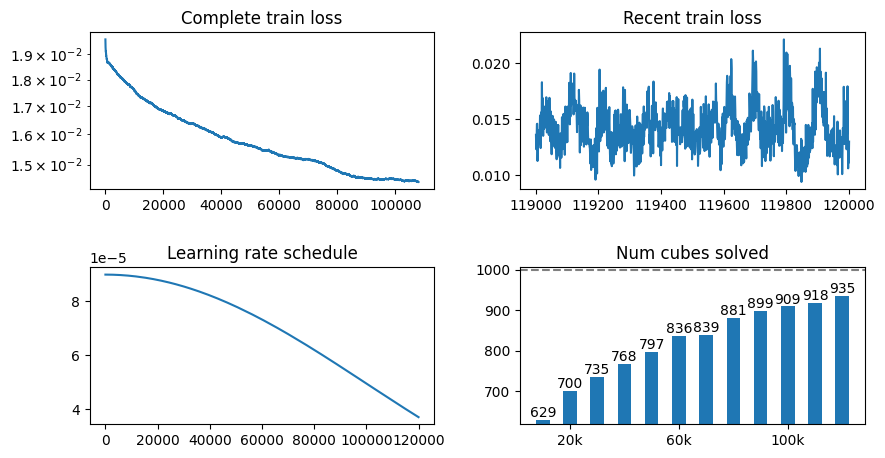

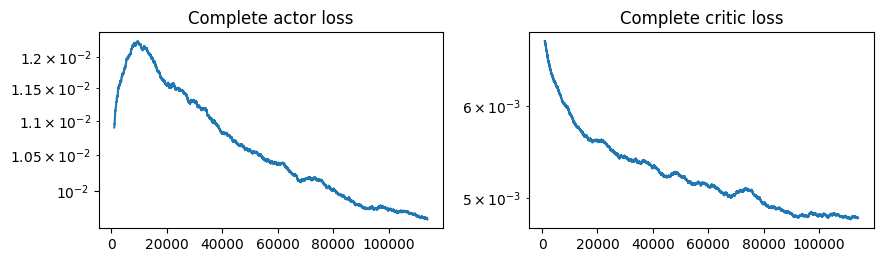

Refreshing replay buffer at step 120000. Will add 2560000 entries.


2560018it [09:09, 4660.20it/s]                             


Updating target network after 120200 gradient updates. Time since start: 2:06:43.102235
Updating target network after 120400 gradient updates. Time since start: 2:06:51.744863
Updating target network after 120600 gradient updates. Time since start: 2:07:00.356497
Updating target network after 120800 gradient updates. Time since start: 2:07:08.912968
Updating target network after 121000 gradient updates. Time since start: 2:07:17.521908
Updating target network after 121200 gradient updates. Time since start: 2:07:26.105550
Updating target network after 121400 gradient updates. Time since start: 2:07:34.802098
Updating target network after 121600 gradient updates. Time since start: 2:07:43.383211
Updating target network after 121800 gradient updates. Time since start: 2:07:52.139714
Updating target network after 122000 gradient updates. Time since start: 2:08:00.901788
Updating target network after 122200 gradient updates. Time since start: 2:08:09.568082
Updating target network after 12

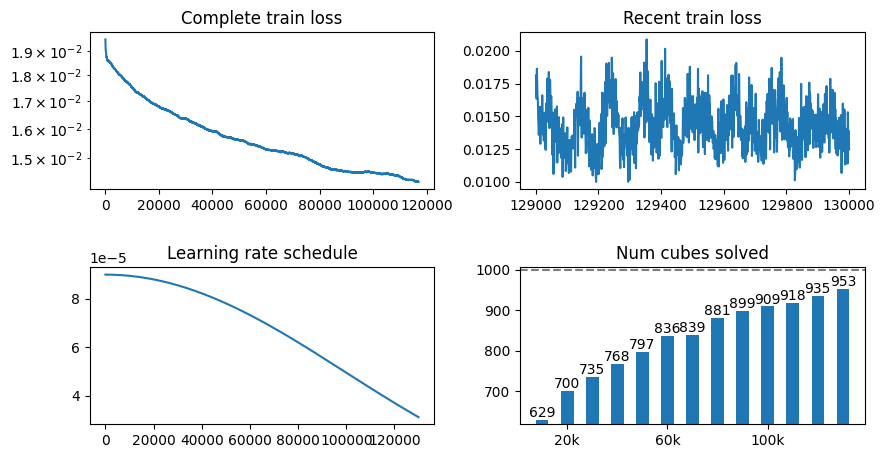

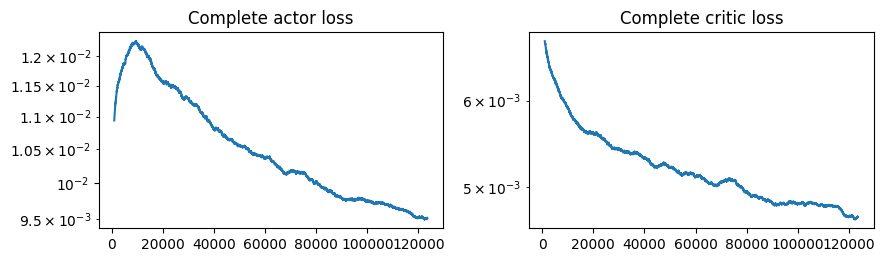

Updating target network after 130200 gradient updates. Time since start: 2:14:42.203078
Updating target network after 130400 gradient updates. Time since start: 2:14:50.762645
Updating target network after 130600 gradient updates. Time since start: 2:14:59.480897
Updating target network after 130800 gradient updates. Time since start: 2:15:08.019607
Updating target network after 131000 gradient updates. Time since start: 2:15:16.798035
Updating target network after 131200 gradient updates. Time since start: 2:15:25.384435
Updating target network after 131400 gradient updates. Time since start: 2:15:34.172605
Updating target network after 131600 gradient updates. Time since start: 2:15:42.723850
Updating target network after 131800 gradient updates. Time since start: 2:15:51.454631
Updating target network after 132000 gradient updates. Time since start: 2:16:00.337642
Updating target network after 132200 gradient updates. Time since start: 2:16:09.072340
Updating target network after 13

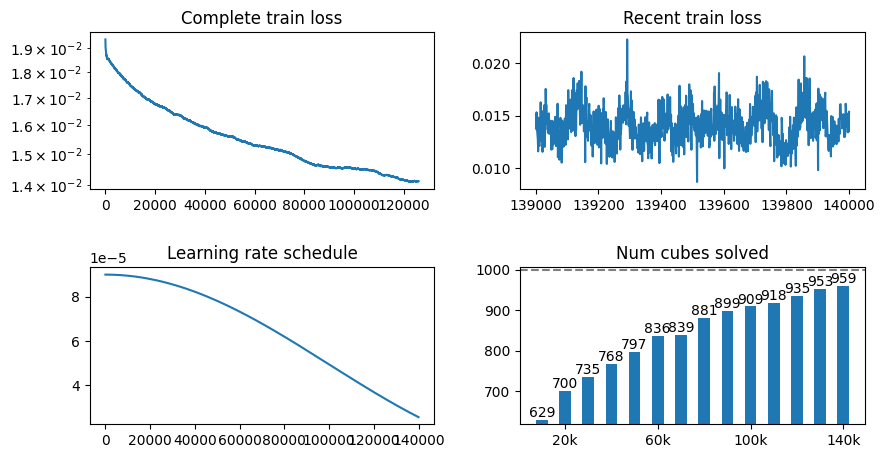

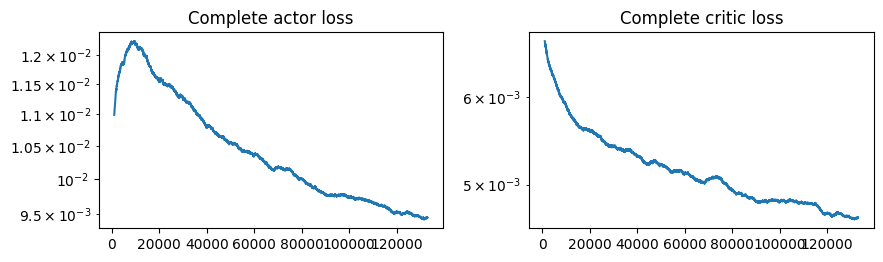

Updating target network after 140200 gradient updates. Time since start: 2:22:41.577310
Updating target network after 140400 gradient updates. Time since start: 2:22:50.332082
Updating target network after 140600 gradient updates. Time since start: 2:22:58.980252
Updating target network after 140800 gradient updates. Time since start: 2:23:07.779808
Updating target network after 141000 gradient updates. Time since start: 2:23:16.393473
Updating target network after 141200 gradient updates. Time since start: 2:23:25.308831
Updating target network after 141400 gradient updates. Time since start: 2:23:34.011966
Updating target network after 141600 gradient updates. Time since start: 2:23:42.793067
Updating target network after 141800 gradient updates. Time since start: 2:23:51.308794
Updating target network after 142000 gradient updates. Time since start: 2:24:00.222634
Updating target network after 142200 gradient updates. Time since start: 2:24:08.847554
Updating target network after 14

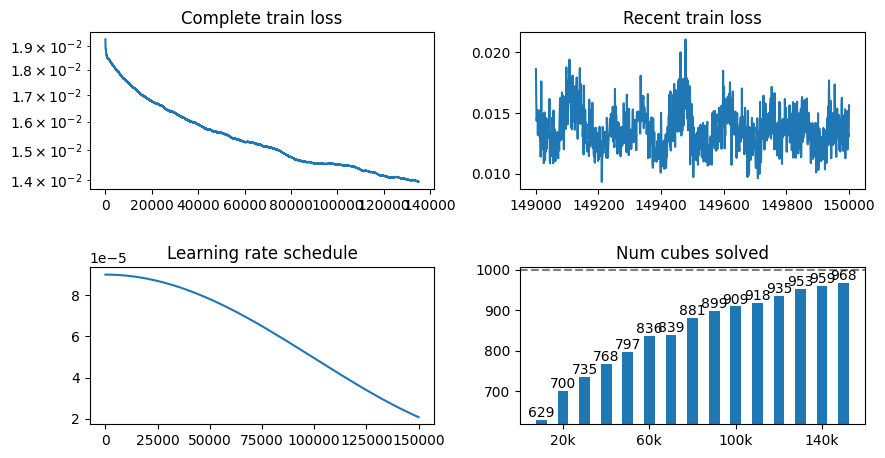

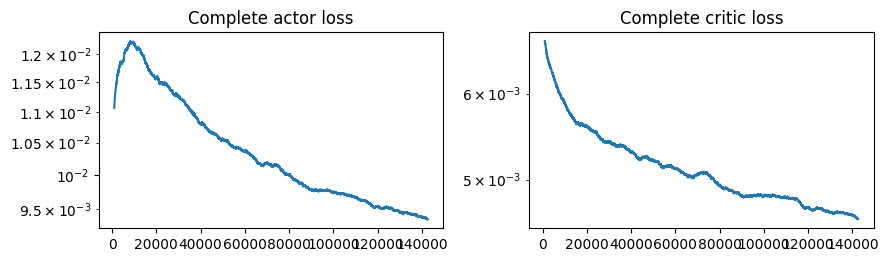

Updating target network after 150200 gradient updates. Time since start: 2:30:38.684184
Updating target network after 150400 gradient updates. Time since start: 2:30:47.319244
Updating target network after 150600 gradient updates. Time since start: 2:30:55.924736
Updating target network after 150800 gradient updates. Time since start: 2:31:04.651505
Updating target network after 151000 gradient updates. Time since start: 2:31:13.170313
Updating target network after 151200 gradient updates. Time since start: 2:31:21.894637
Updating target network after 151400 gradient updates. Time since start: 2:31:30.414548
Updating target network after 151600 gradient updates. Time since start: 2:31:39.141579
Updating target network after 151800 gradient updates. Time since start: 2:31:47.613381
Updating target network after 152000 gradient updates. Time since start: 2:31:56.325600
Updating target network after 152200 gradient updates. Time since start: 2:32:04.912333
Updating target network after 15

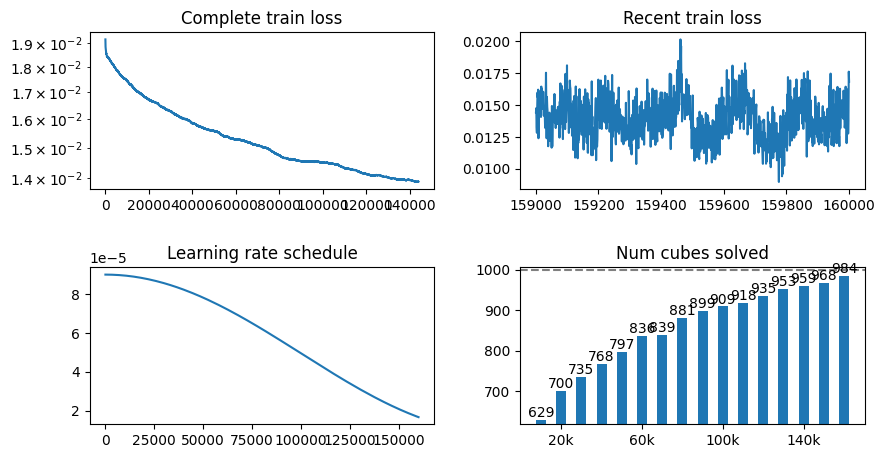

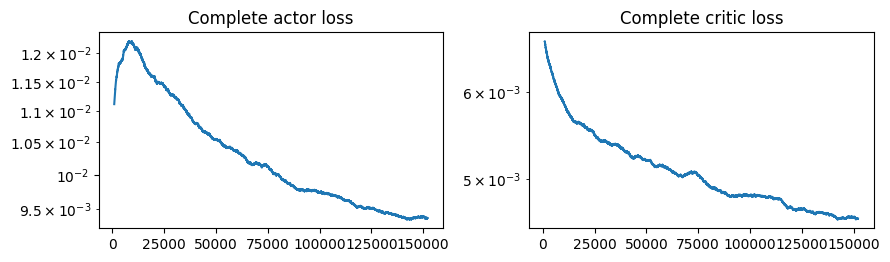

Refreshing replay buffer at step 160000. Will add 2560000 entries.


2560013it [08:54, 4787.94it/s]                             


Updating target network after 160200 gradient updates. Time since start: 2:47:30.370344
Updating target network after 160400 gradient updates. Time since start: 2:47:38.975019
Updating target network after 160600 gradient updates. Time since start: 2:47:47.576189
Updating target network after 160800 gradient updates. Time since start: 2:47:56.277952
Updating target network after 161000 gradient updates. Time since start: 2:48:04.979527
Updating target network after 161200 gradient updates. Time since start: 2:48:13.559799
Updating target network after 161400 gradient updates. Time since start: 2:48:22.282356
Updating target network after 161600 gradient updates. Time since start: 2:48:30.956600
Updating target network after 161800 gradient updates. Time since start: 2:48:39.568629
Updating target network after 162000 gradient updates. Time since start: 2:48:48.586356
Updating target network after 162200 gradient updates. Time since start: 2:48:57.429995
Updating target network after 16

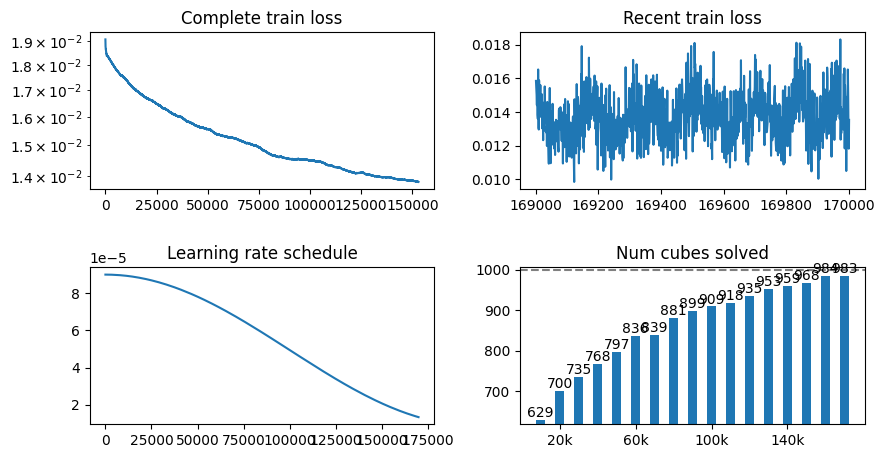

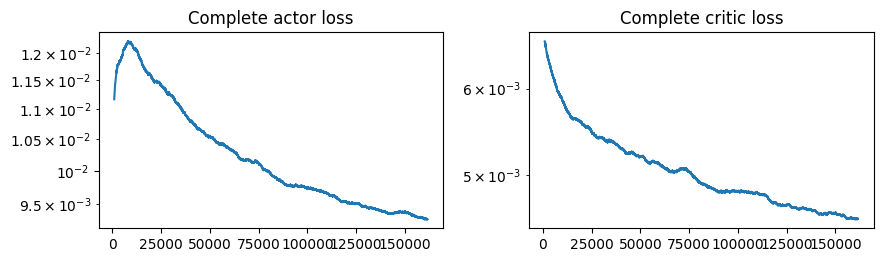

Updating target network after 170200 gradient updates. Time since start: 2:55:23.603698
Updating target network after 170400 gradient updates. Time since start: 2:55:32.237878
Updating target network after 170600 gradient updates. Time since start: 2:55:40.765610
Updating target network after 170800 gradient updates. Time since start: 2:55:49.391656
Updating target network after 171000 gradient updates. Time since start: 2:55:58.002374
Updating target network after 171200 gradient updates. Time since start: 2:56:06.705825
Updating target network after 171400 gradient updates. Time since start: 2:56:15.322019
Updating target network after 171600 gradient updates. Time since start: 2:56:23.958524
Updating target network after 171800 gradient updates. Time since start: 2:56:32.670131
Updating target network after 172000 gradient updates. Time since start: 2:56:41.340365
Updating target network after 172200 gradient updates. Time since start: 2:56:50.037898
Updating target network after 17

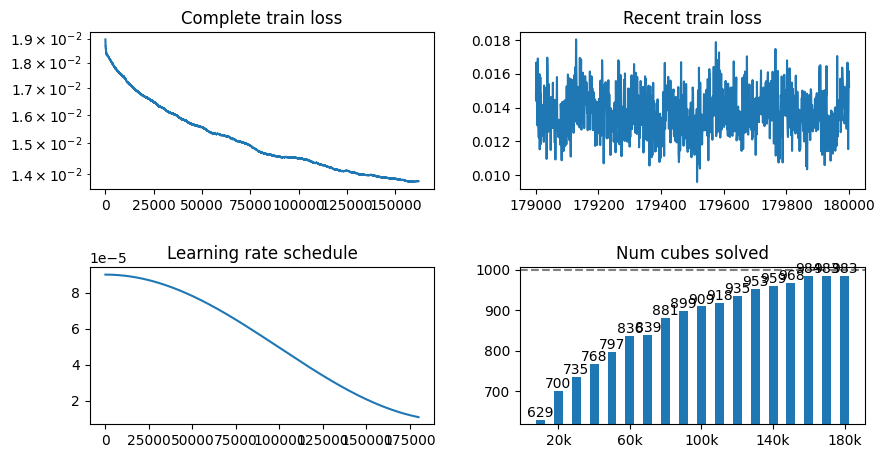

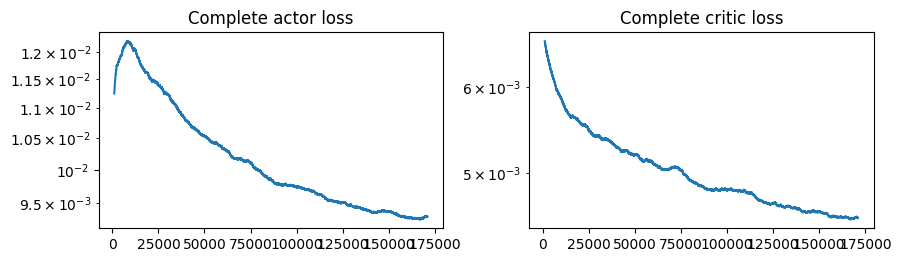

Updating target network after 180200 gradient updates. Time since start: 3:03:13.139187
Updating target network after 180400 gradient updates. Time since start: 3:03:21.719490
Updating target network after 180600 gradient updates. Time since start: 3:03:30.420236
Updating target network after 180800 gradient updates. Time since start: 3:03:39.193170
Updating target network after 181000 gradient updates. Time since start: 3:03:47.915173
Updating target network after 181200 gradient updates. Time since start: 3:03:56.614222
Updating target network after 181400 gradient updates. Time since start: 3:04:05.231614
Updating target network after 181600 gradient updates. Time since start: 3:04:13.814158
Updating target network after 181800 gradient updates. Time since start: 3:04:22.421318
Updating target network after 182000 gradient updates. Time since start: 3:04:31.075224
Updating target network after 182200 gradient updates. Time since start: 3:04:39.617636
Updating target network after 18

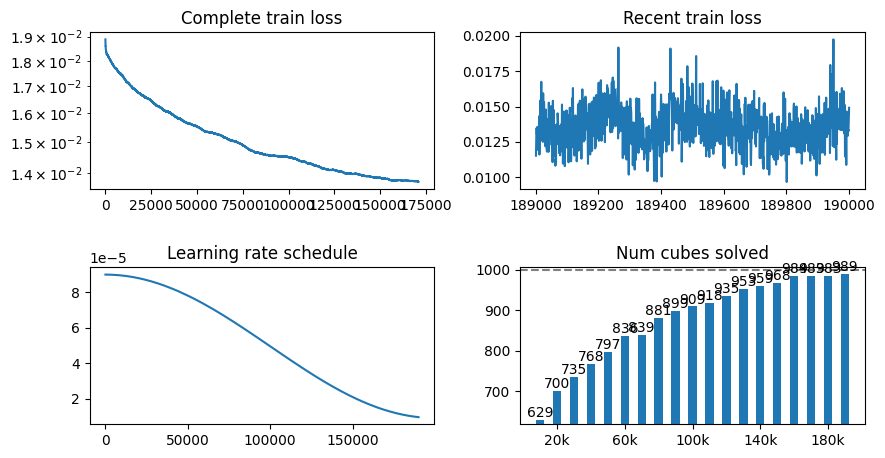

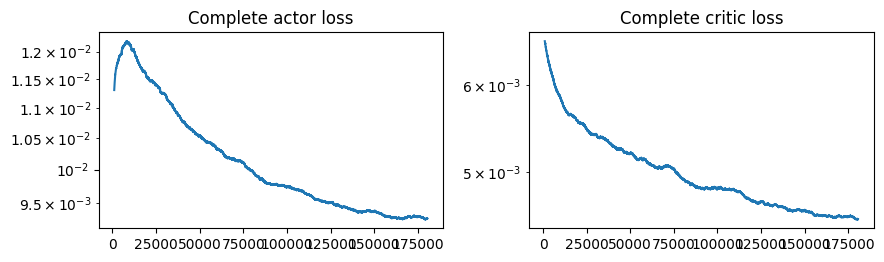

Updating target network after 190200 gradient updates. Time since start: 3:11:02.214950
Updating target network after 190400 gradient updates. Time since start: 3:11:10.865945
Updating target network after 190600 gradient updates. Time since start: 3:11:19.539812
Updating target network after 190800 gradient updates. Time since start: 3:11:28.171944
Updating target network after 191000 gradient updates. Time since start: 3:11:36.741963
Updating target network after 191200 gradient updates. Time since start: 3:11:45.432862
Updating target network after 191400 gradient updates. Time since start: 3:11:54.090968
Updating target network after 191600 gradient updates. Time since start: 3:12:02.720982
Updating target network after 191800 gradient updates. Time since start: 3:12:11.293348
Updating target network after 192000 gradient updates. Time since start: 3:12:19.920060
Updating target network after 192200 gradient updates. Time since start: 3:12:28.560284
Updating target network after 19

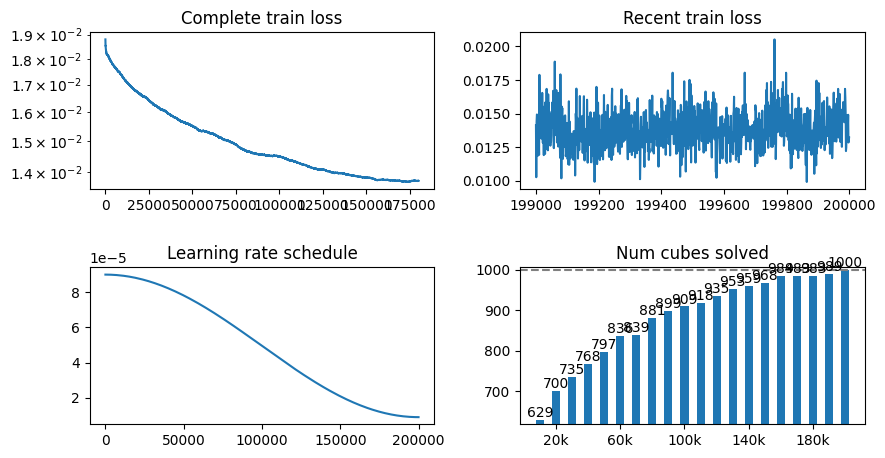

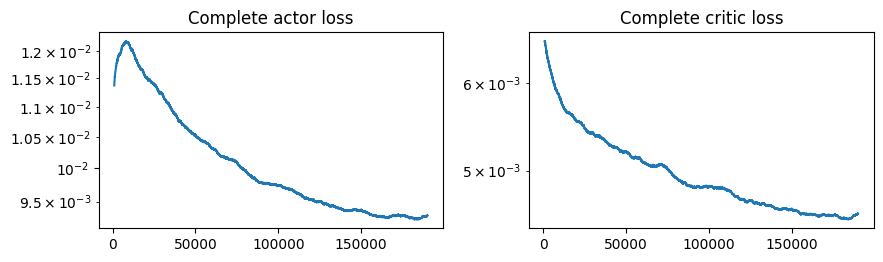

In [ ]:
# Do the actual training.
# Can do 1000 batches of size 512 in ~2m on T4 GPU.
# Can do 1000 batches of size 512 in 45s on V100 GPU.
start = datetime.datetime.now()
seed_rng = jax.random.key(42)
print(f"Started training at {start}. Will train for {n_total_steps} batches.")
episode_rewards = []
for gradient_step in range(n_total_steps):
  # Generate a jax batch of the data.
  original_states, actions, rewards, next_states, is_dones, _ = replay_buffer.sample_batch(
      batch_size, deduplicate_batch=True)
  batch = {
      "original_states": jax.device_put(jnp.array(original_states)),
      "actions": jax.device_put(jnp.array(actions).squeeze()),
      "rewards": jax.device_put(jnp.array(rewards).squeeze()),
      "next_states": jax.device_put(jnp.array(next_states)),
      "is_dones": jax.device_put(jnp.array(is_dones).squeeze()),
  }
  rngs = jax.random.split(seed_rng, num=2)
  seed_rng = rngs[0]
  new_state, losses = train_step(agent.train_state, target_network, batch, rngs[1], gamma, clip_epsilon)
  agent.train_state = new_state
  agent.losses.append(losses[0])
  agent.actor_losses.append(float(losses[1]["actor_loss"]))
  agent.critic_losses.append(float(losses[1]["critic_loss"]))
  lrs.append(scheduler(gradient_step))

  # Update the target network occasionally.
  if gradient_step % target_network_update_frequency == 0 and gradient_step > 0:
    print(f"Updating target network after {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}")
    # Future idea: Could use a tau parameter here and do an EMA style update between online
    # and target network, but replacing the whole thing (essentially tau=1) seems to work fine.
    target_network = train_state_mod.TrainState.create(
        apply_fn=target_ppo.apply,
        params=agent.train_state.params,
        tx=optimizer)

  # Check metrics occasionally.
  if gradient_step % n_eval_steps == 0 and gradient_step > 0:
    print(f"Reached {gradient_step} gradient updates. "
          f"Time since start: {datetime.datetime.now() - start}. "
          f"Replay buffer size is {len(replay_buffer.training_examples)}.")
    metrics_for_agent = get_metrics_for_agent(agent, env)
    print(f"Intermediate transformer PPO evaluation metrics were {metrics_for_agent}")
    cubes_solved_counts.append((gradient_step, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
    plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

  # Update the replay buffer occasionally.
  if gradient_step % n_refresh_buffer_steps == 0 and gradient_step > 0:
    num_examples_to_add = replay_buffer.buffer_size // 8
    print(f"Refreshing replay buffer at step {gradient_step}. Will add {num_examples_to_add} entries.")
    add_examples_to_buffer(replay_buffer, num_examples_to_add)

print(f"Finished training. Time since start: {datetime.datetime.now() - start}")

if cubes_solved_counts[-1][0] != n_total_steps:
  # Perform final evaluation with more steps and some stochasticity in case agent gets stuck
  # in a cycle of repetitive moves.
  original_max_steps_per_rollout = env.max_steps_per_rollout
  original_epsilon = agent.epsilon
  env.max_steps_per_rollout = 100
  agent.epsilon = .1
  final_metrics_for_agent = get_metrics_for_agent(agent, env)
  env.max_steps_per_rollout = original_max_steps_per_rollout
  agent.epsilon = original_epsilon
  print(f"Final transformer PPO evaluation metrics were {final_metrics_for_agent}")
  cubes_solved_counts.append((n_total_steps, final_metrics_for_agent.total_cubes_solved))
plot_agent_metrics(agent.losses, lrs, cubes_solved_counts, 1000)
plot_actor_critic_losses(agent.actor_losses, agent.critic_losses)

## Graph Neural Networks

In this section we explore using GNNs to solve the problem using supervised learning rather than reinforcement learning. We can do this as either a transductive node prediction task or an inductive graph prediction task.

As a primer on GNNs, I created an artificial toy problem and solved it using GCNs and GATs with different frameworks. That notebook can be found [here](https://github.com/dsteiner93/rubiks-ml/blob/main/toy_gnns.ipynb).

[PyTorch Geometric](https://pytorch-geometric.readthedocs.io/en/latest/) is used to implement the networks. For both sections (node prediction and graph prediction), I chose to handle my train and test splits manually, but one could also use `RandomNodeSplit` and `RandomLinkSplit` from https://pytorch-geometric.readthedocs.io/en/latest/tutorial/dataset_splitting.html. However, I found those  trickier to ensure correctness with.

In [ ]:
import collections
import dataclasses
import datetime
import jax
import jax.numpy as jnp
import math
import numpy as np
import optax
import random
import torch
import torch.optim as optim
from torch import nn
from typing import Protocol

In [ ]:
# https://pytorch-geometric.readthedocs.io/en/latest/get_started/introduction.html
!pip install torch_geometric

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.2 MB/s  0:00:00


In [ ]:
from torch_geometric.data import Data as PygData
from torch_geometric.loader import DataLoader as PygDataLoader
from torch_geometric.nn import GCNConv, GATConv, SAGEConv
from torch_geometric.nn import global_mean_pool

In [ ]:
def set_seeds(seed: int) -> None:
  random.seed(seed)
  np.random.seed(seed + 1)
  torch.manual_seed(seed + 2)

In [ ]:
class Node(Protocol):
  node_id: int

@dataclasses.dataclass(frozen=True, kw_only=True)
class CubeNode:
  node_id: int
  cube: RubiksCube2

@dataclasses.dataclass(frozen=True, kw_only=True)
class BlockNode:
  node_id: int
  block: Block

@dataclasses.dataclass(frozen=True, kw_only=True)
class UndirectedEdge:
  # By convention, we'll always put the lower id as the src and higher id as dst.
  src: int
  dst: int

class Graph:

  def __init__(self):
    self.id_to_node: dict[int, Node] = {}
    self.edges: set[UndirectedEdge] = set()
    self.adjacency_list: dict[int, set[int]] = collections.defaultdict(set)

  def add_node(self, node_to_add: Node) -> None:
    if node_to_add.node_id in self.id_to_node:
      raise ValueError(f'Node with id {node_to_add.node_id} is already in the graph.')
    self.id_to_node[node_to_add.node_id] = node_to_add

  def add_edge(self, src: int, dst: int) -> None:
    if src not in self.id_to_node:
      raise ValueError(f'Source {src} not in node ids {self.id_to_node.keys()}')
    if dst not in self.id_to_node:
      raise ValueError(f'Destination {dst} not in node ids {self.id_to_node.keys()}')
    if dst < src:
      tmp = src
      src = dst
      dst = tmp
    edge_to_add = UndirectedEdge(src=src, dst=dst)
    self.edges.add(edge_to_add)
    self.adjacency_list[src].add(dst)
    # Because it is undirected, the edge needs to go both ways.
    self.adjacency_list[dst].add(src)

  def get_adjacency_matrix(self, add_self_loops: bool = False) -> np.ndarray:
    if sorted(list(self.id_to_node.keys())) != list(range(len(self.id_to_node))):
      raise ValueError(f'Node ids {sorted(list(self.id_to_node.keys()))} must be range(len(id_to_node)).')
    adjacency_matrix = np.zeros((len(self.id_to_node), len(self.id_to_node)), dtype=np.int32)
    for node_id, neighbors in self.adjacency_list.items():
      for neighbor in neighbors:
        adjacency_matrix[node_id][neighbor] = 1
      if add_self_loops:
        adjacency_matrix[node_id][node_id] = 1
    return adjacency_matrix

  def get_adjacency_matrix_jnp(self, add_self_loops: bool = False) -> jnp.ndarray:
    return jnp.array(self.get_adjacency_matrix(add_self_loops=add_self_loops))

  def get_edge_connections_coo(self) -> torch.LongTensor:
    # Used by PyTorch Geomtric.
    # COO described here: https://docs.pytorch.org/docs/stable/sparse.html#sparse-coo-docs
    # Since the graph is undirected, we need to specify the edges going in both directions.
    a = torch.LongTensor([[e.src, e.dst] for e in self.edges]).t().reshape((2, -1))
    b = torch.LongTensor([[e.dst, e.src] for e in self.edges]).t().reshape((2, -1))
    return torch.cat([a, b], dim=1)

  def get_copy(self) -> 'Graph':
    # Return a copy of the graph so that it can be edited without affecting the original.
    copy = Graph()
    copy.id_to_node = dict(self.id_to_node)
    copy.edges = set(self.edges)
    copy.adjacency_list.update(self.adjacency_list)
    return copy

In [ ]:
import unittest

class GraphTest(unittest.TestCase):

  def test_graph_representations(self):
    graph = Graph()
    node0 = CubeNode(node_id=0, cube=RubiksCube2())
    node1 = CubeNode(node_id=1, cube=RubiksCube2())
    node2 = CubeNode(node_id=2, cube=RubiksCube2())
    node3 = CubeNode(node_id=3, cube=RubiksCube2())
    graph.add_node(node0)
    graph.add_node(node1)
    graph.add_node(node2)
    graph.add_node(node3)
    graph.add_edge(0, 1)
    graph.add_edge(0, 2)
    graph.add_edge(2, 1)
    graph.add_edge(3, 0)
    expected_adjacency_matrix_no_self_loops = np.array([
        [0, 1, 1, 1],
        [1, 0, 1, 0],
        [1, 1, 0, 0],
        [1, 0, 0, 0],
    ])
    expected_adjacency_matrix_with_self_loops = np.array([
        [1, 1, 1, 1],
        [1, 1, 1, 0],
        [1, 1, 1, 0],
        [1, 0, 0, 1],
    ])
    np.testing.assert_array_equal(
        expected_adjacency_matrix_no_self_loops, graph.get_adjacency_matrix(add_self_loops=False))
    np.testing.assert_array_equal(
        expected_adjacency_matrix_with_self_loops, graph.get_adjacency_matrix(add_self_loops=True))
    np.testing.assert_array_equal(
        expected_adjacency_matrix_no_self_loops, graph.get_adjacency_matrix_jnp(add_self_loops=False))
    np.testing.assert_array_equal(
        expected_adjacency_matrix_with_self_loops, graph.get_adjacency_matrix_jnp(add_self_loops=True))
    coo = graph.get_edge_connections_coo()
    self.assertEqual((2, 8), coo.shape)


unittest.main(GraphTest(), argv=[''], verbosity=2, exit=False)

test_graph_representations (__main__.GraphTest.test_graph_representations) ... ok

----------------------------------------------------------------------
Ran 1 test in 0.049s

OK


### Node Prediction (Cayley Graph)

https://en.wikipedia.org/wiki/Cayley_graph

In this section, each node represents a cube and edges between nodes represent cubes reachable from a given cube in a single turn. Node labels correspond to the estimated distance from the goal. Solving a cube amounts to a node classification task where we check the predictions the GNN makes for all of its neighbors and choose which neighbor to go to following a given strategy, until we reach the goal node.

This section is best run using a CPU and high RAM, as we create a single large graph rather than batches of small graphs, and the large graph we create is too large to fit in most GPU's memory. Also in this section, the number of trials per difficulty level is set to 1 instead of 100 due to computational limits (inference is very slow).

In [ ]:
set_seeds(2)

def generate_graph(
    *,
    env: RubiksCube2Env,
    desired_graph_size: int,
    cap_rollout_steps: int = 30,
    max_extra_steps: int = 0,
    initial_graph: Graph | None = None,
    initial_cube_to_node_id: dict[RubiksCube2, int] | None = None,
    initial_node_id_to_min_distance_seen: dict[int, int] | None = None,
) -> tuple[Graph, dict[RubiksCube2, int], dict[int, int]]:
  # Returns a Graph generated from the rollouts, a dict from cube to node id, and a dict from
  # node id to its associated label (distance from goal).
  # Can either create a new Graph from scratch, or add on to a previously generated graph.
  # We start from the goal state, do random rollouts of length cap_rollout_steps and for each cube
  # keep track of the min distance to the goal we have yet encountered.
  graph = initial_graph or Graph()
  cube_to_node_id = initial_cube_to_node_id or {}
  node_id_to_min_distance_seen = initial_node_id_to_min_distance_seen or {}
  extra_steps_counter = 0

  initial_cube = RubiksCube2()
  if initial_cube not in cube_to_node_id:
    graph.add_node(CubeNode(node_id=0, cube=initial_cube))
    cube_to_node_id[initial_cube] = 0
    node_id_to_min_distance_seen[0] = 0

  current_node_id = len(cube_to_node_id)

  def get_min_of_neighbors(cube: RubiksCube2) -> int | None:
    min_of_neighbors = None
    for action in range(env.action_space.n):
      cube_copy = cube.get_copy()
      env.take_action_on_cube(cube_copy, action)
      if cube_copy in cube_to_node_id:
        if min_of_neighbors is None:
          min_of_neighbors = node_id_to_min_distance_seen[cube_to_node_id[cube_copy]]
        else:
          min_of_neighbors = min(min_of_neighbors, node_id_to_min_distance_seen[cube_to_node_id[cube_copy]])
    return min_of_neighbors

  while current_node_id < desired_graph_size or extra_steps_counter < max_extra_steps:
    env.reset()
    env.cube = RubiksCube2()

    for current_step in range(cap_rollout_steps):
      copy_of_cube_before_move = env.cube.get_copy()
      random_action = env.action_space.sample()
      env.take_action_on_cube(env.cube, random_action)
      copy_of_cube_after_move = env.cube.get_copy()
      if copy_of_cube_after_move not in cube_to_node_id and current_node_id < desired_graph_size:
        # This is our first time seeing this cube.
        graph.add_node(CubeNode(node_id=current_node_id, cube=copy_of_cube_after_move))
        graph.add_edge(cube_to_node_id[copy_of_cube_before_move], current_node_id)
        cube_to_node_id[copy_of_cube_after_move] = current_node_id
        min_of_neighbors = get_min_of_neighbors(copy_of_cube_after_move) or 1_000_000
        node_id_to_min_distance_seen[current_node_id] = min(current_step + 1, min_of_neighbors + 1)
        current_node_id += 1
      elif copy_of_cube_before_move in cube_to_node_id and copy_of_cube_after_move in cube_to_node_id:
        # We have seen this cube before, but we may have learned a new edge for it,
        # or a new shortest path to the goal.
        graph.add_edge(cube_to_node_id[copy_of_cube_before_move], cube_to_node_id[copy_of_cube_after_move])
        node_id_to_update = cube_to_node_id[copy_of_cube_after_move]
        min_of_neighbors = get_min_of_neighbors(copy_of_cube_after_move) or 1_000_000
        node_id_to_min_distance_seen[node_id_to_update] = min(
            node_id_to_min_distance_seen[node_id_to_update], current_step + 1, min_of_neighbors + 1)

      if current_node_id >= desired_graph_size:
        extra_steps_counter += 1

  return graph, cube_to_node_id, node_id_to_min_distance_seen


# Note that even though we use force_canonical_orientation=True here that the Cayley graph set-up
# is aided a bit due to the implementation of the equals and hash code functions on the RubiksCube2
# class itself preventing duplicate cubes from being separate nodes in the graph.
env = RubiksCube2Env(
    state_type=StateType.SIMPLE,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=False,
    allow_easy_initializations=False,
    max_reward=1)

graph, cube_to_node_id, node_id_to_min_distance_seen = generate_graph(
    env=env, desired_graph_size=640_000, max_extra_steps=1_000_000)

check_cube = RubiksCube2()
check_cube.rotate('front', True)
check_cube.rotate('front', True)
print(f'Label for cube that is 2 steps away: {node_id_to_min_distance_seen[cube_to_node_id[check_cube]]}')

distance_to_count = collections.defaultdict(int)
for min_distance in node_id_to_min_distance_seen.values():
  distance_to_count[min_distance] += 1
print(f'Train graph nodes: {len(graph.id_to_node)}. Train graph edges: {len(graph.edges)}.')
print(f'Distance to count for train set: {sorted((k, v) for k, v in distance_to_count.items())}')

Label for cube that is 2 steps away: 2
Train graph nodes: 640000. Train graph edges: 740323.
Distance to count for train set: [(0, 1), (1, 6), (2, 27), (3, 120), (4, 534), (5, 2256), (6, 8953), (7, 28876), (8, 58498), (9, 76796), (10, 82601), (11, 76571), (12, 72097), (13, 58361), (14, 50201), (15, 35652), (16, 28785), (17, 18805), (18, 14907), (19, 8879), (20, 6971), (21, 3745), (22, 2901), (23, 1390), (24, 1095), (25, 436), (26, 316), (27, 104), (28, 90), (29, 13), (30, 13)]


In [ ]:
def convert_graph_to_pyg_data(graph: Graph, labels: list[int], env: RubiksCube2Env) -> PygData:
  # data.x: Node feature matrix with shape [num_nodes, num_node_features]
  # data.edge_index: Graph connectivity in COO format with shape [2, num_edges] and type torch.long
  # data.y: Target to train against (may have arbitrary shape), e.g., node-level targets of shape [num_nodes, *] or graph-level targets of shape [1, *]
  if env.state_type == StateType.SIMPLE:
    all_node_feature_vectors = [
        env.get_observation_for_cube(typing.cast(CubeNode, graph.id_to_node[i]).cube)
        for i in range(len(graph.id_to_node))]
  elif env.state_type == StateType.SPATIAL:
    all_node_feature_vectors = [
        env.get_observation_for_cube(typing.cast(CubeNode, graph.id_to_node[i]).cube).flatten()
        for i in range(len(graph.id_to_node))]
  elif env.state_type == StateType.TOKENIZED_BLOCKS:
    all_node_feature_vectors = [
        env.get_observation_for_cube(typing.cast(CubeNode, graph.id_to_node[i]).cube)
        for i in range(len(graph.id_to_node))]
  else:
    raise ValueError(f"Unsupported env.state_type {env.state_type}")
  h0 = torch.Tensor(np.vstack(all_node_feature_vectors))
  edge_index = graph.get_edge_connections_coo()
  y = torch.tensor(labels, dtype=torch.int64)
  data = PygData(x=h0, edge_index=edge_index, y=y)
  data.validate(raise_on_error=True)
  return data

def get_loss_and_accuracy(
    *,
    gnn: nn.Module,
    device: torch.device,
    regression_mode: bool,
    pyg_data: PygData,
    take_last_n: int | None,
    criterion: nn.MSELoss | nn.CrossEntropyLoss,
    num_outputs: int | None,
) -> tuple[float, float]:
  outputs = gnn.forward(pyg_data.to(device))
  if take_last_n:
    # Look at only the eval set.
    outputs = outputs[-take_last_n:,:]
    targets = pyg_data.y[-take_last_n:]
  else:
    targets = pyg_data.y
  if regression_mode:
    loss = criterion(torch.squeeze(outputs), targets.float())
    denom = take_last_n if take_last_n else targets.shape[0]
    # Accuracy isn't really a thing for regression but might as well get
    # some notion of it by using the round function.
    accuracy = torch.sum(torch.round(torch.squeeze(outputs)) == targets.float()) / denom
  else:
    clamped = torch.clamp(targets, min=0, max=num_outputs-1)
    argmaxed = torch.squeeze(torch.argmax(outputs, dim=1))
    loss = criterion(outputs, clamped)
    denom = take_last_n if take_last_n else targets.shape[0]
    accuracy = torch.sum(argmaxed == clamped) / denom
  return loss, accuracy

# After training an agent, this function will evaluate its performance on cubes of varying
# difficulties. Difficulty = the number of random rotations applied to a solved cube.
def get_metrics_for_agent_graph_based(
    gnn: nn.Module,
    device: torch.device,
    env: RubiksCube2Env,
    graph: Graph,
    cube_to_node_id: dict[RubiksCube2, int],
    difficulty_levels: tuple[int, ...] = (1, 2, 3, 4, 5, 10, 20, 50, 100, 1000),
    num_trials_per_difficulty_level: int = 100,
    remove_cubes_in_train_set_threshold: int | None = None,
    use_greedy_sampling: bool = True,
    disallow_cycles: bool = False,
) -> MetricsForAgent:
  set_seeds(3)
  gnn.to(device)
  gnn.eval()
  graph = graph.get_copy()  # Defensive copy.
  cube_to_node_id = dict(cube_to_node_id)  # Defensive copy.
  difficulty_level_to_metrics = {}
  original_difficulty_level = env.difficulty_level
  original_allow_easy_initializations = env.allow_easy_initializations
  # When evaluating, do not allow easy initializations.
  env.allow_easy_initializations = False
  total_timer = datetime.datetime.now()
  copy_timer = datetime.timedelta(seconds=0)
  forward_pass_timer = datetime.timedelta(seconds=0)
  saved_time_count = 0
  didnt_save_time_count = 0
  pyg_data = convert_graph_to_pyg_data(graph, [], env)
  prev_graph_node_count = len(graph.id_to_node)
  prev_graph_edge_count = len(graph.edges)
  original_graph_len = len(graph.id_to_node)
  solved_cube = RubiksCube2()

  for difficulty_level in difficulty_levels:
    total_reward = 0
    num_cubes_solved = 0
    env.difficulty_level = difficulty_level

    for _ in range(num_trials_per_difficulty_level):
      obs, _ = env.reset()
      while env.cube == solved_cube:
        # Try a different shuffle if by accident the random shuffle resulted in the test cube being
        # the goal cube. This can sometimes happen at low difficulty levels.
        obs, _ = env.reset()
      if remove_cubes_in_train_set_threshold and difficulty_level >= remove_cubes_in_train_set_threshold:
        # Skip cubes we saw in the train set. Note that for some difficulty levels
        # this may be impossible since all cubes of that difficulty could be in the train set.
        while env.cube in cube_to_node_id:
          obs, _ = env.reset()
      visited_cubes = set()

      for step in range(env.max_steps_per_rollout + 1):
        # How to run inference using the trained GNN, i.e. attempt to solve the puzzle
        # for a given cube?
        # We calculate all the neighbors of the current cube and add them to the graph
        # if they were currently missing. Then we calculate the predicted distance from the
        # goal for each of the neighbors. Then we choose to go to the neighbor with the
        # lowest predicted value.
        cube = env.cube.get_copy()
        if cube != solved_cube:
          visited_cubes.add(cube)
        if cube in cube_to_node_id:
          node_id_for_cube = cube_to_node_id[cube]
        else:
          node_id_for_cube = len(cube_to_node_id)
          cube_to_node_id[cube] = node_id_for_cube
          graph.add_node(CubeNode(node_id=node_id_for_cube, cube=cube))

        # Check all of this cube's possible neighbors.
        neighboring_cubes = set()
        neighbor_to_action = {}
        for i in range(env.action_space.n):
          potential_neighbor = cube.get_copy()
          env.take_action_on_cube(potential_neighbor, i)
          neighboring_cubes.add(potential_neighbor)
          neighbor_to_action[potential_neighbor] = i
        neighbors_in_og_graph_count = 0
        neighbors_not_in_og_graph_count = 0
        for neighbor in neighboring_cubes:
          if neighbor not in cube_to_node_id:
            node_id_for_neighbor = len(cube_to_node_id)
            cube_to_node_id[neighbor] = node_id_for_neighbor
            graph.add_node(CubeNode(node_id=node_id_for_neighbor, cube=neighbor))
            graph.add_edge(node_id_for_cube, node_id_for_neighbor)
          else:
            # It's already in the graph so just make sure it has an edge.
            graph.add_edge(node_id_for_cube, cube_to_node_id[neighbor])
          node_id_for_neighbor2 = cube_to_node_id[neighbor]
          if node_id_for_neighbor2 < original_graph_len:
            neighbors_in_og_graph_count += 1
          else:
            neighbors_not_in_og_graph_count += 1

        copy_timer_start = datetime.datetime.now()
        if len(graph.id_to_node) > prev_graph_node_count or len(graph.edges) > prev_graph_edge_count:
          # Labels can be empty here since we are just doing a forward pass.
          pyg_data = convert_graph_to_pyg_data(graph, [], env)
          prev_graph_node_count = len(graph.id_to_node)
          prev_graph_edge_count = len(graph.edges)
          didnt_save_time_count += 1
        else:
          saved_time_count += 1
        copy_timer += (datetime.datetime.now() - copy_timer_start)
        forward_pass_timer_start = datetime.datetime.now()
        forward = gnn.forward(pyg_data.to(device))
        forward_pass_timer += (datetime.datetime.now() - forward_pass_timer_start)

        randomly_selected_neighbor = random.choice(list(neighboring_cubes))
        if disallow_cycles:
          neighboring_cubes = neighboring_cubes - visited_cubes
        if not neighboring_cubes:
          min_neighbor_cube = randomly_selected_neighbor
        else:
          # If there is a tie it will take the lower indexed element, which we know is going to be
          # closer to the goal because of the way we built the original graph. To avoid this
          # possibly overrepresenting the performance, I shuffle the neighbors randomly instead
          # of sorting.
          # sorted_neighbors = sorted(
          #     [(cube_to_node_id[neighbor], neighbor) for neighbor in neighboring_cubes],
          #     key=lambda t: t[0])
          shuffled_neighbors = [(cube_to_node_id[neighbor], neighbor) for neighbor in neighboring_cubes]
          random.shuffle(shuffled_neighbors)
          neighbor_results = forward[[t[0] for t in shuffled_neighbors]]  # Shape should be [num_neighbors, num_outputs]
          if neighbor_results.shape[1] == 1:
            # Regression case.
            if not use_greedy_sampling:
              raise ValueError('Non-greedy sampling at eval time is not supported in regression mode.')
            argmined = int(torch.argmin(neighbor_results.squeeze()))
            min_neighbor_cube = shuffled_neighbors[argmined][1]
          else:
            # Classification case.
            if use_greedy_sampling:
              # For each action, pick the minimum distance estimated.
              argmaxed = torch.argmax(neighbor_results, dim=1)  # Should be shape [num_neighbors,]
              argmined = int(torch.argmin(argmaxed))
              min_neighbor_cube = shuffled_neighbors[argmined][1]
            else:
              # For each action, first sample the logits to pick the prediction, rather than argmaxing.
              num_output_buckets = neighbor_results.shape[1]
              # First, pick the expected distance from the goal for all neighbors.
              sampled = torch.multinomial(torch.nn.functional.softmax(neighbor_results, dim=1), 1)
              # Then for the options of what to pick, weight them so that we will sample things
              # we think are closer to the goal with a higher probability (but we won't always
              # select the action we think gets us closer to the goal with 100% probability).
              sample_among_neighbors = torch.multinomial(
                  torch.nn.functional.softmax((float(num_output_buckets) - sampled.flatten()), dim=0), 1)
              min_neighbor_cube = shuffled_neighbors[int(sample_among_neighbors)][1]

        print(f'Difficulty level {difficulty_level}, step {step}, neighbors in {neighbors_in_og_graph_count}, '
              f'neighbors NOT in {neighbors_not_in_og_graph_count}, id {node_id_for_cube}, '
              f'action taken {neighbor_to_action[min_neighbor_cube]}, neighbor cube id {cube_to_node_id[min_neighbor_cube]}')
        _, reward, done, _, _ = env.step(neighbor_to_action[min_neighbor_cube])
        total_reward += reward
        if done:
          if env.cube.is_solved():
            num_cubes_solved += 1
          break

    difficulty_level_to_metrics[difficulty_level] = {
        'num trials': num_trials_per_difficulty_level,
        'num cubes solved': num_cubes_solved,
        'total reward': total_reward,
        'average reward': float(total_reward) / num_trials_per_difficulty_level,
    }

  print(f'Total time to eval: {(datetime.datetime.now() - total_timer)}. '
        f'Time spent copying: {copy_timer}. Time spent on forward passes: {forward_pass_timer}.')
  # Return the environment to its original settings.
  env.reset()
  env.difficulty_level = original_difficulty_level
  env.allow_easy_initializations = original_allow_easy_initializations
  total_cubes_solved = sum(e['num cubes solved'] for e in difficulty_level_to_metrics.values())
  total_cubes_attempted = sum(e['num trials'] for e in difficulty_level_to_metrics.values())
  gnn.train()
  return MetricsForAgent(
      total_cubes_solved=total_cubes_solved,
      total_cubes_attempted=total_cubes_attempted,
      difficulty_level_to_metrics=difficulty_level_to_metrics)

In [ ]:
# Create a larger graph with additional held out nodes.
eval_set_size = 40_000
eval_graph, eval_cube_to_node_id, eval_node_id_to_min_distance_seen = generate_graph(
    env=env,
    desired_graph_size=len(cube_to_node_id) + eval_set_size,
    max_extra_steps=100_000,
    initial_graph=graph.get_copy(),
    initial_cube_to_node_id=dict(cube_to_node_id),
    initial_node_id_to_min_distance_seen=dict(node_id_to_min_distance_seen))
eval_labels = [eval_node_id_to_min_distance_seen[i] for i in range(len(eval_graph.id_to_node))]
eval_pyg_data = convert_graph_to_pyg_data(eval_graph, eval_labels, env)

print(f'Train graph nodes: {len(graph.id_to_node)}. Train graph edges: {len(graph.edges)}.')
print(f'Eval graph nodes: {len(eval_graph.id_to_node)}. Eval graph edges: {len(eval_graph.edges)}.')

Train graph nodes: 640000. Train graph edges: 740323.
Eval graph nodes: 680000. Eval graph edges: 789719.


Node feature vector len was 144
Param count 408212
Difficulty level 1, step 0, neighbors in 6, neighbors NOT in 0, id 1, action taken 11, neighbor cube id 25
Difficulty level 1, step 1, neighbors in 6, neighbors NOT in 0, id 25, action taken 11, neighbor cube id 1463
Difficulty level 1, step 2, neighbors in 6, neighbors NOT in 0, id 1463, action taken 7, neighbor cube id 3409
Difficulty level 1, step 3, neighbors in 6, neighbors NOT in 0, id 3409, action taken 10, neighbor cube id 27084
Difficulty level 1, step 4, neighbors in 6, neighbors NOT in 0, id 27084, action taken 2, neighbor cube id 27085
Difficulty level 1, step 5, neighbors in 6, neighbors NOT in 0, id 27085, action taken 10, neighbor cube id 27086
Difficulty level 1, step 6, neighbors in 4, neighbors NOT in 2, id 27086, action taken 7, neighbor cube id 243123
Difficulty level 1, step 7, neighbors in 3, neighbors NOT in 3, id 243123, action taken 2, neighbor cube id 243124
Difficulty level 1, step 8, neighbors in 1, neighbor

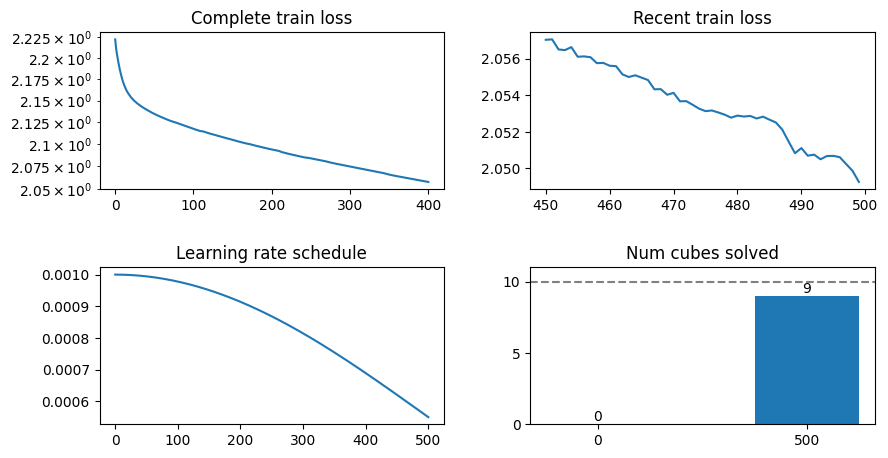

Finished 600 of 1000 epochs. Time since start: 3:14:50.053913. Train loss was 2.0348. Train accuracy was 0.2534. Eval loss was 2.1537. Eval accuracy was 0.1970.
Finished 700 of 1000 epochs. Time since start: 3:43:50.895238. Train loss was 2.0218. Train accuracy was 0.2596. Eval loss was 2.1618. Eval accuracy was 0.1965.
Finished 800 of 1000 epochs. Time since start: 4:12:54.666215. Train loss was 2.0116. Train accuracy was 0.2651. Eval loss was 2.1668. Eval accuracy was 0.1975.
Finished 900 of 1000 epochs. Time since start: 4:40:50.684454. Train loss was 2.0046. Train accuracy was 0.2679. Eval loss was 2.1709. Eval accuracy was 0.1966.
Finished 1000 of 1000 epochs. Time since start: 5:06:55.687214. Train loss was 1.9985. Train accuracy was 0.2714. Eval loss was 2.1740. Eval accuracy was 0.1940.
Difficulty level 1, step 0, neighbors in 6, neighbors NOT in 0, id 1, action taken 2, neighbor cube id 0
Difficulty level 2, step 0, neighbors in 6, neighbors NOT in 0, id 295, action taken 10, 

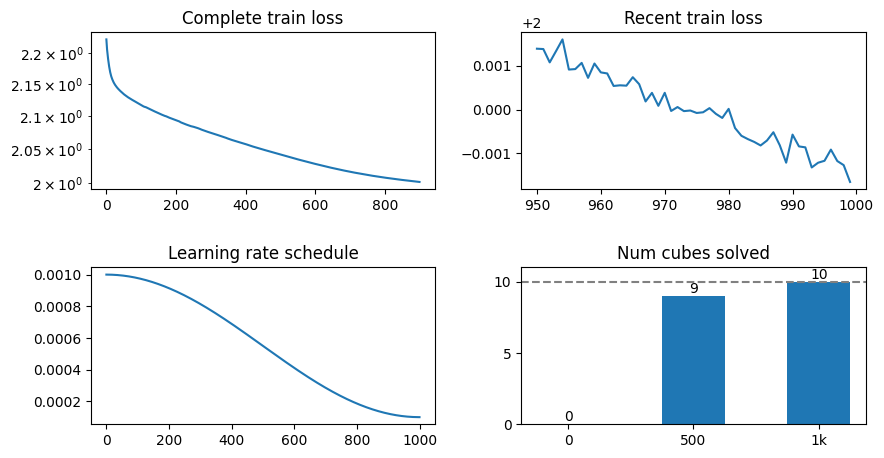

In [ ]:
# Regular PyGCN
set_seeds(2)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class PygGCN(nn.Module):

  def __init__(self, *, node_feature_vector_len: int, num_outputs: int):
    # There are two options for num_outputs. If num_outputs is 1, we will solve the problem
    # as a regression task where we aim to predict the number of moves it will take to reach
    # the goal state. Otherwise we will treat it as a one-hot classification task where index
    # 0 indicates 0 moves from the goal, index 1 indicates 1 move from the goal, etc., up to
    # the max value of num_outputs.
    # At eval/inference time we will create a cube for all of a cube's possible neighbors, add those
    # to the graph, then we make a prediction for each neighbor and choose the neighbor that is
    # predicted to be nearest to the goal.
    super().__init__()
    self.dropout_rate = .01
    self.gcn_conv_1 = GCNConv(node_feature_vector_len, node_feature_vector_len*2, add_self_loops=False, normalize=False, bias=True)
    self.self_update_1 = nn.Linear(node_feature_vector_len, node_feature_vector_len*2)
    self.gcn_conv_2 = GCNConv(node_feature_vector_len*2, node_feature_vector_len*2, add_self_loops=False, normalize=False, bias=True)
    self.self_update_2 = nn.Linear(node_feature_vector_len*2, node_feature_vector_len*2)
    self.classification_head = nn.Sequential(
        nn.Linear(node_feature_vector_len*2, 512),
        nn.ReLU(),
        nn.Linear(512, num_outputs),
    )

  def forward(self, data: PygData) -> torch.Tensor:
    x, edge_index = data.x, data.edge_index
    x = self.gcn_conv_1(x, edge_index) + self.self_update_1(x)
    x = nn.functional.relu(x)
    x = nn.functional.dropout(x, p=self.dropout_rate, training=self.training)
    x = self.gcn_conv_2(x, edge_index) + self.self_update_2(x)
    x = nn.functional.relu(x)
    x = nn.functional.dropout(x, p=self.dropout_rate, training=self.training)
    return self.classification_head(x)


labels = [node_id_to_min_distance_seen[i] for i in range(len(graph.id_to_node))]
pyg_data = convert_graph_to_pyg_data(graph, labels, env).to(device)

if env.state_type == StateType.SIMPLE:
  node_feature_vector_len = env.get_observation_for_cube(RubiksCube2()).shape[0]
  print(f"Node feature vector len was {node_feature_vector_len}")
elif env.state_type == StateType.SPATIAL:
  node_feature_vector_len = env.get_observation_for_cube(RubiksCube2()).flatten().shape[0]
  print(f"Node feature vector len was {node_feature_vector_len}")
else:
  raise ValueError(f"Unsupported env.state_type {env.state_type}")

regression_mode = False
num_outputs = 1 if regression_mode else 20
pyg_gcn = PygGCN(node_feature_vector_len=node_feature_vector_len, num_outputs=num_outputs).to(device)
print(f"Param count {sum(param.numel() for param in pyg_gcn.parameters())}")

cubes_solved_counts = []
# Calculate initial metrics before any training.
metrics_for_agent = get_metrics_for_agent_graph_based(
    pyg_gcn,
    device,
    env,
    graph,
    cube_to_node_id,
    num_trials_per_difficulty_level=1,
    remove_cubes_in_train_set_threshold=10,
    use_greedy_sampling=True,
    disallow_cycles=True,
)
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

num_epochs = 1000
if regression_mode:
  criterion = nn.MSELoss()
else:
  criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(pyg_gcn.parameters(), lr=.001)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=num_epochs,
    eta_min=.0001)
all_losses = []
lrs: list[float] = [scheduler.get_last_lr()[0]]
plot_every_n_epochs = 500
start = datetime.datetime.now()
print(f"Beginning training for {num_epochs} epochs at {start}...")
for epoch in range(num_epochs):
  # In this variant of the problem, we just have 1 giant graph per epoch.
  optimizer.zero_grad()
  outputs = pyg_gcn.forward(pyg_data)  # [batch_size, num_outputs]
  if regression_mode:
    train_loss = criterion(torch.squeeze(outputs), pyg_data.y.float())
  else:
    train_loss = criterion(outputs, torch.clamp(pyg_data.y, min=0, max=num_outputs-1))
  all_losses.append(float(train_loss))
  train_loss.backward()
  optimizer.step()
  scheduler.step()
  lrs.extend(scheduler.get_last_lr())

  if ((epoch + 1) % 100 == 0) or (epoch == num_epochs - 1):
    train_loss, train_accuracy = get_loss_and_accuracy(
        gnn=pyg_gcn,
        device=device,
        regression_mode=regression_mode,
        pyg_data=pyg_data,
        take_last_n=None,
        criterion=criterion,
        num_outputs=num_outputs,
    )
    eval_loss, eval_accuracy = get_loss_and_accuracy(
        gnn=pyg_gcn,
        device=device,
        regression_mode=regression_mode,
        pyg_data=eval_pyg_data,
        take_last_n=eval_set_size,
        criterion=criterion,
        num_outputs=num_outputs,
    )
    print(f"Finished {epoch+1} of {num_epochs} epochs. Time since start: {datetime.datetime.now() - start}. "
          f"Train loss was {train_loss:.4f}. Train accuracy was {train_accuracy:.4f}. "
          f"Eval loss was {eval_loss:.4f}. Eval accuracy was {eval_accuracy:.4f}.")
  if ((epoch + 1) % plot_every_n_epochs == 0 and epoch > 0) or (epoch == num_epochs - 1):
    metrics_for_agent = get_metrics_for_agent_graph_based(
        pyg_gcn,
        device,
        env,
        graph,
        cube_to_node_id,
        num_trials_per_difficulty_level=1,
        remove_cubes_in_train_set_threshold=10,
        use_greedy_sampling=True,
        disallow_cycles=True,
    )
    cubes_solved_counts.append((epoch + 1, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(all_losses, lrs, cubes_solved_counts, 50, max_solvable_cubes=metrics_for_agent.total_cubes_attempted)

### Graph Prediction

In this section, instead of using the cubes as nodes in a graph, we treat each cube as its own graph and make a graph-level prediction. In these graphs, each node is a block and edges are added between directly adjacent blocks (without diagonal connections). Each graph is given a label that corresponds to the estimated number of rotations required to reach the goal state (the solved cube). Similar to the node prediction section above, we solve a given shuffled cube by checking the predictions our trained GNN makes for all of its neighbors and choose which neighbor to go to following a given strategy, until we reach the goal state.

This section is best run on a GPU as we batch many small graphs together during training and inference.

In [ ]:
set_seeds(2)

def convert_cube_to_graph(cube: RubiksCube2) -> Graph:
  # Looking at the cube from the front we label the blocks
  #     0 1         4 5
  #     2 3         6 7
  # front face    back face
  # where 4 is the block behind 0, 5 is behind 1, etc.
  # We will treat each block as a node in the graph and connect blocks that directly
  # neighbor each other (without diagonal connections).
  nodes = [BlockNode(node_id=i, block=block) for i, block in enumerate(cube.blocks)]
  graph = Graph()
  for node in nodes:
    graph.add_node(node)
  graph.add_edge(0, 1)
  graph.add_edge(0, 2)
  graph.add_edge(0, 4)
  graph.add_edge(1, 3)
  graph.add_edge(1, 5)
  graph.add_edge(2, 3)
  graph.add_edge(2, 6)
  graph.add_edge(3, 7)
  graph.add_edge(4, 5)
  graph.add_edge(4, 6)
  graph.add_edge(5, 7)
  graph.add_edge(6, 7)
  return graph

def generate_dataset(
    *,
    env: RubiksCube2Env,
    train_set_size: int,
    eval_set_size: int,
    cap_rollout_steps: int = 30,
    extra_rollouts: int = 0,
) -> tuple[set[RubiksCube2], list[Graph], list[int], list[Graph], list[int]]:
  train_set = []
  eval_set = []
  seen_cubes = set()
  cube_to_min_distance_seen: dict[RubiksCube2, int] = {}

  def get_min_of_neighbors(cube: RubiksCube2) -> int | None:
    min_of_neighbors = None
    for action in range(env.action_space.n):
      cube_copy = cube.get_copy()
      env.take_action_on_cube(cube_copy, action)
      if cube_copy in cube_to_min_distance_seen:
        if min_of_neighbors is None:
          min_of_neighbors = cube_to_min_distance_seen[cube_copy]
        else:
          min_of_neighbors = min(min_of_neighbors, cube_to_min_distance_seen[cube_copy])
    return min_of_neighbors

  def add_to_dataset_if_necessary(dataset: list[RubiksCube2], dataset_max_size: int) -> None:
    env.reset()
    env.cube = RubiksCube2()

    for current_step in range(cap_rollout_steps):
      copy_of_cube_before_move = env.cube.get_copy()
      if copy_of_cube_before_move not in seen_cubes and len(dataset) < dataset_max_size:
        dataset.append(copy_of_cube_before_move)
        seen_cubes.add(copy_of_cube_before_move)
        min_of_neighbors = get_min_of_neighbors(copy_of_cube_before_move) or 1_000_000
        cube_to_min_distance_seen[copy_of_cube_before_move] = min(
            cube_to_min_distance_seen.get(copy_of_cube_before_move, 1_000_000),
            current_step,
            min_of_neighbors + 1)
      else:
        # We don't want to add the cube to the dataset but it may be worth updating
        # the min distance seen for it.
        min_of_neighbors = get_min_of_neighbors(copy_of_cube_before_move) or 1_000_000
        cube_to_min_distance_seen[copy_of_cube_before_move] = min(
            cube_to_min_distance_seen.get(copy_of_cube_before_move, 1_000_000),
            current_step,
            min_of_neighbors + 1)
      random_action = env.action_space.sample()
      env.take_action_on_cube(env.cube, random_action)

  while len(train_set) < train_set_size:
    add_to_dataset_if_necessary(train_set, train_set_size)
  for _ in range(extra_rollouts):
    # Optionally perform extra rollouts to discover tighter bounds for the predicted labels.
    add_to_dataset_if_necessary(train_set, train_set_size)

  while len(eval_set) < eval_set_size:
    add_to_dataset_if_necessary(eval_set, eval_set_size)
  for _ in range(extra_rollouts):
    # Optionally perform extra rollouts to discover tighter bounds for the predicted labels.
    add_to_dataset_if_necessary(eval_set, eval_set_size)

  assert len(set(train_set) & set(eval_set)) == 0
  train_labels = [cube_to_min_distance_seen[cube] for cube in train_set]
  eval_labels = [cube_to_min_distance_seen[cube] for cube in eval_set]
  train_set_as_graphs = [convert_cube_to_graph(cube) for cube in train_set]
  eval_set_as_graphs = [convert_cube_to_graph(cube) for cube in eval_set]
  return (set(train_set), train_set_as_graphs, train_labels, eval_set_as_graphs, eval_labels)


# Ideally we would use force_canonical_orientation=False here, as one of the selling points we
# listed at the start is that GNNs should recognize and handle permutation invariance more easily
# than other architectures. However, that seems to not be the case here and we find the performance
# dips substantially when not using canonical orientations.
env = RubiksCube2Env(
    state_type=StateType.TOKENIZED_BLOCKS,
    reward_type=RewardType.SIMPLE,
    force_canonical_orientation=True,
    allow_easy_initializations=False,
    max_reward=1)

train_set_cubes, train_set, train_labels, eval_set, eval_labels = generate_dataset(
    env=env, train_set_size=1_280_000, eval_set_size=40_000, cap_rollout_steps=30, extra_rollouts=20_000)

distance_to_count = collections.defaultdict(int)
for min_distance in train_labels:
  distance_to_count[min_distance] += 1
print(f"Distance to count for train set: {sorted((k, v) for k, v in distance_to_count.items())}")
print(f"Train set size: {len(train_set)}")
print(f"Train labels size: {len(train_labels)}")
print(f"Eval set size: {len(eval_set)}")
print(f"Eval labels size: {len(eval_labels)}")

Distance to count for train set: [(0, 1), (1, 6), (2, 27), (3, 120), (4, 534), (5, 2256), (6, 8969), (7, 32733), (8, 93558), (9, 176912), (10, 223101), (11, 232261), (12, 178811), (13, 132486), (14, 76051), (15, 49436), (16, 26970), (17, 18366), (18, 10143), (19, 7246), (20, 3890), (21, 2866), (22, 1381), (23, 1022), (24, 396), (25, 299), (26, 86), (27, 63), (28, 6), (29, 4)]
Train set size: 1280000
Train labels size: 1280000
Eval set size: 40000
Eval labels size: 40000


In [ ]:
def convert_graph_to_pyg_data(graph: Graph, label: int, env: RubiksCube2Env) -> PygData:
  # data.x: Node feature matrix with shape [8]
  # data.edge_index: Graph connectivity in COO format with shape [2, num_edges] and type torch.long
  # data.y: Target to train against (may have arbitrary shape), e.g., graph-level targets of shape [1, *]
  if env.state_type == StateType.TOKENIZED_BLOCKS:
    cube = RubiksCube2(
        blocks=[typing.cast(BlockNode, graph.id_to_node[i]).block for i in range(len(graph.id_to_node))]
    )
    tokenized_blocks = env.get_observation_for_cube(cube)
  else:
    raise ValueError(f"Unsupported env.state_type {env.state_type}")
  h0 = torch.Tensor(tokenized_blocks)
  edge_index = graph.get_edge_connections_coo()
  y = torch.tensor(label, dtype=torch.int64)
  data = PygData(x=h0, edge_index=edge_index, y=y)
  data.validate(raise_on_error=True)
  return data

def get_loss_and_accuracy(
    *,
    gnn: nn.Module,
    device: torch.device,
    pyg_data: PygData,
    criterion: nn.CrossEntropyLoss,
    num_outputs: int,
) -> tuple[float, float]:
  outputs = gnn.forward(pyg_data.to(device))
  targets = pyg_data.y
  clamped = torch.clamp(targets, min=0, max=num_outputs-1)
  argmaxed = torch.squeeze(torch.argmax(outputs, dim=1))
  loss = criterion(outputs, clamped)
  accuracy = torch.sum(argmaxed == clamped) / targets.shape[0]
  return loss, accuracy

# After training an agent, this function will evaluate its performance on cubes of varying
# difficulties. Difficulty = the number of random rotations applied to a solved cube.
def get_metrics_for_agent_graph_based(
    gnn: nn.Module,
    device: torch.device,
    env: RubiksCube2Env,
    difficulty_levels: tuple[int, ...] = (1, 2, 3, 4, 5, 10, 20, 50, 100, 1000),
    num_trials_per_difficulty_level: int = 100,
    remove_cubes_in_train_set_threshold: int | None = None,
    train_set_cubes: set[RubiksCube2] | None = None,
    disallow_cycles: bool = False,
) -> MetricsForAgent:
  set_seeds(3)
  gnn.to(device)
  gnn.eval()
  difficulty_level_to_metrics = {}
  original_difficulty_level = env.difficulty_level
  original_allow_easy_initializations = env.allow_easy_initializations
  # When evaluating, do not allow easy initializations.
  env.allow_easy_initializations = False
  total_timer = datetime.datetime.now()
  forward_pass_timer = datetime.timedelta(seconds=0)
  solved_cube = RubiksCube2()

  for difficulty_level in difficulty_levels:
    total_reward = 0
    num_cubes_solved = 0
    env.difficulty_level = difficulty_level

    for _ in range(num_trials_per_difficulty_level):
      obs, _ = env.reset()
      while env.cube == solved_cube:
        # Try a different shuffle if by accident the random shuffle resulted in the test cube being
        # the goal cube. This can sometimes happen at low difficulty levels.
        obs, _ = env.reset()
      if remove_cubes_in_train_set_threshold and difficulty_level >= remove_cubes_in_train_set_threshold:
        # Skip cubes we saw in the train set. Note that for some difficulty levels
        # this may be impossible since all cubes of that difficulty could be in the train set.
        while env.cube in (train_set_cubes or set()):
          obs, _ = env.reset()
      visited_cubes = set()

      for step in range(env.max_steps_per_rollout + 1):
        # How to run inference using the trained GNN, i.e. attempt to solve the puzzle
        # for a given cube?
        # We calculate all the neighbors of the current cube, then we calculate the predicted
        # distance from the goal for each of the neighbors. Then we choose to go to the neighbor
        # with the lowest predicted value.
        cube = env.cube.get_copy()
        if cube != solved_cube:
          visited_cubes.add(cube)

        # Check all of this cube's possible neighbors.
        neighboring_cubes = set()
        neighbor_to_action = {}
        for i in range(env.action_space.n):
          potential_neighbor = cube.get_copy()
          env.take_action_on_cube(potential_neighbor, i)
          neighboring_cubes.add(potential_neighbor)
          neighbor_to_action[potential_neighbor] = i

        randomly_selected_neighbor = random.choice(list(neighboring_cubes))
        if disallow_cycles:
          neighboring_cubes = neighboring_cubes - visited_cubes
        if not neighboring_cubes:
          min_neighbor_cube = randomly_selected_neighbor
        else:
          neighboring_cube_graphs = [convert_cube_to_graph(cube) for cube in neighboring_cubes]
          neighboring_cube_pyg_data = [convert_graph_to_pyg_data(graph, -1, env) for graph in neighboring_cube_graphs]
          # Combine them into one large graph using PygDataLoader.
          neighboring_cube_loader = PygDataLoader(neighboring_cube_pyg_data, batch_size=len(neighboring_cube_graphs))
          pyg_data = next(iter(neighboring_cube_loader))
          assert torch.all(pyg_data.x == torch.hstack([g.x for g in neighboring_cube_pyg_data]))
          forward_pass_timer_start = datetime.datetime.now()
          forward = gnn.forward(pyg_data.to(device))
          forward_pass_timer += (datetime.datetime.now() - forward_pass_timer_start)
          # If there is a tie it will take the lower indexed element, which we know is going to be
          # closer to the goal because of the way we built the original graph. To avoid this
          # possibly overrepresenting the performance, I shuffle the neighbors randomly instead
          # of sorting.
          shuffled_neighbors = list(range(forward.shape[0]))
          random.shuffle(shuffled_neighbors)
          neighbor_results = forward[shuffled_neighbors]  # Shape should be [num_neighbors, num_outputs]
          # For each action, pick the minimum distance estimated.
          argmaxed = torch.argmax(neighbor_results, dim=1)  # Should be shape [num_neighbors,]
          argmined = int(torch.argmin(argmaxed))
          min_neighbor_cube_graph = neighboring_cube_graphs[shuffled_neighbors[argmined]]
          min_neighbor_cube = RubiksCube2(
              blocks=[typing.cast(BlockNode, min_neighbor_cube_graph.id_to_node[i]).block
                      for i in range(len(min_neighbor_cube_graph.id_to_node))]
          )

        _, reward, done, _, _ = env.step(neighbor_to_action[min_neighbor_cube])
        total_reward += reward
        if done:
          if env.cube.is_solved():
            num_cubes_solved += 1
          break

    difficulty_level_to_metrics[difficulty_level] = {
        'num trials': num_trials_per_difficulty_level,
        'num cubes solved': num_cubes_solved,
        'total reward': total_reward,
        'average reward': float(total_reward) / num_trials_per_difficulty_level,
    }

  print(f'Total time to eval: {(datetime.datetime.now() - total_timer)}. '
        f'Time spent on forward passes: {forward_pass_timer}.')
  # Return the environment to its original settings.
  env.reset()
  env.difficulty_level = original_difficulty_level
  env.allow_easy_initializations = original_allow_easy_initializations
  total_cubes_solved = sum(e['num cubes solved'] for e in difficulty_level_to_metrics.values())
  total_cubes_attempted = sum(e['num trials'] for e in difficulty_level_to_metrics.values())
  gnn.train()
  return MetricsForAgent(
      total_cubes_solved=total_cubes_solved,
      total_cubes_attempted=total_cubes_attempted,
      difficulty_level_to_metrics=difficulty_level_to_metrics)

Node feature vector len was 8
Param count 1399316
Total time to eval: 0:03:51.721431. Time spent on forward passes: 0:01:03.799344.
Beginning training for 1000 epochs at 2025-08-08 22:19:11.999530...
Finished 100 of 1000 epochs. Time since start: 1:24:43.665506. Train loss was 1.5094. Train accuracy was 0.4189. Eval loss was 3.0439. Eval accuracy was 0.2131.
Finished 200 of 1000 epochs. Time since start: 2:49:55.121170. Train loss was 1.4644. Train accuracy was 0.4199. Eval loss was 3.8171. Eval accuracy was 0.2157.
Finished 300 of 1000 epochs. Time since start: 4:14:05.158665. Train loss was 1.3844. Train accuracy was 0.4536. Eval loss was 4.6095. Eval accuracy was 0.2049.
Finished 400 of 1000 epochs. Time since start: 5:38:00.591933. Train loss was 1.3555. Train accuracy was 0.4668. Eval loss was 5.2622. Eval accuracy was 0.2064.
Finished 500 of 1000 epochs. Time since start: 7:02:22.691502. Train loss was 1.2155. Train accuracy was 0.5161. Eval loss was 6.8857. Eval accuracy was 0.2

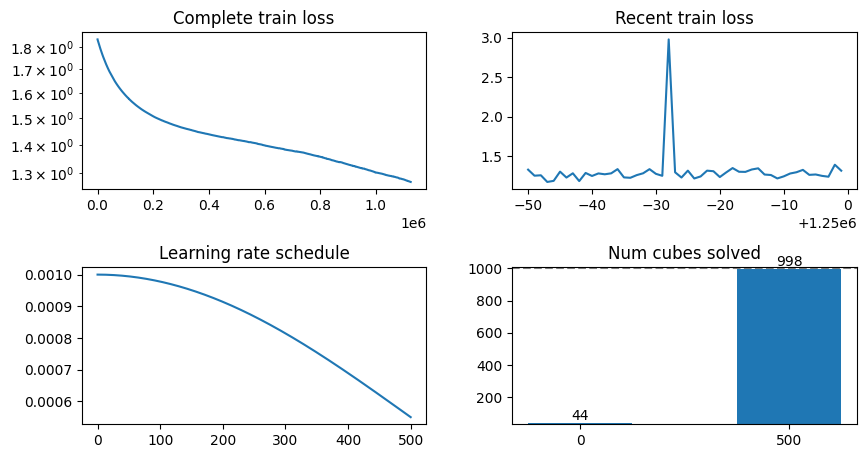

Finished 600 of 1000 epochs. Time since start: 8:27:57.891873. Train loss was 1.1686. Train accuracy was 0.5493. Eval loss was 9.2777. Eval accuracy was 0.1981.
Finished 700 of 1000 epochs. Time since start: 9:52:19.435426. Train loss was 1.0649. Train accuracy was 0.5864. Eval loss was 13.1514. Eval accuracy was 0.1977.
Finished 800 of 1000 epochs. Time since start: 11:16:48.006098. Train loss was 1.0023. Train accuracy was 0.6089. Eval loss was 18.0161. Eval accuracy was 0.1937.
Finished 900 of 1000 epochs. Time since start: 12:42:19.199295. Train loss was 0.9731. Train accuracy was 0.6289. Eval loss was 23.4111. Eval accuracy was 0.1981.
Finished 1000 of 1000 epochs. Time since start: 14:07:39.151162. Train loss was 0.9358. Train accuracy was 0.6426. Eval loss was 28.0997. Eval accuracy was 0.1887.
Total time to eval: 0:00:43.098126. Time spent on forward passes: 0:00:11.428075.


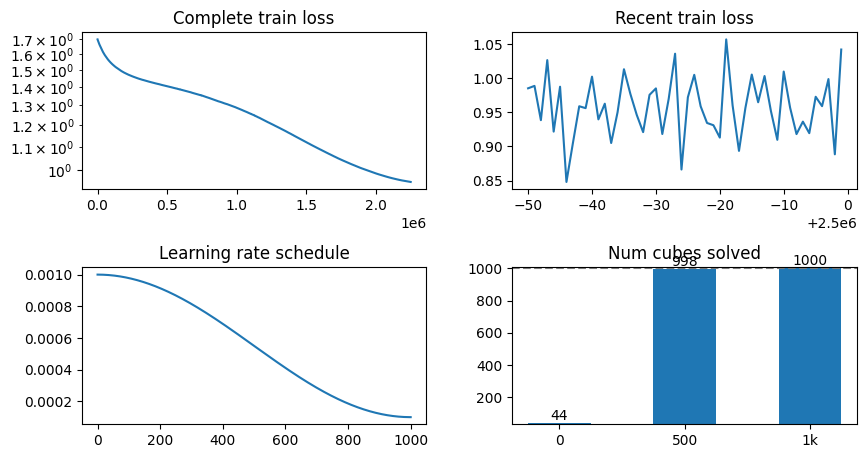

In [ ]:
# Regular PyGCN
set_seeds(2)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class PygGCN(nn.Module):

  def __init__(self, *, vocab_size: int, embed_dim: int, num_outputs: int):
    # At eval/inference time we will create a cube for all of a cube's possible neighbors, add those
    # to the graph, then we make a prediction for each neighbor and choose the neighbor that is
    # predicted to be nearest to the goal.
    super().__init__()
    self.embed = nn.Embedding(vocab_size, embed_dim)
    self.gcn_conv_1 = GCNConv(embed_dim, embed_dim, add_self_loops=False, normalize=False, bias=True)
    self.self_update_1 = nn.Linear(embed_dim, embed_dim)
    self.gcn_conv_2 = GCNConv(embed_dim, embed_dim, add_self_loops=False, normalize=False, bias=True)
    self.self_update_2 = nn.Linear(embed_dim, embed_dim)
    self.classification_head = nn.Sequential(
        nn.Linear(embed_dim, 512),
        nn.ReLU(),
        nn.Linear(512, num_outputs),
    )

  def forward(self, data: PygData) -> torch.Tensor:
    x, edge_index, batch = data.x, data.edge_index, data.batch
    # x is originally [batch_size*8 blocks]
    # batch is also size [batch_size*8 blocks], it labels each node in each graph
    # with the graph id it came from originally.
    x = self.embed(x.int())  # embed to [batch_size*8 blocks, embed_dim]
    x = self.gcn_conv_1(x, edge_index) + self.self_update_1(x)
    x = nn.functional.relu(x)
    x = self.gcn_conv_2(x, edge_index) + self.self_update_2(x)
    x = nn.functional.relu(x)
    x = global_mean_pool(x, batch)  # [batch_size, embed_dim]
    x = self.classification_head(x)  # [batch_size, num_outputs]
    return x


pyg_train_set = [
    convert_graph_to_pyg_data(graph, label, env) for graph, label in zip(train_set, train_labels)]
pyg_eval_set = [
    convert_graph_to_pyg_data(graph, label, env) for graph, label in zip(eval_set, eval_labels)]
eval_loader = PygDataLoader(pyg_eval_set, batch_size=len(eval_set))
full_pyg_eval_set = next(iter(eval_loader))

if env.state_type == StateType.TOKENIZED_BLOCKS:
  node_feature_vector_len = env.get_observation_for_cube(RubiksCube2()).shape[0]
  print(f"Node feature vector len was {node_feature_vector_len}")
else:
  raise ValueError(f"Unsupported env.state_type {env.state_type}")

num_outputs = 20
pyg_gcn = PygGCN(vocab_size=env.vocab_size, embed_dim=512, num_outputs=num_outputs).to(device)
print(f"Param count {sum(param.numel() for param in pyg_gcn.parameters())}")

cubes_solved_counts = []
# Calculate initial metrics before any training.
metrics_for_agent = get_metrics_for_agent_graph_based(
    pyg_gcn,
    device,
    env,
    num_trials_per_difficulty_level=100,
    remove_cubes_in_train_set_threshold=10,
    train_set_cubes=train_set_cubes,
    disallow_cycles=True,
)
cubes_solved_counts.append((0, metrics_for_agent.total_cubes_solved))

num_epochs = 1000
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(pyg_gcn.parameters(), lr=.001)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=num_epochs,
    eta_min=.0001)
all_losses = []
lrs: list[float] = [scheduler.get_last_lr()[0]]
plot_every_n_epochs = 500
start = datetime.datetime.now()
print(f"Beginning training for {num_epochs} epochs at {start}...")
for epoch in range(num_epochs):
  train_set_copy = list(pyg_train_set)
  random.shuffle(train_set_copy)
  # Don't need a Dataset/InMemoryDataset object here since we already have everything
  # in memory and don't need to download the dataset or import it from files.
  # pytorch_geometric batching works by taking batch_size individual graphs and combining them
  # into a large, disconnected graph.
  loader = PygDataLoader(train_set_copy, batch_size=512)
  last_batch = None
  for batch in loader:
    # https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.data.Batch.html#torch_geometric.data.Batch
    # "torch_geometric.data.Batch inherits from torch_geometric.data.Data and contains an additional attribute called batch"
    optimizer.zero_grad()
    outputs = pyg_gcn.forward(batch.to(device))  # [batch_size, num_outputs]
    train_loss = criterion(outputs, torch.clamp(batch.y, min=0, max=num_outputs-1))
    all_losses.append(float(train_loss))
    train_loss.backward()
    optimizer.step()
  scheduler.step()
  lrs.extend(scheduler.get_last_lr())

  if ((epoch + 1) % 100 == 0) or (epoch == num_epochs - 1):
    train_loss, train_accuracy = get_loss_and_accuracy(
        gnn=pyg_gcn,
        device=device,
        pyg_data=next(iter(PygDataLoader(train_set_copy, batch_size=2048))),
        criterion=criterion,
        num_outputs=num_outputs,
    )
    eval_loss, eval_accuracy = get_loss_and_accuracy(
        gnn=pyg_gcn,
        device=device,
        pyg_data=full_pyg_eval_set,
        criterion=criterion,
        num_outputs=num_outputs,
    )
    print(f"Finished {epoch+1} of {num_epochs} epochs. Time since start: {datetime.datetime.now() - start}. "
          f"Train loss was {train_loss:.4f}. Train accuracy was {train_accuracy:.4f}. "
          f"Eval loss was {eval_loss:.4f}. Eval accuracy was {eval_accuracy:.4f}.")
  if ((epoch + 1) % plot_every_n_epochs == 0 and epoch > 0) or (epoch == num_epochs - 1):
    metrics_for_agent = get_metrics_for_agent_graph_based(
        pyg_gcn,
        device,
        env,
        num_trials_per_difficulty_level=100,
        remove_cubes_in_train_set_threshold=10,
        train_set_cubes=train_set_cubes,
        disallow_cycles=True,
    )
    cubes_solved_counts.append((epoch + 1, metrics_for_agent.total_cubes_solved))
    plot_agent_metrics(all_losses, lrs, cubes_solved_counts, 50, max_solvable_cubes=metrics_for_agent.total_cubes_attempted)

## Conclusion

In this notebook, we used a variety of machine learning techniques to solve a 2x2x2 Rubik's cube. Each technique attempted was eventually able to solve the problem when tuned properly and given sufficient training examples, though some were more sample efficient and robust than others. To scale to a 3x3x3 cube would require more computational resources and training time than is practical in a single colab, but it is likely both reinforcement learning and GNNs could eventually solve it. Indeed, there are some papers and blogs on this subject.

Finally, it is worth mentioning that one could solve the Rubik's cube as a supervised learning task without using RL or GNNs in a variety of other ways. Instead of using graphs to predict the distance from the goal, you could simply model the cube as any other representation and use a standard regression or classification model to predict the distance from the goal and do inference the same way as the graph section above. Or represent rollouts as a sequence and use a regular transformer to do sequence modeling. I leave these other, possibly better, implementations as an exercise for the reader, as this project/colab was specifically meant as a playground for me to deepen my understanding of reinforcement learning and graph neural networks rather than a search for the most efficient or optimal method of learning to solve Rubik's cubes.